# <h2><font color="Crimson">Importing all required packages</font></h2>

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import csv
import numpy as np
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
import scipy.special
import cv2 as cv
import os
import random

<h2> <font color="Chocolate "> Setting up the Environment Variables and Reading the image files </font></h2>

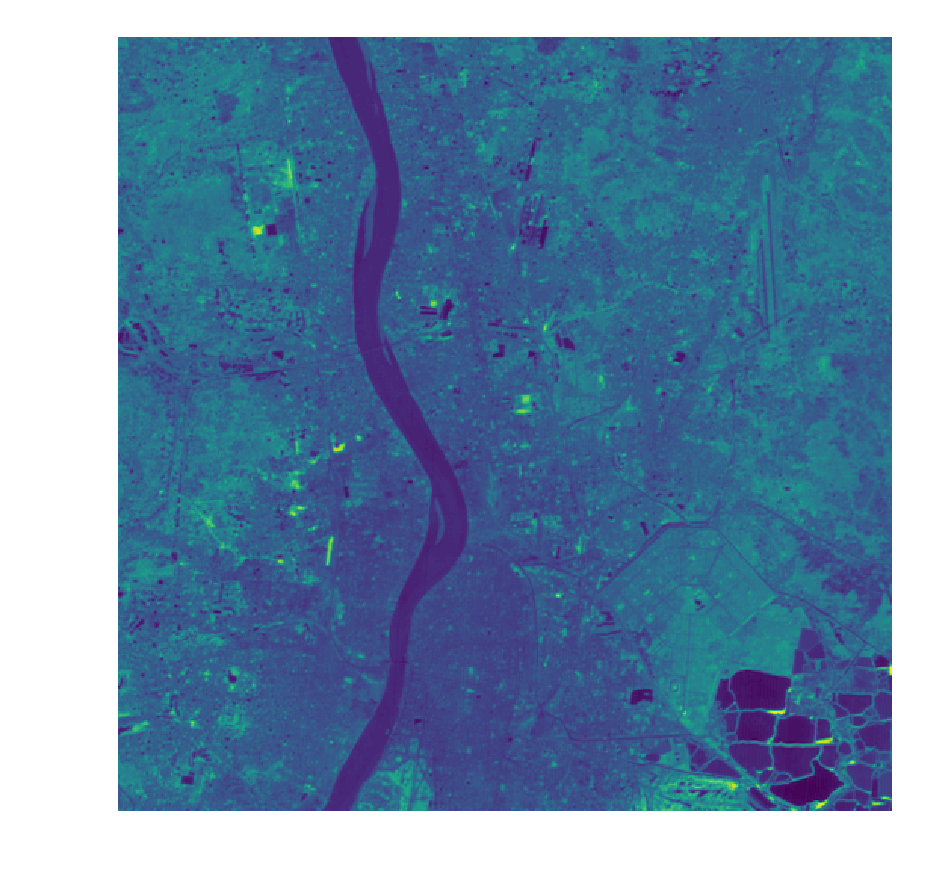

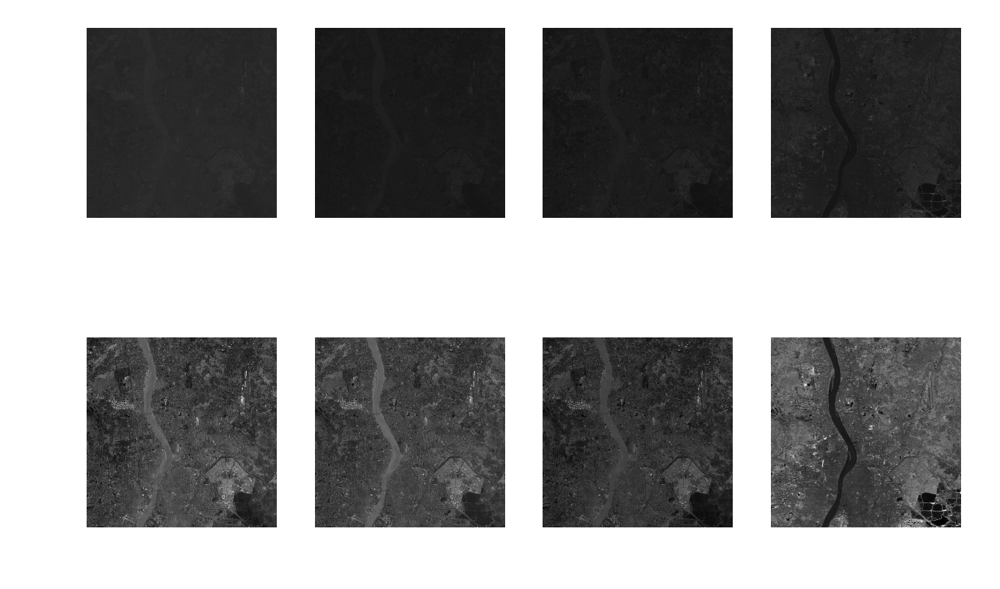

In [3]:
IMG_FOLDER='.'

band1_img=mpimg.imread(os.path.join(IMG_FOLDER,"band1.gif"))
band2_img=mpimg.imread(os.path.join(IMG_FOLDER,"band2.gif"))
band3_img=mpimg.imread(os.path.join(IMG_FOLDER,"band3.gif"))
band4_img=mpimg.imread(os.path.join(IMG_FOLDER,"band4.gif"))

band1_img_norm=band1_img/255
band2_img_norm=band2_img/255
band3_img_norm=band3_img/255
band4_img_norm=band4_img/255


band1_img_norm_avg=np.mean(band1_img_norm,axis=2)
band2_img_norm_avg=np.mean(band2_img_norm,axis=2)
band3_img_norm_avg=np.mean(band3_img_norm,axis=2)
band4_img_norm_avg=np.mean(band4_img_norm,axis=2)


plt.figure(dpi=256)
plt.axis("off")
plt.imshow(band4_img_norm_avg)
plt.show()

#band1_img_avg=np.

plt.figure(dpi=256)
plt.subplot(241), plt.axis("off"), plt.imshow(band1_img_norm,plt.cm.gray)
plt.subplot(242), plt.axis("off"), plt.imshow(band2_img_norm,plt.cm.gray)
plt.subplot(243), plt.axis("off"), plt.imshow(band3_img_norm,plt.cm.gray)
plt.subplot(244), plt.axis("off"), plt.imshow(band4_img_norm,plt.cm.gray)


plt.subplot(245), plt.axis("off"), plt.imshow(band1_img_norm_avg,plt.cm.gray)
plt.subplot(246), plt.axis("off"), plt.imshow(band2_img_norm_avg,plt.cm.gray)
plt.subplot(247), plt.axis("off"), plt.imshow(band3_img_norm_avg,plt.cm.gray)
plt.subplot(248), plt.axis("off"), plt.imshow(band4_img_norm_avg,plt.cm.gray)


plt.show()


<h2> <font color=Tomato > Reading river position coordinates from txt file </font></h2>

In [5]:
river_pos=list()
with open('river_position.txt',"r") as river_file:
    for i in river_file:
        river_pos.append(str.split(i))
        

In [6]:
river_pos_x=[int(i[0]) for i in river_pos]
river_pos_y=[int(i[1]) for i in river_pos]

<h2> <font color="SandyBrown "> Reading non-river position coordinates from txt file </font></h2>

In [8]:
non_river_pos=list()
with open('nonriver_position.txt',"r") as nonriver_file:
    for i in nonriver_file:
        non_river_pos.append(str.split(i))

In [9]:
non_river_pos_x=[int(i[0]) for i in non_river_pos]
non_river_pos_y=[int(i[1]) for i in non_river_pos]

<h2><font color=Orchid > Displaying input images</font></h2>

In [33]:
plt.figure(dpi=256)
#plt.imshow(band4_img_norm_avg)
plt.axis("off")
plt.title("Points which are taken as training data points")
plt.scatter(non_river_pos_y,non_river_pos_x,marker="p", color="red", s=2, label="non-river")
plt.scatter(river_pos_y,river_pos_x,marker="o", color="blue", s=2, label="river")
plt.legend()
plt.imshow(band4_img_norm_avg, plt.cm.gray)
plt.title("Points which are taken as training data points")
plt.show()

<h2> <font color=PeachPuff > Training Data set is created </font></h2>

In [11]:
training_dataset=list()
for i in range(len(river_pos)):
    training_dataset.append([band1_img_norm_avg[river_pos_x[i],river_pos_y[i]],\
                             band2_img_norm_avg[river_pos_x[i],river_pos_y[i]],\
                             band3_img_norm_avg[river_pos_x[i],river_pos_y[i]],\
                             band4_img_norm_avg[river_pos_x[i],river_pos_y[i]],1,1])
    
for i in range(len(non_river_pos)):
    training_dataset.append([band1_img_norm_avg[non_river_pos_x[i],non_river_pos_y[i]],\
                             band2_img_norm_avg[non_river_pos_x[i],non_river_pos_y[i]],\
                             band3_img_norm_avg[non_river_pos_x[i],non_river_pos_y[i]],\
                             band4_img_norm_avg[non_river_pos_x[i],non_river_pos_y[i]],1,0])
    
    

In [12]:
training_dataset=np.array(training_dataset,dtype=np.float64)
np.random.shuffle(training_dataset)

In [28]:
training_dataset.shape

(135, 6)

# <font color=Chocolate>Reading the training labels</font>

In [14]:
train_features=list()
train_label=list()
for i in range(len(training_dataset)):
    train_features.append(training_dataset[i][0:training_dataset.shape[1]-1])
    train_label.append(training_dataset[i][training_dataset.shape[1]-1])

train_features=np.array(train_features)

In [15]:
train_features[0:10]

array([[0.37647059, 0.33823529, 0.34411765, 0.31176471, 1.        ],
       [0.35882353, 0.31764706, 0.30882353, 0.32352941, 1.        ],
       [0.38235294, 0.34117647, 0.34411765, 0.31470588, 1.        ],
       [0.4       , 0.35294118, 0.36176471, 0.37941176, 1.        ],
       [0.37941176, 0.33529412, 0.35      , 0.38823529, 1.        ],
       [0.35588235, 0.31470588, 0.30588235, 0.30294118, 1.        ],
       [0.37941176, 0.33235294, 0.33823529, 0.33823529, 1.        ],
       [0.37647059, 0.32941176, 0.32941176, 0.35294118, 1.        ],
       [0.38235294, 0.33823529, 0.34117647, 0.31470588, 1.        ],
       [0.36764706, 0.32352941, 0.32941176, 0.35294118, 1.        ]])

<font color="BluePurple">Principle Component analysis</font>

In [16]:
#######Comment whole section if PCA is not required
#train_features_pca=np.array(train_features[:,0:train_features.shape[1]-1])
#pca = PCA(n_components=2)
#train_features_pca=pca.fit_transform(X = train_features_pca)

#bias_ones=np.ones((len(train_features_pca),1),dtype=np.float64)
#train_features=np.append(train_features_pca,bias_ones, axis=1)

In [17]:
#######Comment whole section if PCA is not required
#plt.scatter(train_features[:,0],train_features[:,1],c=train_label)
#plt.xlabel("PC1")
#plt.ylabel("PC2")
#plt.show()

In [18]:
#train_features[0:10]

# Setting the hyper parameters

In [19]:
input_no_of_nodes=len(train_features[0])
hidden_no_of_nodes=10
output_no_of_nodes=2
no_of_interation=10000
learning_rate=0.05

<font color="brown"> Setting initial matrix </font>

In [20]:
#weight_matrix_input_to_hidden=np.random.normal(0,1,(input_no_of_nodes,hidden_no_of_nodes))
weight_matrix_input_to_hidden=np.random.rand(input_no_of_nodes,hidden_no_of_nodes)
hidden_induced_value=np.zeros(hidden_no_of_nodes,dtype=np.float64)
hidden_sigmoid_value=np.zeros(hidden_no_of_nodes,dtype=np.float64)
print(weight_matrix_input_to_hidden)

[[0.51824656 0.67808824 0.49906289 0.36511526 0.73230756 0.76173492
  0.43825477 0.20982716 0.94613526 0.47028096]
 [0.1050281  0.55171844 0.95530999 0.72451845 0.37972361 0.57440831
  0.37044971 0.82118356 0.62201673 0.3056453 ]
 [0.02515697 0.90587486 0.5007049  0.20567395 0.12630457 0.59026603
  0.94604726 0.94520386 0.19663906 0.03412247]
 [0.43529561 0.71152294 0.77894724 0.56384777 0.6541493  0.31678743
  0.5167233  0.26348724 0.1255058  0.43935233]
 [0.01400575 0.26087212 0.68605648 0.52064854 0.17167016 0.34712528
  0.86956963 0.14094003 0.14300555 0.19061945]]


In [21]:
weight_matrix_hidden_to_output=np.random.normal(0,1,(hidden_no_of_nodes,output_no_of_nodes))
output_induced_value=dtype=np.zeros(output_no_of_nodes,np.float64)
output_sigmoid_value=np.zeros(output_no_of_nodes,dtype=np.float64)
print(weight_matrix_hidden_to_output)

[[ 0.65983327  0.59936185]
 [-0.03964906 -0.41744602]
 [ 0.68316392  0.72637347]
 [-0.40823741 -0.3977315 ]
 [ 1.11415921  1.30141839]
 [ 0.29287196 -1.25357721]
 [ 0.43301449 -0.3168003 ]
 [ 1.68502159 -2.46021544]
 [-0.55244453  0.66496751]
 [ 0.14733579  1.95199837]]


In [26]:
#total_error=list()
for iter in range(no_of_interation):
#    error_in_epoch=0
    for i in range(len(train_features)):
        
        error_for_an_instance=np.zeros(output_no_of_nodes,dtype=np.float64)
        
        #Sum value in hidden layer
        hidden_induced_value=np.matmul(weight_matrix_input_to_hidden.transpose(),train_features[i])
        
        #Applying the sigmoid function to induced value
        hidden_sigmoid_value=scipy.special.expit(hidden_induced_value)
        
        #Sigmoid derivative of hidden layer, will be used while back propagation
        hidden_sigmoid_derivative=hidden_sigmoid_value*(1-hidden_sigmoid_value)
        
        #Output induced value 
        output_induced_value=np.matmul(weight_matrix_hidden_to_output.transpose(),hidden_sigmoid_value)
        
        #Output Sigmoid
        output_sigmoid_value=scipy.special.expit(output_induced_value)
        
        #Output Sigmoid Derivative
        output_sigmoid_derivative=output_sigmoid_value*(1-output_sigmoid_value)
        
        # One Hot Encoding is done here
        actual_output=np.zeros(output_no_of_nodes)
        actual_output[int(train_label[i])]=1
        
        
        if i < 2 :
            print("\n\nInstance Serial:",i)
            print("Hidden Sigmoid Value in vector form:\n",hidden_sigmoid_value)
            print("Hidden Sigmoid Derivative:\n",hidden_sigmoid_derivative)
            print("Output Sigmoid Derivative:\n",output_sigmoid_derivative)
            print("**Output Predicted Value:\n",output_sigmoid_value)
            print("**Actual output:",actual_output)
            print("Class Label:",train_label[i])

            entropy_in_output=0
            for p in  output_sigmoid_value:
                entropy_in_output=entropy_in_output+(-p*math.log2(p))

            print("**Entropy Value of output sigmoid values:",entropy_in_output)
        
        #
        
        #back propagation starts here
        error_for_an_instance=actual_output - output_sigmoid_value
        #print("Error or difference:",error_for_an_instance)
        
        #
        temp_weight_matrix_hidden_to_output=weight_matrix_hidden_to_output

        delta_output=error_for_an_instance*output_sigmoid_derivative
        
        #print(delta_output)

        for j in range(output_no_of_nodes):
            for k in range(hidden_no_of_nodes):
                temp_weight_matrix_hidden_to_output[k,j]=\
                weight_matrix_hidden_to_output[k,j] + learning_rate*delta_output[j]*\
                                                    hidden_sigmoid_value[k]
        delta_hidden=np.zeros(hidden_no_of_nodes,dtype=np.float64)

        for k in range(hidden_no_of_nodes):
            for j in range(output_no_of_nodes):
                delta_hidden[k]=delta_hidden[k] + delta_output[j]*weight_matrix_hidden_to_output[k,j]*\
                                                hidden_sigmoid_derivative[k]
        
        
        for k in range(hidden_no_of_nodes):
            for l in range(input_no_of_nodes):
                weight_matrix_input_to_hidden[l,k]=weight_matrix_input_to_hidden[l,k] + learning_rate*\
                                                    delta_hidden[k]*train_features[i][l]

                #print(weight_matrix_input_to_hidden[l,k] , learning_rate, hidden_sigmoid_derivative[k],error_hidden[k],normalized_image[l], learning_rate*hidden_sigmoid_derivative[k]*\
                                                    #error_hidden[k]*normalized_image[l])

        weight_matrix_hidden_to_output=temp_weight_matrix_hidden_to_output
    #print("\n\n***********Epoch >>",iter,"is completed.\n\n\n")
    print("Epoch",iter,"\n")

    



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48684533 0.84329531 0.85837187 0.84628326 0.75443079 0.46323833
 0.89254872 0.40720885 0.56094796 0.55667042]
Hidden Sigmoid Derivative:
 [0.24982695 0.13214833 0.1215696  0.1300879  0.18526498 0.24864858
 0.0959055  0.2413898  0.24628535 0.24678846]
Output Sigmoid Derivative:
 [0.01173911 0.01162267]
**Output Predicted Value:
 [0.01188025 0.98823901]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09284500728301295


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50993948 0.8352116  0.85128022 0.84079566 0.74410527 0.50902008
 0.89093062 0.74553675 0.33878776 0.35372005]
Hidden Sigmoid Derivative:
 [0.24990121 0.13763318 0.1266022  0.13385832 0.19041262 0.24991864
 0.09717325 0.18971171 0.22401061 0.22860218]
Output Sigmoid Derivative:
 [4.02302529e-05 3.87443421e-05]
**Output Predicted Value:
 [9.99959768e-01 3.87458434e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entr

Epoch 13 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48681657 0.84329096 0.85836763 0.84628558 0.75442484 0.46324967
 0.89255428 0.40719482 0.56095403 0.55667502]
Hidden Sigmoid Derivative:
 [0.2498262  0.13215132 0.12157264 0.1300863  0.185268   0.24864941
 0.09590114 0.2413872  0.24628461 0.24678794]
Output Sigmoid Derivative:
 [0.01172171 0.01160549]
**Output Predicted Value:
 [0.01186243 0.9882566 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09273163156800936


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5099184  0.83520674 0.85127548 0.84079779 0.74409791 0.50904554
 0.89093652 0.74560634 0.33873459 0.35366973]
Hidden Sigmoid Derivative:
 [0.24990163 0.13763644 0.12660554 0.13385686 0.19041621 0.24991818
 0.09716864 0.18967753 0.22399347 0.22858745]
Output Sigmoid Derivative:
 [3.99875543e-05 3.85111551e-05]
**Output Predicted Value:
 [9.99960011e-01 3.85126383e-05]
**Actual output: [1. 0.]
Class Label:

 [0.01184464 0.98827415]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09261848987046328


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50989739 0.83520187 0.85127074 0.84079991 0.74409054 0.50907097
 0.8909424  0.7456758  0.33868151 0.35361951]
Hidden Sigmoid Derivative:
 [0.24990204 0.13763971 0.12660887 0.13385542 0.19041981 0.24991772
 0.09716404 0.1896434  0.22397635 0.22857275]
Output Sigmoid Derivative:
 [3.97466201e-05 3.82796601e-05]
**Output Predicted Value:
 [9.99960252e-01 3.82811255e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0006190426225042445
Epoch 28 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48678584 0.8432863  0.85836309 0.84628804 0.75441845 0.46326182
 0.89256022 0.40717979 0.56096055 0.55667994]
Hidden Sigmoid Derivative:
 [0.24982539 0.13215452 0.1215759  0.13008459 0.18527125 0.24865031
 0.09589647 0.24138441 0.24628381 0.24678738]
Output Si

Epoch 42 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48675724 0.84328195 0.85835885 0.84629034 0.75441248 0.46327317
 0.89256575 0.40716576 0.56096663 0.55668455]
Hidden Sigmoid Derivative:
 [0.24982463 0.1321575  0.12157894 0.130083   0.18527429 0.24865114
 0.09589213 0.2413818  0.24628307 0.24678686]
Output Sigmoid Derivative:
 [0.01168579 0.01157004]
**Output Predicted Value:
 [0.01182564 0.98829291]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09249752554843269


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50987496 0.83519666 0.85126565 0.84080217 0.74408263 0.50909821
 0.8909487  0.74575008 0.33862475 0.3535658 ]
Hidden Sigmoid Derivative:
 [0.24990249 0.1376432  0.12661244 0.13385388 0.19042367 0.24991722
 0.09715912 0.1896069  0.22395803 0.22855702]
Output Sigmoid Derivative:
 [3.94904176e-05 3.80334912e-05]
**Output Predicted Value:
 [9.99960508e-01 3.80349378e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 56 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48672873 0.84327759 0.85835461 0.84629262 0.75440649 0.46328452
 0.89257127 0.40715174 0.56097272 0.55668915]
Hidden Sigmoid Derivative:
 [0.24982387 0.13216049 0.12158198 0.13008142 0.18527734 0.24865197
 0.0958878  0.2413792  0.24628233 0.24678634]
Output Sigmoid Derivative:
 [0.01166852 0.01155298]
**Output Predicted Value:
 [0.01180795 0.98831037]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09238486646961837


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50985409 0.83519179 0.85126091 0.84080427 0.74407524 0.5091236
 0.89095455 0.74581926 0.33857187 0.35351576]
Hidden Sigmoid Derivative:
 [0.2499029  0.13764647 0.12661577 0.13385245 0.19042728 0.24991676
 0.09715454 0.18957289 0.22394096 0.22854237]
Output Sigmoid Derivative:
 [3.92530915e-05 3.78054561e-05]
**Output Predicted Value:
 [9.99960745e-01 3.78068855e-05]
**Actual output: [1. 0.]
Class Label: 

 [0.48670029 0.84327324 0.85835036 0.84629489 0.7544005  0.46329587
 0.89257678 0.40713772 0.56097881 0.55669377]
Hidden Sigmoid Derivative:
 [0.24982312 0.13216349 0.12158502 0.13007985 0.18528039 0.24865281
 0.09588348 0.2413766  0.24628158 0.24678582]
Output Sigmoid Derivative:
 [0.01165129 0.01153597]
**Output Predicted Value:
 [0.0117903  0.98832779]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09227243935581336


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50983328 0.83518691 0.85125617 0.84080635 0.74406784 0.50914898
 0.89096039 0.74588832 0.33851909 0.3534658 ]
Hidden Sigmoid Derivative:
 [0.24990331 0.13764973 0.1266191  0.13385103 0.19043089 0.2499163
 0.09714997 0.18953893 0.22392391 0.22852773]
Output Sigmoid Derivative:
 [3.90174849e-05 3.75790699e-05]
**Output Predicted Value:
 [9.99960981e-01 3.75804822e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0006087116248167776
E

Epoch 84 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48667192 0.84326888 0.85834612 0.84629715 0.7543945  0.46330722
 0.89258227 0.4071237  0.56098491 0.55669839]
Hidden Sigmoid Derivative:
 [0.24982236 0.13216648 0.12158806 0.13007828 0.18528344 0.24865364
 0.09587916 0.24137399 0.24628084 0.24678529]
Output Sigmoid Derivative:
 [0.01163409 0.01151899]
**Output Predicted Value:
 [0.01177269 0.98834517]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09216024354436504


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50981254 0.83518204 0.85125143 0.84080843 0.74406044 0.50917434
 0.89096622 0.74595725 0.33846639 0.35341594]
Hidden Sigmoid Derivative:
 [0.24990371 0.137653   0.12662244 0.13384962 0.1904345  0.24991583
 0.09714541 0.18950503 0.22390689 0.22851311]
Output Sigmoid Derivative:
 [3.87835833e-05 3.73543189e-05]
**Output Predicted Value:
 [9.99961215e-01 3.73557143e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 99 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48664162 0.8432642  0.85834158 0.84629956 0.75438805 0.46331939
 0.89258813 0.40710868 0.56099144 0.55670334]
Hidden Sigmoid Derivative:
 [0.24982155 0.13216969 0.12159132 0.13007662 0.18528672 0.24865453
 0.09587456 0.2413712  0.24628004 0.24678473]
Output Sigmoid Derivative:
 [0.01161572 0.01150085]
**Output Predicted Value:
 [0.01175387 0.98836375]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09204028967148065


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5097904  0.83517682 0.85124634 0.84081064 0.74405249 0.50920148
 0.89097245 0.74603096 0.33841004 0.35336262]
Hidden Sigmoid Derivative:
 [0.24990415 0.1376565  0.12662601 0.13384811 0.19043838 0.24991533
 0.09714054 0.18946877 0.22388869 0.22849748]
Output Sigmoid Derivative:
 [3.85348503e-05 3.71153132e-05]
**Output Predicted Value:
 [9.99961464e-01 3.71166908e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 107 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4866255  0.84326171 0.85833915 0.84630084 0.75438461 0.46332587
 0.89259125 0.40710067 0.56099493 0.55670599]
Hidden Sigmoid Derivative:
 [0.24982112 0.1321714  0.12159305 0.13007573 0.18528847 0.24865501
 0.09587211 0.24136971 0.24627962 0.24678443]
Output Sigmoid Derivative:
 [0.01160594 0.01149119]
**Output Predicted Value:
 [0.01174385 0.98837364]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0919764222541304


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50977862 0.83517403 0.85124363 0.84081181 0.74404825 0.50921595
 0.89097577 0.74607021 0.33838003 0.35333422]
Hidden Sigmoid Derivative:
 [0.24990438 0.13765837 0.12662791 0.13384731 0.19044045 0.24991507
 0.09713795 0.18944945 0.22387899 0.22848915]
Output Sigmoid Derivative:
 [3.84029803e-05 3.69885988e-05]
**Output Predicted Value:
 [9.99961596e-01 3.69899671e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 121 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48659734 0.84325735 0.85833491 0.84630307 0.75437858 0.46333723
 0.89259671 0.40708665 0.56100103 0.55671062]
Hidden Sigmoid Derivative:
 [0.24982037 0.13217439 0.12159609 0.13007419 0.18529154 0.24865584
 0.09586783 0.24136711 0.24627887 0.24678391]
Output Sigmoid Derivative:
 [0.01158885 0.01147432]
**Output Predicted Value:
 [0.01172636 0.98839091]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09186483457208021


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50975805 0.83516916 0.85123889 0.84081386 0.74404082 0.50924126
 0.89098156 0.7461388  0.33832759 0.35328459]
Hidden Sigmoid Derivative:
 [0.24990478 0.13766164 0.12663124 0.13384592 0.19044408 0.2499146
 0.09713342 0.18941569 0.22386203 0.22847459]
Output Sigmoid Derivative:
 [3.81735167e-05 3.67681039e-05]
**Output Predicted Value:
 [9.99961825e-01 3.67694559e-05]
**Actual output: [1. 0.]
Class Label:

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005951074472872654
Epoch 129 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48658128 0.84325485 0.85833248 0.84630434 0.75437513 0.46334372
 0.89259982 0.40707864 0.56100452 0.55671327]
Hidden Sigmoid Derivative:
 [0.24981994 0.13217611 0.12159783 0.13007331 0.18529329 0.24865632
 0.09586538 0.24136562 0.24627845 0.24678361]
Output Sigmoid Derivative:
 [0.01157911 0.0114647 ]
**Output Predicted Value:
 [0.01171638 0.98840076]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09180117300057314


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50974633 0.83516637 0.85123618 0.84081502 0.74403657 0.50925571
 0.89098486 0.74617793 0.33829766 0.35325627]
Hidden Sigmoid Derivative:
 [0.24990501 0.1376635  0.12663314 0.13384512 0.19044615 0.24991433
 0.09713084 0.18939643 0.22385235 0.22846628]
Output Sigmoid Derivative:
 [3.80431380e-05 3.664

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09169788205427465


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50972733 0.83516184 0.85123178 0.8408169  0.74402966 0.50927918
 0.89099021 0.74624144 0.3382491  0.35321031]
Hidden Sigmoid Derivative:
 [0.24990538 0.13766654 0.12663624 0.13384384 0.19044952 0.2499139
 0.09712665 0.18936516 0.22383664 0.22845279]
Output Sigmoid Derivative:
 [3.78324177e-05 3.64403311e-05]
**Output Predicted Value:
 [9.99962166e-01 3.64416591e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005918793848745028
Epoch 143 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48655325 0.84325048 0.85832824 0.84630655 0.75436908 0.46335508
 0.89260525 0.40706463 0.56101063 0.55671791]
Hidden Sigmoid Derivative:
 [0.24981918 0.13217911 0.12160087 0.13007177 0.18529637 0.24865715
 0.09586112 0.24136302 0.2462777  0.24678308]
Output Sigmoid Derivative:
 [0.011

Epoch 156 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48652728 0.84324643 0.8583243  0.84630859 0.75436346 0.46336563
 0.89261028 0.40705162 0.56101631 0.55672222]
Hidden Sigmoid Derivative:
 [0.24981849 0.13218189 0.1216037  0.13007036 0.18529923 0.24865792
 0.09585717 0.2413606  0.24627701 0.24678259]
Output Sigmoid Derivative:
 [0.01154631 0.01143232]
**Output Predicted Value:
 [0.0116828 0.9884339]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09158686543200792


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50970693 0.83515696 0.85122704 0.84081892 0.74402221 0.50930444
 0.89099597 0.7463097  0.33819688 0.3531609 ]
Hidden Sigmoid Derivative:
 [0.24990578 0.13766981 0.12663957 0.13384246 0.19045316 0.24991343
 0.09712215 0.18933153 0.22381975 0.22843828]
Output Sigmoid Derivative:
 [3.76070627e-05 3.62237766e-05]
**Output Predicted Value:
 [9.99962392e-01 3.62250889e-05]
**Actual output: [1. 0.]
Class Label: 

 [0.50968804 0.83515243 0.85122264 0.84082079 0.74401529 0.50932788
 0.8910013  0.74637298 0.33814848 0.3531151 ]
Hidden Sigmoid Derivative:
 [0.24990614 0.13767285 0.12664266 0.13384119 0.19045654 0.24991299
 0.09711798 0.18930036 0.22380409 0.22842483]
Output Sigmoid Derivative:
 [3.73992550e-05 3.60240814e-05]
**Output Predicted Value:
 [9.99962599e-01 3.60253792e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005857139089066085
Epoch 170 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48649939 0.84324206 0.85832005 0.84631079 0.75435739 0.46337699
 0.89261569 0.40703762 0.56102243 0.55672687]
Hidden Sigmoid Derivative:
 [0.24981773 0.13218489 0.12160674 0.13006884 0.18530232 0.24865875
 0.09585292 0.241358   0.24627626 0.24678206]
Output Sigmoid Derivative:
 [0.01152937 0.01141559]
**Output Predicted Value:
 [0.01166545 0.98845103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.091476

Epoch 179 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4864815  0.84323924 0.85831732 0.84631219 0.75435349 0.46338429
 0.89261915 0.40702861 0.56102636 0.55672986]
Hidden Sigmoid Derivative:
 [0.24981725 0.13218682 0.1216087  0.13006787 0.1853043  0.24865929
 0.0958502  0.24135632 0.24627578 0.24678172]
Output Sigmoid Derivative:
 [0.01151849 0.01140486]
**Output Predicted Value:
 [0.01165432 0.98846202]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09140497411109567


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50967355 0.83514894 0.85121925 0.84082222 0.74400996 0.50934589
 0.89100539 0.74642157 0.33811131 0.35307992]
Hidden Sigmoid Derivative:
 [0.24990642 0.13767519 0.12664504 0.13384022 0.19045914 0.24991265
 0.09711478 0.18927641 0.22379205 0.22841449]
Output Sigmoid Derivative:
 [3.72403465e-05 3.58713746e-05]
**Output Predicted Value:
 [9.99962758e-01 3.58726615e-05]
**Actual output: [1. 0.]
Class Label

Epoch 193 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48645374 0.84323487 0.85831308 0.84631436 0.7543474  0.46339565
 0.89262454 0.40701461 0.56103248 0.55673452]
Hidden Sigmoid Derivative:
 [0.2498165  0.13218982 0.12161174 0.13006636 0.1853074  0.24866012
 0.09584597 0.24135372 0.24627504 0.24678119]
Output Sigmoid Derivative:
 [0.01150161 0.01138819]
**Output Predicted Value:
 [0.01163704 0.98847908]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09129455678948953


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50965332 0.83514406 0.85121451 0.84082421 0.74400249 0.5093711
 0.89101111 0.7464895  0.33805934 0.35303074]
Hidden Sigmoid Derivative:
 [0.24990681 0.13767846 0.12664837 0.13383886 0.19046279 0.24991218
 0.09711031 0.18924293 0.22377522 0.22840004]
Output Sigmoid Derivative:
 [3.70192427e-05 3.56588974e-05]
**Output Predicted Value:
 [9.99962979e-01 3.56601691e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 201 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48643791 0.84323237 0.85831065 0.8463156  0.75434392 0.46340215
 0.89262761 0.40700661 0.56103598 0.55673719]
Hidden Sigmoid Derivative:
 [0.24981607 0.13219154 0.12161348 0.1300655  0.18530917 0.2486606
 0.09584356 0.24135223 0.24627461 0.24678089]
Output Sigmoid Derivative:
 [0.01149199 0.01137868]
**Output Predicted Value:
 [0.01162718 0.98848881]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09123156250568862


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50964178 0.83514127 0.8512118  0.84082534 0.74399822 0.50938549
 0.89101437 0.74652826 0.33802968 0.35300267]
Hidden Sigmoid Derivative:
 [0.24990704 0.13768033 0.12665027 0.13383809 0.19046487 0.24991191
 0.09710776 0.18922382 0.22376562 0.22839179]
Output Sigmoid Derivative:
 [3.68936099e-05 3.55381649e-05]
**Output Predicted Value:
 [9.99963105e-01 3.55394280e-05]
**Actual output: [1. 0.]
Class Label:

Hidden Sigmoid Value in vector form:
 [0.50962165 0.83513638 0.85120706 0.84082731 0.74399073 0.50941067
 0.89102006 0.74659599 0.33797786 0.35295363]
Hidden Sigmoid Derivative:
 [0.24990742 0.13768361 0.1266536  0.13383674 0.19046852 0.24991144
 0.09710331 0.18919042 0.22374883 0.22837736]
Output Sigmoid Derivative:
 [3.66749899e-05 3.53280699e-05]
**Output Predicted Value:
 [9.99963324e-01 3.53293181e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005753891175179655
Epoch 216 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48640829 0.84322768 0.8583061  0.84631791 0.75433739 0.46341432
 0.89263335 0.40699161 0.56104255 0.55674219]
Hidden Sigmoid Derivative:
 [0.24981527 0.13219476 0.12161674 0.1300639  0.18531249 0.24866149
 0.09583905 0.24134944 0.24627381 0.24678032]
Output Sigmoid Derivative:
 [0.01147397 0.01136089]
**Output Predicted Value:
 [0.01160873 0.98850702]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Val

Epoch 230 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48638072 0.8432233  0.85830186 0.84632006 0.75433128 0.46342568
 0.8926387  0.40697761 0.56104868 0.55674686]
Hidden Sigmoid Derivative:
 [0.24981452 0.13219776 0.12161978 0.13006242 0.1853156  0.24866232
 0.09583485 0.24134683 0.24627306 0.24677979]
Output Sigmoid Derivative:
 [0.01145719 0.01134433]
**Output Predicted Value:
 [0.01159156 0.98852397]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09100382386936674


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50960015 0.83513115 0.85120198 0.84082942 0.74398271 0.50943762
 0.89102615 0.74666842 0.33792244 0.35290118]
Hidden Sigmoid Derivative:
 [0.24990784 0.13768711 0.12665717 0.13383531 0.19047244 0.24991093
 0.09709855 0.18915469 0.22373086 0.22836194]
Output Sigmoid Derivative:
 [3.64424892e-05 3.51046322e-05]
**Output Predicted Value:
 [9.99963556e-01 3.51058647e-05]
**Actual output: [1. 0.]
Class Label

Epoch 238 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.486365   0.8432208  0.85829943 0.84632128 0.75432779 0.46343218
 0.89264175 0.40696961 0.56105218 0.55674953]
Hidden Sigmoid Derivative:
 [0.24981409 0.13219948 0.12162152 0.13006157 0.18531738 0.24866279
 0.09583246 0.24134535 0.24627263 0.24677949]
Output Sigmoid Derivative:
 [0.01144763 0.01133488]
**Output Predicted Value:
 [0.01158176 0.98853364]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09094116873740707


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50958872 0.83512835 0.85119928 0.84083054 0.74397843 0.50945198
 0.89102939 0.74670699 0.33789292 0.35287324]
Hidden Sigmoid Derivative:
 [0.24990806 0.13768899 0.12665907 0.13383455 0.19047453 0.24991066
 0.09709602 0.18913566 0.22372129 0.22835372]
Output Sigmoid Derivative:
 [3.63192173e-05 3.49861642e-05]
**Output Predicted Value:
 [9.99963679e-01 3.49873884e-05]
**Actual output: [1. 0.]
Class Label

Epoch 252 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48633756 0.84321642 0.85829519 0.84632341 0.75432167 0.46344354
 0.89264707 0.40695562 0.56105832 0.55675421]
Hidden Sigmoid Derivative:
 [0.24981334 0.13220249 0.12162456 0.13006009 0.18532049 0.24866363
 0.09582828 0.24134274 0.24627188 0.24677896]
Output Sigmoid Derivative:
 [0.01143091 0.01131838]
**Output Predicted Value:
 [0.01156465 0.98855053]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0908316978378639


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50956875 0.83512347 0.85119454 0.84083248 0.74397092 0.5094771
 0.89103505 0.74677439 0.33784134 0.35282442]
Hidden Sigmoid Derivative:
 [0.24990844 0.13769226 0.1266624  0.13383322 0.19047819 0.24991018
 0.09709159 0.1891024  0.22370457 0.22833935]
Output Sigmoid Derivative:
 [3.61047022e-05 3.47800064e-05]
**Output Predicted Value:
 [9.99963894e-01 3.47812161e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 260 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4863219  0.84321392 0.85829276 0.84632462 0.75431816 0.46345004
 0.89265011 0.40694762 0.56106182 0.55675688]
Hidden Sigmoid Derivative:
 [0.24981291 0.13220421 0.1216263  0.13005926 0.18532227 0.2486641
 0.09582589 0.24134125 0.24627145 0.24677866]
Output Sigmoid Derivative:
 [0.01142138 0.01130897]
**Output Predicted Value:
 [0.01155489 0.98856016]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09076924316871252


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50955737 0.83512067 0.85119183 0.84083359 0.74396663 0.50949145
 0.89103827 0.74681284 0.3378119  0.35279657]
Hidden Sigmoid Derivative:
 [0.24990866 0.13769413 0.1266643  0.13383246 0.19048028 0.24990991
 0.09708907 0.18908342 0.22369502 0.22833115]
Output Sigmoid Derivative:
 [3.59828098e-05 3.46628615e-05]
**Output Predicted Value:
 [9.99964016e-01 3.46640631e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 268 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48630628 0.84321141 0.85829033 0.84632583 0.75431466 0.46345653
 0.89265314 0.40693963 0.56106533 0.55675956]
Hidden Sigmoid Derivative:
 [0.24981248 0.13220593 0.12162804 0.13005842 0.18532406 0.24866457
 0.09582351 0.24133977 0.24627103 0.24677835]
Output Sigmoid Derivative:
 [0.01141186 0.01129957]
**Output Predicted Value:
 [0.01154515 0.98856978]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09070686117555424


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50954602 0.83511788 0.85118912 0.8408347  0.74396234 0.50950579
 0.89104149 0.74685126 0.33778249 0.35276874]
Hidden Sigmoid Derivative:
 [0.24990887 0.13769601 0.1266662  0.13383171 0.19048238 0.24990964
 0.09708655 0.18906446 0.22368548 0.22832296]
Output Sigmoid Derivative:
 [3.58614146e-05 3.45461935e-05]
**Output Predicted Value:
 [9.99964137e-01 3.45473871e-05]
**Actual output: [1. 0.]
Class Label

Epoch 282 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48627899 0.84320703 0.85828609 0.84632794 0.75430851 0.46346789
 0.89265844 0.40692564 0.56107147 0.55676425]
Hidden Sigmoid Derivative:
 [0.24981173 0.13220894 0.12163108 0.13005696 0.18532718 0.24866541
 0.09581935 0.24133716 0.24627028 0.24677782]
Output Sigmoid Derivative:
 [0.01139523 0.01128315]
**Output Predicted Value:
 [0.01152813 0.98858659]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09059786721336194


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50952619 0.83511299 0.85118438 0.84083662 0.74395482 0.50953086
 0.89104712 0.74691839 0.33773111 0.3527201 ]
Hidden Sigmoid Derivative:
 [0.24990925 0.13769928 0.12666953 0.1338304  0.19048605 0.24990916
 0.09708215 0.18903131 0.22366881 0.22830863]
Output Sigmoid Derivative:
 [3.56501622e-05 3.43431653e-05]
**Output Predicted Value:
 [9.99964349e-01 3.43443449e-05]
**Actual output: [1. 0.]
Class Label

 [0.01137864 0.01126676]
**Output Predicted Value:
 [0.01151114 0.98860335]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09048909484083484


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50950642 0.8351081  0.85117965 0.84083854 0.74394729 0.50955592
 0.89105274 0.74698539 0.33767981 0.35267156]
Hidden Sigmoid Derivative:
 [0.24990963 0.13770256 0.12667285 0.13382909 0.19048972 0.24990868
 0.09707776 0.18899822 0.22365216 0.22829433]
Output Sigmoid Derivative:
 [3.54404129e-05 3.41415788e-05]
**Output Predicted Value:
 [9.99964558e-01 3.41427445e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005577427552243494
Epoch 297 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48624983 0.84320233 0.85828154 0.84633019 0.75430192 0.46348007
 0.8926641  0.40691066 0.56107806 0.55676927]
Hidden Sigmoid Derivative:
 [0.24981093 0.13221216 0.12163434 0.1300554  0.18533053 0.24866629
 0.

Epoch 310 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48622463 0.84319826 0.8582776  0.84633212 0.7542962  0.46349062
 0.89266899 0.40689767 0.56108377 0.55677364]
Hidden Sigmoid Derivative:
 [0.24981024 0.13221496 0.12163716 0.13005406 0.18533344 0.24866707
 0.09581106 0.24133196 0.24626877 0.24677675]
Output Sigmoid Derivative:
 [0.01136208 0.01125042]
**Output Predicted Value:
 [0.0114942  0.98862008]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09038054343704184


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50948672 0.83510321 0.85117491 0.84084044 0.74393976 0.50958096
 0.89105834 0.74705227 0.3376286  0.35262309]
Hidden Sigmoid Derivative:
 [0.24991    0.13770584 0.12667618 0.13382779 0.19049339 0.24990821
 0.09707338 0.18896518 0.22363553 0.22828005]
Output Sigmoid Derivative:
 [3.52321542e-05 3.39414221e-05]
**Output Predicted Value:
 [9.99964767e-01 3.39425742e-05]
**Actual output: [1. 0.]
Class Label

Epoch 324 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48619757 0.84319387 0.85827335 0.8463342  0.75429003 0.46350199
 0.89267425 0.40688369 0.56108992 0.55677834]
Hidden Sigmoid Derivative:
 [0.24980949 0.13221797 0.12164021 0.13005262 0.18533658 0.24866789
 0.09580693 0.24132935 0.24626802 0.24677622]
Output Sigmoid Derivative:
 [0.01134557 0.01123411]
**Output Predicted Value:
 [0.0114773  0.98863676]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09027221238348448


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50946707 0.83509831 0.85117018 0.84084234 0.74393222 0.50960597
 0.89106392 0.74711903 0.33757748 0.35257471]
Hidden Sigmoid Derivative:
 [0.24991037 0.13770912 0.12667951 0.1338265  0.19049707 0.24990773
 0.09706901 0.18893219 0.22361892 0.22826578]
Output Sigmoid Derivative:
 [3.50253738e-05 3.37426835e-05]
**Output Predicted Value:
 [9.99964973e-01 3.37438221e-05]
**Actual output: [1. 0.]
Class Label

Epoch 332 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48618213 0.84319136 0.85827092 0.84633538 0.7542865  0.46350848
 0.89267725 0.40687571 0.56109343 0.55678103]
Hidden Sigmoid Derivative:
 [0.24980907 0.13221969 0.12164194 0.1300518  0.18533837 0.24866837
 0.09580458 0.24132787 0.24626759 0.24677592]
Output Sigmoid Derivative:
 [0.01133615 0.01122481]
**Output Predicted Value:
 [0.01146766 0.98864628]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0902104076199016


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50945588 0.83509552 0.85116747 0.84084342 0.74392791 0.50962026
 0.89106711 0.74715712 0.33754831 0.3525471 ]
Hidden Sigmoid Derivative:
 [0.24991059 0.13771099 0.12668141 0.13382577 0.19049917 0.24990745
 0.09706652 0.18891336 0.22360945 0.22825764]
Output Sigmoid Derivative:
 [3.49078727e-05 3.36297508e-05]
**Output Predicted Value:
 [9.99965091e-01 3.36308818e-05]
**Actual output: [1. 0.]
Class Label:

 [0.01145082 0.9886629 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.09010242158726131


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50943633 0.83509063 0.85116274 0.84084529 0.74392036 0.50964524
 0.89107267 0.74722368 0.33749733 0.35249886]
Hidden Sigmoid Derivative:
 [0.24991096 0.13771427 0.12668473 0.13382449 0.19050286 0.24990697
 0.09706217 0.18888045 0.22359288 0.22824341]
Output Sigmoid Derivative:
 [3.47033910e-05 3.34332172e-05]
**Output Predicted Value:
 [9.99965295e-01 3.34343350e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005471793384074374
Epoch 347 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48615326 0.84318666 0.85826638 0.84633759 0.75427988 0.46352065
 0.89268286 0.40686073 0.56110003 0.55678607]
Hidden Sigmoid Derivative:
 [0.24980827 0.13222292 0.1216452  0.13005028 0.18534174 0.24866926
 0.09580017 0.24132508 0.24626679 0.24677534]
Output S

Epoch 360 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4861283  0.84318258 0.85826243 0.84633949 0.75427413 0.46353121
 0.89268771 0.40684776 0.56110575 0.55679045]
Hidden Sigmoid Derivative:
 [0.24980758 0.13222572 0.12164803 0.13004896 0.18534467 0.24867003
 0.09579636 0.24132266 0.24626609 0.24677485]
Output Sigmoid Derivative:
 [0.01130328 0.01119236]
**Output Predicted Value:
 [0.01143402 0.98867949]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08999465432559486


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50941685 0.83508573 0.851158   0.84084716 0.7439128  0.50967021
 0.89107822 0.74729012 0.33744644 0.35245069]
Hidden Sigmoid Derivative:
 [0.24991132 0.13771755 0.12668806 0.13382321 0.19050655 0.24990649
 0.09705782 0.18884759 0.22357634 0.2282292 ]
Output Sigmoid Derivative:
 [3.45003567e-05 3.32380720e-05]
**Output Predicted Value:
 [9.99965498e-01 3.32391768e-05]
**Actual output: [1. 0.]
Class Label

Epoch 374 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4861015  0.84317818 0.85825819 0.84634153 0.75426792 0.46354257
 0.89269292 0.40683379 0.56111191 0.55679516]
Hidden Sigmoid Derivative:
 [0.24980683 0.13222873 0.12165107 0.13004754 0.18534782 0.24867086
 0.09579227 0.24132006 0.24626533 0.24677431]
Output Sigmoid Derivative:
 [0.0112869  0.01117619]
**Output Predicted Value:
 [0.01141726 0.98869603]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0898871052250185


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50939743 0.83508084 0.85115327 0.84084902 0.74390524 0.50969515
 0.89108376 0.74735644 0.33739564 0.35240262]
Hidden Sigmoid Derivative:
 [0.24991169 0.13772083 0.12669138 0.13382194 0.19051024 0.249906
 0.09705349 0.18881479 0.22355982 0.22821501]
Output Sigmoid Derivative:
 [3.42987580e-05 3.30443039e-05]
**Output Predicted Value:
 [9.99965700e-01 3.30453959e-05]
**Actual output: [1. 0.]
Class Label: 0

Epoch 389 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48607286 0.84317348 0.85825364 0.84634371 0.75426127 0.46355474
 0.89269848 0.40681883 0.56111851 0.55680022]
Hidden Sigmoid Derivative:
 [0.24980603 0.13223196 0.12165433 0.13004604 0.18535121 0.24867174
 0.0957879  0.24131727 0.24626453 0.24677373]
Output Sigmoid Derivative:
 [0.0112694 0.0111589]
**Output Predicted Value:
 [0.01139934 0.98871372]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08977211544770629


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50937669 0.83507559 0.8511482  0.840851   0.74389712 0.50972185
 0.89108967 0.74742736 0.33734131 0.3523512 ]
Hidden Sigmoid Derivative:
 [0.24991208 0.13772435 0.12669494 0.13382059 0.19051419 0.24990549
 0.09704887 0.1887797  0.22354215 0.22819983]
Output Sigmoid Derivative:
 [3.40843390e-05 3.28382105e-05]
**Output Predicted Value:
 [9.99965914e-01 3.28392890e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 397 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48605761 0.84317097 0.85825121 0.84634486 0.75425772 0.46356123
 0.89270145 0.40681085 0.56112203 0.55680292]
Hidden Sigmoid Derivative:
 [0.24980561 0.13223369 0.12165607 0.13004524 0.18535301 0.24867222
 0.09578557 0.24131578 0.2462641  0.24677343]
Output Sigmoid Derivative:
 [0.01126008 0.0111497 ]
**Output Predicted Value:
 [0.01138981 0.98872313]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08971088942638512


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50936566 0.83507279 0.8511455  0.84085206 0.74389279 0.50973608
 0.89109282 0.74746513 0.33731238 0.35232381]
Hidden Sigmoid Derivative:
 [0.24991228 0.13772622 0.12669684 0.13381988 0.19051631 0.24990521
 0.0970464  0.18876101 0.22353274 0.22819174]
Output Sigmoid Derivative:
 [3.39706455e-05 3.27289305e-05]
**Output Predicted Value:
 [9.99966028e-01 3.27300017e-05]
**Actual output: [1. 0.]
Class Label

Epoch 411 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.486031   0.84316657 0.85824697 0.84634687 0.75425149 0.46357259
 0.89270662 0.40679689 0.5611282  0.55680765]
Hidden Sigmoid Derivative:
 [0.24980487 0.13223671 0.12165911 0.13004384 0.18535618 0.24867304
 0.09578151 0.24131318 0.24626334 0.24677289]
Output Sigmoid Derivative:
 [0.0112438  0.01113363]
**Output Predicted Value:
 [0.01137315 0.98873958]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08960391397622447


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5093464  0.8350679  0.85114077 0.84085389 0.74388521 0.50976097
 0.89109832 0.74753112 0.33726181 0.35227595]
Hidden Sigmoid Derivative:
 [0.24991264 0.13772951 0.12670016 0.13381863 0.19052    0.24990472
 0.0970421  0.18872834 0.22351628 0.22817761]
Output Sigmoid Derivative:
 [3.37727845e-05 3.25387479e-05]
**Output Predicted Value:
 [9.99966226e-01 3.25398068e-05]
**Actual output: [1. 0.]
Class Label

Epoch 425 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48600446 0.84316217 0.85824272 0.84634888 0.75424526 0.46358395
 0.89271178 0.40678294 0.56113437 0.55681238]
Hidden Sigmoid Derivative:
 [0.24980412 0.13223972 0.12166215 0.13004246 0.18535935 0.24867387
 0.09577745 0.24131058 0.24626259 0.24677235]
Output Sigmoid Derivative:
 [0.01122756 0.01111759]
**Output Predicted Value:
 [0.01135654 0.98875598]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08949715448541015


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5093272  0.835063   0.85113604 0.84085571 0.74387762 0.50978583
 0.89110381 0.747597   0.33721133 0.35222818]
Hidden Sigmoid Derivative:
 [0.249913   0.13773279 0.12670348 0.13381738 0.19052371 0.24990424
 0.09703781 0.18869573 0.22349985 0.22816349]
Output Sigmoid Derivative:
 [3.35763167e-05 3.23499020e-05]
**Output Predicted Value:
 [9.99966423e-01 3.23509486e-05]
**Actual output: [1. 0.]
Class Label

Epoch 440 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4859761  0.84315746 0.85823818 0.84635101 0.75423858 0.46359612
 0.8927173  0.40676799 0.56114098 0.55681746]
Hidden Sigmoid Derivative:
 [0.24980333 0.13224296 0.12166541 0.13004098 0.18536275 0.24867476
 0.09577312 0.24130779 0.24626178 0.24677178]
Output Sigmoid Derivative:
 [0.01121021 0.01110045]
**Output Predicted Value:
 [0.01133877 0.98877351]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08938300828500169


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50930669 0.83505775 0.85113097 0.84085766 0.74386948 0.50981245
 0.89110967 0.74766745 0.33715734 0.35217708]
Hidden Sigmoid Derivative:
 [0.24991339 0.1377363  0.12670704 0.13381606 0.19052768 0.24990372
 0.09703322 0.18866084 0.22348227 0.22814838]
Output Sigmoid Derivative:
 [3.33673487e-05 3.21490380e-05]
**Output Predicted Value:
 [9.99966632e-01 3.21500716e-05]
**Actual output: [1. 0.]
Class Label

Epoch 454 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4859497  0.84315306 0.85823393 0.846353   0.75423233 0.46360748
 0.89272243 0.40675404 0.56114716 0.5568222 ]
Hidden Sigmoid Derivative:
 [0.24980259 0.13224598 0.12166845 0.1300396  0.18536592 0.24867558
 0.09576909 0.24130519 0.24626103 0.24677124]
Output Sigmoid Derivative:
 [0.01119405 0.01108449]
**Output Predicted Value:
 [0.01132224 0.98878984]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08927669423578287


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50928762 0.83505285 0.85112624 0.84085946 0.74386188 0.50983727
 0.89111513 0.74773307 0.33710705 0.35212948]
Hidden Sigmoid Derivative:
 [0.24991374 0.13773959 0.12671036 0.13381483 0.19053138 0.24990323
 0.09702895 0.18862833 0.22346589 0.22813431]
Output Sigmoid Derivative:
 [3.31737310e-05 3.19629263e-05]
**Output Predicted Value:
 [9.99966825e-01 3.19639480e-05]
**Actual output: [1. 0.]
Class Label

Epoch 469 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4859215  0.84314835 0.85822939 0.84635511 0.75422562 0.46361964
 0.89272792 0.4067391  0.56115378 0.55682728]
Hidden Sigmoid Derivative:
 [0.2498018  0.13224921 0.12167171 0.13003814 0.18536933 0.24867647
 0.09576478 0.2413024  0.24626022 0.24677066]
Output Sigmoid Derivative:
 [0.01117677 0.01106743]
**Output Predicted Value:
 [0.01130456 0.98880729]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08916302392564351


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50926725 0.8350476  0.85112118 0.84086138 0.74385373 0.50986385
 0.89112097 0.74780325 0.33705325 0.35207856]
Hidden Sigmoid Derivative:
 [0.24991412 0.1377431  0.12671392 0.13381352 0.19053536 0.2499027
 0.09702439 0.18859355 0.22344836 0.22811925]
Output Sigmoid Derivative:
 [3.29677910e-05 3.17649672e-05]
**Output Predicted Value:
 [9.99967031e-01 3.17659762e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 483 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48589525 0.84314394 0.85822514 0.84635707 0.75421935 0.463631
 0.89273303 0.40672516 0.56115996 0.55683203]
Hidden Sigmoid Derivative:
 [0.24980106 0.13225223 0.12167475 0.13003678 0.18537252 0.2486773
 0.09576077 0.2412998  0.24625946 0.24677012]
Output Sigmoid Derivative:
 [0.01116069 0.01105155]
**Output Predicted Value:
 [0.01128811 0.98882353]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08905715276835399


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5092483  0.8350427  0.85111645 0.84086317 0.74384611 0.50988863
 0.8911264  0.74786863 0.33700314 0.35203113]
Hidden Sigmoid Derivative:
 [0.24991447 0.13774639 0.12671724 0.1338123  0.19053907 0.24990222
 0.09702014 0.18856114 0.22343202 0.22810521]
Output Sigmoid Derivative:
 [3.27769756e-05 3.15815439e-05]
**Output Predicted Value:
 [9.99967222e-01 3.15825414e-05]
**Actual output: [1. 0.]
Class Label: 0

Epoch 497 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48586907 0.84313954 0.8582209  0.84635902 0.75421308 0.46364235
 0.89273812 0.40671122 0.56116614 0.55683678]
Hidden Sigmoid Derivative:
 [0.24980032 0.13225526 0.12167779 0.13003543 0.18537571 0.24867812
 0.09575677 0.2412972  0.2462587  0.24676958]
Output Sigmoid Derivative:
 [0.01114464 0.01103571]
**Output Predicted Value:
 [0.01127169 0.98883974]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0889514945144038


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50922941 0.8350378  0.85111172 0.84086494 0.74383849 0.50991338
 0.89113181 0.74793389 0.33695311 0.35198378]
Hidden Sigmoid Derivative:
 [0.24991482 0.13774967 0.12672056 0.13381109 0.19054279 0.24990172
 0.0970159  0.18852879 0.22341571 0.2280912 ]
Output Sigmoid Derivative:
 [3.25874962e-05 3.13994025e-05]
**Output Predicted Value:
 [9.99967411e-01 3.14003884e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 510 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48584483 0.84313545 0.85821696 0.84636083 0.75420725 0.46365289
 0.89274284 0.40669828 0.56117188 0.5568412 ]
Hidden Sigmoid Derivative:
 [0.24979963 0.13225806 0.12168061 0.13003418 0.18537868 0.24867889
 0.09575306 0.24129479 0.246258   0.24676908]
Output Sigmoid Derivative:
 [0.01112977 0.01102102]
**Output Predicted Value:
 [0.01125648 0.98885476]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08885357340064234


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50921192 0.83503325 0.85110734 0.84086658 0.7438314  0.50993635
 0.89113683 0.74799438 0.33690673 0.35193988]
Hidden Sigmoid Derivative:
 [0.24991514 0.13775272 0.12672364 0.13380997 0.19054625 0.24990127
 0.09701198 0.18849879 0.22340058 0.2280782 ]
Output Sigmoid Derivative:
 [3.24127378e-05 3.12314097e-05]
**Output Predicted Value:
 [9.99967586e-01 3.12323852e-05]
**Actual output: [1. 0.]
Class Label

Epoch 524 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48581879 0.84313105 0.85821272 0.84636276 0.75420096 0.46366424
 0.89274791 0.40668435 0.56117807 0.55684596]
Hidden Sigmoid Derivative:
 [0.24979889 0.13226108 0.12168365 0.13003284 0.18538187 0.24867971
 0.09574908 0.24129219 0.24625724 0.24676854]
Output Sigmoid Derivative:
 [0.0111138  0.01100525]
**Output Predicted Value:
 [0.01124014 0.98887089]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08874832408956457


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50919315 0.83502835 0.85110261 0.84086834 0.74382377 0.50996107
 0.89114222 0.7480594  0.33685686 0.35189268]
Hidden Sigmoid Derivative:
 [0.24991549 0.137756   0.12672696 0.13380878 0.19054997 0.24990078
 0.09700776 0.18846653 0.22338432 0.22806422]
Output Sigmoid Derivative:
 [3.22258045e-05 3.10517110e-05]
**Output Predicted Value:
 [9.99967773e-01 3.10526752e-05]
**Actual output: [1. 0.]
Class Label

Epoch 532 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48580394 0.84312853 0.85821029 0.84636386 0.75419736 0.46367072
 0.89275081 0.40667639 0.5611816  0.55684868]
Hidden Sigmoid Derivative:
 [0.24979847 0.13226281 0.12168539 0.13003207 0.1853837  0.24868018
 0.0957468  0.2412907  0.24625681 0.24676823]
Output Sigmoid Derivative:
 [0.01110468 0.01099625]
**Output Predicted Value:
 [0.01123081 0.9888801 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08868827648331877


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50918244 0.83502555 0.85109991 0.84086934 0.74381941 0.50997518
 0.8911453  0.74809651 0.33682841 0.35186575]
Hidden Sigmoid Derivative:
 [0.24991568 0.13775788 0.12672885 0.1338081  0.1905521  0.2499005
 0.09700536 0.18844812 0.22337503 0.22805624]
Output Sigmoid Derivative:
 [3.21195718e-05 3.09495886e-05]
**Output Predicted Value:
 [9.99967879e-01 3.09505465e-05]
**Actual output: [1. 0.]
Class Label:

Hidden Sigmoid Value in vector form:
 [0.485778   0.84312413 0.85820605 0.84636578 0.75419106 0.46368207
 0.89275586 0.40666246 0.56118779 0.55685345]
Hidden Sigmoid Derivative:
 [0.24979773 0.13226583 0.12168842 0.13003074 0.18538691 0.24868101
 0.09574284 0.2412881  0.24625605 0.24676769]
Output Sigmoid Derivative:
 [0.01108877 0.01098053]
**Output Predicted Value:
 [0.01121453 0.98889617]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0885833587810994


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50916376 0.83502065 0.85109519 0.84087108 0.74381176 0.50999987
 0.89115067 0.74816135 0.33677868 0.35181868]
Hidden Sigmoid Derivative:
 [0.24991603 0.13776116 0.12673217 0.13380691 0.19055582 0.2499
 0.09700116 0.18841594 0.2233588  0.2280423 ]
Output Sigmoid Derivative:
 [3.19346838e-05 3.07718522e-05]
**Output Predicted Value:
 [9.99968064e-01 3.07727992e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoi

Epoch 560 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48575214 0.84311972 0.85820181 0.84636769 0.75418475 0.46369341
 0.89276089 0.40664854 0.56119398 0.55685822]
Hidden Sigmoid Derivative:
 [0.249797   0.13226886 0.12169146 0.13002942 0.18539011 0.24868183
 0.09573888 0.24128551 0.2462553  0.24676714]
Output Sigmoid Derivative:
 [0.01107288 0.01096485]
**Output Predicted Value:
 [0.01119829 0.98891221]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08847865135711971


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50914513 0.83501575 0.85109047 0.84087281 0.74380411 0.51002453
 0.89115602 0.74822608 0.33672904 0.3517717 ]
Hidden Sigmoid Derivative:
 [0.24991637 0.13776445 0.12673548 0.13380573 0.19055955 0.24989951
 0.09699697 0.18838381 0.22334259 0.22802837]
Output Sigmoid Derivative:
 [3.17510838e-05 3.05953516e-05]
**Output Predicted Value:
 [9.99968248e-01 3.05962877e-05]
**Actual output: [1. 0.]
Class Label

 [3.16597635e-05 3.05075616e-05]
**Output Predicted Value:
 [9.99968339e-01 3.05084924e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0005033165990112497
Epoch 568 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48573739 0.8431172  0.85819939 0.84636878 0.75418114 0.46369989
 0.89276377 0.40664059 0.56119752 0.55686094]
Hidden Sigmoid Derivative:
 [0.24979658 0.13227059 0.1216932  0.13002867 0.18539195 0.2486823
 0.09573662 0.24128402 0.24625486 0.24676683]
Output Sigmoid Derivative:
 [0.01106383 0.0109559 ]
**Output Predicted Value:
 [0.01118902 0.98892136]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08841891273179618


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50913452 0.83501295 0.85108777 0.84087379 0.74379974 0.51003861
 0.89115908 0.74826301 0.33670071 0.35174488]
Hidden Sigmoid Derivative:
 [0.24991656 0.13776632 0.12673737 0.13380506 0.19056169 0.24989923
 0.0

Epoch 582 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48571164 0.84311279 0.85819515 0.84637067 0.75417482 0.46371123
 0.89276878 0.40662668 0.56120372 0.55686572]
Hidden Sigmoid Derivative:
 [0.24979584 0.13227361 0.12169624 0.13002736 0.18539516 0.24868313
 0.09573268 0.24128142 0.2462541  0.24676629]
Output Sigmoid Derivative:
 [0.011048   0.01094028]
**Output Predicted Value:
 [0.01117283 0.98893734]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08831453457950512


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50911598 0.83500805 0.85108305 0.84087551 0.74379208 0.51006324
 0.89116441 0.74832755 0.3366512  0.35169802]
Hidden Sigmoid Derivative:
 [0.2499169  0.13776961 0.12674069 0.13380389 0.19056542 0.24989873
 0.0969904  0.18833343 0.22331717 0.22800652]
Output Sigmoid Derivative:
 [3.14651469e-05 3.03204665e-05]
**Output Predicted Value:
 [9.99968534e-01 3.03213859e-05]
**Actual output: [1. 0.]
Class Label

Epoch 596 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48568596 0.84310839 0.85819091 0.84637256 0.75416849 0.46372257
 0.89277379 0.40661277 0.56120992 0.5568705 ]
Hidden Sigmoid Derivative:
 [0.24979511 0.13227664 0.12169927 0.13002605 0.18539838 0.24868395
 0.09572875 0.24127882 0.24625335 0.24676575]
Output Sigmoid Derivative:
 [0.01103221 0.01092469]
**Output Predicted Value:
 [0.01115669 0.98895329]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08821036522537942


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50909751 0.83500314 0.85107834 0.84087722 0.74378442 0.51008784
 0.89116974 0.74839197 0.33660178 0.35165125]
Hidden Sigmoid Derivative:
 [0.24991724 0.13777289 0.126744   0.13380272 0.19056916 0.24989824
 0.09698624 0.18830143 0.22330102 0.22799265]
Output Sigmoid Derivative:
 [3.12848115e-05 3.01470983e-05]
**Output Predicted Value:
 [9.99968714e-01 3.01480072e-05]
**Actual output: [1. 0.]
Class Label

Epoch 610 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48566034 0.84310398 0.85818667 0.84637444 0.75416215 0.46373391
 0.89277878 0.40659886 0.56121612 0.55687528]
Hidden Sigmoid Derivative:
 [0.24979437 0.13227966 0.12170231 0.13002475 0.1854016  0.24868477
 0.09572483 0.24127623 0.24625259 0.2467652 ]
Output Sigmoid Derivative:
 [0.01101646 0.01090913]
**Output Predicted Value:
 [0.01114057 0.98896919]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08810640409770522


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50907909 0.83499824 0.85107362 0.84087892 0.74377675 0.51011242
 0.89117505 0.74845628 0.33655244 0.35160455]
Hidden Sigmoid Derivative:
 [0.24991757 0.13777618 0.12674731 0.13380156 0.1905729  0.24989774
 0.09698208 0.18826948 0.2232849  0.22797879]
Output Sigmoid Derivative:
 [3.11057275e-05 2.99749307e-05]
**Output Predicted Value:
 [9.99968893e-01 2.99758293e-05]
**Actual output: [1. 0.]
Class Label

Epoch 624 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48563479 0.84309957 0.85818243 0.8463763  0.75415581 0.46374524
 0.89278376 0.40658496 0.56122232 0.55688007]
Hidden Sigmoid Derivative:
 [0.24979364 0.13228269 0.12170535 0.13002346 0.18540482 0.24868559
 0.09572092 0.24127363 0.24625183 0.24676466]
Output Sigmoid Derivative:
 [0.01100075 0.01089361]
**Output Predicted Value:
 [0.0111245  0.98898506]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08800265062689504


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50906073 0.83499334 0.8510689  0.84088061 0.74376907 0.51013699
 0.89118034 0.74852047 0.33650319 0.35155793]
Hidden Sigmoid Derivative:
 [0.2499179  0.13777946 0.12675062 0.13380041 0.19057664 0.24989724
 0.09697794 0.18823757 0.22326879 0.22796495]
Output Sigmoid Derivative:
 [3.09278847e-05 2.98039542e-05]
**Output Predicted Value:
 [9.99969071e-01 2.98048425e-05]
**Actual output: [1. 0.]
Class Label

Epoch 638 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48560931 0.84309516 0.85817819 0.84637816 0.75414946 0.46375657
 0.89278872 0.40657106 0.56122852 0.55688486]
Hidden Sigmoid Derivative:
 [0.24979291 0.13228571 0.12170838 0.13002217 0.18540805 0.24868641
 0.09571702 0.24127103 0.24625107 0.24676411]
Output Sigmoid Derivative:
 [0.01098507 0.01087813]
**Output Predicted Value:
 [0.01110846 0.98900089]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08789910424552033


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50904243 0.83498844 0.85106419 0.84088229 0.74376139 0.51016153
 0.89118563 0.74858455 0.33645402 0.35151139]
Hidden Sigmoid Derivative:
 [0.24991823 0.13778275 0.12675393 0.13379926 0.19058038 0.24989674
 0.09697381 0.18820572 0.22325271 0.22795113]
Output Sigmoid Derivative:
 [3.07512734e-05 2.96341592e-05]
**Output Predicted Value:
 [9.99969248e-01 2.96350374e-05]
**Actual output: [1. 0.]
Class Label

 [3.06634263e-05 2.95497018e-05]
**Output Predicted Value:
 [9.99969336e-01 2.95505750e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004888700274512561
Epoch 646 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48559478 0.84309264 0.85817577 0.84637922 0.75414583 0.46376304
 0.89279156 0.40656312 0.56123207 0.5568876 ]
Hidden Sigmoid Derivative:
 [0.24979249 0.13228744 0.12171012 0.13002144 0.1854099  0.24868688
 0.09571479 0.24126955 0.24625063 0.2467638 ]
Output Sigmoid Derivative:
 [0.01097612 0.01086929]
**Output Predicted Value:
 [0.01109932 0.98900992]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08784002764601577


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.509032   0.83498564 0.8510615  0.84088325 0.743757   0.51017554
 0.89118864 0.74862111 0.33642596 0.35148483]
Hidden Sigmoid Derivative:
 [0.24991842 0.13778462 0.12675583 0.13379861 0.19058252 0.24989646
 0.

Epoch 660 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48556941 0.84308822 0.85817153 0.84638106 0.75413946 0.46377437
 0.8927965  0.40654923 0.56123827 0.55689239]
Hidden Sigmoid Derivative:
 [0.24979176 0.13229047 0.12171315 0.13002016 0.18541313 0.2486877
 0.09571091 0.24126695 0.24624987 0.24676326]
Output Sigmoid Derivative:
 [0.0109605  0.01085387]
**Output Predicted Value:
 [0.01108334 0.9890257 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08773680554951359


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50901379 0.83498073 0.85105678 0.84088491 0.74374931 0.51020005
 0.8911939  0.748685   0.33637693 0.35143841]
Hidden Sigmoid Derivative:
 [0.24991875 0.13778791 0.12675914 0.13379748 0.19058627 0.24989596
 0.09696733 0.18815577 0.22322749 0.22792945]
Output Sigmoid Derivative:
 [3.04762052e-05 2.93697029e-05]
**Output Predicted Value:
 [9.99969523e-01 2.93705655e-05]
**Actual output: [1. 0.]
Class Label:

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08763378909301706


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50899563 0.83497583 0.85105207 0.84088657 0.74374162 0.51022453
 0.89119915 0.74874878 0.33632797 0.35139208]
Hidden Sigmoid Derivative:
 [0.24991908 0.13779119 0.12676244 0.13379634 0.19059002 0.24989546
 0.09696323 0.18812404 0.22321147 0.22791569]
Output Sigmoid Derivative:
 [3.03027150e-05 2.92029028e-05]
**Output Predicted Value:
 [9.99969696e-01 2.92037557e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00048362861993473126
Epoch 675 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4855423  0.8430835  0.85816699 0.84638302 0.75413264 0.4637865
 0.89280179 0.40653435 0.56124492 0.55689753]
Hidden Sigmoid Derivative:
 [0.24979098 0.13229371 0.1217164  0.1300188  0.1854166  0.24868858
 0.09570676 0.24126417 0.24624906 0.24676267]
Output Sigmoid Derivative:
 [0.01

Epoch 689 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48551707 0.84307909 0.85816276 0.84638485 0.75412626 0.46379782
 0.89280671 0.40652047 0.56125113 0.55690234]
Hidden Sigmoid Derivative:
 [0.24979024 0.13229674 0.12171944 0.13001754 0.18541984 0.2486894
 0.09570289 0.24126158 0.2462483  0.24676212]
Output Sigmoid Derivative:
 [0.01092825 0.01082202]
**Output Predicted Value:
 [0.01105036 0.98905826]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08752364187953629


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50897625 0.83497058 0.85104702 0.84088834 0.74373337 0.51025074
 0.89120476 0.74881699 0.33627562 0.35134252]
Hidden Sigmoid Derivative:
 [0.24991943 0.13779471 0.12676599 0.13379514 0.19059405 0.24989492
 0.09695884 0.18809011 0.22319433 0.22790095]
Output Sigmoid Derivative:
 [3.01181601e-05 2.90254622e-05]
**Output Predicted Value:
 [9.99969881e-01 2.90263047e-05]
**Actual output: [1. 0.]
Class Label:

 [0.0110345  0.98907392]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08742104961276861


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50895821 0.83496568 0.85104232 0.84088998 0.74372566 0.51027518
 0.89120998 0.74888053 0.33622684 0.35129635]
Hidden Sigmoid Derivative:
 [0.24991975 0.137798   0.12676929 0.13379402 0.1905978  0.24989442
 0.09695475 0.18805848 0.22317835 0.22788722]
Output Sigmoid Derivative:
 [2.99471376e-05 2.88610302e-05]
**Output Predicted Value:
 [9.99970052e-01 2.88618632e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004784558701442541
Epoch 704 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48549011 0.84307436 0.85815822 0.84638679 0.75411942 0.46380995
 0.89281197 0.4065056  0.56125779 0.55690748]
Hidden Sigmoid Derivative:
 [0.24978946 0.13229999 0.12172269 0.13001619 0.18542332 0.24869028
 0.09569876 0.2412588  0.24624748 0.24676154]
Output S

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08731866127280509


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50894023 0.83496077 0.85103761 0.84089161 0.74371795 0.51029959
 0.89121519 0.74894395 0.33617814 0.35125025]
Hidden Sigmoid Derivative:
 [0.24992007 0.13780128 0.1267726  0.13379291 0.19060156 0.24989392
 0.09695067 0.18802691 0.2231624  0.22787351]
Output Sigmoid Derivative:
 [2.97772919e-05 2.86977274e-05]
**Output Predicted Value:
 [9.99970222e-01 2.86985510e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004759829431838924
Epoch 718 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48546502 0.84306994 0.85815399 0.8463886  0.75411303 0.46382127
 0.89281686 0.40649173 0.561264   0.55691229]
Hidden Sigmoid Derivative:
 [0.24978873 0.13230301 0.12172572 0.13001494 0.18542657 0.2486911
 0.09569491 0.2412562  0.24624672 0.24676099]
Output Sigmoid Derivative:
 [0.010

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08721647630606472


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5089223  0.83495587 0.8510329  0.84089323 0.74371024 0.51032399
 0.89122039 0.74900727 0.33612953 0.35120424]
Hidden Sigmoid Derivative:
 [0.24992039 0.13780456 0.1267759  0.13379181 0.19060532 0.24989342
 0.09694661 0.18799538 0.22314647 0.22785982]
Output Sigmoid Derivative:
 [2.96086136e-05 2.85355448e-05]
**Output Predicted Value:
 [9.99970391e-01 2.85363591e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004735256571020047
Epoch 732 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48543999 0.84306553 0.85814975 0.84639039 0.75410664 0.46383258
 0.89282174 0.40647786 0.56127022 0.55691711]
Hidden Sigmoid Derivative:
 [0.24978801 0.13230604 0.12172876 0.1300137  0.18542982 0.24869192
 0.09569108 0.24125361 0.24624596 0.24676044]
Output Sigmoid Derivative:
 [0.01

Epoch 745 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48541682 0.84306143 0.85814582 0.84639205 0.75410069 0.46384308
 0.89282627 0.40646498 0.56127599 0.55692158]
Hidden Sigmoid Derivative:
 [0.24978733 0.13230885 0.12173157 0.13001255 0.18543284 0.24869268
 0.09568752 0.2412512  0.24624525 0.24675993]
Output Sigmoid Derivative:
 [0.01086641 0.01076094]
**Output Predicted Value:
 [0.01098712 0.9891207 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0871144941609914


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50890444 0.83495097 0.8510282  0.84089484 0.74370252 0.51034836
 0.89122557 0.74907047 0.336081   0.3511583 ]
Hidden Sigmoid Derivative:
 [0.24992071 0.13780785 0.12677921 0.13379071 0.19060908 0.24989291
 0.09694255 0.1879639  0.22313056 0.22784615]
Output Sigmoid Derivative:
 [2.94410933e-05 2.83744735e-05]
**Output Predicted Value:
 [9.99970558e-01 2.83752787e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 759 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48539192 0.84305702 0.85814159 0.84639383 0.75409428 0.46385438
 0.89283112 0.40645112 0.56128221 0.5569264 ]
Hidden Sigmoid Derivative:
 [0.2497866  0.13231188 0.1217346  0.13001131 0.1854361  0.24869349
 0.09568371 0.24124861 0.24624449 0.24675939]
Output Sigmoid Derivative:
 [0.01085103 0.01074576]
**Output Predicted Value:
 [0.01097141 0.98913622]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08701271428806784


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50888662 0.83494607 0.85102349 0.84089645 0.74369479 0.51037271
 0.89123074 0.74913355 0.33603255 0.35111244]
Hidden Sigmoid Derivative:
 [0.24992103 0.13781113 0.12678251 0.13378961 0.19061285 0.24989241
 0.09693851 0.18793247 0.22311467 0.22783249]
Output Sigmoid Derivative:
 [2.92747219e-05 2.82145047e-05]
**Output Predicted Value:
 [9.99970724e-01 2.82153008e-05]
**Actual output: [1. 0.]
Class Label

Epoch 773 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48536709 0.8430526  0.85813736 0.8463956  0.75408786 0.46386568
 0.89283597 0.40643727 0.56128843 0.55693122]
Hidden Sigmoid Derivative:
 [0.24978588 0.13231491 0.12173763 0.13001009 0.18543936 0.24869431
 0.0956799  0.24124602 0.24624373 0.24675884]
Output Sigmoid Derivative:
 [0.0108357  0.01073061]
**Output Predicted Value:
 [0.01095572 0.9891517 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08691113613978681


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50886887 0.83494117 0.85101879 0.84089804 0.74368706 0.51039704
 0.8912359  0.74919653 0.33598418 0.35106666]
Hidden Sigmoid Derivative:
 [0.24992134 0.13781442 0.12678581 0.13378852 0.19061662 0.2498919
 0.09693447 0.18790109 0.22309881 0.22781886]
Output Sigmoid Derivative:
 [2.91094902e-05 2.80556297e-05]
**Output Predicted Value:
 [9.99970890e-01 2.80564169e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 787 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48534232 0.84304819 0.85813313 0.84639736 0.75408144 0.46387698
 0.8928408  0.40642342 0.56129465 0.55693604]
Hidden Sigmoid Derivative:
 [0.24978515 0.13231794 0.12174066 0.13000887 0.18544262 0.24869513
 0.0956761  0.24124342 0.24624297 0.24675829]
Output Sigmoid Derivative:
 [0.01082039 0.0107155 ]
**Output Predicted Value:
 [0.01094008 0.98916715]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08680975917064045


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50885117 0.83493626 0.85101409 0.84089963 0.74367933 0.51042134
 0.89124104 0.74925939 0.3359359  0.35102095]
Hidden Sigmoid Derivative:
 [0.24992166 0.1378177  0.12678911 0.13378744 0.19062039 0.2498914
 0.09693045 0.18786976 0.22308297 0.22780524]
Output Sigmoid Derivative:
 [2.89453892e-05 2.78978397e-05]
**Output Predicted Value:
 [9.99971054e-01 2.78986180e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 801 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48531762 0.84304377 0.8581289  0.84639911 0.75407501 0.46388828
 0.89284563 0.40640957 0.56130087 0.55694087]
Hidden Sigmoid Derivative:
 [0.24978443 0.13232097 0.12174369 0.13000765 0.18544589 0.24869594
 0.09567231 0.24124083 0.2462422  0.24675774]
Output Sigmoid Derivative:
 [0.01080512 0.01070042]
**Output Predicted Value:
 [0.01092447 0.98918256]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08670858283713667


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50883352 0.83493136 0.85100939 0.84090121 0.74367159 0.51044563
 0.89124618 0.74932213 0.3358877  0.35097533]
Hidden Sigmoid Derivative:
 [0.24992197 0.13782098 0.12679241 0.13378637 0.19062416 0.24989089
 0.09692643 0.18783847 0.22306715 0.22779165]
Output Sigmoid Derivative:
 [2.87824098e-05 2.77411262e-05]
**Output Predicted Value:
 [9.99971217e-01 2.77418958e-05]
**Actual output: [1. 0.]
Class Label

Epoch 815 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48529299 0.84303936 0.85812467 0.84640086 0.75406857 0.46389957
 0.89285043 0.40639573 0.5613071  0.5569457 ]
Hidden Sigmoid Derivative:
 [0.2497837  0.132324   0.12174672 0.13000645 0.18544916 0.24869676
 0.09566854 0.24123824 0.24624144 0.24675719]
Output Sigmoid Derivative:
 [0.01078989 0.01068538]
**Output Predicted Value:
 [0.01090889 0.98919794]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08660760659772997


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50881593 0.83492646 0.85100469 0.84090278 0.74366384 0.51046989
 0.8912513  0.74938477 0.33583958 0.35092978]
Hidden Sigmoid Derivative:
 [0.24992228 0.13782426 0.12679571 0.13378529 0.19062793 0.24989038
 0.09692242 0.18780724 0.22305136 0.22777807]
Output Sigmoid Derivative:
 [2.86205433e-05 2.75854806e-05]
**Output Predicted Value:
 [9.99971379e-01 2.75862416e-05]
**Actual output: [1. 0.]
Class Label

Epoch 829 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48526842 0.84303494 0.85812044 0.84640259 0.75406213 0.46391086
 0.89285523 0.4063819  0.56131332 0.55695054]
Hidden Sigmoid Derivative:
 [0.24978298 0.13232703 0.12174975 0.13000524 0.18545244 0.24869757
 0.09566477 0.24123565 0.24624068 0.24675664]
Output Sigmoid Derivative:
 [0.01077469 0.01067037]
**Output Predicted Value:
 [0.01089336 0.98921328]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0865068299128782


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5087984  0.83492156 0.851      0.84090434 0.7436561  0.51049413
 0.8912564  0.7494473  0.33579154 0.3508843 ]
Hidden Sigmoid Derivative:
 [0.24992259 0.13782755 0.126799   0.13378423 0.19063171 0.24988987
 0.09691843 0.18777605 0.22303558 0.22776451]
Output Sigmoid Derivative:
 [2.84597807e-05 2.74308946e-05]
**Output Predicted Value:
 [9.99971539e-01 2.74316471e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 843 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48524392 0.84303052 0.85811621 0.84640432 0.75405568 0.46392214
 0.89286002 0.40636807 0.56131955 0.55695538]
Hidden Sigmoid Derivative:
 [0.24978226 0.13233006 0.12175278 0.13000405 0.18545571 0.24869839
 0.09566101 0.24123306 0.24623991 0.24675609]
Output Sigmoid Derivative:
 [0.01075952 0.01065539]
**Output Predicted Value:
 [0.01087785 0.98922859]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08640625224498731


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50878091 0.83491666 0.8509953  0.84090589 0.74364834 0.51051834
 0.8912615  0.74950971 0.33574358 0.35083891]
Hidden Sigmoid Derivative:
 [0.2499229  0.13783083 0.1268023  0.13378317 0.19063549 0.24988936
 0.09691444 0.1877449  0.22301983 0.22775097]
Output Sigmoid Derivative:
 [2.83001134e-05 2.72773597e-05]
**Output Predicted Value:
 [9.99971699e-01 2.72781038e-05]
**Actual output: [1. 0.]
Class Label

Epoch 856 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48522122 0.84302642 0.85811229 0.84640591 0.75404969 0.46393261
 0.89286445 0.40635523 0.56132534 0.55695987]
Hidden Sigmoid Derivative:
 [0.24978159 0.13233287 0.12175559 0.13000294 0.18545876 0.24869914
 0.09565753 0.24123066 0.2462392  0.24675557]
Output Sigmoid Derivative:
 [0.01074547 0.01064151]
**Output Predicted Value:
 [0.01086349 0.98924277]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08631303642940409


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50876473 0.83491211 0.85099094 0.84090733 0.74364114 0.51054081
 0.89126621 0.74956757 0.33569912 0.35079682]
Hidden Sigmoid Derivative:
 [0.24992318 0.13783388 0.12680536 0.13378219 0.190639   0.24988889
 0.09691075 0.18771603 0.22300522 0.22773841]
Output Sigmoid Derivative:
 [2.81528241e-05 2.71357255e-05]
**Output Predicted Value:
 [9.99971846e-01 2.71364619e-05]
**Actual output: [1. 0.]
Class Label

Epoch 870 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48519685 0.84302201 0.85810806 0.84640762 0.75404322 0.46394389
 0.89286921 0.40634141 0.56133157 0.55696471]
Hidden Sigmoid Derivative:
 [0.24978087 0.1323359  0.12175862 0.13000176 0.18546204 0.24869996
 0.09565378 0.24122807 0.24623844 0.24675502]
Output Sigmoid Derivative:
 [0.01073037 0.0106266 ]
**Output Predicted Value:
 [0.01084806 0.98925801]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08621284106897338


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50874736 0.83490721 0.85098625 0.84090887 0.74363338 0.51056498
 0.89127128 0.74962977 0.33565132 0.35075157]
Hidden Sigmoid Derivative:
 [0.24992348 0.13783716 0.12680865 0.13378115 0.19064278 0.24988838
 0.09690678 0.18768498 0.22298951 0.22772491]
Output Sigmoid Derivative:
 [2.79952447e-05 2.69841945e-05]
**Output Predicted Value:
 [9.99972004e-01 2.69849226e-05]
**Actual output: [1. 0.]
Class Label

Epoch 885 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4851708  0.84301727 0.85810354 0.84640944 0.7540363  0.46395597
 0.8928743  0.40632661 0.56133824 0.5569699 ]
Hidden Sigmoid Derivative:
 [0.24978009 0.13233915 0.12176186 0.1300005  0.18546556 0.24870083
 0.09564979 0.2412253  0.24623762 0.24675443]
Output Sigmoid Derivative:
 [0.01071424 0.01061066]
**Output Predicted Value:
 [0.01083156 0.9892743 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08610570799627977


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5087288  0.83490196 0.85098122 0.8409105  0.74362506 0.51059086
 0.8912767  0.74969629 0.3356002  0.35070318]
Hidden Sigmoid Derivative:
 [0.24992381 0.13784068 0.12681218 0.13378003 0.19064683 0.24988783
 0.09690254 0.18765176 0.2229727  0.22771046]
Output Sigmoid Derivative:
 [2.78275969e-05 2.68229793e-05]
**Output Predicted Value:
 [9.99972172e-01 2.68236988e-05]
**Actual output: [1. 0.]
Class Label

Epoch 899 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48514656 0.84301286 0.85809931 0.84641113 0.75402982 0.46396724
 0.89287903 0.4063128  0.56134447 0.55697475]
Hidden Sigmoid Derivative:
 [0.24977938 0.13234218 0.12176488 0.12999933 0.18546885 0.24870164
 0.09564607 0.24122271 0.24623686 0.24675388]
Output Sigmoid Derivative:
 [0.01069921 0.01059582]
**Output Predicted Value:
 [0.0108162  0.98928947]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08600592105909388


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50871154 0.83489706 0.85097653 0.84091202 0.74361729 0.51061498
 0.89128174 0.74975826 0.33555256 0.35065808]
Hidden Sigmoid Derivative:
 [0.24992411 0.13784396 0.12681547 0.13377899 0.19065062 0.24988732
 0.0968986  0.18762081 0.22295704 0.22769699]
Output Sigmoid Derivative:
 [2.76722248e-05 2.66735667e-05]
**Output Predicted Value:
 [9.99972327e-01 2.66742782e-05]
**Actual output: [1. 0.]
Class Label

Epoch 913 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48512238 0.84300844 0.85809509 0.84641282 0.75402334 0.4639785
 0.89288376 0.40629899 0.56135071 0.55697961]
Hidden Sigmoid Derivative:
 [0.24977866 0.13234521 0.12176791 0.12999816 0.18547214 0.24870245
 0.09564235 0.24122012 0.24623609 0.24675332]
Output Sigmoid Derivative:
 [0.01068421 0.01058101]
**Output Predicted Value:
 [0.01080087 0.9893046 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08590633047991511


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50869433 0.83489216 0.85097185 0.84091353 0.74360951 0.51063908
 0.89128678 0.74982012 0.33550501 0.35061307]
Hidden Sigmoid Derivative:
 [0.24992441 0.13784724 0.12681876 0.13377796 0.19065441 0.24988681
 0.09689466 0.18758991 0.2229414  0.22768354]
Output Sigmoid Derivative:
 [2.75179055e-05 2.65251646e-05]
**Output Predicted Value:
 [9.99972481e-01 2.65258682e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 921 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48510859 0.84300592 0.85809268 0.84641378 0.75401964 0.46398493
 0.89288645 0.4062911  0.56135427 0.55698238]
Hidden Sigmoid Derivative:
 [0.24977825 0.13234694 0.12176963 0.1299975  0.18547402 0.24870291
 0.09564024 0.24121864 0.24623565 0.24675301]
Output Sigmoid Derivative:
 [0.01067566 0.01057256]
**Output Predicted Value:
 [0.01079213 0.98931323]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08584950953573611


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50868452 0.83488937 0.85096917 0.84091439 0.74360507 0.51065285
 0.89128964 0.74985542 0.33547787 0.35058738]
Hidden Sigmoid Derivative:
 [0.24992458 0.13784911 0.12682064 0.13377738 0.19065657 0.24988652
 0.09689241 0.18757227 0.22293247 0.22767587]
Output Sigmoid Derivative:
 [2.74301925e-05 2.64408140e-05]
**Output Predicted Value:
 [9.99972569e-01 2.64415131e-05]
**Actual output: [1. 0.]
Class Label

Epoch 929 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48509482 0.84300339 0.85809027 0.84641473 0.75401593 0.46399137
 0.89288914 0.40628322 0.56135783 0.55698515]
Hidden Sigmoid Derivative:
 [0.24977784 0.13234867 0.12177136 0.12999683 0.18547591 0.24870338
 0.09563812 0.24121716 0.24623522 0.24675269]
Output Sigmoid Derivative:
 [0.01066712 0.01056412]
**Output Predicted Value:
 [0.0107834  0.98932185]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08579275243876733


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50867472 0.83488657 0.85096649 0.84091525 0.74360062 0.5106666
 0.89129251 0.74989069 0.33545076 0.35056171]
Hidden Sigmoid Derivative:
 [0.24992475 0.13785099 0.12682252 0.13377679 0.19065874 0.24988622
 0.09689017 0.18755464 0.22292355 0.2276682 ]
Output Sigmoid Derivative:
 [2.73428190e-05 2.63567892e-05]
**Output Predicted Value:
 [9.99972656e-01 2.63574839e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 944 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48506906 0.84299866 0.85808575 0.84641651 0.75400898 0.46400342
 0.89289418 0.40626844 0.56136452 0.55699036]
Hidden Sigmoid Derivative:
 [0.24977707 0.13235192 0.1217746  0.1299956  0.18547944 0.24870425
 0.09563417 0.24121439 0.2462344  0.2467521 ]
Output Sigmoid Derivative:
 [0.01065113 0.01054834]
**Output Predicted Value:
 [0.01076706 0.98933799]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08568650463021771


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50865641 0.83488132 0.85096147 0.84091685 0.74359228 0.51069238
 0.89129787 0.74995672 0.33539999 0.35051366]
Hidden Sigmoid Derivative:
 [0.24992507 0.1378545  0.12682604 0.1337757  0.1906628  0.24988567
 0.09688598 0.18752164 0.22290684 0.22765383]
Output Sigmoid Derivative:
 [2.71799035e-05 2.62001161e-05]
**Output Predicted Value:
 [9.99972819e-01 2.62008025e-05]
**Actual output: [1. 0.]
Class Label

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08558754164818885


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50863937 0.83487642 0.85095679 0.84091833 0.74358449 0.51071641
 0.89130286 0.75001823 0.33535269 0.35046888]
Hidden Sigmoid Derivative:
 [0.24992536 0.13785778 0.12682933 0.13377469 0.19066659 0.24988516
 0.09688207 0.18749089 0.22289126 0.22764045]
Output Sigmoid Derivative:
 [2.70289123e-05 2.60549083e-05]
**Output Predicted Value:
 [9.99972970e-01 2.60555872e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004357707296345293
Epoch 959 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48504338 0.84299393 0.85808123 0.84641829 0.75400201 0.46401548
 0.89289919 0.40625367 0.5613712  0.55699557]
Hidden Sigmoid Derivative:
 [0.2497763  0.13235517 0.12177784 0.12999437 0.18548298 0.24870511
 0.09563022 0.24121162 0.24623358 0.24675151]
Output Sigmoid Derivative:
 [0.01

Epoch 973 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48501947 0.84298951 0.85807701 0.84641994 0.75399551 0.46402672
 0.89290387 0.40623988 0.56137744 0.55700043]
Hidden Sigmoid Derivative:
 [0.24977558 0.1323582  0.12178086 0.12999323 0.18548628 0.24870592
 0.09562655 0.24120904 0.24623281 0.24675095]
Output Sigmoid Derivative:
 [0.01062033 0.01051792]
**Output Predicted Value:
 [0.01073558 0.98936907]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08548172531926336


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50862118 0.83487118 0.85095178 0.84091992 0.74357615 0.51074213
 0.89130819 0.75008401 0.3353021  0.350421  ]
Hidden Sigmoid Derivative:
 [0.24992568 0.13786129 0.12683285 0.13377361 0.19067066 0.24988461
 0.0968779  0.18745799 0.2228746  0.22762612]
Output Sigmoid Derivative:
 [2.68682658e-05 2.59004130e-05]
**Output Predicted Value:
 [9.99973131e-01 2.59010839e-05]
**Actual output: [1. 0.]
Class Label

 [0.01072044 0.98938402]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08538316393789051


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50860425 0.83486628 0.8509471  0.84092138 0.74356835 0.51076611
 0.89131316 0.7501453  0.33525497 0.35037638]
Hidden Sigmoid Derivative:
 [0.24992597 0.13786457 0.12683614 0.13377261 0.19067446 0.24988409
 0.09687401 0.18742733 0.22285908 0.22761277]
Output Sigmoid Derivative:
 [2.67193752e-05 2.57572215e-05]
**Output Predicted Value:
 [9.9997328e-01 2.5757885e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.000431217757428432
Epoch 988 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48499393 0.84298478 0.85807249 0.84642169 0.75398854 0.46403876
 0.89290886 0.40622512 0.56138412 0.55700564]
Hidden Sigmoid Derivative:
 [0.24977482 0.13236144 0.12178409 0.12999201 0.18548982 0.24870679
 0.09562263 0.24120627 0.24623199 0.24675036]
Output Sigm

Epoch 1001 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48497185 0.84298068 0.85806857 0.8464232  0.75398249 0.4640492
 0.89291318 0.40621233 0.56138992 0.55701016]
Hidden Sigmoid Derivative:
 [0.24977415 0.13236425 0.1217869  0.12999096 0.1854929  0.24870754
 0.09561923 0.24120387 0.24623128 0.24674984]
Output Sigmoid Derivative:
 [0.01059073 0.01048868]
**Output Predicted Value:
 [0.01070533 0.98939894]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08528479563893138


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50858738 0.83486139 0.85094242 0.84092284 0.74356055 0.51079007
 0.89131811 0.75020648 0.33520792 0.35033183]
Hidden Sigmoid Derivative:
 [0.24992626 0.13786785 0.12683942 0.13377161 0.19067826 0.24988357
 0.09687013 0.18739672 0.22284357 0.22759944]
Output Sigmoid Derivative:
 [2.65714865e-05 2.56149918e-05]
**Output Predicted Value:
 [9.99973428e-01 2.56156479e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1015 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48494813 0.84297626 0.85806436 0.84642483 0.75397597 0.46406043
 0.89291781 0.40619857 0.56139616 0.55701504]
Hidden Sigmoid Derivative:
 [0.24977344 0.13236728 0.12178991 0.12998984 0.18549621 0.24870835
 0.09561559 0.24120129 0.24623051 0.24674929]
Output Sigmoid Derivative:
 [0.01057598 0.01047411]
**Output Predicted Value:
 [0.01069026 0.98941382]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08518661990801056


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50857055 0.83485649 0.85093774 0.8409243  0.74355275 0.51081401
 0.89132305 0.75026756 0.33516094 0.35028736]
Hidden Sigmoid Derivative:
 [0.24992655 0.13787113 0.1268427  0.13377062 0.19068206 0.24988306
 0.09686627 0.18736615 0.22282808 0.22758613]
Output Sigmoid Derivative:
 [2.64245919e-05 2.54737162e-05]
**Output Predicted Value:
 [9.99973575e-01 2.54743651e-05]
**Actual output: [1. 0.]
Class Labe

 [0.01067522 0.98942867]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0850886362325651


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50855378 0.8348516  0.85093307 0.84092574 0.74354494 0.51083792
 0.89132798 0.75032852 0.33511404 0.35024296]
Hidden Sigmoid Derivative:
 [0.24992683 0.13787441 0.12684598 0.13376964 0.19068586 0.24988254
 0.09686241 0.18733563 0.22281262 0.22757283]
Output Sigmoid Derivative:
 [2.62786836e-05 2.53333874e-05]
**Output Predicted Value:
 [9.99973721e-01 2.53340292e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00042472686863048503
Epoch 1030 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48492278 0.84297153 0.85805985 0.84642656 0.75396897 0.46407246
 0.89292277 0.40618382 0.56140285 0.55702026]
Hidden Sigmoid Derivative:
 [0.24977268 0.13237053 0.12179315 0.12998864 0.18549976 0.24870921
 0.0956117  0.24119852 0.24622969 0.24674869]
Output 

Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08499084410185546


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50853706 0.83484671 0.8509284  0.84092718 0.74353713 0.51086182
 0.8913329  0.75038938 0.33506722 0.35019864]
Hidden Sigmoid Derivative:
 [0.24992712 0.13787768 0.12684926 0.13376866 0.19068967 0.24988202
 0.09685856 0.18730516 0.22279718 0.22755955]
Output Sigmoid Derivative:
 [2.61337540e-05 2.51939979e-05]
**Output Predicted Value:
 [9.99973866e-01 2.51946327e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0004225899423907178
Epoch 1044 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48489919 0.84296711 0.85805563 0.84642816 0.75396244 0.46408368
 0.89292738 0.40617007 0.56140909 0.55702513]
Hidden Sigmoid Derivative:
 [0.24977197 0.13237356 0.12179616 0.12998753 0.18550308 0.24871002
 0.09560807 0.24119594 0.24622892 0.24674813]
Output Sigmoid Derivative:
 [0.01054553 0.01044404]
**Out

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08489324300693282


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5085204  0.83484181 0.85092373 0.8409286  0.74352931 0.51088568
 0.8913378  0.75045013 0.33502048 0.35015439]
Hidden Sigmoid Derivative:
 [0.2499274  0.13788096 0.12685254 0.13376769 0.19069347 0.2498815
 0.09685473 0.18727473 0.22278176 0.22754629]
Output Sigmoid Derivative:
 [2.59897953e-05 2.50555406e-05]
**Output Predicted Value:
 [9.99974010e-01 2.50561684e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.000420466207484871
Epoch 1058 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48487567 0.8429627  0.85805142 0.84642976 0.75395591 0.46409489
 0.89293198 0.40615632 0.56141534 0.55703001]
Hidden Sigmoid Derivative:
 [0.24977125 0.13237659 0.12179918 0.12998642 0.1855064  0.24871082
 0.09560446 0.24119336 0.24622816 0.24674758]
Output Sigmoid Derivative:
 [0.010

Epoch 1072 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4848522  0.84295828 0.85804721 0.84643135 0.75394937 0.4641061
 0.89293657 0.40614257 0.56142158 0.55703489]
Hidden Sigmoid Derivative:
 [0.24977054 0.13237962 0.12180219 0.12998532 0.18550972 0.24871163
 0.09560085 0.24119078 0.24622739 0.24674702]
Output Sigmoid Derivative:
 [0.01051626 0.01041513]
**Output Predicted Value:
 [0.01062924 0.98947407]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08478888182033734


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5085026  0.83483657 0.85091872 0.84093013 0.74352094 0.51091123
 0.89134304 0.75051511 0.33497048 0.35010707]
Hidden Sigmoid Derivative:
 [0.24992771 0.13788447 0.12685605 0.13376665 0.19069755 0.24988095
 0.09685062 0.18724218 0.22276526 0.22753211]
Output Sigmoid Derivative:
 [2.58366229e-05 2.49082196e-05]
**Output Predicted Value:
 [9.99974163e-01 2.49088401e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1080 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48483882 0.84295576 0.85804481 0.84643225 0.75394562 0.46411251
 0.89293919 0.40613472 0.56142515 0.55703768]
Hidden Sigmoid Derivative:
 [0.24977014 0.13238135 0.12180392 0.12998469 0.18551162 0.24871209
 0.09559879 0.24118931 0.24622695 0.2467467 ]
Output Sigmoid Derivative:
 [0.01050793 0.0104069 ]
**Output Predicted Value:
 [0.01062073 0.98948248]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08473331173794671


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50849313 0.83483378 0.85091606 0.84093093 0.74351647 0.51092485
 0.89134583 0.75054971 0.33494386 0.35008186]
Hidden Sigmoid Derivative:
 [0.24992787 0.13788634 0.12685792 0.1337661  0.19069973 0.24988065
 0.09684844 0.18722484 0.22275647 0.22752455]
Output Sigmoid Derivative:
 [2.57553800e-05 2.48300795e-05]
**Output Predicted Value:
 [9.99974244e-01 2.48306960e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1094 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48481545 0.84295134 0.8580406  0.84643383 0.75393908 0.46412371
 0.89294376 0.40612099 0.5614314  0.55704257]
Hidden Sigmoid Derivative:
 [0.24976943 0.13238438 0.12180693 0.1299836  0.18551495 0.24871289
 0.0955952  0.24118673 0.24622618 0.24674615]
Output Sigmoid Derivative:
 [0.01049336 0.01039251]
**Output Predicted Value:
 [0.01060584 0.98949718]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08463621308673422


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5084766  0.83482889 0.85091139 0.84093234 0.74350864 0.51094866
 0.8913507  0.75061018 0.33489732 0.3500378 ]
Hidden Sigmoid Derivative:
 [0.24992815 0.13788961 0.12686119 0.13376514 0.19070354 0.24988013
 0.09684463 0.18719454 0.22274111 0.22751134]
Output Sigmoid Derivative:
 [2.56139514e-05 2.46940508e-05]
**Output Predicted Value:
 [9.99974385e-01 2.46946607e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1108 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48479215 0.84294693 0.85803639 0.8464354  0.75393252 0.46413491
 0.89294832 0.40610726 0.56143764 0.55704746]
Hidden Sigmoid Derivative:
 [0.24976872 0.1323874  0.12180994 0.12998252 0.18551828 0.2487137
 0.09559162 0.24118415 0.24622542 0.24674559]
Output Sigmoid Derivative:
 [0.01047883 0.01037816]
**Output Predicted Value:
 [0.010591   0.98951184]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08453930363238386


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50846013 0.834824   0.85090673 0.84093374 0.74350082 0.51097244
 0.89135556 0.75067055 0.33485086 0.34999382]
Hidden Sigmoid Derivative:
 [0.24992843 0.13789289 0.12686447 0.13376418 0.19070735 0.24987961
 0.09684083 0.18716428 0.22272576 0.22749815]
Output Sigmoid Derivative:
 [2.54734666e-05 2.45589283e-05]
**Output Predicted Value:
 [9.99974526e-01 2.45595314e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1122 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4847689  0.84294251 0.85803219 0.84643696 0.75392596 0.4641461
 0.89295287 0.40609353 0.56144389 0.55705235]
Hidden Sigmoid Derivative:
 [0.24976801 0.13239043 0.12181295 0.12998143 0.18552161 0.2487145
 0.09558804 0.24118158 0.24622465 0.24674503]
Output Sigmoid Derivative:
 [0.01046433 0.01036383]
**Output Predicted Value:
 [0.01057618 0.98952647]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08444258287421862


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5084437  0.83481911 0.85090207 0.84093513 0.74349299 0.5109962
 0.89136041 0.75073081 0.33480448 0.34994991]
Hidden Sigmoid Derivative:
 [0.2499287  0.13789616 0.12686774 0.13376324 0.19071116 0.24987908
 0.09683703 0.18713406 0.22271044 0.22748497]
Output Sigmoid Derivative:
 [2.53339184e-05 2.44247047e-05]
**Output Predicted Value:
 [9.99974665e-01 2.44253013e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 1137 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48474406 0.84293778 0.85802768 0.84643862 0.75391893 0.46415809
 0.89295773 0.40607883 0.56145059 0.55705759]
Hidden Sigmoid Derivative:
 [0.24976726 0.13239368 0.12181618 0.12998028 0.18552518 0.24871536
 0.09558422 0.24117881 0.24622383 0.24674443]
Output Sigmoid Derivative:
 [0.01044883 0.01034853]
**Output Predicted Value:
 [0.01056035 0.98954211]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08433916231864147


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50842616 0.83481388 0.85089707 0.84093662 0.74348459 0.51102164
 0.89136559 0.75079526 0.33475487 0.34990295]
Hidden Sigmoid Derivative:
 [0.249929   0.13789967 0.12687124 0.13376222 0.19071525 0.24987852
 0.09683298 0.18710174 0.22269405 0.22747087]
Output Sigmoid Derivative:
 [2.51854333e-05 2.42818834e-05]
**Output Predicted Value:
 [9.99974814e-01 2.42824731e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1151 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48472094 0.84293337 0.85802348 0.84644017 0.75391236 0.46416927
 0.89296225 0.40606512 0.56145684 0.55706248]
Hidden Sigmoid Derivative:
 [0.24976655 0.1323967  0.12181919 0.12997921 0.18552851 0.24871616
 0.09558067 0.24117624 0.24622306 0.24674387]
Output Sigmoid Derivative:
 [0.01043439 0.01033427]
**Output Predicted Value:
 [0.0105456  0.98955667]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08424283084590065


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50840984 0.83480899 0.85089241 0.84093799 0.74347676 0.51104535
 0.89137041 0.7508553  0.33470865 0.34985919]
Hidden Sigmoid Derivative:
 [0.24992927 0.13790294 0.12687451 0.13376129 0.19071907 0.249878
 0.0968292  0.18707162 0.22267877 0.22745774]
Output Sigmoid Derivative:
 [2.50478019e-05 2.41495000e-05]
**Output Predicted Value:
 [9.99974952e-01 2.41500833e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1165 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48469788 0.84292896 0.85801928 0.8464417  0.75390578 0.46418044
 0.89296676 0.40605142 0.56146309 0.55706738]
Hidden Sigmoid Derivative:
 [0.24976585 0.13239973 0.1218222  0.12997815 0.18553185 0.24871696
 0.09557712 0.24117366 0.24622229 0.24674331]
Output Sigmoid Derivative:
 [0.01041999 0.01032004]
**Output Predicted Value:
 [0.01053089 0.9895712 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08414668654237557


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50839357 0.8348041  0.85088776 0.84093936 0.74346892 0.51106904
 0.89137522 0.75091524 0.3346625  0.3498155 ]
Hidden Sigmoid Derivative:
 [0.24992955 0.13790621 0.12687778 0.13376035 0.19072289 0.24987748
 0.09682544 0.18704154 0.22266351 0.22744462]
Output Sigmoid Derivative:
 [2.49110849e-05 2.40179945e-05]
**Output Predicted Value:
 [9.99975088e-01 2.40185714e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1179 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48467489 0.84292454 0.85801508 0.84644323 0.7538992  0.46419161
 0.89297127 0.40603772 0.56146934 0.55707228]
Hidden Sigmoid Derivative:
 [0.24976514 0.13240276 0.1218252  0.12997709 0.18553519 0.24871776
 0.09557358 0.24117109 0.24622152 0.24674276]
Output Sigmoid Derivative:
 [0.01040562 0.01030585]
**Output Predicted Value:
 [0.01051621 0.98958569]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08405072891444057


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50837735 0.83479922 0.8508831  0.84094072 0.74346107 0.51109271
 0.89138002 0.75097508 0.33461643 0.34977189]
Hidden Sigmoid Derivative:
 [0.24992982 0.13790948 0.12688105 0.13375942 0.19072671 0.24987695
 0.09682168 0.18701151 0.22264827 0.22743151]
Output Sigmoid Derivative:
 [2.47752753e-05 2.38873601e-05]
**Output Predicted Value:
 [9.99975224e-01 2.38879307e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1187 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48466177 0.84292202 0.85801268 0.8464441  0.75389544 0.464198
 0.89297383 0.40602989 0.56147291 0.55707508]
Hidden Sigmoid Derivative:
 [0.24976474 0.13240449 0.12182692 0.12997648 0.1855371  0.24871822
 0.09557157 0.24116962 0.24622108 0.24674244]
Output Sigmoid Derivative:
 [0.01039742 0.01029775]
**Output Predicted Value:
 [0.01050784 0.98959396]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08399597960834508


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5083681  0.83479643 0.85088044 0.8409415  0.74345659 0.51110622
 0.89138275 0.75100923 0.33459014 0.349747  ]
Hidden Sigmoid Derivative:
 [0.24992997 0.13791135 0.12688291 0.1337589  0.19072889 0.24987665
 0.09681954 0.18699437 0.22263958 0.22742403]
Output Sigmoid Derivative:
 [2.46980745e-05 2.38131003e-05]
**Output Predicted Value:
 [9.99975301e-01 2.38136674e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1202 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48463723 0.84291729 0.85800818 0.84644573 0.75388838 0.46420995
 0.89297863 0.40601522 0.56147961 0.55708033]
Hidden Sigmoid Derivative:
 [0.24976399 0.13240773 0.12183014 0.12997536 0.18554069 0.24871907
 0.09556779 0.24116686 0.24622026 0.24674184]
Output Sigmoid Derivative:
 [0.01038208 0.0102826 ]
**Output Predicted Value:
 [0.01049217 0.98960943]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0838934882014171


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50835081 0.8347912  0.85087546 0.84094294 0.74344818 0.51113154
 0.89138787 0.75107316 0.33454091 0.34970039]
Hidden Sigmoid Derivative:
 [0.24993026 0.13791486 0.12688641 0.13375791 0.19073298 0.24987609
 0.09681553 0.18696227 0.22262329 0.22741003]
Output Sigmoid Derivative:
 [2.45541108e-05 2.36746197e-05]
**Output Predicted Value:
 [9.99975445e-01 2.36751802e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1217 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48461277 0.84291257 0.85800369 0.84644734 0.75388132 0.46422191
 0.89298342 0.40600056 0.56148631 0.55708559]
Hidden Sigmoid Derivative:
 [0.24976323 0.13241097 0.12183336 0.12997424 0.18554427 0.24871993
 0.09556403 0.24116411 0.24621943 0.24674124]
Output Sigmoid Derivative:
 [0.01036678 0.01026749]
**Output Predicted Value:
 [0.01047654 0.98962487]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0837912096022733


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50833358 0.83478596 0.85087048 0.84094438 0.74343977 0.51115683
 0.89139298 0.75113697 0.33449176 0.34965387]
Hidden Sigmoid Derivative:
 [0.24993055 0.13791836 0.12688991 0.13375693 0.19073708 0.24987553
 0.09681153 0.18693022 0.22260702 0.22739604]
Output Sigmoid Derivative:
 [2.44111677e-05 2.35371189e-05]
**Output Predicted Value:
 [9.99975588e-01 2.35376729e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1231 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48458999 0.84290816 0.85799949 0.84644884 0.75387472 0.46423306
 0.89298788 0.40598688 0.56149256 0.55709049]
Hidden Sigmoid Derivative:
 [0.24976253 0.132414   0.12183636 0.1299732  0.18554762 0.24872073
 0.09556052 0.24116153 0.24621866 0.24674068]
Output Sigmoid Derivative:
 [0.01035253 0.01025341]
**Output Predicted Value:
 [0.01046198 0.98963925]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08369594104747345


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50831754 0.83478108 0.85086583 0.84094571 0.74343192 0.51118041
 0.89139774 0.75119642 0.33444598 0.34961052]
Hidden Sigmoid Derivative:
 [0.24993082 0.13792163 0.12689317 0.13375602 0.1907409  0.249875
 0.09680781 0.18690036 0.22259186 0.227383  ]
Output Sigmoid Derivative:
 [2.42786675e-05 2.34096616e-05]
**Output Predicted Value:
 [9.99975721e-01 2.34102097e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1245 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48456727 0.84290375 0.8579953  0.84645033 0.75386812 0.4642442
 0.89299233 0.40597321 0.56149882 0.5570954 ]
Hidden Sigmoid Derivative:
 [0.24976183 0.13241702 0.12183937 0.12997217 0.18555098 0.24872152
 0.09555703 0.24115896 0.2462179  0.24674012]
Output Sigmoid Derivative:
 [0.01033831 0.01023936]
**Output Predicted Value:
 [0.01044746 0.98965359]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08360085686407041


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50830156 0.8347762  0.85086119 0.84094704 0.74342406 0.51120397
 0.89140248 0.75125577 0.33440026 0.34956724]
Hidden Sigmoid Derivative:
 [0.24993108 0.13792489 0.12689643 0.13375512 0.19074473 0.24987447
 0.0968041  0.18687054 0.22257673 0.22736998]
Output Sigmoid Derivative:
 [2.41470421e-05 2.32830444e-05]
**Output Predicted Value:
 [9.99975852e-01 2.32835865e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1260 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.484543   0.84289902 0.85799081 0.84645192 0.75386105 0.46425613
 0.89299708 0.40595857 0.56150552 0.55710066]
Hidden Sigmoid Derivative:
 [0.24976108 0.13242026 0.12184258 0.12997106 0.18555457 0.24872238
 0.09555329 0.24115621 0.24621707 0.24673951]
Output Sigmoid Derivative:
 [0.01032311 0.01022435]
**Output Predicted Value:
 [0.01043193 0.98966892]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08349918499926749


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50828449 0.83477098 0.85085621 0.84094845 0.74341564 0.51122919
 0.89140755 0.75131925 0.33435137 0.34952095]
Hidden Sigmoid Derivative:
 [0.24993137 0.13792839 0.12689992 0.13375416 0.19074883 0.24987391
 0.09680013 0.18683864 0.22256053 0.22735606]
Output Sigmoid Derivative:
 [2.40069782e-05 2.31483078e-05]
**Output Predicted Value:
 [9.99975992e-01 2.31488436e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1275 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4845188  0.8428943  0.85798632 0.84645351 0.75385396 0.46426806
 0.89300182 0.40594393 0.56151222 0.55710593]
Hidden Sigmoid Derivative:
 [0.24976033 0.1324235  0.1218458  0.12996997 0.18555816 0.24872323
 0.09554957 0.24115346 0.24621625 0.24673891]
Output Sigmoid Derivative:
 [0.01030794 0.01020937]
**Output Predicted Value:
 [0.01041644 0.98968421]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08339772363661441


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50826748 0.83476575 0.85085124 0.84094985 0.74340721 0.51125438
 0.8914126  0.75138261 0.33430256 0.34947474]
Hidden Sigmoid Derivative:
 [0.24993165 0.13793189 0.12690341 0.1337532  0.19075293 0.24987334
 0.09679618 0.18680679 0.22254436 0.22734215]
Output Sigmoid Derivative:
 [2.38679026e-05 2.30145202e-05]
**Output Predicted Value:
 [9.99976132e-01 2.30150499e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1289 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48449627 0.84288989 0.85798213 0.84645498 0.75384735 0.46427918
 0.89300623 0.40593028 0.56151847 0.55711084]
Hidden Sigmoid Derivative:
 [0.24975963 0.13242653 0.1218488  0.12996895 0.18556152 0.24872402
 0.0955461  0.24115089 0.24621548 0.24673835]
Output Sigmoid Derivative:
 [0.01029382 0.01019542]
**Output Predicted Value:
 [0.01040202 0.98969846]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08330321576315676


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50825165 0.83476087 0.8508466  0.84095115 0.74339935 0.51127786
 0.8914173  0.75144164 0.33425708 0.34943169]
Hidden Sigmoid Derivative:
 [0.24993191 0.13793516 0.12690666 0.13375231 0.19075676 0.24987281
 0.09679249 0.1867771  0.22252928 0.22732918]
Output Sigmoid Derivative:
 [2.37389835e-05 2.28905012e-05]
**Output Predicted Value:
 [9.99976260e-01 2.28910252e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1303 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48447379 0.84288548 0.85797794 0.84645644 0.75384073 0.4642903
 0.89301063 0.40591664 0.56152473 0.55711576]
Hidden Sigmoid Derivative:
 [0.24975894 0.13242955 0.12185179 0.12996794 0.18556488 0.24872482
 0.09554264 0.24114832 0.24621471 0.24673779]
Output Sigmoid Derivative:
 [0.01027973 0.0101815 ]
**Output Predicted Value:
 [0.01038763 0.98971267]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08320889026688384


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50823587 0.834756   0.85084196 0.84095245 0.74339148 0.51130132
 0.891422   0.75150056 0.33421168 0.3493887 ]
Hidden Sigmoid Derivative:
 [0.24993217 0.13793842 0.12690992 0.13375143 0.19076059 0.24987228
 0.09678882 0.18674747 0.22251423 0.22731624]
Output Sigmoid Derivative:
 [2.36109117e-05 2.27672958e-05]
**Output Predicted Value:
 [9.99976389e-01 2.27678142e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1317 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48445138 0.84288107 0.85797375 0.84645789 0.75383411 0.46430141
 0.89301502 0.405903   0.56153098 0.55712068]
Hidden Sigmoid Derivative:
 [0.24975824 0.13243257 0.12185479 0.12996693 0.18556825 0.24872561
 0.09553919 0.24114575 0.24621394 0.24673723]
Output Sigmoid Derivative:
 [0.01026567 0.01016762]
**Output Predicted Value:
 [0.01037328 0.98972685]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08311474667066376


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50822014 0.83475112 0.85083733 0.84095374 0.74338361 0.51132476
 0.89142668 0.75155939 0.33416635 0.34934579]
Hidden Sigmoid Derivative:
 [0.24993243 0.13794169 0.12691317 0.13375055 0.19076442 0.24987175
 0.09678515 0.18671787 0.2224992  0.22730331]
Output Sigmoid Derivative:
 [2.34836810e-05 2.26448979e-05]
**Output Predicted Value:
 [9.99976516e-01 2.26454107e-05]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08302078449899587


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50820446 0.83474625 0.85083269 0.84095502 0.74337573 0.51134817
 0.89143135 0.75161811 0.33412109 0.34930294]
Hidden Sigmoid Derivative:
 [0.24993269 0.13794495 0.12691642 0.13374968 0.19076825 0.24987122
 0.0967815  0.18668832 0.22248419 0.2272904 ]
Output Sigmoid Derivative:
 [2.33572847e-05 2.25233013e-05]
**Output Predicted Value:
 [9.99976642e-01 2.25238086e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00038142466195082586
Epoch 1332 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48442743 0.84287635 0.85796927 0.84645944 0.75382701 0.46431331
 0.89301971 0.40588839 0.56153769 0.55712595]
Hidden Sigmoid Derivative:
 [0.2497575  0.13243581 0.121858   0.12996586 0.18557185 0.24872646
 0.09553551 0.241143   0.24621311 0.24673663]
Output Sigmoid Derivative:
 [0.

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08292700327799639


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50818882 0.83474138 0.85082806 0.84095629 0.74336786 0.51137157
 0.89143601 0.75167674 0.33407591 0.34926017]
Hidden Sigmoid Derivative:
 [0.24993294 0.13794821 0.12691967 0.13374881 0.19077209 0.24987069
 0.09677785 0.18665882 0.2224692  0.2272775 ]
Output Sigmoid Derivative:
 [2.32317167e-05 2.24024999e-05]
**Output Predicted Value:
 [9.99976768e-01 2.24030017e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00037955228131022193
Epoch 1346 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48440514 0.84287194 0.85796509 0.84646088 0.75382038 0.46432441
 0.89302408 0.40587476 0.56154394 0.55713088]
Hidden Sigmoid Derivative:
 [0.2497568  0.13243883 0.121861   0.12996486 0.18557522 0.24872725
 0.09553208 0.24114044 0.24621234 0.24673606]
Output Sigmoid Derivative:
 [0.

Epoch 1360 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48438291 0.84286754 0.85796091 0.84646231 0.75381374 0.46433551
 0.89302843 0.40586114 0.5615502  0.5571358 ]
Hidden Sigmoid Derivative:
 [0.24975611 0.13244185 0.12186399 0.12996387 0.18557859 0.24872804
 0.09552865 0.24113787 0.24621157 0.2467355 ]
Output Sigmoid Derivative:
 [0.01022268 0.01012516]
**Output Predicted Value:
 [0.01032938 0.9897702 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0828267236616972


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50817213 0.83473616 0.8508231  0.84095765 0.74335942 0.5113966
 0.89144099 0.75173944 0.33402759 0.34921442]
Hidden Sigmoid Derivative:
 [0.24993322 0.1379517  0.12692315 0.13374788 0.19077619 0.24987012
 0.09677395 0.18662725 0.22245316 0.22726371]
Output Sigmoid Derivative:
 [2.30980913e-05 2.22739453e-05]
**Output Predicted Value:
 [9.99976901e-01 2.22744414e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1374 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48436073 0.84286313 0.85795673 0.84646373 0.7538071  0.4643466
 0.89303277 0.40584753 0.56155646 0.55714073]
Hidden Sigmoid Derivative:
 [0.24975541 0.13244487 0.12186698 0.12996288 0.18558196 0.24872883
 0.09552524 0.24113531 0.2462108  0.24673494]
Output Sigmoid Derivative:
 [0.01020875 0.01011139]
**Output Predicted Value:
 [0.01031515 0.98978425]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08273331576657303


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5081566  0.83473129 0.85081847 0.84095891 0.74335154 0.51141994
 0.89144562 0.75179786 0.33398256 0.34917179]
Hidden Sigmoid Derivative:
 [0.24993347 0.13795496 0.1269264  0.13374702 0.19078003 0.24986958
 0.09677032 0.18659784 0.22243821 0.22725085]
Output Sigmoid Derivative:
 [2.29742187e-05 2.21547718e-05]
**Output Predicted Value:
 [9.99977025e-01 2.21552627e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1388 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48433861 0.84285873 0.85795255 0.84646515 0.75380046 0.46435768
 0.89303711 0.40583392 0.56156271 0.55714566]
Hidden Sigmoid Derivative:
 [0.24975472 0.13244789 0.12186997 0.1299619  0.18558533 0.24872962
 0.09552183 0.24113275 0.24621003 0.24673437]
Output Sigmoid Derivative:
 [0.01019485 0.01009766]
**Output Predicted Value:
 [0.01030096 0.98979827]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0826400873766727


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50814111 0.83472642 0.85081385 0.84096016 0.74334365 0.51144326
 0.89145025 0.75185617 0.3339376  0.34912922]
Hidden Sigmoid Derivative:
 [0.24993372 0.13795822 0.12692964 0.13374617 0.19078387 0.24986905
 0.09676671 0.18656847 0.22242328 0.22723801]
Output Sigmoid Derivative:
 [2.28511551e-05 2.20363752e-05]
**Output Predicted Value:
 [9.99977148e-01 2.20368608e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1396 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.484326   0.84285621 0.85795016 0.84646596 0.75379666 0.46436401
 0.89303958 0.40582614 0.56156629 0.55714847]
Hidden Sigmoid Derivative:
 [0.24975433 0.13244962 0.12187168 0.12996134 0.18558726 0.24873008
 0.09551989 0.24113128 0.24620959 0.24673405]
Output Sigmoid Derivative:
 [0.01018692 0.01008983]
**Output Predicted Value:
 [0.01029286 0.98980626]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08258689442527746


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50813229 0.83472364 0.85081121 0.84096087 0.74333915 0.51145658
 0.89145288 0.75188945 0.33391195 0.34910493]
Hidden Sigmoid Derivative:
 [0.24993387 0.13796009 0.1269315  0.13374568 0.19078606 0.24986875
 0.09676464 0.1865517  0.22241476 0.22723068]
Output Sigmoid Derivative:
 [2.27811938e-05 2.19690664e-05]
**Output Predicted Value:
 [9.99977218e-01 2.19695491e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1410 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48430397 0.84285181 0.85794598 0.84646736 0.75379001 0.46437508
 0.89304389 0.40581255 0.56157255 0.5571534 ]
Hidden Sigmoid Derivative:
 [0.24975363 0.13245264 0.12187467 0.12996037 0.18559063 0.24873086
 0.0955165  0.24112872 0.24620882 0.24673349]
Output Sigmoid Derivative:
 [0.01017306 0.01007614]
**Output Predicted Value:
 [0.01027872 0.98982023]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08249394717135866


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50811688 0.83471877 0.85080659 0.84096211 0.74333126 0.51147986
 0.89145749 0.75194761 0.33386711 0.34906248]
Hidden Sigmoid Derivative:
 [0.24993412 0.13796334 0.12693474 0.13374484 0.1907899  0.24986821
 0.09676104 0.1865224  0.22239986 0.22721787]
Output Sigmoid Derivative:
 [2.26593890e-05 2.18518785e-05]
**Output Predicted Value:
 [9.9997734e-01 2.1852356e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1426 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48427886 0.84284678 0.85794121 0.84646896 0.75378241 0.46438772
 0.89304881 0.40579701 0.5615797  0.55715904]
Hidden Sigmoid Derivative:
 [0.24975285 0.13245609 0.12187809 0.12995926 0.18559449 0.24873177
 0.09551263 0.2411258  0.24620794 0.24673284]
Output Sigmoid Derivative:
 [0.01015727 0.01006054]
**Output Predicted Value:
 [0.01026259 0.98983616]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08238794004591413


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50809932 0.83471321 0.85080131 0.84096352 0.74332225 0.51150644
 0.89146274 0.75201396 0.33381595 0.34901405]
Hidden Sigmoid Derivative:
 [0.2499344  0.13796706 0.12693844 0.13374388 0.19079428 0.2498676
 0.09675693 0.18648896 0.22238286 0.22720324]
Output Sigmoid Derivative:
 [2.25211545e-05 2.17188818e-05]
**Output Predicted Value:
 [9.99977478e-01 2.17193535e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1434 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48426634 0.84284426 0.85793883 0.84646975 0.7537786  0.46439404
 0.89305127 0.40578925 0.56158327 0.55716186]
Hidden Sigmoid Derivative:
 [0.24975245 0.13245781 0.12187979 0.12995871 0.18559642 0.24873222
 0.0955107  0.24112433 0.2462075  0.24673252]
Output Sigmoid Derivative:
 [0.01014938 0.01005275]
**Output Predicted Value:
 [0.01025454 0.98984411]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08233502360088692


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50809057 0.83471043 0.85079867 0.84096422 0.74331774 0.51151972
 0.89146535 0.75204709 0.33379041 0.34898987]
Hidden Sigmoid Derivative:
 [0.24993454 0.13796893 0.12694029 0.1337434  0.19079648 0.2498673
 0.09675488 0.18647227 0.22237437 0.22719594]
Output Sigmoid Derivative:
 [2.24524230e-05 2.16527539e-05]
**Output Predicted Value:
 [9.99977547e-01 2.16532227e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1448 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48424447 0.84283986 0.85793466 0.84647114 0.75377194 0.46440509
 0.89305555 0.40577567 0.56158953 0.5571668 ]
Hidden Sigmoid Derivative:
 [0.24975176 0.13246083 0.12188278 0.12995775 0.1855998  0.248733
 0.09550733 0.24112178 0.24620673 0.24673196]
Output Sigmoid Derivative:
 [0.01013561 0.01003914]
**Output Predicted Value:
 [0.01024048 0.989858  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08224255924501261


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50807529 0.83470557 0.85079405 0.84096544 0.74330984 0.51154294
 0.89146993 0.75210498 0.33374577 0.3489476 ]
Hidden Sigmoid Derivative:
 [0.24993479 0.13797218 0.12694353 0.13374257 0.19080032 0.24986676
 0.09675129 0.18644308 0.22235953 0.22718317]
Output Sigmoid Derivative:
 [2.23327573e-05 2.15376201e-05]
**Output Predicted Value:
 [9.99977667e-01 2.15380840e-05]
**Actual output: [1. 0.]
Class Label:

 [9.99977786e-01 2.14236915e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0003643389336211495
Epoch 1463 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48422109 0.84283515 0.85793019 0.84647262 0.7537648  0.46441693
 0.89306013 0.40576113 0.56159624 0.55717209]
Hidden Sigmoid Derivative:
 [0.24975103 0.13246406 0.12188598 0.12995673 0.18560343 0.24873384
 0.09550373 0.24111903 0.2462059  0.24673135]
Output Sigmoid Derivative:
 [0.01012089 0.0100246 ]
**Output Predicted Value:
 [0.01022545 0.98987284]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08214368675440195


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50805897 0.83470036 0.85078911 0.84096675 0.74330139 0.51156779
 0.89147482 0.7521669  0.33369801 0.34890239]
Hidden Sigmoid Derivative:
 [0.24993505 0.13797567 0.126947   0.13374168 0.19080444 0.24986619
 0.09674747 0.18641186 0.22234365 0.22716951]
Output Sigmoid 

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08205816123213977


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50804487 0.83469585 0.85078483 0.84096787 0.74329405 0.5115893
 0.89147904 0.75222047 0.3336567  0.34886328]
Hidden Sigmoid Derivative:
 [0.24993528 0.13797869 0.12695    0.13374091 0.190808   0.24986569
 0.09674416 0.18638483 0.22232991 0.22715769]
Output Sigmoid Derivative:
 [2.20957513e-05 2.13095855e-05]
**Output Predicted Value:
 [9.99977904e-01 2.13100396e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00036256926161045615
Epoch 1477 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48419934 0.84283075 0.85792602 0.84647399 0.75375814 0.46442797
 0.89306439 0.40574756 0.56160249 0.55717703]
Hidden Sigmoid Derivative:
 [0.24975034 0.13246708 0.12188896 0.12995578 0.18560681 0.24873463
 0.09550038 0.24111648 0.24620513 0.24673079]
Output Sigmoid Derivative:
 [0.0

Epoch 1492 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48417609 0.84282603 0.85792156 0.84647545 0.75375099 0.46443979
 0.89306895 0.40573303 0.5616092  0.55718232]
Hidden Sigmoid Derivative:
 [0.2497496  0.13247031 0.12189216 0.12995476 0.18561044 0.24873547
 0.0954968  0.24111374 0.24620431 0.24673018]
Output Sigmoid Derivative:
 [0.01009252 0.00999658]
**Output Predicted Value:
 [0.01019649 0.98990144]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08195310749977971


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50802758 0.8346903  0.85077956 0.84096924 0.74328503 0.51161575
 0.89148423 0.75228629 0.33360593 0.34881521]
Hidden Sigmoid Derivative:
 [0.24993556 0.1379824  0.1269537  0.13373998 0.1908124  0.24986507
 0.0967401  0.18635163 0.22231301 0.22714316]
Output Sigmoid Derivative:
 [2.19616968e-05 2.11806028e-05]
**Output Predicted Value:
 [9.99978038e-01 2.11810514e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1506 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48415445 0.84282164 0.85791739 0.8464768  0.75374431 0.46445081
 0.89307319 0.40571948 0.56161546 0.55718726]
Hidden Sigmoid Derivative:
 [0.24974892 0.13247333 0.12189514 0.12995382 0.18561382 0.24873626
 0.09549347 0.24111118 0.24620354 0.24672962]
Output Sigmoid Derivative:
 [0.01007887 0.0099831 ]
**Output Predicted Value:
 [0.01018256 0.9899152 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08186137366607071


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50801249 0.83468544 0.85077496 0.84097043 0.74327712 0.51163887
 0.89148876 0.75234377 0.33356159 0.34877323]
Hidden Sigmoid Derivative:
 [0.2499358  0.13798566 0.12695693 0.13373916 0.19081624 0.24986454
 0.09673655 0.18632262 0.22229825 0.22713046]
Output Sigmoid Derivative:
 [2.18452123e-05 2.10685239e-05]
**Output Predicted Value:
 [9.99978154e-01 2.10689678e-05]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08171757422050072


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50798888 0.83467781 0.85076772 0.84097229 0.74326471 0.51167516
 0.89149585 0.75243391 0.33349205 0.34870739]
Hidden Sigmoid Derivative:
 [0.24993618 0.13799076 0.12696201 0.13373789 0.19082228 0.24986369
 0.096731   0.18627712 0.2222751  0.22711055]
Output Sigmoid Derivative:
 [2.16636846e-05 2.08938590e-05]
**Output Predicted Value:
 [9.99978336e-01 2.08942955e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0003560882497121009
Epoch 1529 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48411902 0.84281441 0.85791056 0.84647902 0.75373334 0.46446891
 0.89308013 0.40569723 0.56162574 0.55719539]
Hidden Sigmoid Derivative:
 [0.24974779 0.13247828 0.12190003 0.12995229 0.18561939 0.24873754
 0.09548801 0.24110699 0.24620227 0.24672869]
Output Sigmoid Derivative:
 [0.0

Epoch 1543 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48409753 0.84281002 0.85790639 0.84648036 0.75372666 0.46447991
 0.89308434 0.40568369 0.561632   0.55720033]
Hidden Sigmoid Derivative:
 [0.24974711 0.13248129 0.12190301 0.12995136 0.18562278 0.24873832
 0.0954847  0.24110443 0.2462015  0.24672812]
Output Sigmoid Derivative:
 [0.01004295 0.00994761]
**Output Predicted Value:
 [0.01014589 0.98995142]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08161977623950184


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50797285 0.83467261 0.85076279 0.84097355 0.74325624 0.51169986
 0.89150067 0.75249523 0.33344474 0.3486626 ]
Hidden Sigmoid Derivative:
 [0.24993643 0.13799424 0.12696546 0.13373704 0.1908264  0.24986311
 0.09672723 0.18624616 0.22225934 0.22709699]
Output Sigmoid Derivative:
 [2.15409706e-05 2.07757823e-05]
**Output Predicted Value:
 [9.99978459e-01 2.07762140e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1557 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48407609 0.84280563 0.85790224 0.84648169 0.75371997 0.46449091
 0.89308854 0.40567016 0.56163825 0.55720528]
Hidden Sigmoid Derivative:
 [0.24974643 0.1324843  0.12190599 0.12995044 0.18562618 0.2487391
 0.0954814  0.24110188 0.24620073 0.24672756]
Output Sigmoid Derivative:
 [0.01002941 0.00993423]
**Output Predicted Value:
 [0.01013207 0.98996507]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08152867831541571


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50795793 0.83466776 0.85075819 0.84097472 0.74324833 0.5117229
 0.89150515 0.75255237 0.33340065 0.34862086]
Hidden Sigmoid Derivative:
 [0.24993667 0.13799749 0.12696869 0.13373624 0.19083025 0.24986257
 0.09672371 0.1862173  0.22224466 0.22708436]
Output Sigmoid Derivative:
 [2.14272022e-05 2.06663118e-05]
**Output Predicted Value:
 [9.99978572e-01 2.06667389e-05]
**Actual output: [1. 0.]
Class Label:

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08143775390982676


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50794306 0.83466291 0.8507536  0.84097589 0.74324042 0.51174591
 0.89150963 0.7526094  0.33335664 0.34857919]
Hidden Sigmoid Derivative:
 [0.24993691 0.13800074 0.12697191 0.13373545 0.1908341  0.24986203
 0.09672021 0.18618849 0.22222999 0.22707174]
Output Sigmoid Derivative:
 [2.13141665e-05 2.05575449e-05]
**Output Predicted Value:
 [9.99978685e-01 2.05579675e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00035083654945155195
Epoch 1572 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48405319 0.84280092 0.85789778 0.84648311 0.7537128  0.46450269
 0.89309303 0.40565568 0.56164496 0.55721058]
Hidden Sigmoid Derivative:
 [0.2497457  0.13248753 0.12190918 0.12994946 0.18562981 0.24873994
 0.09547787 0.24109915 0.2461999  0.24672695]
Output Sigmoid Derivative:
 [0.

Epoch 1585 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48403339 0.84279684 0.85789392 0.84648433 0.75370659 0.46451289
 0.89309691 0.40564313 0.56165077 0.55721518]
Hidden Sigmoid Derivative:
 [0.24974507 0.13249033 0.12191194 0.12994861 0.18563297 0.24874067
 0.09547482 0.24109678 0.24619918 0.24672642]
Output Sigmoid Derivative:
 [0.01000242 0.00990757]
**Output Predicted Value:
 [0.01010452 0.98999227]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08134700257541475


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50792824 0.83465806 0.850749   0.84097704 0.74323251 0.5117689
 0.89151409 0.75266635 0.3333127  0.34853759]
Hidden Sigmoid Derivative:
 [0.24993714 0.13800398 0.12697514 0.13373466 0.19083795 0.24986149
 0.09671671 0.18615972 0.22221534 0.22705914]
Output Sigmoid Derivative:
 [2.12018578e-05 2.04494763e-05]
**Output Predicted Value:
 [9.99978798e-01 2.04498945e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1600 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4840106  0.84279214 0.85788948 0.84648573 0.75369941 0.46452465
 0.89310138 0.40562865 0.56165747 0.55722049]
Hidden Sigmoid Derivative:
 [0.24974434 0.13249355 0.12191512 0.12994764 0.18563661 0.2487415
 0.0954713  0.24109405 0.24619836 0.24672582]
Output Sigmoid Derivative:
 [0.00998801 0.00989334]
**Output Predicted Value:
 [0.01008981 0.9900068 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08124996055237509


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50791241 0.83465287 0.85074408 0.84097827 0.74322403 0.5117935
 0.89151886 0.75272725 0.3332657  0.34849308]
Hidden Sigmoid Derivative:
 [0.24993739 0.13800746 0.12697859 0.13373382 0.19084207 0.24986091
 0.09671298 0.18612894 0.22219967 0.22704565]
Output Sigmoid Derivative:
 [2.10823279e-05 2.03344575e-05]
**Output Predicted Value:
 [9.99978917e-01 2.03348710e-05]
**Actual output: [1. 0.]
Class Label:

 0.0967095  0.18610025 0.22218507 0.22703309]
Output Sigmoid Derivative:
 [2.09715082e-05 2.02278189e-05]
**Output Predicted Value:
 [9.99979028e-01 2.02282281e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00034568004087008516
Epoch 1615 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48398787 0.84278743 0.85788503 0.84648713 0.75369223 0.46453641
 0.89310584 0.40561419 0.56166418 0.55722579]
Hidden Sigmoid Derivative:
 [0.24974361 0.13249677 0.12191831 0.12994667 0.18564025 0.24874233
 0.0954678  0.24109132 0.24619753 0.24672521]
Output Sigmoid Derivative:
 [0.00997363 0.00987913]
**Output Predicted Value:
 [0.01007514 0.99002129]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08115311614974013


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50789663 0.83464768 0.85073917 0.8409795  0.74321555 0.51181807
 0.89152362 0.75278804 0.33321878 0.34844866]
Hidden Sigmoid Derivati

Epoch 1629 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48396672 0.84278305 0.85788088 0.84648842 0.75368553 0.46454737
 0.89310998 0.4056007  0.56167043 0.55723075]
Hidden Sigmoid Derivative:
 [0.24974293 0.13249978 0.12192128 0.12994577 0.18564365 0.24874311
 0.09546454 0.24108877 0.24619676 0.24672464]
Output Sigmoid Derivative:
 [0.00996024 0.00986591]
**Output Predicted Value:
 [0.01006147 0.99003479]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08106290585773696


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50788195 0.83464283 0.85073458 0.84098063 0.74320764 0.51184099
 0.89152805 0.75284468 0.33317506 0.34840726]
Hidden Sigmoid Derivative:
 [0.24993787 0.13801417 0.12698525 0.13373221 0.19085005 0.24985979
 0.09670579 0.18606957 0.22216944 0.22701964]
Output Sigmoid Derivative:
 [2.08535611e-05 2.01143204e-05]
**Output Predicted Value:
 [9.99979146e-01 2.01147250e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1643 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48394562 0.84277866 0.85787673 0.84648971 0.75367883 0.46455832
 0.89311412 0.40558721 0.56167669 0.55723571]
Hidden Sigmoid Derivative:
 [0.24974226 0.13250279 0.12192425 0.12994488 0.18564705 0.24874389
 0.09546129 0.24108622 0.24619599 0.24672407]
Output Sigmoid Derivative:
 [0.00994688 0.00985271]
**Output Predicted Value:
 [0.01004784 0.99004826]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08097286679946478


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50786731 0.83463799 0.85073    0.84098176 0.74319972 0.51186387
 0.89153247 0.75290123 0.33313141 0.34836594]
Hidden Sigmoid Derivative:
 [0.24993811 0.13801741 0.12698847 0.13373144 0.1908539  0.24985925
 0.09670233 0.18604097 0.22215487 0.22700711]
Output Sigmoid Derivative:
 [2.07442073e-05 2.00090897e-05]
**Output Predicted Value:
 [9.99979255e-01 2.00094901e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1657 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48392458 0.84277427 0.85787258 0.846491   0.75367212 0.46456927
 0.89311824 0.40557373 0.56168295 0.55724066]
Hidden Sigmoid Derivative:
 [0.24974158 0.1325058  0.12192721 0.12994399 0.18565046 0.24874466
 0.09545805 0.24108368 0.24619521 0.24672351]
Output Sigmoid Derivative:
 [0.00993355 0.00983954]
**Output Predicted Value:
 [0.01003423 0.99006169]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08088299853518009


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50785272 0.83463315 0.85072541 0.84098288 0.7431918  0.51188674
 0.89153688 0.75295768 0.33308783 0.34832467]
Hidden Sigmoid Derivative:
 [0.24993833 0.13802065 0.12699168 0.13373068 0.19085775 0.24985871
 0.09669887 0.18601241 0.22214033 0.2269946 ]
Output Sigmoid Derivative:
 [2.06355531e-05 1.99045309e-05]
**Output Predicted Value:
 [9.99979364e-01 1.99049271e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1672 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48390209 0.84276957 0.85786814 0.84649236 0.75366493 0.46458099
 0.89312265 0.40555929 0.56168965 0.55724598]
Hidden Sigmoid Derivative:
 [0.24974086 0.13250902 0.12193039 0.12994304 0.18565411 0.24874549
 0.09545458 0.24108095 0.24619439 0.2467229 ]
Output Sigmoid Derivative:
 [0.0099193  0.00982546]
**Output Predicted Value:
 [0.01001969 0.99007606]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08078690014024326


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50783714 0.83462797 0.85072051 0.84098408 0.74318331 0.51191121
 0.89154159 0.75301805 0.33304121 0.34828054]
Hidden Sigmoid Derivative:
 [0.24993858 0.13802412 0.12699513 0.13372986 0.19086188 0.24985812
 0.09669519 0.18598186 0.22212476 0.2269812 ]
Output Sigmoid Derivative:
 [2.05199083e-05 1.97932436e-05]
**Output Predicted Value:
 [9.99979480e-01 1.97936354e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1680 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48389012 0.84276707 0.85786578 0.84649309 0.75366109 0.46458724
 0.893125   0.4055516  0.56169323 0.55724881]
Hidden Sigmoid Derivative:
 [0.24974047 0.13251074 0.12193209 0.12994254 0.18565605 0.24874594
 0.09545274 0.2410795  0.24619395 0.24672257]
Output Sigmoid Derivative:
 [0.00991171 0.00981796]
**Output Predicted Value:
 [0.01001195 0.9900837 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08073572744022622


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50782885 0.8346252  0.85071789 0.84098471 0.74317879 0.51192425
 0.89154409 0.75305021 0.33301638 0.34825703]
Hidden Sigmoid Derivative:
 [0.24993871 0.13802597 0.12699696 0.13372943 0.19086408 0.24985781
 0.09669322 0.18596559 0.22211647 0.22697407]
Output Sigmoid Derivative:
 [2.04585548e-05 1.97342013e-05]
**Output Predicted Value:
 [9.99979541e-01 1.97345907e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1694 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48386922 0.84276269 0.85786164 0.84649436 0.75365437 0.46459817
 0.89312909 0.40553814 0.56169948 0.55725377]
Hidden Sigmoid Derivative:
 [0.2497398  0.13251374 0.12193505 0.12994166 0.18565946 0.24874671
 0.09544951 0.24107696 0.24619317 0.24672201]
Output Sigmoid Derivative:
 [0.00989846 0.00980487]
**Output Predicted Value:
 [0.00999842 0.99009706]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08064630845387327


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50781438 0.83462037 0.85071332 0.84098582 0.74317087 0.51194705
 0.89154847 0.75310641 0.33297298 0.34821594]
Hidden Sigmoid Derivative:
 [0.24993894 0.13802921 0.12700017 0.13372867 0.19086793 0.24985727
 0.09668979 0.18593714 0.22210198 0.2269616 ]
Output Sigmoid Derivative:
 [2.03517246e-05 1.96313943e-05]
**Output Predicted Value:
 [9.99979648e-01 1.96317797e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1708 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48384837 0.8427583  0.8578575  0.84649561 0.75364765 0.46460909
 0.89313318 0.40552468 0.56170574 0.55725873]
Hidden Sigmoid Derivative:
 [0.24973912 0.13251675 0.12193801 0.12994079 0.18566287 0.24874748
 0.0954463  0.24107441 0.2461924  0.24672144]
Output Sigmoid Derivative:
 [0.00988523 0.0097918 ]
**Output Predicted Value:
 [0.00998493 0.99011039]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08055705867169576


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50779995 0.83461553 0.85070874 0.84098691 0.74316294 0.51196983
 0.89155284 0.75316252 0.33292966 0.34817492]
Hidden Sigmoid Derivative:
 [0.24993916 0.13803245 0.12700338 0.13372792 0.19087178 0.24985672
 0.09668637 0.18590874 0.2220875  0.22694914]
Output Sigmoid Derivative:
 [2.02455752e-05 1.95292413e-05]
**Output Predicted Value:
 [9.99979754e-01 1.95296227e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1716 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48383648 0.8427558  0.85785513 0.84649633 0.75364381 0.46461533
 0.89313551 0.405517   0.56170931 0.55726157]
Hidden Sigmoid Derivative:
 [0.24973874 0.13251846 0.1219397  0.12994029 0.18566482 0.24874792
 0.09544447 0.24107296 0.24619196 0.24672111]
Output Sigmoid Derivative:
 [0.00987768 0.00978435]
**Output Predicted Value:
 [0.00997723 0.990118  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08050613459864754


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50779173 0.83461277 0.85070613 0.84098754 0.74315841 0.51198284
 0.89155533 0.75319454 0.33290493 0.34815151]
Hidden Sigmoid Derivative:
 [0.24993929 0.13803429 0.12700521 0.1337275  0.19087399 0.24985641
 0.09668442 0.18589252 0.22207924 0.22694203]
Output Sigmoid Derivative:
 [2.01852220e-05 1.94711599e-05]
**Output Predicted Value:
 [9.99979814e-01 1.94715390e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1724 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48382461 0.8427533  0.85785277 0.84649705 0.75363997 0.46462156
 0.89313784 0.40550932 0.56171289 0.55726441]
Hidden Sigmoid Derivative:
 [0.24973836 0.13252018 0.1219414  0.1299398  0.18566677 0.24874837
 0.09544264 0.24107151 0.24619152 0.24672079]
Output Sigmoid Derivative:
 [0.00987015 0.00977691]
**Output Predicted Value:
 [0.00996954 0.99012559]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08045526555389995


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50778352 0.83461001 0.85070352 0.84098816 0.74315389 0.51199583
 0.89155782 0.75322653 0.33288022 0.34812811]
Hidden Sigmoid Derivative:
 [0.24993942 0.13803614 0.12700704 0.13372707 0.19087619 0.2498561
 0.09668248 0.18587632 0.22207098 0.22693493]
Output Sigmoid Derivative:
 [2.01250886e-05 1.94132895e-05]
**Output Predicted Value:
 [9.99979875e-01 1.94136663e-05]
**Actual output: [1. 0.]
Class Label

 [0.48380387 0.84274892 0.85784863 0.84649829 0.75363325 0.46463246
 0.89314191 0.40549588 0.56171914 0.55726937]
Hidden Sigmoid Derivative:
 [0.24973769 0.13252318 0.12194435 0.12993894 0.18567018 0.24874914
 0.09543944 0.24106897 0.24619075 0.24672022]
Output Sigmoid Derivative:
 [0.00985698 0.0097639 ]
**Output Predicted Value:
 [0.00995611 0.99013886]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08036637689550619


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50776919 0.83460518 0.85069895 0.84098925 0.74314596 0.51201856
 0.89156216 0.75328244 0.33283704 0.34808723]
Hidden Sigmoid Derivative:
 [0.24993964 0.13803937 0.12701025 0.13372633 0.19088004 0.24985555
 0.09667907 0.18584801 0.22205655 0.22692251]
Output Sigmoid Derivative:
 [2.00203811e-05 1.93125214e-05]
**Output Predicted Value:
 [9.99979979e-01 1.93128943e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00033132498852388935

Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5077549  0.83460035 0.85069439 0.84099033 0.74313803 0.51204126
 0.8915665  0.75333825 0.33279393 0.34804641]
Hidden Sigmoid Derivative:
 [0.24993986 0.13804261 0.12701345 0.1337256  0.1908839  0.24985501
 0.09667568 0.18581973 0.22204213 0.22691011]
Output Sigmoid Derivative:
 [1.99163386e-05 1.92123921e-05]
**Output Predicted Value:
 [9.99980083e-01 1.92127612e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0003297508776420597
Epoch 1753 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48378172 0.84274423 0.85784421 0.84649962 0.75362604 0.46464414
 0.89314625 0.40548149 0.56172584 0.55727469]
Hidden Sigmoid Derivative:
 [0.24973697 0.13252639 0.12194752 0.12993802 0.18567383 0.24874996
 0.09543603 0.24106625 0.24618992 0.24671961]
Output Sigmoid Derivative:
 [0.00984291 0.00975   ]
**Output Predicted Value:
 [0.00994175 0.99015304]
**Actual output: [0. 1.]
Class Labe

Epoch 1767 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48376109 0.84273985 0.85784008 0.84650085 0.75361931 0.46465503
 0.89315029 0.40546806 0.5617321  0.55727966]
Hidden Sigmoid Derivative:
 [0.2497363  0.13252939 0.12195048 0.12993716 0.18567725 0.24875073
 0.09543285 0.24106371 0.24618915 0.24671904]
Output Sigmoid Derivative:
 [0.0098298  0.00973705]
**Output Predicted Value:
 [0.00992838 0.99016625]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08018278384611349


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50773964 0.83459518 0.8506895  0.84099147 0.74312954 0.51206556
 0.89157113 0.75339795 0.33274782 0.34800275]
Hidden Sigmoid Derivative:
 [0.2499401  0.13804607 0.12701688 0.13372481 0.19088803 0.24985442
 0.09667205 0.18578948 0.22202671 0.22689684]
Output Sigmoid Derivative:
 [1.98055969e-05 1.91058142e-05]
**Output Predicted Value:
 [9.99980194e-01 1.91061792e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1781 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48374052 0.84273547 0.85783595 0.84650207 0.75361257 0.46466591
 0.89315433 0.40545464 0.56173835 0.55728463]
Hidden Sigmoid Derivative:
 [0.24973563 0.13253239 0.12195344 0.12993631 0.18568066 0.2487515
 0.09542968 0.24106118 0.24618838 0.24671847]
Output Sigmoid Derivative:
 [0.00981673 0.00972413]
**Output Predicted Value:
 [0.00991503 0.99017943]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08009440935805352


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50772545 0.83459035 0.85068494 0.84099254 0.74312161 0.51208822
 0.89157544 0.75345357 0.33270485 0.34796207]
Hidden Sigmoid Derivative:
 [0.24994032 0.1380493  0.12702008 0.13372409 0.19089188 0.24985388
 0.09666868 0.18576129 0.22201233 0.22688447]
Output Sigmoid Derivative:
 [1.97029163e-05 1.90069932e-05]
**Output Predicted Value:
 [9.99980297e-01 1.90073544e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1795 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48372001 0.8427311  0.85783182 0.84650329 0.75360584 0.46467678
 0.89315835 0.40544123 0.5617446  0.5572896 ]
Hidden Sigmoid Derivative:
 [0.24973496 0.13253539 0.12195639 0.12993547 0.18568408 0.24875227
 0.09542651 0.24105864 0.2461876  0.2467179 ]
Output Sigmoid Derivative:
 [0.00980368 0.00971124]
**Output Predicted Value:
 [0.00990172 0.99019258]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.08000620140554811


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5077113  0.83458553 0.85068038 0.8409936  0.74311368 0.51211085
 0.89157974 0.7535091  0.33266195 0.34792145]
Hidden Sigmoid Derivative:
 [0.24994054 0.13805252 0.12702327 0.13372336 0.19089574 0.24985333
 0.09666531 0.18573313 0.22199798 0.22687211]
Output Sigmoid Derivative:
 [1.96008859e-05 1.89087965e-05]
**Output Predicted Value:
 [9.99980399e-01 1.89091541e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1803 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4837083  0.8427286  0.85782946 0.84650398 0.75360199 0.46468299
 0.89316064 0.40543358 0.56174818 0.55729244]
Hidden Sigmoid Derivative:
 [0.24973458 0.13253711 0.12195808 0.12993499 0.18568603 0.24875271
 0.09542471 0.24105719 0.24618716 0.24671758]
Output Sigmoid Derivative:
 [0.00979623 0.00970388]
**Output Predicted Value:
 [0.00989413 0.99020008]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0799558714689389


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50770323 0.83458277 0.85067777 0.8409942  0.74310915 0.51212377
 0.89158219 0.75354079 0.33263746 0.34789826]
Hidden Sigmoid Derivative:
 [0.24994066 0.13805437 0.1270251  0.13372295 0.19089794 0.24985301
 0.09666339 0.18571707 0.22198978 0.22686506]
Output Sigmoid Derivative:
 [1.95428728e-05 1.88529628e-05]
**Output Predicted Value:
 [9.99980457e-01 1.88533182e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1817 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48368787 0.84272423 0.85782534 0.84650519 0.75359525 0.46469385
 0.89316465 0.40542018 0.56175443 0.55729741]
Hidden Sigmoid Derivative:
 [0.24973391 0.1325401  0.12196103 0.12993415 0.18568945 0.24875348
 0.09542156 0.24105466 0.24618639 0.24671701]
Output Sigmoid Derivative:
 [0.00978323 0.00969103]
**Output Predicted Value:
 [0.00988086 0.99021318]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07986792435821581


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50768915 0.83457795 0.85067322 0.84099525 0.74310122 0.51214636
 0.89158648 0.75359618 0.33259467 0.34785774]
Hidden Sigmoid Derivative:
 [0.24994088 0.13805759 0.12702829 0.13372224 0.1909018  0.24985247
 0.09666003 0.18568898 0.22197546 0.22685273]
Output Sigmoid Derivative:
 [1.94418541e-05 1.87557381e-05]
**Output Predicted Value:
 [9.99980558e-01 1.87560899e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1825 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48367621 0.84272173 0.85782298 0.84650588 0.7535914  0.46470005
 0.89316693 0.40541252 0.561758   0.55730025]
Hidden Sigmoid Derivative:
 [0.24973353 0.13254181 0.12196271 0.12993367 0.1856914  0.24875391
 0.09541976 0.24105321 0.24618595 0.24671668]
Output Sigmoid Derivative:
 [0.00977581 0.0096837 ]
**Output Predicted Value:
 [0.00987329 0.99022066]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07981774317572936


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50768112 0.8345752  0.85067062 0.84099585 0.74309668 0.51215926
 0.89158892 0.75362779 0.33257025 0.34783462]
Hidden Sigmoid Derivative:
 [0.249941   0.13805944 0.12703012 0.13372183 0.190904   0.24985215
 0.09665812 0.18567295 0.22196728 0.2268457 ]
Output Sigmoid Derivative:
 [1.93844158e-05 1.87004565e-05]
**Output Predicted Value:
 [9.99980615e-01 1.87008062e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1839 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48365586 0.84271736 0.85781886 0.84650708 0.75358465 0.4647109
 0.89317093 0.40539914 0.56176425 0.55730522]
Hidden Sigmoid Derivative:
 [0.24973287 0.13254481 0.12196566 0.12993284 0.18569482 0.24875468
 0.09541662 0.24105068 0.24618518 0.24671611]
Output Sigmoid Derivative:
 [0.00976284 0.0096709 ]
**Output Predicted Value:
 [0.00986007 0.99023372]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07973005586409933


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5076671  0.83457038 0.85066607 0.84099689 0.74308875 0.51218181
 0.89159319 0.75368303 0.33252756 0.3477942 ]
Hidden Sigmoid Derivative:
 [0.24994122 0.13806266 0.12703331 0.13372112 0.19090786 0.2498516
 0.09665478 0.18564492 0.22195298 0.22683339]
Output Sigmoid Derivative:
 [1.92843973e-05 1.86041925e-05]
**Output Predicted Value:
 [9.99980715e-01 1.86045387e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 1853 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48363556 0.84271299 0.85781474 0.84650827 0.75357791 0.46472174
 0.89317491 0.40538576 0.5617705  0.55731019]
Hidden Sigmoid Derivative:
 [0.24973221 0.1325478  0.12196861 0.12993202 0.18569824 0.24875544
 0.09541349 0.24104814 0.24618441 0.24671554]
Output Sigmoid Derivative:
 [0.00974991 0.00965812]
**Output Predicted Value:
 [0.00984687 0.99024675]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07964253333869988


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50765313 0.83456556 0.85066152 0.84099792 0.74308082 0.51220435
 0.89159744 0.75373818 0.33248494 0.34775385]
Hidden Sigmoid Derivative:
 [0.24994143 0.13806588 0.1270365  0.13372042 0.19091172 0.24985105
 0.09665144 0.18561694 0.2219387  0.22682111]
Output Sigmoid Derivative:
 [1.91850093e-05 1.85085342e-05]
**Output Predicted Value:
 [9.99980815e-01 1.85088768e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1867 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48361531 0.84270863 0.85781062 0.84650946 0.75357116 0.46473257
 0.89317888 0.40537238 0.56177675 0.55731517]
Hidden Sigmoid Derivative:
 [0.24973154 0.1325508  0.12197156 0.12993119 0.18570167 0.24875621
 0.09541037 0.24104561 0.24618363 0.24671497]
Output Sigmoid Derivative:
 [0.009737   0.00964537]
**Output Predicted Value:
 [0.00983371 0.99025976]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07955517518079425


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5076392  0.83456075 0.85065697 0.84099895 0.74307288 0.51222685
 0.89160169 0.75379324 0.33244238 0.34771355]
Hidden Sigmoid Derivative:
 [0.24994164 0.1380691  0.12703969 0.13371971 0.19091557 0.2498505
 0.09664812 0.18558899 0.22192444 0.22680884]
Output Sigmoid Derivative:
 [1.9086247e-05 1.8413477e-05]
**Output Predicted Value:
 [9.99980913e-01 1.84138161e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 1881 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48359511 0.84270426 0.85780651 0.84651064 0.75356441 0.4647434
 0.89318284 0.40535902 0.561783   0.55732014]
Hidden Sigmoid Derivative:
 [0.24973088 0.13255379 0.1219745  0.12993038 0.18570509 0.24875697
 0.09540726 0.24104308 0.24618286 0.2467144 ]
Output Sigmoid Derivative:
 [0.00972413 0.00963265]
**Output Predicted Value:
 [0.00982057 0.99027273]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07946798097297164


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50762531 0.83455594 0.85065243 0.84099998 0.74306495 0.51224934
 0.89160593 0.75384821 0.3323999  0.34767333]
Hidden Sigmoid Derivative:
 [0.24994185 0.13807232 0.12704287 0.13371902 0.19091943 0.24984995
 0.0966448  0.18556109 0.22191021 0.22679658]
Output Sigmoid Derivative:
 [1.89881059e-05 1.83190166e-05]
**Output Predicted Value:
 [9.99981012e-01 1.83193522e-05]
**Actual output: [1. 0.]
Class Label

Epoch 1895 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48357497 0.84269989 0.8578024  0.84651181 0.75355766 0.46475421
 0.89318679 0.40534566 0.56178925 0.55732512]
Hidden Sigmoid Derivative:
 [0.24973022 0.13255678 0.12197745 0.12992956 0.18570851 0.24875773
 0.09540415 0.24104056 0.24618209 0.24671383]
Output Sigmoid Derivative:
 [0.00971127 0.00961995]
**Output Predicted Value:
 [0.00980746 0.99028568]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07938095029919795


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50761147 0.83455113 0.85064789 0.84100099 0.74305701 0.5122718
 0.89161015 0.75390309 0.33235748 0.34763316]
Hidden Sigmoid Derivative:
 [0.24994207 0.13807554 0.12704606 0.13371832 0.19092329 0.2498494
 0.09664149 0.18553322 0.22189598 0.22678435]
Output Sigmoid Derivative:
 [1.88905814e-05 1.82251485e-05]
**Output Predicted Value:
 [9.99981109e-01 1.82254807e-05]
**Actual output: [1. 0.]
Class Label:

 [1.87936691e-05 1.81318685e-05]
**Output Predicted Value:
 [9.99981206e-01 1.81321972e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0003127155989880614
Epoch 1910 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48355344 0.84269522 0.85779799 0.84651306 0.75355042 0.46476579
 0.89319101 0.40533136 0.56179595 0.55733045]
Hidden Sigmoid Derivative:
 [0.24972951 0.13255999 0.1219806  0.1299287  0.18571218 0.24875855
 0.09540083 0.24103785 0.24618126 0.24671322]
Output Sigmoid Derivative:
 [0.00969754 0.00960638]
**Output Predicted Value:
 [0.00979345 0.99029952]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0792878841503105


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50759669 0.83454598 0.85064303 0.84100207 0.74304851 0.51229583
 0.89161467 0.75396178 0.3323121  0.3475902 ]
Hidden Sigmoid Derivative:
 [0.24994229 0.13807899 0.12704947 0.13371759 0.19092742 0.24984881
 0.

Epoch 1924 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4835334  0.84269086 0.85779388 0.84651422 0.75354366 0.46477659
 0.89319494 0.40531801 0.56180219 0.55733543]
Hidden Sigmoid Derivative:
 [0.24972885 0.13256298 0.12198354 0.12992789 0.18571561 0.24875931
 0.09539774 0.24103532 0.24618049 0.24671265]
Output Sigmoid Derivative:
 [0.00968474 0.00959374]
**Output Predicted Value:
 [0.0097804  0.99031241]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07920119090788735


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50758293 0.83454117 0.85063849 0.84100308 0.74304057 0.51231824
 0.89161887 0.75401648 0.33226982 0.34755016]
Hidden Sigmoid Derivative:
 [0.2499425  0.13808221 0.12705265 0.1337169  0.19093128 0.24984826
 0.09663466 0.18547563 0.22186659 0.22675905]
Output Sigmoid Derivative:
 [1.86905086e-05 1.80325732e-05]
**Output Predicted Value:
 [9.99981309e-01 1.80328984e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1938 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48351341 0.8426865  0.85778978 0.84651538 0.7535369  0.46478738
 0.89319886 0.40530468 0.56180844 0.55734041]
Hidden Sigmoid Derivative:
 [0.24972819 0.13256596 0.12198648 0.12992709 0.18571904 0.24876007
 0.09539466 0.2410328  0.24617972 0.24671208]
Output Sigmoid Derivative:
 [0.00967198 0.00958113]
**Output Predicted Value:
 [0.00976738 0.99032527]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07911465992997764


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50756922 0.83453637 0.85063396 0.84100408 0.74303263 0.51234063
 0.89162306 0.75407108 0.33222761 0.34751019]
Hidden Sigmoid Derivative:
 [0.24994271 0.13808542 0.12705583 0.13371622 0.19093514 0.24984771
 0.09663138 0.18544789 0.22185242 0.22674686]
Output Sigmoid Derivative:
 [1.85948500e-05 1.79404976e-05]
**Output Predicted Value:
 [9.99981405e-01 1.79408195e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1953 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48349205 0.84268183 0.85778538 0.84651661 0.75352966 0.46479893
 0.89320305 0.4052904  0.56181513 0.55734575]
Hidden Sigmoid Derivative:
 [0.24972749 0.13256916 0.12198962 0.12992624 0.18572271 0.24876088
 0.09539136 0.24103009 0.24617889 0.24671147]
Output Sigmoid Derivative:
 [0.00965833 0.00956764]
**Output Predicted Value:
 [0.00975346 0.99033902]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07902212776537523


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50755457 0.83453122 0.85062911 0.84100514 0.74302412 0.51236459
 0.89162754 0.75412948 0.33218245 0.34746744]
Hidden Sigmoid Derivative:
 [0.24994293 0.13808886 0.12705923 0.13371549 0.19093928 0.24984712
 0.09662787 0.18541821 0.22183727 0.22673382]
Output Sigmoid Derivative:
 [1.84930227e-05 1.78424831e-05]
**Output Predicted Value:
 [9.99981507e-01 1.78428015e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1967 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48347216 0.84267747 0.85778127 0.84651775 0.7535229  0.46480971
 0.89320695 0.40527708 0.56182138 0.55735073]
Hidden Sigmoid Derivative:
 [0.24972683 0.13257215 0.12199256 0.12992545 0.18572614 0.24876164
 0.0953883  0.24102757 0.24617812 0.24671089]
Output Sigmoid Derivative:
 [0.00964562 0.00955508]
**Output Predicted Value:
 [0.00974049 0.99035183]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07893593160202601


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50754094 0.83452642 0.85062458 0.84100613 0.74301618 0.51238693
 0.89163172 0.7541839  0.33214037 0.3474276 ]
Hidden Sigmoid Derivative:
 [0.24994313 0.13809207 0.1270624  0.13371482 0.19094313 0.24984656
 0.0966246  0.18539055 0.22182315 0.22672166]
Output Sigmoid Derivative:
 [1.83985989e-05 1.77515938e-05]
**Output Predicted Value:
 [9.99981601e-01 1.77519089e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 1981 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48345233 0.84267311 0.85777717 0.84651889 0.75351613 0.46482047
 0.89321083 0.40526377 0.56182762 0.55735571]
Hidden Sigmoid Derivative:
 [0.24972617 0.13257514 0.12199549 0.12992466 0.18572957 0.2487624
 0.09538524 0.24102505 0.24617734 0.24671032]
Output Sigmoid Derivative:
 [0.00963293 0.00954255]
**Output Predicted Value:
 [0.00972756 0.99036461]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07884989644612975


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50752736 0.83452162 0.85062005 0.84100711 0.74300825 0.51240924
 0.89163588 0.75423822 0.33209836 0.34738782]
Hidden Sigmoid Derivative:
 [0.24994334 0.13809529 0.12706558 0.13371415 0.19094699 0.24984601
 0.09662134 0.18536293 0.22180904 0.22670952]
Output Sigmoid Derivative:
 [1.83047646e-05 1.76612708e-05]
**Output Predicted Value:
 [9.99981695e-01 1.76615827e-05]
**Actual output: [1. 0.]
Class Label

**Output Predicted Value:
 [9.99981742e-01 1.76166307e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00030455527046349315
Epoch 1989 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48344102 0.84267063 0.85777483 0.84651954 0.75351227 0.46482662
 0.89321305 0.40525616 0.56183119 0.55735855]
Hidden Sigmoid Derivative:
 [0.2497258  0.13257684 0.12199717 0.12992421 0.18573153 0.24876283
 0.0953835  0.24102361 0.2461769  0.24671   ]
Output Sigmoid Derivative:
 [0.0096257  0.00953541]
**Output Predicted Value:
 [0.00972018 0.99037189]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07880080563241988


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50751962 0.83451888 0.85061747 0.84100766 0.74300371 0.51242198
 0.89163825 0.75426923 0.33207438 0.34736511]
Hidden Sigmoid Derivative:
 [0.24994346 0.13809712 0.12706739 0.13371377 0.1909492  0.24984569
 0.09661948 0.18534716 0.22180099 

Epoch 2003 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48342127 0.84266627 0.85777073 0.84652066 0.7535055  0.46483737
 0.89321693 0.40524286 0.56183744 0.55736354]
Hidden Sigmoid Derivative:
 [0.24972515 0.13257983 0.1220001  0.12992343 0.18573496 0.24876359
 0.09538045 0.24102108 0.24617613 0.24670942]
Output Sigmoid Derivative:
 [0.00961306 0.00952292]
**Output Predicted Value:
 [0.00970729 0.99038463]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07871502266719035


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5075061  0.83451408 0.85061295 0.84100863 0.74299577 0.51244425
 0.8916424  0.75432342 0.33203247 0.34732543]
Hidden Sigmoid Derivative:
 [0.24994366 0.13810033 0.12707056 0.13371311 0.19095306 0.24984514
 0.09661623 0.1853196  0.22178691 0.22669048]
Output Sigmoid Derivative:
 [1.81584913e-05 1.75204689e-05]
**Output Predicted Value:
 [9.99981841e-01 1.75207759e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2011 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48341    0.84266379 0.85776839 0.84652131 0.75350163 0.46484351
 0.89321913 0.40523527 0.561841   0.55736638]
Hidden Sigmoid Derivative:
 [0.24972477 0.13258153 0.12200178 0.12992299 0.18573692 0.24876402
 0.09537871 0.24101965 0.24617569 0.2467091 ]
Output Sigmoid Derivative:
 [0.00960585 0.00951579]
**Output Predicted Value:
 [0.00969993 0.99039189]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.078666075676596


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50749839 0.83451135 0.85061037 0.84100919 0.74299123 0.51245697
 0.89164476 0.75435434 0.33200856 0.34730278]
Hidden Sigmoid Derivative:
 [0.24994377 0.13810216 0.12707237 0.13371273 0.19095526 0.24984482
 0.09661438 0.18530387 0.22177887 0.22668356]
Output Sigmoid Derivative:
 [1.81056560e-05 1.74696093e-05]
**Output Predicted Value:
 [9.99981894e-01 1.74699145e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2025 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48339033 0.84265944 0.8577643  0.84652242 0.75349486 0.46485425
 0.89322299 0.40522198 0.56184725 0.55737137]
Hidden Sigmoid Derivative:
 [0.24972412 0.13258451 0.12200471 0.12992221 0.18574036 0.24876478
 0.09537568 0.24101713 0.24617492 0.24670853]
Output Sigmoid Derivative:
 [0.00959325 0.00950334]
**Output Predicted Value:
 [0.00968709 0.99040458]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07858054390295832


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50748494 0.83450655 0.85060585 0.84101015 0.74298329 0.51247921
 0.89164889 0.75440839 0.33196675 0.3472632 ]
Hidden Sigmoid Derivative:
 [0.24994398 0.13810537 0.12707554 0.13371208 0.19095912 0.24984427
 0.09661115 0.18527637 0.22176483 0.22667147]
Output Sigmoid Derivative:
 [1.80136464e-05 1.73810395e-05]
**Output Predicted Value:
 [9.99981986e-01 1.73813416e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2039 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4833707  0.84265509 0.85776021 0.84652353 0.75348809 0.46486498
 0.89322684 0.4052087  0.56185349 0.55737635]
Hidden Sigmoid Derivative:
 [0.24972347 0.13258749 0.12200763 0.12992144 0.18574379 0.24876553
 0.09537265 0.24101461 0.24617415 0.24670795]
Output Sigmoid Derivative:
 [0.00958068 0.00949092]
**Output Predicted Value:
 [0.00967427 0.99041725]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07849517146063027


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50747153 0.83450176 0.85060134 0.8410111  0.74297535 0.51250142
 0.89165301 0.75446235 0.33192501 0.34722368]
Hidden Sigmoid Derivative:
 [0.24994418 0.13810857 0.1270787  0.13371143 0.19096298 0.24984371
 0.09660792 0.18524891 0.2217508  0.2266594 ]
Output Sigmoid Derivative:
 [1.79222088e-05 1.72930190e-05]
**Output Predicted Value:
 [9.99982077e-01 1.72933181e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2053 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48335113 0.84265074 0.85775612 0.84652464 0.75348131 0.4648757
 0.89323068 0.40519542 0.56185973 0.55738134]
Hidden Sigmoid Derivative:
 [0.24972281 0.13259047 0.12201056 0.12992067 0.18574723 0.24876628
 0.09536963 0.24101209 0.24617337 0.24670738]
Output Sigmoid Derivative:
 [0.00956813 0.00947853]
**Output Predicted Value:
 [0.00966147 0.99042988]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07840995794831063


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50745816 0.83449697 0.85059682 0.84101206 0.74296741 0.51252361
 0.89165712 0.75451622 0.33188334 0.34718422]
Hidden Sigmoid Derivative:
 [0.24994438 0.13811177 0.12708187 0.13371078 0.19096684 0.24984316
 0.0966047  0.18522149 0.22173679 0.22664734]
Output Sigmoid Derivative:
 [1.78313388e-05 1.72055441e-05]
**Output Predicted Value:
 [9.99982168e-01 1.72058401e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2061 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48333996 0.84264825 0.85775378 0.84652527 0.75347744 0.46488183
 0.89323287 0.40518784 0.5618633  0.55738419]
Hidden Sigmoid Derivative:
 [0.24972244 0.13259217 0.12201223 0.12992024 0.18574919 0.24876671
 0.09536791 0.24101065 0.24617293 0.24670706]
Output Sigmoid Derivative:
 [0.00956097 0.00947146]
**Output Predicted Value:
 [0.00965418 0.99043709]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07836133571504492


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50745054 0.83449424 0.85059425 0.8410126  0.74296287 0.51253628
 0.89165946 0.75454697 0.33185955 0.34716169]
Hidden Sigmoid Derivative:
 [0.24994449 0.1381136  0.12708367 0.13371041 0.19096905 0.24984284
 0.09660287 0.18520584 0.22172879 0.22664045]
Output Sigmoid Derivative:
 [1.77796664e-05 1.71558018e-05]
**Output Predicted Value:
 [9.99982220e-01 1.71560961e-05]
**Actual output: [1. 0.]
Class Labe

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002965583597789859
Epoch 2069 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48332881 0.84264577 0.85775145 0.8465259  0.75347357 0.46488795
 0.89323505 0.40518026 0.56186686 0.55738703]
Hidden Sigmoid Derivative:
 [0.24972207 0.13259388 0.1220139  0.1299198  0.18575115 0.24876714
 0.09536619 0.24100922 0.24617249 0.24670673]
Output Sigmoid Derivative:
 [0.00955383 0.0094644 ]
**Output Predicted Value:
 [0.00964689 0.99044429]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07831276517220734


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50744293 0.83449151 0.85059167 0.84101314 0.74295833 0.51254894
 0.8916618  0.75457768 0.33183579 0.34713919]
Hidden Sigmoid Derivative:
 [0.2499446  0.13811543 0.12708548 0.13371004 0.19097125 0.24984252
 0.09660103 0.1851902  0.2217208  0.22663357]
Output Sigmoid Derivative:
 [1.77281773e-05 1.71

Epoch 2084 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48330796 0.84264112 0.85774707 0.84652707 0.7534663  0.46489942
 0.89323914 0.40516606 0.56187355 0.55739238]
Hidden Sigmoid Derivative:
 [0.24972138 0.13259707 0.12201703 0.12991899 0.18575483 0.24876795
 0.09536298 0.24100652 0.24617166 0.24670612]
Output Sigmoid Derivative:
 [0.00954045 0.00945118]
**Output Predicted Value:
 [0.00963325 0.99045777]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07822183446760526


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5074287  0.83448638 0.85058684 0.84101414 0.74294982 0.51257266
 0.89166618 0.7546352  0.33179129 0.34709706]
Hidden Sigmoid Derivative:
 [0.24994481 0.13811886 0.12708886 0.13370936 0.19097539 0.24984193
 0.09659761 0.18516091 0.22170583 0.22662069]
Output Sigmoid Derivative:
 [1.76321266e-05 1.70137710e-05]
**Output Predicted Value:
 [9.99982368e-01 1.70140605e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2098 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48328854 0.84263677 0.85774299 0.84652816 0.75345952 0.46491011
 0.89324295 0.40515281 0.56187978 0.55739736]
Hidden Sigmoid Derivative:
 [0.24972073 0.13260004 0.12201996 0.12991824 0.18575827 0.2487687
 0.09535998 0.24100401 0.24617089 0.24670554]
Output Sigmoid Derivative:
 [0.00952799 0.00943887]
**Output Predicted Value:
 [0.00962054 0.99047032]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0781371290988576


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50741546 0.8344816  0.85058234 0.84101507 0.74294188 0.51259478
 0.89167025 0.75468879 0.33174982 0.34705779]
Hidden Sigmoid Derivative:
 [0.24994501 0.13812206 0.12709202 0.13370872 0.19097924 0.24984137
 0.09659441 0.18513362 0.22169188 0.22660868]
Output Sigmoid Derivative:
 [1.75430538e-05 1.69280227e-05]
**Output Predicted Value:
 [9.99982457e-01 1.69283093e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2112 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48326917 0.84263243 0.85773891 0.84652924 0.75345274 0.4649208
 0.89324675 0.40513957 0.56188602 0.55740235]
Hidden Sigmoid Derivative:
 [0.24972008 0.13260302 0.12202287 0.12991749 0.18576171 0.24876945
 0.09535699 0.2410015  0.24617012 0.24670497]
Output Sigmoid Derivative:
 [0.00951555 0.00942658]
**Output Predicted Value:
 [0.00960787 0.99048284]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07805258098293759


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50740226 0.83447682 0.85057784 0.841016   0.74293393 0.51261687
 0.89167432 0.7547423  0.33170842 0.34701859]
Hidden Sigmoid Derivative:
 [0.24994521 0.13812526 0.12709518 0.13370809 0.1909831  0.24984081
 0.09659123 0.18510636 0.22167794 0.22659669]
Output Sigmoid Derivative:
 [1.74545316e-05 1.68428035e-05]
**Output Predicted Value:
 [9.99982545e-01 1.68430872e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2127 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48324848 0.84262778 0.85773454 0.84653039 0.75344547 0.46493224
 0.89325081 0.40512539 0.5618927  0.5574077 ]
Hidden Sigmoid Derivative:
 [0.24971939 0.1326062  0.122026   0.12991669 0.18576539 0.24877025
 0.0953538  0.24099881 0.24616929 0.24670436]
Output Sigmoid Derivative:
 [0.00950226 0.00941345]
**Output Predicted Value:
 [0.00959431 0.99049623]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07796216776997061


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50738816 0.8344717  0.85057302 0.84101699 0.74292542 0.51264051
 0.89167867 0.75479953 0.33166413 0.34697665]
Hidden Sigmoid Derivative:
 [0.24994542 0.13812868 0.12709856 0.13370741 0.19098724 0.24984022
 0.09658782 0.1850772  0.22166303 0.22658386]
Output Sigmoid Derivative:
 [1.73602929e-05 1.67520800e-05]
**Output Predicted Value:
 [9.99982639e-01 1.67523606e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2141 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48322921 0.84262345 0.85773046 0.84653146 0.75343869 0.4649429
 0.89325458 0.40511216 0.56189894 0.55741269]
Hidden Sigmoid Derivative:
 [0.24971874 0.13260917 0.12202892 0.12991595 0.18576883 0.248771
 0.09535083 0.2409963  0.24616852 0.24670378]
Output Sigmoid Derivative:
 [0.00948988 0.00940122]
**Output Predicted Value:
 [0.00958169 0.99050869]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07787794413785665


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50737505 0.83446693 0.85056853 0.8410179  0.74291748 0.51266255
 0.89168271 0.75485285 0.33162286 0.34693757]
Hidden Sigmoid Derivative:
 [0.24994561 0.13813188 0.12710171 0.13370679 0.1909911  0.24983966
 0.09658465 0.18505002 0.22164914 0.22657189]
Output Sigmoid Derivative:
 [1.72728986e-05 1.66679445e-05]
**Output Predicted Value:
 [9.99982727e-01 1.66682224e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 2149 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48321822 0.84262097 0.85772813 0.84653207 0.75343481 0.464949
 0.89325674 0.40510461 0.5619025  0.55741554]
Hidden Sigmoid Derivative:
 [0.24971837 0.13261087 0.12203058 0.12991553 0.1857708  0.24877143
 0.09534914 0.24099486 0.24616808 0.24670346]
Output Sigmoid Derivative:
 [0.00948282 0.00939424]
**Output Predicted Value:
 [0.00957449 0.99051581]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07782988643396095


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50736757 0.8344642  0.85056596 0.84101842 0.74291294 0.51267513
 0.89168502 0.75488329 0.3315993  0.34691527]
Hidden Sigmoid Derivative:
 [0.24994572 0.1381337  0.12710351 0.13370643 0.1909933  0.24983934
 0.09658285 0.18503451 0.22164121 0.22656507]
Output Sigmoid Derivative:
 [1.72232011e-05 1.66200997e-05]
**Output Predicted Value:
 [9.99982777e-01 1.66203759e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2163 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48319904 0.84261663 0.85772406 0.84653313 0.75342803 0.46495965
 0.8932605  0.40509139 0.56190874 0.55742053]
Hidden Sigmoid Derivative:
 [0.24971773 0.13261384 0.1220335  0.12991479 0.18577424 0.24877217
 0.09534618 0.24099236 0.24616731 0.24670288]
Output Sigmoid Derivative:
 [0.00947048 0.00938205]
**Output Predicted Value:
 [0.00956191 0.99052823]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07774590783901286


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50735452 0.83445943 0.85056147 0.84101933 0.742905   0.51269713
 0.89168905 0.75493648 0.33155813 0.34687629]
Hidden Sigmoid Derivative:
 [0.24994591 0.13813689 0.12710666 0.13370582 0.19099716 0.24983878
 0.09657969 0.18500739 0.22162734 0.22655313]
Output Sigmoid Derivative:
 [1.71366513e-05 1.65367757e-05]
**Output Predicted Value:
 [9.99982863e-01 1.65370492e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00954936 0.99054063]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07766208467483399


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50734151 0.83445466 0.85055698 0.84102023 0.74289706 0.51271911
 0.89169307 0.75498958 0.33151703 0.34683737]
Hidden Sigmoid Derivative:
 [0.2499461  0.13814008 0.1271098  0.1337052  0.19100102 0.24983822
 0.09657654 0.18498031 0.22161349 0.22654121]
Output Sigmoid Derivative:
 [1.70506339e-05 1.64539633e-05]
**Output Predicted Value:
 [9.99982949e-01 1.64542340e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002860762958634472
Epoch 2178 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48317853 0.84261199 0.8577197  0.84653426 0.75342075 0.46497106
 0.89326452 0.40507724 0.56191541 0.55742587]
Hidden Sigmoid Derivative:
 [0.24971704 0.13261702 0.12203662 0.12991401 0.18577792 0.24877297
 0.09534302 0.24098967 0.24616648 0.24670227]
Output 

 0.89169708 0.7550426  0.33147598 0.3467985 ]
Hidden Sigmoid Derivative:
 [0.24994629 0.13814327 0.12711295 0.13370459 0.19100488 0.24983767
 0.0965734  0.18495327 0.22159966 0.2265293 ]
Output Sigmoid Derivative:
 [1.69651451e-05 1.63716588e-05]
**Output Predicted Value:
 [9.99983035e-01 1.63719268e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002847634477470114
Epoch 2192 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48315944 0.84260766 0.85771563 0.84653531 0.75341396 0.46498169
 0.89326826 0.40506405 0.56192165 0.55743086]
Hidden Sigmoid Derivative:
 [0.2497164  0.13261999 0.12203953 0.12991328 0.18578136 0.24877372
 0.09534007 0.24098716 0.24616571 0.2467017 ]
Output Sigmoid Derivative:
 [0.00944501 0.00935688]
**Output Predicted Value:
 [0.00953594 0.99055389]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07757244618046018


Instance Serial: 1
Hidden Sigmoid Value in vector for

Epoch 2205 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48314176 0.84260364 0.85771185 0.84653628 0.75340766 0.46499156
 0.89327173 0.4050518  0.56192743 0.5574355 ]
Hidden Sigmoid Derivative:
 [0.2497158  0.13262275 0.12204223 0.12991261 0.18578456 0.24877441
 0.09533735 0.24098484 0.24616499 0.24670116]
Output Sigmoid Derivative:
 [0.00943363 0.00934564]
**Output Predicted Value:
 [0.00952434 0.99056535]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07749490308411547


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50731561 0.83444513 0.85054801 0.84102202 0.74288117 0.512763
 0.89170108 0.75509553 0.33143501 0.3467597 ]
Hidden Sigmoid Derivative:
 [0.24994648 0.13814646 0.12711609 0.13370398 0.19100874 0.24983711
 0.09657027 0.18492627 0.22158584 0.22651741]
Output Sigmoid Derivative:
 [1.68801811e-05 1.62898586e-05]
**Output Predicted Value:
 [9.9998312e-01 1.6290124e-05]
**Actual output: [1. 0.]
Class Label: 0

Epoch 2219 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48312276 0.84259931 0.85770779 0.84653732 0.75340086 0.46500218
 0.89327546 0.40503862 0.56193366 0.55744049]
Hidden Sigmoid Derivative:
 [0.24971516 0.13262571 0.12204514 0.12991189 0.185788   0.24877515
 0.09533442 0.24098234 0.24616422 0.24670059]
Output Sigmoid Derivative:
 [0.00942139 0.00933355]
**Output Predicted Value:
 [0.00951187 0.99057767]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07741154388330815


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50730272 0.83444036 0.85054353 0.8410229  0.74287323 0.5127849
 0.89170507 0.75514838 0.33139409 0.34672096]
Hidden Sigmoid Derivative:
 [0.24994667 0.13814964 0.12711923 0.13370338 0.19101259 0.24983655
 0.09656714 0.1848993  0.22157205 0.22650554]
Output Sigmoid Derivative:
 [1.67957382e-05 1.62085591e-05]
**Output Predicted Value:
 [9.99983204e-01 1.62088218e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2234 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48310246 0.84259467 0.85770344 0.84653842 0.75339358 0.46501355
 0.89327944 0.4050245  0.56194034 0.55744584]
Hidden Sigmoid Derivative:
 [0.24971447 0.13262889 0.12204825 0.12991112 0.18579169 0.24877595
 0.09533129 0.24097965 0.24616339 0.24669998]
Output Sigmoid Derivative:
 [0.00940831 0.00932063]
**Output Predicted Value:
 [0.00949854 0.99059084]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07732240120584614


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50728895 0.83443526 0.85053874 0.84102385 0.74286472 0.51280835
 0.89170933 0.75520491 0.33135032 0.34667951]
Hidden Sigmoid Derivative:
 [0.24994687 0.13815306 0.12712259 0.13370274 0.19101673 0.24983595
 0.0965638  0.18487045 0.22155729 0.22649283]
Output Sigmoid Derivative:
 [1.67058376e-05 1.61220039e-05]
**Output Predicted Value:
 [9.99983294e-01 1.61222639e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2242 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48309166 0.8425922  0.85770112 0.84653901 0.7533897  0.46501961
 0.89328155 0.40501697 0.56194389 0.55744869]
Hidden Sigmoid Derivative:
 [0.24971411 0.13263058 0.12204991 0.12991071 0.18579366 0.24877637
 0.09532962 0.24097822 0.24616295 0.24669965]
Output Sigmoid Derivative:
 [0.00940135 0.00931375]
**Output Predicted Value:
 [0.00949144 0.99059785]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07727493051179206


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50728163 0.83443254 0.85053618 0.84102435 0.74286018 0.51282084
 0.8917116  0.75523502 0.33132701 0.34665744]
Hidden Sigmoid Derivative:
 [0.24994698 0.13815487 0.12712439 0.1337024  0.19101893 0.24983563
 0.09656202 0.18485508 0.22154942 0.22648606]
Output Sigmoid Derivative:
 [1.66581318e-05 1.60760730e-05]
**Output Predicted Value:
 [9.99983342e-01 1.60763315e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2250 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48308087 0.84258973 0.8576988  0.8465396  0.75338582 0.46502566
 0.89328367 0.40500945 0.56194745 0.55745154]
Hidden Sigmoid Derivative:
 [0.24971374 0.13263228 0.12205157 0.12991031 0.18579563 0.2487768
 0.09532796 0.2409768  0.24616251 0.24669932]
Output Sigmoid Derivative:
 [0.0093944  0.00930688]
**Output Predicted Value:
 [0.00948435 0.99060486]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07722750985911545


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50727431 0.83442982 0.85053362 0.84102484 0.74285564 0.51283332
 0.89171387 0.7552651  0.33130371 0.34663538]
Hidden Sigmoid Derivative:
 [0.24994708 0.13815669 0.12712618 0.13370206 0.19102114 0.24983531
 0.09656025 0.18483973 0.22154156 0.22647929]
Output Sigmoid Derivative:
 [1.66105929e-05 1.60303025e-05]
**Output Predicted Value:
 [9.99983389e-01 1.60305595e-05]
**Actual output: [1. 0.]
Class Label

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07714464391445455


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50726155 0.83442507 0.85052915 0.84102571 0.7428477  0.51285515
 0.89171783 0.75531768 0.331263   0.34659683]
Hidden Sigmoid Derivative:
 [0.24994727 0.13815987 0.12712931 0.13370146 0.19102499 0.24983475
 0.09655715 0.18481288 0.22152783 0.22646747]
Output Sigmoid Derivative:
 [1.65277996e-05 1.59505882e-05]
**Output Predicted Value:
 [9.99983472e-01 1.59508426e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00027803752400662284
Epoch 2265 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48306068 0.8425851  0.85769445 0.84654069 0.75337854 0.46503701
 0.89328763 0.40499536 0.56195412 0.55745689]
Hidden Sigmoid Derivative:
 [0.24971306 0.13263545 0.12205468 0.12990955 0.18579932 0.24877759
 0.09532484 0.24097412 0.24616169 0.24669871]
Output Sigmoid Derivative:
 [0.

 [0.0094596 0.9906293]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07706193062159986


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50724882 0.83442032 0.85052469 0.84102658 0.74283976 0.51287696
 0.89172177 0.75537017 0.33122235 0.34655834]
Hidden Sigmoid Derivative:
 [0.24994745 0.13816305 0.12713244 0.13370087 0.19102885 0.24983418
 0.09655405 0.18478608 0.2215141  0.22645566]
Output Sigmoid Derivative:
 [1.64455117e-05 1.58713596e-05]
**Output Predicted Value:
 [9.99983554e-01 1.58716115e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002767702000142592
Epoch 2279 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48304189 0.84258078 0.8576904  0.8465417  0.75337174 0.46504759
 0.89329131 0.40498221 0.56196035 0.55746189]
Hidden Sigmoid Derivative:
 [0.24971242 0.13263841 0.12205758 0.12990885 0.18580276 0.24877833
 0.09532194 0.24097162 0.24616092 0.24669813]
Output Si

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07699115472353975


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50723795 0.83441624 0.85052086 0.84102731 0.74283295 0.51289563
 0.89172515 0.75541509 0.33118756 0.34652539]
Hidden Sigmoid Derivative:
 [0.24994761 0.13816578 0.12713513 0.13370037 0.19103216 0.2498337
 0.09655141 0.18476313 0.22150236 0.22644554]
Output Sigmoid Derivative:
 [1.63753789e-05 1.58038333e-05]
**Output Predicted Value:
 [9.99983624e-01 1.58040831e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00027568961570455654
Epoch 2291 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48302582 0.84257708 0.85768692 0.84654257 0.75336591 0.46505665
 0.89329446 0.40497094 0.56196568 0.55746617]
Hidden Sigmoid Derivative:
 [0.24971188 0.13264095 0.12206006 0.12990825 0.18580572 0.24877896
 0.09531947 0.24096948 0.24616025 0.24669764]
Output Sigmoid Derivative:
 [0.0

Epoch 2301 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48301246 0.84257399 0.85768403 0.84654329 0.75336105 0.4650642
 0.89329708 0.40496156 0.56197013 0.55746973]
Hidden Sigmoid Derivative:
 [0.24971142 0.13264306 0.12206213 0.12990775 0.18580818 0.24877949
 0.09531741 0.24096769 0.2461597  0.24669723]
Output Sigmoid Derivative:
 [0.00935025 0.00926326]
**Output Predicted Value:
 [0.00943935 0.9906493 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07692637489030933


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.507228   0.83441251 0.85051735 0.84102798 0.74282671 0.51291273
 0.89172824 0.75545622 0.3311557  0.34649523]
Hidden Sigmoid Derivative:
 [0.24994776 0.13816827 0.12713759 0.13369992 0.19103519 0.24983326
 0.09654899 0.18474212 0.2214916  0.22643629]
Output Sigmoid Derivative:
 [1.63114124e-05 1.57422437e-05]
**Output Predicted Value:
 [9.99983688e-01 1.57424916e-05]
**Actual output: [1. 0.]
Class Label

 [0.00942882 0.99065971]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07685581274850978


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50721718 0.83440844 0.85051353 0.84102871 0.7428199  0.51293137
 0.8917316  0.75550103 0.33112099 0.34646236]
Hidden Sigmoid Derivative:
 [0.24994791 0.13817099 0.12714027 0.13369942 0.19103849 0.24983278
 0.09654635 0.18471922 0.22147988 0.22642619]
Output Sigmoid Derivative:
 [1.62419800e-05 1.56753906e-05]
**Output Predicted Value:
 [9.99983758e-01 1.56756364e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00027363307188393095
Epoch 2314 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48299512 0.84256999 0.85768027 0.84654422 0.75335474 0.465074
 0.89330048 0.40494937 0.56197591 0.55747437]
Hidden Sigmoid Derivative:
 [0.24971083 0.1326458  0.12206482 0.12990711 0.18581138 0.24878017
 0.09531473 0.24096538 0.24615899 0.2466967 ]
Output S

Epoch 2327 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48297782 0.84256598 0.85767651 0.84654514 0.75334842 0.4650838
 0.89330387 0.40493718 0.56198169 0.55747901]
Hidden Sigmoid Derivative:
 [0.24971025 0.13264855 0.12206751 0.12990646 0.18581458 0.24878086
 0.09531206 0.24096306 0.24615827 0.24669616]
Output Sigmoid Derivative:
 [0.00932788 0.00924115]
**Output Predicted Value:
 [0.00941655 0.99067183]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07677363075009272


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50720459 0.8344037  0.85050907 0.84102955 0.74281196 0.51295309
 0.89173552 0.75555323 0.33108056 0.34642408]
Hidden Sigmoid Derivative:
 [0.24994809 0.13817417 0.12714339 0.13369884 0.19104235 0.24983222
 0.09654328 0.18469255 0.22146622 0.22641444]
Output Sigmoid Derivative:
 [1.61614332e-05 1.55978351e-05]
**Output Predicted Value:
 [9.99983838e-01 1.55980784e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2341 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48295924 0.84256167 0.85767247 0.84654613 0.75334162 0.46509434
 0.89330752 0.40492407 0.56198791 0.557484  ]
Hidden Sigmoid Derivative:
 [0.24970961 0.1326515  0.1220704  0.12990578 0.18581802 0.24878159
 0.0953092  0.24096057 0.2461575  0.24669559]
Output Sigmoid Derivative:
 [0.00931587 0.00922928]
**Output Predicted Value:
 [0.00940431 0.99068393]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07669159970154088


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50719204 0.83439895 0.85050461 0.84103039 0.74280402 0.51297479
 0.89173942 0.75560534 0.33104019 0.34638585]
Hidden Sigmoid Derivative:
 [0.24994827 0.13817734 0.12714652 0.13369827 0.19104621 0.24983165
 0.09654022 0.18466591 0.22145258 0.22640269]
Output Sigmoid Derivative:
 [1.60813758e-05 1.55207500e-05]
**Output Predicted Value:
 [9.99983918e-01 1.55209909e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2355 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4829407  0.84255736 0.85766843 0.84654712 0.75333482 0.46510487
 0.89331115 0.40491096 0.56199412 0.557489  ]
Hidden Sigmoid Derivative:
 [0.24970898 0.13265446 0.1220733  0.12990509 0.18582147 0.24878233
 0.09530634 0.24095807 0.24615673 0.24669502]
Output Sigmoid Derivative:
 [0.00930388 0.00921744]
**Output Predicted Value:
 [0.00939209 0.990696  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07660971922787366


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50717953 0.83439421 0.85050016 0.84103123 0.74279608 0.51299647
 0.89174332 0.75565737 0.33099988 0.34634768]
Hidden Sigmoid Derivative:
 [0.24994845 0.13818051 0.12714964 0.1336977  0.19105006 0.24983109
 0.09653717 0.18463931 0.22143896 0.22639096]
Output Sigmoid Derivative:
 [1.60018045e-05 1.54441320e-05]
**Output Predicted Value:
 [9.99983998e-01 1.54443705e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2363 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48293013 0.84255489 0.85766612 0.84654768 0.75333093 0.46511088
 0.89331322 0.40490348 0.56199768 0.55749185]
Hidden Sigmoid Derivative:
 [0.24970862 0.13265614 0.12207495 0.12990471 0.18582344 0.24878275
 0.09530471 0.24095665 0.24615629 0.24669469]
Output Sigmoid Derivative:
 [0.00929704 0.00921068]
**Output Predicted Value:
 [0.00938512 0.99070288]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07656299784691646


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50717239 0.8343915  0.85049762 0.8410317  0.74279155 0.51300884
 0.89174554 0.75568707 0.33097687 0.34632589]
Hidden Sigmoid Derivative:
 [0.24994856 0.13818232 0.12715142 0.13369738 0.19105226 0.24983077
 0.09653543 0.18462412 0.22143118 0.22638427]
Output Sigmoid Derivative:
 [1.59565520e-05 1.54005587e-05]
**Output Predicted Value:
 [9.99984043e-01 1.54007959e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2377 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48291167 0.84255059 0.85766208 0.84654866 0.75332412 0.4651214
 0.89331684 0.40489038 0.5620039  0.55749685]
Hidden Sigmoid Derivative:
 [0.24970799 0.1326591  0.12207784 0.12990403 0.18582689 0.24878348
 0.09530186 0.24095416 0.24615552 0.24669411]
Output Sigmoid Derivative:
 [0.00928509 0.00919888]
**Output Predicted Value:
 [0.00937295 0.99071491]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07648135323608891


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50715994 0.83438677 0.85049317 0.84103253 0.74278361 0.51303048
 0.89174942 0.75573897 0.33093666 0.34628782]
Hidden Sigmoid Derivative:
 [0.24994874 0.13818549 0.12715454 0.13369681 0.19105612 0.24983021
 0.09653239 0.18459758 0.22141759 0.22637256]
Output Sigmoid Derivative:
 [1.58777374e-05 1.53246679e-05]
**Output Predicted Value:
 [9.99984122e-01 1.53249028e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2385 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48290114 0.84254813 0.85765977 0.84654921 0.75332024 0.46512741
 0.8933189  0.4048829  0.56200745 0.5574997 ]
Hidden Sigmoid Derivative:
 [0.24970763 0.13266078 0.12207949 0.12990364 0.18582886 0.2487839
 0.09530024 0.24095274 0.24615508 0.24669378]
Output Sigmoid Derivative:
 [0.00927828 0.00919214]
**Output Predicted Value:
 [0.009366   0.99072177]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07643476637109162


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50715284 0.83438406 0.85049063 0.841033   0.74277907 0.51304283
 0.89175163 0.75576859 0.33091371 0.34626608]
Hidden Sigmoid Derivative:
 [0.24994884 0.1381873  0.12715632 0.13369649 0.19105832 0.24982988
 0.09653066 0.18458243 0.22140983 0.22636588]
Output Sigmoid Derivative:
 [1.58329150e-05 1.52815079e-05]
**Output Predicted Value:
 [9.99984167e-01 1.52817414e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2399 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48288274 0.84254382 0.85765574 0.84655018 0.75331343 0.46513791
 0.89332251 0.40486982 0.56201366 0.5575047 ]
Hidden Sigmoid Derivative:
 [0.249707   0.13266373 0.12208237 0.12990297 0.18583231 0.24878463
 0.0952974  0.24095025 0.24615431 0.24669321]
Output Sigmoid Derivative:
 [0.00926637 0.00918038]
**Output Predicted Value:
 [0.00935387 0.99073376]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07635335670448996


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50714045 0.83437933 0.85048618 0.84103382 0.74277113 0.51306443
 0.8917555  0.75582037 0.33087359 0.3462281 ]
Hidden Sigmoid Derivative:
 [0.24994901 0.13819046 0.12715944 0.13369594 0.19106218 0.24982932
 0.09652763 0.18455594 0.22139626 0.2263542 ]
Output Sigmoid Derivative:
 [1.57548487e-05 1.52063364e-05]
**Output Predicted Value:
 [9.99984245e-01 1.52065676e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2414 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48286309 0.84253921 0.85765142 0.84655121 0.75330614 0.46514915
 0.89332636 0.40485581 0.56202032 0.55751005]
Hidden Sigmoid Derivative:
 [0.24970633 0.13266689 0.12208546 0.12990226 0.185836   0.24878542
 0.09529437 0.24094758 0.24615348 0.24669259]
Output Sigmoid Derivative:
 [0.00925364 0.0091678 ]
**Output Predicted Value:
 [0.00934089 0.99074658]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07626629743372998


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50712722 0.83437426 0.85048142 0.84103469 0.74276263 0.51308755
 0.89175963 0.75587574 0.33083068 0.34618746]
Hidden Sigmoid Derivative:
 [0.2499492  0.13819385 0.12716277 0.13369534 0.19106631 0.24982872
 0.09652439 0.1845276  0.22138174 0.2263417 ]
Output Sigmoid Derivative:
 [1.56717299e-05 1.51262986e-05]
**Output Predicted Value:
 [9.99984328e-01 1.51265274e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2428 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4828448  0.84253491 0.85764739 0.84655217 0.75329933 0.46515963
 0.89332995 0.40484275 0.56202653 0.55751505]
Hidden Sigmoid Derivative:
 [0.2497057  0.13266984 0.12208835 0.12990159 0.18583945 0.24878615
 0.09529155 0.2409451  0.24615271 0.24669202]
Output Sigmoid Derivative:
 [0.00924178 0.00915608]
**Output Predicted Value:
 [0.00932881 0.99075851]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07618519607028339


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5071149  0.83436953 0.85047699 0.84103549 0.74275469 0.5131091
 0.89176348 0.75592735 0.33079069 0.34614959]
Hidden Sigmoid Derivative:
 [0.24994938 0.13819702 0.12716588 0.13369479 0.19107016 0.24982815
 0.09652138 0.18450119 0.22136821 0.22633005]
Output Sigmoid Derivative:
 [1.55946374e-05 1.50520630e-05]
**Output Predicted Value:
 [9.99984405e-01 1.50522895e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2442 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48282655 0.84253061 0.85764336 0.84655312 0.75329252 0.46517011
 0.89333352 0.40482969 0.56203275 0.55752004]
Hidden Sigmoid Derivative:
 [0.24970507 0.13267278 0.12209123 0.12990093 0.1858429  0.24878688
 0.09528874 0.24094261 0.24615194 0.24669144]
Output Sigmoid Derivative:
 [0.00922995 0.00914439]
**Output Predicted Value:
 [0.00931675 0.99077042]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07610424297733162


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50710263 0.8343648  0.85047255 0.8410363  0.74274675 0.51313063
 0.89176731 0.75597887 0.33075076 0.34611178]
Hidden Sigmoid Derivative:
 [0.24994955 0.13820018 0.12716899 0.13369424 0.19107401 0.24982759
 0.09651837 0.18447482 0.22135469 0.22631842]
Output Sigmoid Derivative:
 [1.55180100e-05 1.49782742e-05]
**Output Predicted Value:
 [9.99984482e-01 1.49784986e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2456 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48280834 0.84252631 0.85763933 0.84655407 0.75328571 0.46518057
 0.89333709 0.40481664 0.56203896 0.55752504]
Hidden Sigmoid Derivative:
 [0.24970445 0.13267573 0.12209411 0.12990028 0.18584635 0.24878761
 0.09528593 0.24094013 0.24615117 0.24669087]
Output Sigmoid Derivative:
 [0.00921814 0.00913272]
**Output Predicted Value:
 [0.00930472 0.99078231]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07602343778816316


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50709039 0.83436008 0.85046812 0.84103709 0.74273882 0.51315213
 0.89177114 0.75603031 0.33071089 0.34607403]
Hidden Sigmoid Derivative:
 [0.24994973 0.13820334 0.1271721  0.1336937  0.19107787 0.24982702
 0.09651537 0.18444848 0.2213412  0.2263068 ]
Output Sigmoid Derivative:
 [1.54418442e-05 1.49049292e-05]
**Output Predicted Value:
 [9.99984558e-01 1.49051514e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2470 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48279018 0.84252202 0.85763531 0.84655501 0.7532789  0.46519103
 0.89334065 0.4048036  0.56204516 0.55753004]
Hidden Sigmoid Derivative:
 [0.24970382 0.13267867 0.12209698 0.12989962 0.1858498  0.24878834
 0.09528313 0.24093765 0.2461504  0.24669029]
Output Sigmoid Derivative:
 [0.00920636 0.00912108]
**Output Predicted Value:
 [0.00929272 0.99079417]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07594278013720661


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50707819 0.83435536 0.85046369 0.84103789 0.74273088 0.51317361
 0.89177496 0.75608166 0.33067108 0.34603633]
Hidden Sigmoid Derivative:
 [0.2499499  0.13820649 0.1271752  0.13369316 0.19108172 0.24982646
 0.09651238 0.18442218 0.22132772 0.22629519]
Output Sigmoid Derivative:
 [1.53661369e-05 1.48320249e-05]
**Output Predicted Value:
 [9.99984634e-01 1.48322449e-05]
**Actual output: [1. 0.]
Class Labe

 0.89177877 0.75613294 0.33063133 0.34599869]
Hidden Sigmoid Derivative:
 [0.24995007 0.13820965 0.12717831 0.13369262 0.19108557 0.24982589
 0.0965094  0.18439592 0.22131425 0.2262836 ]
Output Sigmoid Derivative:
 [1.52908849e-05 1.47595581e-05]
**Output Predicted Value:
 [9.99984709e-01 1.47597759e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00025892468881935036
Epoch 2485 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48277078 0.84251742 0.857631   0.84655602 0.7532716  0.46520222
 0.89334445 0.40478964 0.56205182 0.55753539]
Hidden Sigmoid Derivative:
 [0.24970315 0.13268182 0.12210006 0.12989893 0.1858535  0.24878911
 0.09528014 0.24093499 0.24614957 0.24668968]
Output Sigmoid Derivative:
 [0.00919376 0.00910864]
**Output Predicted Value:
 [0.00927988 0.99080685]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07585652453367867


Instance Serial: 1
Hidden Sigmoid Value in vector fo

Epoch 2499 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48275271 0.84251313 0.85762699 0.84655695 0.75326479 0.46521266
 0.89334799 0.40477661 0.56205802 0.55754039]
Hidden Sigmoid Derivative:
 [0.24970253 0.13268476 0.12210294 0.12989828 0.18585695 0.24878984
 0.09527735 0.24093251 0.2461488  0.2466891 ]
Output Sigmoid Derivative:
 [0.00918203 0.00909704]
**Output Predicted Value:
 [0.00926793 0.99081866]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07577617133948032


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50705303 0.83434559 0.85045452 0.84103951 0.74271445 0.51321803
 0.89178284 0.75618779 0.33058881 0.34595843]
Hidden Sigmoid Derivative:
 [0.24995025 0.13821303 0.12718163 0.13369205 0.1910897  0.24982528
 0.09650621 0.18436782 0.22129985 0.22627119]
Output Sigmoid Derivative:
 [1.52107593e-05 1.46823971e-05]
**Output Predicted Value:
 [9.99984789e-01 1.46826127e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2513 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48273469 0.84250884 0.85762297 0.84655788 0.75325798 0.46522308
 0.89335153 0.4047636  0.56206423 0.55754538]
Hidden Sigmoid Derivative:
 [0.24970191 0.1326877  0.12210581 0.12989764 0.1858604  0.24879057
 0.09527458 0.24093003 0.24614803 0.24668853]
Output Sigmoid Derivative:
 [0.00917032 0.00908547]
**Output Predicted Value:
 [0.009256   0.99083045]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07569596456766164


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50704095 0.83434087 0.8504501  0.84104029 0.74270651 0.51323943
 0.89178662 0.7562389  0.33054919 0.34592091]
Hidden Sigmoid Derivative:
 [0.24995043 0.13821618 0.12718473 0.13369152 0.19109355 0.24982472
 0.09650324 0.18434163 0.22128642 0.22625963]
Output Sigmoid Derivative:
 [1.51364400e-05 1.46108269e-05]
**Output Predicted Value:
 [9.99984863e-01 1.46110404e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2528 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48271544 0.84250424 0.85761867 0.84655887 0.75325068 0.46523424
 0.8933553  0.40474966 0.56207087 0.55755074]
Hidden Sigmoid Derivative:
 [0.24970124 0.13269084 0.12210889 0.12989695 0.18586409 0.24879134
 0.09527161 0.24092737 0.24614721 0.24668791]
Output Sigmoid Derivative:
 [0.00915781 0.00907311]
**Output Predicted Value:
 [0.00924325 0.99084304]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07561019081457364


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50702804 0.83433583 0.85044536 0.84104112 0.74269801 0.51326234
 0.89179067 0.75629357 0.3305068  0.34588077]
Hidden Sigmoid Derivative:
 [0.24995061 0.13821956 0.12718805 0.13369095 0.19109767 0.24982411
 0.09650007 0.18431361 0.22127205 0.22624726]
Output Sigmoid Derivative:
 [1.50573066e-05 1.45346196e-05]
**Output Predicted Value:
 [9.99984942e-01 1.45348309e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2542 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48269751 0.84249996 0.85761466 0.84655978 0.75324386 0.46524465
 0.89335881 0.40473666 0.56207708 0.55755574]
Hidden Sigmoid Derivative:
 [0.24970062 0.13269378 0.12211176 0.12989632 0.18586755 0.24879207
 0.09526884 0.2409249  0.24614644 0.24668734]
Output Sigmoid Derivative:
 [0.00914615 0.00906159]
**Output Predicted Value:
 [0.00923137 0.99085478]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0755302861990254


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50701603 0.83433112 0.85044095 0.84104189 0.74269008 0.5132837
 0.89179444 0.75634451 0.3304673  0.34584337]
Hidden Sigmoid Derivative:
 [0.24995078 0.1382227  0.12719114 0.13369043 0.19110152 0.24982354
 0.09649711 0.18428749 0.22125866 0.22623573]
Output Sigmoid Derivative:
 [1.49839066e-05 1.44639330e-05]
**Output Predicted Value:
 [9.99985016e-01 1.44641422e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2556 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48267963 0.84249568 0.85761065 0.84656069 0.75323705 0.46525505
 0.89336232 0.40472367 0.56208328 0.55756073]
Hidden Sigmoid Derivative:
 [0.2497     0.13269671 0.12211462 0.12989569 0.185871   0.24879279
 0.09526609 0.24092242 0.24614567 0.24668676]
Output Sigmoid Derivative:
 [0.00913452 0.00905009]
**Output Predicted Value:
 [0.00921952 0.99086649]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07545052690048654


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50700405 0.83432641 0.85043654 0.84104265 0.74268215 0.51330503
 0.8917982  0.75639537 0.33042786 0.34580602]
Hidden Sigmoid Derivative:
 [0.24995094 0.13822585 0.12719423 0.13368991 0.19110537 0.24982298
 0.09649417 0.18426141 0.22124529 0.22622422]
Output Sigmoid Derivative:
 [1.49109458e-05 1.43936684e-05]
**Output Predicted Value:
 [9.99985089e-01 1.43938756e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2570 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48266179 0.84249139 0.85760665 0.8465616  0.75323024 0.46526544
 0.89336581 0.40471069 0.56208948 0.55756573]
Hidden Sigmoid Derivative:
 [0.24969939 0.13269965 0.12211749 0.12989506 0.18587445 0.24879351
 0.09526334 0.24091995 0.2461449  0.24668619]
Output Sigmoid Derivative:
 [0.00912291 0.00903862]
**Output Predicted Value:
 [0.00920769 0.99087817]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07537091256130832


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50699212 0.83432171 0.85043213 0.84104341 0.74267422 0.51332634
 0.89180195 0.75644616 0.33038848 0.34576873]
Hidden Sigmoid Derivative:
 [0.24995111 0.138229   0.12719732 0.13368939 0.19110922 0.24982241
 0.09649123 0.18423537 0.22123193 0.22621271]
Output Sigmoid Derivative:
 [1.48384208e-05 1.43238228e-05]
**Output Predicted Value:
 [9.99985161e-01 1.43240280e-05]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07529144282493687


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50698022 0.834317   0.85042772 0.84104416 0.74266629 0.51334763
 0.8918057  0.75649686 0.33034916 0.34573149]
Hidden Sigmoid Derivative:
 [0.24995128 0.13823214 0.12720041 0.13368888 0.19111307 0.24982184
 0.0964883  0.18420936 0.22121859 0.22620123]
Output Sigmoid Derivative:
 [1.47663288e-05 1.42543933e-05]
**Output Predicted Value:
 [9.99985233e-01 1.42545965e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00025077700162758624
Epoch 2585 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48264273 0.84248681 0.85760236 0.84656257 0.75322293 0.46527656
 0.89336955 0.40469679 0.56209612 0.55757108]
Hidden Sigmoid Derivative:
 [0.24969873 0.13270279 0.12212056 0.12989439 0.18587815 0.24879428
 0.0952604  0.2409173  0.24614407 0.24668557]
Output Sigmoid Derivative:
 [0.

Epoch 2599 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48262498 0.84248253 0.85759835 0.84656346 0.75321612 0.46528692
 0.89337302 0.40468382 0.56210231 0.55757608]
Hidden Sigmoid Derivative:
 [0.24969811 0.13270572 0.12212342 0.12989377 0.1858816  0.248795
 0.09525766 0.24091483 0.2461433  0.24668499]
Output Sigmoid Derivative:
 [0.00909894 0.00901493]
**Output Predicted Value:
 [0.00918327 0.9909023 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07520645673985378


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50696751 0.83431197 0.850423   0.84104496 0.7426578  0.51337041
 0.8918097  0.7565511  0.33030709 0.34569166]
Hidden Sigmoid Derivative:
 [0.24995145 0.13823551 0.12720372 0.13368833 0.19111719 0.24982123
 0.09648516 0.18418153 0.22120432 0.22618894]
Output Sigmoid Derivative:
 [1.46895643e-05 1.41804631e-05]
**Output Predicted Value:
 [9.99985310e-01 1.41806642e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2612 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48260854 0.84247856 0.85759464 0.84656429 0.75320979 0.46529654
 0.89337624 0.40467179 0.56210807 0.55758072]
Hidden Sigmoid Derivative:
 [0.24969754 0.13270843 0.12212607 0.12989319 0.1858848  0.24879567
 0.09525513 0.24091253 0.24614259 0.24668446]
Output Sigmoid Derivative:
 [0.00908823 0.00900435]
**Output Predicted Value:
 [0.00917236 0.99091308]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0751329357398449


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50695653 0.83430761 0.85041892 0.84104565 0.74265044 0.51339013
 0.89181315 0.75659803 0.33027069 0.34565719]
Hidden Sigmoid Derivative:
 [0.24995161 0.13823842 0.12720658 0.13368786 0.19112076 0.2498207
 0.09648245 0.18415745 0.22119196 0.2261783 ]
Output Sigmoid Derivative:
 [1.46234313e-05 1.41167711e-05]
**Output Predicted Value:
 [9.99985376e-01 1.41169704e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2626 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48259088 0.84247429 0.85759065 0.84656518 0.75320297 0.46530689
 0.8933797  0.40465884 0.56211426 0.55758572]
Hidden Sigmoid Derivative:
 [0.24969692 0.13271136 0.12212893 0.12989258 0.18588825 0.24879639
 0.09525241 0.24091006 0.24614182 0.24668388]
Output Sigmoid Derivative:
 [0.00907671 0.00899297]
**Output Predicted Value:
 [0.00916063 0.99092467]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07505389768342903


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50694474 0.83430291 0.85041452 0.84104639 0.74264251 0.51341134
 0.89181687 0.75664849 0.33023154 0.34562012]
Hidden Sigmoid Derivative:
 [0.24995177 0.13824156 0.12720967 0.13368736 0.19112461 0.24982014
 0.09647954 0.18413155 0.22117867 0.22616685]
Output Sigmoid Derivative:
 [1.45526199e-05 1.40485727e-05]
**Output Predicted Value:
 [9.99985447e-01 1.40487700e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2640 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48257327 0.84247002 0.85758665 0.84656606 0.75319616 0.46531723
 0.89338316 0.40464589 0.56212045 0.55759072]
Hidden Sigmoid Derivative:
 [0.24969631 0.13271429 0.12213179 0.12989197 0.18589171 0.24879711
 0.09524969 0.24090759 0.24614105 0.24668331]
Output Sigmoid Derivative:
 [0.00906522 0.00898162]
**Output Predicted Value:
 [0.00914893 0.99093623]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0749750028144417


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50693298 0.83429822 0.85041012 0.84104713 0.74263459 0.51343253
 0.89182057 0.75669888 0.33019246 0.34558311]
Hidden Sigmoid Derivative:
 [0.24995193 0.1382447  0.12721275 0.13368686 0.19112846 0.24981957
 0.09647664 0.18410569 0.2211654  0.22615542]
Output Sigmoid Derivative:
 [1.44822295e-05 1.39807788e-05]
**Output Predicted Value:
 [9.99985518e-01 1.39809743e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2648 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48256322 0.84246758 0.85758437 0.84656656 0.75319226 0.46532314
 0.89338512 0.4046385  0.56212399 0.55759357]
Hidden Sigmoid Derivative:
 [0.24969596 0.13271596 0.12213342 0.12989162 0.18589368 0.24879752
 0.09524814 0.24090618 0.24614061 0.24668298]
Output Sigmoid Derivative:
 [0.00905867 0.00897514]
**Output Predicted Value:
 [0.00914225 0.99094283]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07492998418520981


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50692628 0.83429554 0.85040761 0.84104754 0.74263006 0.51344463
 0.89182269 0.75672764 0.33017015 0.34556199]
Hidden Sigmoid Derivative:
 [0.24995203 0.13824649 0.1272145  0.13368657 0.19113065 0.24981924
 0.09647498 0.18409092 0.22115782 0.2261489 ]
Output Sigmoid Derivative:
 [1.44421942e-05 1.39422201e-05]
**Output Predicted Value:
 [9.99985558e-01 1.39424145e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2656 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48255319 0.84246514 0.85758209 0.84656706 0.75318837 0.46532904
 0.89338709 0.40463111 0.56212753 0.55759643]
Hidden Sigmoid Derivative:
 [0.24969561 0.13271763 0.12213505 0.12989127 0.18589565 0.24879792
 0.0952466  0.24090478 0.24614017 0.24668265]
Output Sigmoid Derivative:
 [0.00905212 0.00896867]
**Output Predicted Value:
 [0.00913558 0.99094942]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07488501213100339


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50691959 0.83429286 0.8504051  0.84104796 0.74262553 0.51345672
 0.8918248  0.75675637 0.33014786 0.34554088]
Hidden Sigmoid Derivative:
 [0.24995212 0.13824828 0.12721626 0.13368629 0.19113285 0.24981892
 0.09647333 0.18407617 0.22115025 0.22614238]
Output Sigmoid Derivative:
 [1.44022949e-05 1.39037920e-05]
**Output Predicted Value:
 [9.99985597e-01 1.39039853e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2664 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48254317 0.8424627  0.85757981 0.84656756 0.75318447 0.46533494
 0.89338905 0.40462372 0.56213106 0.55759928]
Hidden Sigmoid Derivative:
 [0.24969526 0.1327193  0.12213668 0.12989093 0.18589762 0.24879833
 0.09524505 0.24090337 0.24613973 0.24668232]
Output Sigmoid Derivative:
 [0.00904558 0.00896221]
**Output Predicted Value:
 [0.00912892 0.990956  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07484008658657111


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50691291 0.83429019 0.8504026  0.84104837 0.742621   0.51346881
 0.8918269  0.75678507 0.33012559 0.34551979]
Hidden Sigmoid Derivative:
 [0.24995221 0.13825007 0.12721802 0.13368601 0.19113505 0.24981859
 0.09647168 0.18406143 0.22114269 0.22613587]
Output Sigmoid Derivative:
 [1.43625310e-05 1.38654941e-05]
**Output Predicted Value:
 [9.99985637e-01 1.38656864e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2672 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48253317 0.84246026 0.85757753 0.84656806 0.75318058 0.46534083
 0.89339101 0.40461634 0.5621346  0.55760214]
Hidden Sigmoid Derivative:
 [0.24969491 0.13272097 0.12213831 0.12989058 0.1858996  0.24879874
 0.09524351 0.24090196 0.24613929 0.24668199]
Output Sigmoid Derivative:
 [0.00903905 0.00895575]
**Output Predicted Value:
 [0.00912227 0.99096257]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07479520748677562


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50690625 0.83428751 0.85040009 0.84104879 0.74261648 0.51348088
 0.89182901 0.75681375 0.33010334 0.34549872]
Hidden Sigmoid Derivative:
 [0.2499523  0.13825186 0.12721978 0.13368572 0.19113724 0.24981827
 0.09647003 0.1840467  0.22113512 0.22612935]
Output Sigmoid Derivative:
 [1.43229020e-05 1.38273259e-05]
**Output Predicted Value:
 [9.99985677e-01 1.38275171e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2680 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48252318 0.84245783 0.85757525 0.84656855 0.75317668 0.46534672
 0.89339297 0.40460896 0.56213813 0.55760499]
Hidden Sigmoid Derivative:
 [0.24969456 0.13272264 0.12213994 0.12989024 0.18590157 0.24879915
 0.09524197 0.24090055 0.24613885 0.24668166]
Output Sigmoid Derivative:
 [0.00903253 0.00894931]
**Output Predicted Value:
 [0.00911562 0.99096914]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07475037476658344


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50689959 0.83428483 0.85039758 0.8410492  0.74261195 0.51349295
 0.89183111 0.75684241 0.33008111 0.34547767]
Hidden Sigmoid Derivative:
 [0.2499524  0.13825365 0.12722153 0.13368544 0.19113944 0.24981794
 0.09646838 0.18403198 0.22112757 0.22612285]
Output Sigmoid Derivative:
 [1.42834073e-05 1.37892868e-05]
**Output Predicted Value:
 [9.99985716e-01 1.37894769e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2688 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4825132  0.84245539 0.85757298 0.84656905 0.75317278 0.46535261
 0.89339492 0.40460158 0.56214167 0.55760785]
Hidden Sigmoid Derivative:
 [0.24969421 0.13272431 0.12214157 0.1298899  0.18590354 0.24879956
 0.09524044 0.24089914 0.24613841 0.24668134]
Output Sigmoid Derivative:
 [0.00902601 0.00894287]
**Output Predicted Value:
 [0.00910898 0.99097569]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0747055883611008


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50689295 0.83428216 0.85039508 0.84104961 0.74260742 0.51350501
 0.89183321 0.75687104 0.33005889 0.34545663]
Hidden Sigmoid Derivative:
 [0.24995249 0.13825544 0.12722329 0.13368516 0.19114164 0.24981761
 0.09646674 0.18401727 0.22112002 0.22611635]
Output Sigmoid Derivative:
 [1.42440464e-05 1.37513763e-05]
**Output Predicted Value:
 [9.99985756e-01 1.37515654e-05]
**Actual output: [1. 0.]
Class Label

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07462732340138535


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50688136 0.83427748 0.85039069 0.84105032 0.7425995  0.51352609
 0.89183687 0.75692108 0.33002007 0.34541987]
Hidden Sigmoid Derivative:
 [0.24995265 0.13825857 0.12722636 0.13368468 0.19114548 0.24981704
 0.09646387 0.18399156 0.22110682 0.22610498]
Output Sigmoid Derivative:
 [1.41754852e-05 1.36853409e-05]
**Output Predicted Value:
 [9.99985824e-01 1.36855282e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00024156797995527474
Epoch 2703 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48249453 0.84245082 0.85756871 0.84656997 0.75316548 0.46536365
 0.89339858 0.40458775 0.5621483  0.5576132 ]
Hidden Sigmoid Derivative:
 [0.24969356 0.13272743 0.12214462 0.12988926 0.18590724 0.24880032
 0.09523756 0.2408965  0.24613759 0.24668072]
Output Sigmoid Derivative:
 [0.

 0.09523507 0.24089422 0.24613688 0.24668018]
Output Sigmoid Derivative:
 [0.00900326 0.00892039]
**Output Predicted Value:
 [0.00908581 0.99099858]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0745491997355643


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50686979 0.8342728  0.85038631 0.84105103 0.74259158 0.51354716
 0.89184053 0.75697104 0.3299813  0.34538315]
Hidden Sigmoid Derivative:
 [0.24995281 0.1382617  0.12722943 0.13368419 0.19114932 0.24981647
 0.096461   0.18396588 0.22109364 0.22609363]
Output Sigmoid Derivative:
 [1.41073293e-05 1.36196951e-05]
**Output Predicted Value:
 [9.99985892e-01 1.36198806e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00024050346515363895
Epoch 2717 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48247716 0.84244656 0.85756473 0.84657082 0.75315866 0.46537393
 0.89340198 0.40457485 0.56215448 0.5576182 ]
Hidden Sigmoid Derivativ

Epoch 2730 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48246106 0.84244261 0.85756103 0.84657161 0.75315233 0.46538348
 0.89340513 0.40456289 0.56216022 0.55762284]
Hidden Sigmoid Derivative:
 [0.24969239 0.13273306 0.12215011 0.12988812 0.1859139  0.2488017
 0.0952324  0.24089176 0.24613611 0.24667961]
Output Sigmoid Derivative:
 [0.00899192 0.00890919]
**Output Predicted Value:
 [0.00907427 0.99100999]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0744712170182175


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50685827 0.83426812 0.85038194 0.84105174 0.74258367 0.5135682
 0.89184418 0.75702092 0.32994258 0.34534649]
Hidden Sigmoid Derivative:
 [0.24995296 0.13826482 0.1272325  0.13368371 0.19115316 0.2498159
 0.09645814 0.18394024 0.22108048 0.22608229]
Output Sigmoid Derivative:
 [1.40395759e-05 1.35544362e-05]
**Output Predicted Value:
 [9.9998596e-01 1.3554620e-05]
**Actual output: [1. 0.]
Class Label: 0.0

Epoch 2744 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48244376 0.84243836 0.85755706 0.84657246 0.75314551 0.46539374
 0.89340852 0.40455    0.5621664  0.55762783]
Hidden Sigmoid Derivative:
 [0.24969178 0.13273597 0.12215295 0.12988753 0.18591735 0.24880241
 0.09522974 0.2408893  0.24613534 0.24667903]
Output Sigmoid Derivative:
 [0.00898061 0.00889801]
**Output Predicted Value:
 [0.00906274 0.99102138]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.074393374904976


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50684678 0.83426345 0.85037757 0.84105244 0.74257575 0.51358921
 0.89184782 0.75707073 0.32990393 0.34530989]
Hidden Sigmoid Derivative:
 [0.24995312 0.13826794 0.12723556 0.13368324 0.19115701 0.24981533
 0.09645529 0.18391464 0.22106733 0.22607097]
Output Sigmoid Derivative:
 [1.39722222e-05 1.34895616e-05]
**Output Predicted Value:
 [9.99986028e-01 1.34897436e-05]
**Actual output: [1. 0.]
Class Label:

 [0.00905124 0.99103274]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07431567305248868


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50683532 0.83425878 0.85037319 0.84105313 0.74256783 0.5136102
 0.89185144 0.75712046 0.32986533 0.34527334]
Hidden Sigmoid Derivative:
 [0.24995328 0.13827107 0.12723862 0.13368276 0.19116085 0.24981476
 0.09645245 0.18388907 0.2210542  0.22605966]
Output Sigmoid Derivative:
 [1.39052654e-05 1.34250686e-05]
**Output Predicted Value:
 [9.99986095e-01 1.34252489e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00023734471038890312
Epoch 2759 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48242528 0.8424338  0.8575528  0.84657336 0.75313821 0.46540474
 0.89341214 0.40453621 0.56217302 0.55763319]
Hidden Sigmoid Derivative:
 [0.24969113 0.13273909 0.12215599 0.12988691 0.18592105 0.24880317
 0.09522689 0.24088667 0.24613452 0.24667842]
Output 

 [9.99986161e-01 1.33611332e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00023630326444374987
Epoch 2773 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48240808 0.84242955 0.85754883 0.8465742  0.75313139 0.46541498
 0.89341551 0.40452335 0.5621792  0.55763818]
Hidden Sigmoid Derivative:
 [0.24969052 0.132742   0.12215883 0.12988633 0.1859245  0.24880388
 0.09522424 0.24088421 0.24613375 0.24667784]
Output Sigmoid Derivative:
 [0.00895724 0.00887492]
**Output Predicted Value:
 [0.00903895 0.99104489]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07423257632533167


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50682309 0.83425378 0.85036852 0.84105387 0.74255935 0.51363267
 0.89185532 0.75717366 0.32982404 0.34523424]
Hidden Sigmoid Derivative:
 [0.24995345 0.13827441 0.1272419  0.13368226 0.19116496 0.24981415
 0.09644941 0.18386171 0.22104014 0.22604756]
Output Sigmoid

Epoch 2786 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48239214 0.8424256  0.85754515 0.84657497 0.75312506 0.46542449
 0.89341863 0.40451141 0.56218494 0.55764282]
Hidden Sigmoid Derivative:
 [0.24968996 0.13274471 0.12216147 0.12988579 0.18592771 0.24880453
 0.09522178 0.24088193 0.24613303 0.2466773 ]
Output Sigmoid Derivative:
 [0.0089468 0.0088646]
**Output Predicted Value:
 [0.00902831 0.9910554 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07416068876165777


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50681252 0.83424945 0.85036446 0.84105451 0.74255201 0.51365212
 0.89185868 0.75721969 0.32978831 0.34520041]
Hidden Sigmoid Derivative:
 [0.24995359 0.13827731 0.12724474 0.13368182 0.19116852 0.24981362
 0.09644678 0.18383803 0.22102798 0.22603709]
Output Sigmoid Derivative:
 [1.37725318e-05 1.32972170e-05]
**Output Predicted Value:
 [9.99986227e-01 1.32973938e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2794 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48238235 0.84242318 0.85754288 0.84657544 0.75312116 0.46543034
 0.89342055 0.40450407 0.56218846 0.55764568]
Hidden Sigmoid Derivative:
 [0.24968962 0.13274637 0.12216309 0.12988546 0.18592968 0.24880494
 0.09522027 0.24088053 0.24613259 0.24667698]
Output Sigmoid Derivative:
 [0.00894039 0.00885826]
**Output Predicted Value:
 [0.00902178 0.99106185]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07411650995123947


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50680603 0.83424679 0.85036197 0.8410549  0.74254749 0.51366407
 0.89186074 0.75724798 0.32976635 0.34517961]
Hidden Sigmoid Derivative:
 [0.24995368 0.13827909 0.12724649 0.13368156 0.19117072 0.24981329
 0.09644516 0.18382347 0.2210205  0.22603065]
Output Sigmoid Derivative:
 [1.37348945e-05 1.32609634e-05]
**Output Predicted Value:
 [9.99986265e-01 1.32611393e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2808 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48236525 0.84241893 0.85753892 0.84657627 0.75311434 0.46544056
 0.8934239  0.40449122 0.56219464 0.55765067]
Hidden Sigmoid Derivative:
 [0.24968902 0.13274928 0.12216592 0.12988489 0.18593313 0.24880565
 0.09521764 0.24087807 0.24613183 0.2466764 ]
Output Sigmoid Derivative:
 [0.00892918 0.00884718]
**Output Predicted Value:
 [0.00901036 0.99107313]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07403930624298835


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5067947  0.83424212 0.85035761 0.84105558 0.74253957 0.51368498
 0.89186434 0.75729744 0.32972796 0.34514325]
Hidden Sigmoid Derivative:
 [0.24995383 0.1382822  0.12724955 0.13368109 0.19117455 0.24981272
 0.09644234 0.18379803 0.22100743 0.22601939]
Output Sigmoid Derivative:
 [1.36693332e-05 1.31978120e-05]
**Output Predicted Value:
 [9.99986330e-01 1.31979862e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2822 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48234819 0.84241469 0.85753495 0.84657709 0.75310752 0.46545077
 0.89342724 0.40447839 0.56220081 0.55765567]
Hidden Sigmoid Derivative:
 [0.24968841 0.13275218 0.12216876 0.12988432 0.18593658 0.24880635
 0.09521501 0.24087562 0.24613106 0.24667582]
Output Sigmoid Derivative:
 [0.00891799 0.00883613]
**Output Predicted Value:
 [0.00899897 0.99108438]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07396224123910229


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5067834  0.83423747 0.85035325 0.84105625 0.74253166 0.51370587
 0.89186793 0.75734682 0.32968962 0.34510695]
Hidden Sigmoid Derivative:
 [0.24995399 0.13828532 0.1272526  0.13368063 0.19117839 0.24981215
 0.09643953 0.18377261 0.22099438 0.22600814]
Output Sigmoid Derivative:
 [1.36041565e-05 1.31350303e-05]
**Output Predicted Value:
 [9.99986396e-01 1.31352028e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2836 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48233117 0.84241045 0.85753099 0.84657791 0.7531007  0.46546098
 0.89343057 0.40446556 0.56220698 0.55766066]
Hidden Sigmoid Derivative:
 [0.24968781 0.13275509 0.12217159 0.12988375 0.18594003 0.24880706
 0.09521239 0.24087317 0.24613029 0.24667525]
Output Sigmoid Derivative:
 [0.00890683 0.00882509]
**Output Predicted Value:
 [0.00898761 0.99109562]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0738853146019663


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50677214 0.83423281 0.8503489  0.84105693 0.74252376 0.51372673
 0.89187151 0.75739612 0.32965134 0.3450707 ]
Hidden Sigmoid Derivative:
 [0.24995414 0.13828843 0.12725565 0.13368017 0.19118223 0.24981158
 0.09643672 0.18374724 0.22098134 0.22599691]
Output Sigmoid Derivative:
 [1.35393617e-05 1.30726158e-05]
**Output Predicted Value:
 [9.99986460e-01 1.30727867e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2850 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4823142  0.84240621 0.85752704 0.84657872 0.75309389 0.46547117
 0.89343389 0.40445274 0.56221315 0.55766566]
Hidden Sigmoid Derivative:
 [0.24968721 0.13275799 0.12217442 0.12988319 0.18594348 0.24880776
 0.09520977 0.24087072 0.24612952 0.24667467]
Output Sigmoid Derivative:
 [0.00889569 0.00881409]
**Output Predicted Value:
 [0.00897626 0.99110683]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07380852599497914


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50676091 0.83422816 0.85034455 0.84105759 0.74251585 0.51374756
 0.89187508 0.75744535 0.32961312 0.34503451]
Hidden Sigmoid Derivative:
 [0.24995429 0.13829154 0.1272587  0.13367972 0.19118606 0.249811
 0.09643392 0.18372189 0.22096831 0.2259857 ]
Output Sigmoid Derivative:
 [1.34749462e-05 1.30105659e-05]
**Output Predicted Value:
 [9.99986525e-01 1.30107352e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2865 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48229606 0.84240167 0.8575228  0.84657958 0.75308658 0.46548208
 0.89343744 0.40443902 0.56221976 0.55767101]
Hidden Sigmoid Derivative:
 [0.24968657 0.1327611  0.12217745 0.12988259 0.18594718 0.24880851
 0.09520698 0.2408681  0.2461287  0.24667405]
Output Sigmoid Derivative:
 [0.00888378 0.00880231]
**Output Predicted Value:
 [0.00896413 0.99111881]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07372640527745761


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50674892 0.83422318 0.85033989 0.8410583  0.74250738 0.51376986
 0.89187889 0.75749801 0.32957223 0.34499579]
Hidden Sigmoid Derivative:
 [0.24995445 0.13829487 0.12726196 0.13367924 0.19119017 0.24981039
 0.09643093 0.18369477 0.22095438 0.22597369]
Output Sigmoid Derivative:
 [1.34063476e-05 1.29444858e-05]
**Output Predicted Value:
 [9.99986593e-01 1.29446534e-05]
**Actual output: [1. 0.]
Class Labe

**Output Predicted Value:
 [0.00895203 0.99113077]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07364444221621011


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50673697 0.8342182  0.85033523 0.84105901 0.74249891 0.51379213
 0.8918827  0.75755058 0.32953141 0.34495713]
Hidden Sigmoid Derivative:
 [0.24995461 0.1382982  0.12726522 0.13367875 0.19119428 0.24980978
 0.09642795 0.1836677  0.22094046 0.22596171]
Output Sigmoid Derivative:
 [1.33381782e-05 1.28788184e-05]
**Output Predicted Value:
 [9.99986662e-01 1.28789843e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00022845727892183376
Epoch 2881 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48227677 0.84239683 0.85751829 0.8465805  0.75307879 0.46549371
 0.89344122 0.40442439 0.5622268  0.55767672]
Hidden Sigmoid Derivative:
 [0.24968589 0.13276441 0.12218068 0.12988196 0.18595113 0.24880932
 0.09520401 0.2408653  0.2

Epoch 2888 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48226834 0.84239471 0.85751631 0.8465809  0.75307538 0.46549879
 0.89344287 0.40441799 0.56222988 0.55767921]
Hidden Sigmoid Derivative:
 [0.24968559 0.13276586 0.12218209 0.12988168 0.18595285 0.24880967
 0.09520271 0.24086408 0.24612744 0.24667311]
Output Sigmoid Derivative:
 [0.00886556 0.00878432]
**Output Predicted Value:
 [0.00894559 0.99113713]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07360079290576474


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50673061 0.83421554 0.85033275 0.84105938 0.74249439 0.513804
 0.89188473 0.75757859 0.32950966 0.34493654]
Hidden Sigmoid Derivative:
 [0.2499547  0.13829997 0.12726696 0.1336785  0.19119647 0.24980945
 0.09642636 0.18365327 0.22093304 0.22595532]
Output Sigmoid Derivative:
 [1.33019957e-05 1.28439635e-05]
**Output Predicted Value:
 [9.99986698e-01 1.28441285e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2902 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48225152 0.84239048 0.85751236 0.84658169 0.75306856 0.46550895
 0.89344616 0.4044052  0.56223605 0.55768421]
Hidden Sigmoid Derivative:
 [0.24968499 0.13276876 0.12218491 0.12988113 0.1859563  0.24881037
 0.09520012 0.24086163 0.24612667 0.24667253]
Output Sigmoid Derivative:
 [0.00885451 0.00877339]
**Output Predicted Value:
 [0.00893433 0.99114826]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07352451405201876


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50671951 0.8342109  0.85032841 0.84106003 0.74248649 0.51382475
 0.89188827 0.75762753 0.32947165 0.34490054]
Hidden Sigmoid Derivative:
 [0.24995485 0.13830307 0.12727    0.13367806 0.1912003  0.24980888
 0.09642359 0.18362805 0.22092008 0.22594416]
Output Sigmoid Derivative:
 [1.32389664e-05 1.27832465e-05]
**Output Predicted Value:
 [9.99986761e-01 1.27834099e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2916 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48223475 0.84238625 0.85750842 0.84658248 0.75306174 0.4655191
 0.89344944 0.40439242 0.56224221 0.5576892 ]
Hidden Sigmoid Derivative:
 [0.2496844  0.13277166 0.12218773 0.12988058 0.18595975 0.24881107
 0.09519753 0.24085919 0.24612591 0.24667196]
Output Sigmoid Derivative:
 [0.00884347 0.00876248]
**Output Predicted Value:
 [0.00892309 0.99115936]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07344837165513957


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50670845 0.83420626 0.85032408 0.84106067 0.74247859 0.51384548
 0.8918918  0.75767641 0.32943369 0.3448646 ]
Hidden Sigmoid Derivative:
 [0.249955   0.13830618 0.12727304 0.13367762 0.19120413 0.2498083
 0.09642082 0.18360287 0.22090713 0.22593301]
Output Sigmoid Derivative:
 [1.31763044e-05 1.27228825e-05]
**Output Predicted Value:
 [9.99986824e-01 1.27230444e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 2929 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48221921 0.84238233 0.85750476 0.84658321 0.75305541 0.46552851
 0.89345249 0.40438056 0.56224793 0.55769384]
Hidden Sigmoid Derivative:
 [0.24968384 0.13277434 0.12219035 0.12988008 0.18596296 0.24881172
 0.09519514 0.24085692 0.2461252  0.24667142]
Output Sigmoid Derivative:
 [0.00883325 0.00875238]
**Output Predicted Value:
 [0.00891268 0.99116965]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07337778989625254


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5066982  0.83420195 0.85032005 0.84106127 0.74247126 0.5138647
 0.89189507 0.75772172 0.3293985  0.34483127]
Hidden Sigmoid Derivative:
 [0.24995513 0.13830905 0.12727586 0.13367721 0.19120769 0.24980777
 0.09641825 0.18357951 0.22089513 0.22592266]
Output Sigmoid Derivative:
 [1.31184449e-05 1.26671443e-05]
**Output Predicted Value:
 [9.99986881e-01 1.26673048e-05]
**Actual output: [1. 0.]
Class Label

Epoch 2941 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48220489 0.84237871 0.85750138 0.84658388 0.75304957 0.46553719
 0.89345529 0.40436962 0.5622532  0.55769812]
Hidden Sigmoid Derivative:
 [0.24968333 0.13277682 0.12219276 0.12987961 0.18596591 0.24881231
 0.09519294 0.24085483 0.24612454 0.24667093]
Output Sigmoid Derivative:
 [0.00882382 0.00874307]
**Output Predicted Value:
 [0.00890309 0.99117912]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07331274145301388


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50668877 0.83419798 0.85031634 0.84106182 0.74246449 0.51388243
 0.89189808 0.75776349 0.32936605 0.34480054]
Hidden Sigmoid Derivative:
 [0.24995526 0.13831171 0.12727846 0.13367684 0.19121097 0.24980728
 0.09641589 0.18355798 0.22088406 0.22591313]
Output Sigmoid Derivative:
 [1.30653134e-05 1.26159604e-05]
**Output Predicted Value:
 [9.99986935e-01 1.26161195e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2952 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4821918  0.84237539 0.85749829 0.84658449 0.75304421 0.46554514
 0.89345785 0.4043596  0.56225804 0.55770204]
Hidden Sigmoid Derivative:
 [0.24968287 0.13277909 0.12219498 0.12987919 0.18596863 0.24881286
 0.09519092 0.24085291 0.24612394 0.24667047]
Output Sigmoid Derivative:
 [0.0088152  0.00873455]
**Output Predicted Value:
 [0.00889431 0.9911878 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07325320119547031


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50668014 0.83419434 0.85031294 0.84106232 0.74245828 0.51389866
 0.89190084 0.75780173 0.32933635 0.34477241]
Hidden Sigmoid Derivative:
 [0.24995538 0.13831414 0.12728085 0.1336765  0.19121398 0.24980683
 0.09641373 0.18353827 0.22087392 0.2259044 ]
Output Sigmoid Derivative:
 [1.30168422e-05 1.25692654e-05]
**Output Predicted Value:
 [9.99986983e-01 1.25694234e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2966 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48217517 0.84237117 0.85749435 0.84658527 0.7530374  0.46555526
 0.89346111 0.40434685 0.5622642  0.55770703]
Hidden Sigmoid Derivative:
 [0.24968228 0.13278198 0.12219779 0.12987865 0.18597208 0.24881356
 0.09518836 0.24085047 0.24612317 0.2466699 ]
Output Sigmoid Derivative:
 [0.00880425 0.00872372]
**Output Predicted Value:
 [0.00888316 0.99119882]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07317754345037618


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5066692  0.83418971 0.85030861 0.84106295 0.74245039 0.51391931
 0.89190434 0.75785034 0.32929859 0.34473666]
Hidden Sigmoid Derivative:
 [0.24995552 0.13831724 0.12728388 0.13367607 0.19121781 0.24980625
 0.09641099 0.1835132  0.22086103 0.22589329]
Output Sigmoid Derivative:
 [1.29554713e-05 1.25101428e-05]
**Output Predicted Value:
 [9.99987044e-01 1.25102993e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2980 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48215858 0.84236695 0.85749042 0.84658604 0.75303058 0.46556536
 0.89346435 0.40433411 0.56227035 0.55771202]
Hidden Sigmoid Derivative:
 [0.24968168 0.13278487 0.1222006  0.12987812 0.18597553 0.24881426
 0.0951858  0.24084804 0.2461224  0.24666932]
Output Sigmoid Derivative:
 [0.00879332 0.00871292]
**Output Predicted Value:
 [0.00887203 0.99120981]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07310202065759813


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50665829 0.83418508 0.85030429 0.84106357 0.7424425  0.51393993
 0.89190783 0.75789887 0.32926089 0.34470095]
Hidden Sigmoid Derivative:
 [0.24995567 0.13832033 0.12728691 0.13367564 0.19122164 0.24980568
 0.09640825 0.18348817 0.22084815 0.22588221]
Output Sigmoid Derivative:
 [1.28944563e-05 1.24513625e-05]
**Output Predicted Value:
 [9.99987105e-01 1.24515176e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 2995 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48214085 0.84236243 0.8574862  0.84658686 0.75302328 0.46557617
 0.89346782 0.40432046 0.56227694 0.55771737]
Hidden Sigmoid Derivative:
 [0.24968105 0.13278797 0.12220361 0.12987755 0.18597922 0.248815
 0.09518307 0.24084543 0.24612158 0.24666871]
Output Sigmoid Derivative:
 [0.00878163 0.00870137]
**Output Predicted Value:
 [0.00886013 0.99122157]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07302125276457125


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50664663 0.83418013 0.85029966 0.84106424 0.74243404 0.51396199
 0.89191156 0.75795079 0.32922055 0.34466276]
Hidden Sigmoid Derivative:
 [0.24995582 0.13832364 0.12729015 0.13367518 0.19122574 0.24980506
 0.09640533 0.18346139 0.22083438 0.22587034]
Output Sigmoid Derivative:
 [1.28294753e-05 1.23887607e-05]
**Output Predicted Value:
 [9.99987170e-01 1.23889142e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3003 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48213141 0.84236002 0.85748396 0.84658729 0.75301938 0.46558193
 0.89346967 0.40431319 0.56228045 0.55772022]
Hidden Sigmoid Derivative:
 [0.24968071 0.13278961 0.12220522 0.12987725 0.18598119 0.2488154
 0.09518162 0.24084403 0.24612115 0.24666838]
Output Sigmoid Derivative:
 [0.0087754  0.00869522]
**Output Predicted Value:
 [0.00885379 0.99122783]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07297823960848712


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50664043 0.83417748 0.85029719 0.84106459 0.74242953 0.51397375
 0.89191355 0.75797844 0.32919907 0.34464241]
Hidden Sigmoid Derivative:
 [0.2499559  0.13832541 0.12729188 0.13367494 0.19122792 0.24980473
 0.09640377 0.18344712 0.22082704 0.22586402]
Output Sigmoid Derivative:
 [1.27949837e-05 1.23555316e-05]
**Output Predicted Value:
 [9.99987205e-01 1.23556843e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3017 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48211493 0.84235581 0.85748003 0.84658805 0.75301257 0.46559201
 0.89347289 0.40430047 0.5622866  0.55772521]
Hidden Sigmoid Derivative:
 [0.24968012 0.1327925  0.12220803 0.12987672 0.18598464 0.24881609
 0.09517908 0.2408416  0.24612038 0.2466678 ]
Output Sigmoid Derivative:
 [0.00876453 0.00868447]
**Output Predicted Value:
 [0.00884272 0.99123877]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07290307190677084


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50662961 0.83417286 0.85029288 0.84106521 0.74242164 0.51399431
 0.89191702 0.75802678 0.32916151 0.34460685]
Hidden Sigmoid Derivative:
 [0.24995605 0.1383285  0.1272949  0.13367452 0.19123175 0.24980416
 0.09640105 0.18342218 0.22081421 0.22585297]
Output Sigmoid Derivative:
 [1.27348977e-05 1.22976446e-05]
**Output Predicted Value:
 [9.99987265e-01 1.22977958e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3032 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48209732 0.8423513  0.85747583 0.84658886 0.75300527 0.46560279
 0.89347634 0.40428685 0.56229319 0.55773056]
Hidden Sigmoid Derivative:
 [0.24967949 0.13279559 0.12221103 0.12987616 0.18598834 0.24881683
 0.09517637 0.24083899 0.24611956 0.24666718]
Output Sigmoid Derivative:
 [0.00875291 0.00867298]
**Output Predicted Value:
 [0.00883089 0.99125046]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07282268351647382


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50661804 0.83416792 0.85028826 0.84106586 0.74241319 0.51401631
 0.89192073 0.75807849 0.32912133 0.3445688 ]
Hidden Sigmoid Derivative:
 [0.2499562  0.1383318  0.12729814 0.13367408 0.19123584 0.24980354
 0.09639814 0.18339549 0.22080048 0.22584114]
Output Sigmoid Derivative:
 [1.26709050e-05 1.22359931e-05]
**Output Predicted Value:
 [9.99987329e-01 1.22361428e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3045 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48208209 0.84234739 0.85747219 0.84658956 0.75299894 0.46561212
 0.89347932 0.40427506 0.56229889 0.55773519]
Hidden Sigmoid Derivative:
 [0.24967895 0.13279826 0.12221364 0.12987568 0.18599154 0.24881747
 0.09517403 0.24083674 0.24611885 0.24666665]
Output Sigmoid Derivative:
 [0.00874285 0.00866305]
**Output Predicted Value:
 [0.00882065 0.99126058]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07275313748441342


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50660806 0.83416363 0.85028425 0.84106643 0.74240587 0.51403535
 0.89192393 0.75812323 0.32908656 0.34453587]
Hidden Sigmoid Derivative:
 [0.24995633 0.13833467 0.12730094 0.13367369 0.19123939 0.24980301
 0.09639563 0.1833724  0.2207886  0.22583091]
Output Sigmoid Derivative:
 [1.26157649e-05 1.21828697e-05]
**Output Predicted Value:
 [9.99987384e-01 1.21830181e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3054 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48207156 0.84234469 0.85746967 0.84659004 0.75299456 0.46561858
 0.89348138 0.4042669  0.56230284 0.5577384 ]
Hidden Sigmoid Derivative:
 [0.24967857 0.13280011 0.12221544 0.12987535 0.18599375 0.24881792
 0.09517241 0.24083517 0.24611836 0.24666628]
Output Sigmoid Derivative:
 [0.0087359  0.00865618]
**Output Predicted Value:
 [0.00881358 0.99126757]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07270505748769249


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50660116 0.83416066 0.85028149 0.84106682 0.7424008  0.51404852
 0.89192615 0.75815417 0.32906252 0.34451311]
Hidden Sigmoid Derivative:
 [0.24995642 0.13833665 0.12730288 0.13367343 0.19124185 0.24980264
 0.09639389 0.18335642 0.22078038 0.22582383]
Output Sigmoid Derivative:
 [1.25777640e-05 1.21462583e-05]
**Output Predicted Value:
 [9.99987422e-01 1.21464059e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00880416 0.99127687]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07264103625713252


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50659198 0.83415671 0.8502778  0.84106733 0.74239405 0.51406607
 0.8919291  0.75819538 0.32903049 0.34448278]
Hidden Sigmoid Derivative:
 [0.24995655 0.13833929 0.12730547 0.13367308 0.19124513 0.24980215
 0.09639158 0.18333515 0.22076943 0.22581439]
Output Sigmoid Derivative:
 [1.25273153e-05 1.20976539e-05]
**Output Predicted Value:
 [9.99987473e-01 1.20978003e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002156895149318699
Epoch 3067 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4820564  0.84234078 0.85746603 0.84659073 0.75298823 0.4656279
 0.89348434 0.40425511 0.56230855 0.55774303]
Hidden Sigmoid Derivative:
 [0.24967803 0.13280279 0.12221804 0.12987487 0.18599696 0.24881856
 0.09517007 0.24083292 0.24611765 0.24666574]
Output S

Epoch 3078 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48204359 0.84233748 0.85746295 0.84659131 0.75298288 0.46563579
 0.89348685 0.40424515 0.56231337 0.55774695]
Hidden Sigmoid Derivative:
 [0.24967757 0.13280505 0.12222024 0.12987447 0.18599966 0.2488191
 0.0951681  0.24083101 0.24611704 0.24666529]
Output Sigmoid Derivative:
 [0.00871741 0.0086379 ]
**Output Predicted Value:
 [0.00879476 0.99128617]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07257711247792016


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50658283 0.83415276 0.85027411 0.84106784 0.74238729 0.51408361
 0.89193204 0.75823653 0.32899851 0.34445249]
Hidden Sigmoid Derivative:
 [0.24995667 0.13834193 0.12730805 0.13367273 0.1912484  0.24980165
 0.09638928 0.18331389 0.22075849 0.22580497]
Output Sigmoid Derivative:
 [1.24771156e-05 1.20492890e-05]
**Output Predicted Value:
 [9.99987523e-01 1.20494342e-05]
**Actual output: [1. 0.]
Class Label

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002143044245563745
Epoch 3088 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48203196 0.84233448 0.85746016 0.84659183 0.75297801 0.46564294
 0.89348912 0.4042361  0.56231775 0.55775052]
Hidden Sigmoid Derivative:
 [0.24967715 0.1328071  0.12222223 0.1298741  0.18600213 0.24881959
 0.09516631 0.24082927 0.2461165  0.24666488]
Output Sigmoid Derivative:
 [0.00870973 0.00863031]
**Output Predicted Value:
 [0.00878694 0.9912939 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07252391695867631


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50657522 0.83414947 0.85027104 0.84106827 0.74238166 0.5140982
 0.89193448 0.75827079 0.32897189 0.34442728]
Hidden Sigmoid Derivative:
 [0.24995677 0.13834413 0.1273102  0.13367244 0.19125113 0.24980124
 0.09638736 0.1832962  0.22074938 0.22579713]
Output Sigmoid Derivative:
 [1.24354718e-05 1.200

Epoch 3099 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4820192  0.84233118 0.85745709 0.84659241 0.75297266 0.46565081
 0.89349162 0.40422614 0.56232258 0.55775444]
Hidden Sigmoid Derivative:
 [0.24967669 0.13280936 0.12222443 0.1298737  0.18600484 0.24882013
 0.09516435 0.24082737 0.2461159  0.24666443]
Output Sigmoid Derivative:
 [0.00870128 0.00862197]
**Output Predicted Value:
 [0.00877834 0.99130238]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07246547975149419


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50656687 0.83414585 0.85026766 0.84106873 0.74237547 0.51411425
 0.89193717 0.75830842 0.32894264 0.34439958]
Hidden Sigmoid Derivative:
 [0.24995688 0.13834655 0.12731257 0.13367212 0.19125413 0.24980079
 0.09638525 0.18327676 0.22073938 0.22578851]
Output Sigmoid Derivative:
 [1.23898612e-05 1.19652226e-05]
**Output Predicted Value:
 [9.99987610e-01 1.19653657e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3108 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48200878 0.84232849 0.85745457 0.84659288 0.75296828 0.46565725
 0.89349366 0.404218   0.56232652 0.55775764]
Hidden Sigmoid Derivative:
 [0.24967632 0.13281121 0.12222623 0.12987338 0.18600705 0.24882058
 0.09516274 0.24082581 0.2461154  0.24666405]
Output Sigmoid Derivative:
 [0.00869439 0.00861515]
**Output Predicted Value:
 [0.00877132 0.99130932]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07241772805994347


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50656005 0.8341429  0.8502649  0.84106911 0.74237041 0.51412736
 0.89193937 0.75833918 0.32891873 0.34437694]
Hidden Sigmoid Derivative:
 [0.24995697 0.13834853 0.1273145  0.13367186 0.19125659 0.24980042
 0.09638353 0.18326087 0.2207312  0.22578146]
Output Sigmoid Derivative:
 [1.23526967e-05 1.19294155e-05]
**Output Predicted Value:
 [9.99987647e-01 1.19295578e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3118 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48199722 0.84232549 0.85745178 0.8465934  0.75296341 0.46566439
 0.89349592 0.40420896 0.5623309  0.5577612 ]
Hidden Sigmoid Derivative:
 [0.2496759  0.13281326 0.12222822 0.12987302 0.18600951 0.24882107
 0.09516096 0.24082408 0.24611486 0.24666364]
Output Sigmoid Derivative:
 [0.00868674 0.00860759]
**Output Predicted Value:
 [0.00876354 0.99131702]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07236473444877774


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50655249 0.83413961 0.85026183 0.84106953 0.74236478 0.51414192
 0.8919418  0.75837333 0.32889219 0.34435181]
Hidden Sigmoid Derivative:
 [0.24995706 0.13835072 0.12731665 0.13367158 0.19125931 0.24980001
 0.09638163 0.18324322 0.22072212 0.22577364]
Output Sigmoid Derivative:
 [1.23115638e-05 1.18897847e-05]
**Output Predicted Value:
 [9.99987688e-01 1.18899261e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00875498 0.99132547]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07230651893956669


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50654419 0.834136   0.85025846 0.84106999 0.7423586  0.51415793
 0.89194447 0.75841084 0.32886302 0.34432419]
Hidden Sigmoid Derivative:
 [0.24995717 0.13835314 0.12731901 0.13367126 0.19126231 0.24979955
 0.09637953 0.18322384 0.22071214 0.22576504]
Output Sigmoid Derivative:
 [1.22665123e-05 1.18463781e-05]
**Output Predicted Value:
 [9.99987733e-01 1.18465184e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0002115673199904542
Epoch 3130 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48198337 0.84232189 0.85744843 0.84659402 0.75295757 0.46567295
 0.89349863 0.40419812 0.56233616 0.55776548]
Hidden Sigmoid Derivative:
 [0.2496754  0.13281572 0.12223062 0.12987259 0.18601247 0.24882165
 0.09515883 0.240822   0.2461142  0.24666315]
Output 

Epoch 3139 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.481973   0.8423192  0.85744592 0.84659448 0.75295319 0.46567937
 0.89350065 0.40418999 0.5623401  0.55776869]
Hidden Sigmoid Derivative:
 [0.24967503 0.13281757 0.12223241 0.12987226 0.18601468 0.24882209
 0.09515724 0.24082044 0.24611371 0.24666278]
Output Sigmoid Derivative:
 [0.0086707  0.00859174]
**Output Predicted Value:
 [0.00874722 0.99133314]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07225366604534073


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50653667 0.83413271 0.8502554  0.8410704  0.74235297 0.51417246
 0.8919469  0.75844491 0.32883654 0.34429911]
Hidden Sigmoid Derivative:
 [0.24995727 0.13835533 0.12732116 0.13367098 0.19126504 0.24979914
 0.09637763 0.18320623 0.22070307 0.22575723]
Output Sigmoid Derivative:
 [1.22257327e-05 1.18070870e-05]
**Output Predicted Value:
 [9.99987774e-01 1.18072264e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3151 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4819592  0.84231561 0.85744258 0.8465951  0.75294736 0.46568793
 0.89350335 0.40417916 0.56234536 0.55777296]
Hidden Sigmoid Derivative:
 [0.24967453 0.13282002 0.1222348  0.12987184 0.18601764 0.24882268
 0.09515511 0.24081837 0.24611306 0.24666229]
Output Sigmoid Derivative:
 [0.00866156 0.00858271]
**Output Predicted Value:
 [0.00873791 0.99134233]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07219033077743384


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50652766 0.83412877 0.85025172 0.8410709  0.74234622 0.51418989
 0.8919498  0.75848574 0.3288048  0.34426905]
Hidden Sigmoid Derivative:
 [0.24995739 0.13835796 0.12732373 0.13367064 0.19126831 0.24979865
 0.09637535 0.18318512 0.2206922  0.22574787]
Output Sigmoid Derivative:
 [1.21770174e-05 1.17601495e-05]
**Output Predicted Value:
 [9.99987823e-01 1.17602878e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3163 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48194544 0.84231202 0.85743924 0.84659571 0.75294152 0.46569647
 0.89350604 0.40416833 0.56235061 0.55777723]
Hidden Sigmoid Derivative:
 [0.24967403 0.13282248 0.12223719 0.12987141 0.18602059 0.24882327
 0.09515299 0.24081629 0.2461124  0.24666179]
Output Sigmoid Derivative:
 [0.00865244 0.00857369]
**Output Predicted Value:
 [0.00872863 0.99135151]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0721270915462013


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50651867 0.83412484 0.85024805 0.84107139 0.74233948 0.5142073
 0.8919527  0.75852652 0.3287731  0.34423903]
Hidden Sigmoid Derivative:
 [0.24995751 0.13836059 0.1273263  0.13367031 0.19127158 0.24979815
 0.09637308 0.18316404 0.22068135 0.22573852]
Output Sigmoid Derivative:
 [1.21285412e-05 1.17134419e-05]
**Output Predicted Value:
 [9.99987871e-01 1.17135791e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3175 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4819317  0.84230843 0.8574359  0.84659632 0.75293568 0.46570501
 0.89350873 0.40415751 0.56235586 0.55778151]
Hidden Sigmoid Derivative:
 [0.24967354 0.13282494 0.12223958 0.12987099 0.18602354 0.24882385
 0.09515088 0.24081422 0.24611175 0.2466613 ]
Output Sigmoid Derivative:
 [0.00864333 0.00856469]
**Output Predicted Value:
 [0.00871936 0.99136067]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07206394815395784


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50650971 0.83412091 0.85024438 0.84107187 0.74233273 0.51422469
 0.8919556  0.75856724 0.32874144 0.34420905]
Hidden Sigmoid Derivative:
 [0.24995762 0.13836322 0.12732887 0.13366998 0.19127485 0.24979766
 0.09637081 0.18314298 0.2206705  0.22572918]
Output Sigmoid Derivative:
 [1.20803026e-05 1.16669629e-05]
**Output Predicted Value:
 [9.9998792e-01 1.1667099e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3187 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48191799 0.84230484 0.85743256 0.84659692 0.75292984 0.46571354
 0.89351141 0.40414669 0.56236111 0.55778578]
Hidden Sigmoid Derivative:
 [0.24967304 0.13282739 0.12224197 0.12987057 0.18602649 0.24882444
 0.09514877 0.24081214 0.24611109 0.2466608 ]
Output Sigmoid Derivative:
 [0.00863424 0.0085557 ]
**Output Predicted Value:
 [0.0087101  0.99136982]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07200090040352584


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50650077 0.83411697 0.85024072 0.84107236 0.74232599 0.51424207
 0.89195848 0.75860791 0.32870981 0.3441791 ]
Hidden Sigmoid Derivative:
 [0.24995774 0.13836585 0.12733144 0.13366965 0.19127811 0.24979716
 0.09636855 0.18312195 0.22065967 0.22571985]
Output Sigmoid Derivative:
 [1.20323004e-05 1.16207111e-05]
**Output Predicted Value:
 [9.99987968e-01 1.16208462e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3199 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4819043  0.84230126 0.85742922 0.84659753 0.75292401 0.46572206
 0.89351409 0.40413589 0.56236636 0.55779005]
Hidden Sigmoid Derivative:
 [0.24967255 0.13282985 0.12224435 0.12987015 0.18602945 0.24882502
 0.09514666 0.24081007 0.24611044 0.24666031]
Output Sigmoid Derivative:
 [0.00862516 0.00854673]
**Output Predicted Value:
 [0.00870086 0.99137894]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07193794809822321


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50649186 0.83411304 0.85023705 0.84107284 0.74231925 0.51425943
 0.89196136 0.75864853 0.32867823 0.34414919]
Hidden Sigmoid Derivative:
 [0.24995786 0.13836847 0.12733401 0.13366932 0.19128138 0.24979667
 0.09636629 0.18310094 0.22064885 0.22571053]
Output Sigmoid Derivative:
 [1.19845331e-05 1.15746853e-05]
**Output Predicted Value:
 [9.99988015e-01 1.15748192e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3211 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48189065 0.84229768 0.85742589 0.84659813 0.75291817 0.46573057
 0.89351675 0.40412509 0.56237161 0.55779432]
Hidden Sigmoid Derivative:
 [0.24967205 0.1328323  0.12224674 0.12986974 0.1860324  0.24882561
 0.09514456 0.240808   0.24610978 0.24665982]
Output Sigmoid Derivative:
 [0.0086161  0.00853778]
**Output Predicted Value:
 [0.00869164 0.99138806]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0718750910418638


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50648297 0.83410912 0.85023339 0.84107332 0.74231251 0.51427677
 0.89196424 0.7586891  0.32864668 0.34411932]
Hidden Sigmoid Derivative:
 [0.24995797 0.1383711  0.12733657 0.13366899 0.19128465 0.24979617
 0.09636404 0.18307995 0.22063804 0.22570121]
Output Sigmoid Derivative:
 [1.19369993e-05 1.15288841e-05]
**Output Predicted Value:
 [9.99988063e-01 1.15290170e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3222 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48187816 0.84229439 0.85742283 0.84659868 0.75291282 0.46573837
 0.8935192  0.40411519 0.56237642 0.55779824]
Hidden Sigmoid Derivative:
 [0.2496716  0.13283455 0.12224892 0.12986936 0.1860351  0.24882614
 0.09514264 0.2408061  0.24610918 0.24665936]
Output Sigmoid Derivative:
 [0.00860781 0.00852958]
**Output Predicted Value:
 [0.0086832 0.9913964]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07181755557993573


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50647484 0.83410552 0.85023003 0.84107376 0.74230633 0.51429266
 0.89196687 0.75872624 0.3286178  0.34409197]
Hidden Sigmoid Derivative:
 [0.24995808 0.1383735  0.12733892 0.13366869 0.19128764 0.24979572
 0.09636197 0.18306073 0.22062814 0.22569269]
Output Sigmoid Derivative:
 [1.18936308e-05 1.14870959e-05]
**Output Predicted Value:
 [9.99988106e-01 1.14872278e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3233 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48186569 0.84229111 0.85741978 0.84659922 0.75290748 0.46574616
 0.89352163 0.4041053  0.56238123 0.55780215]
Hidden Sigmoid Derivative:
 [0.24967115 0.13283679 0.1222511  0.12986898 0.18603781 0.24882667
 0.09514072 0.24080421 0.24610858 0.24665891]
Output Sigmoid Derivative:
 [0.00859953 0.0085214 ]
**Output Predicted Value:
 [0.00867478 0.99140472]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07176009983877418


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50646673 0.83410192 0.85022668 0.84107419 0.74230015 0.51430853
 0.89196949 0.75876334 0.32858895 0.34406465]
Hidden Sigmoid Derivative:
 [0.24995818 0.13837591 0.12734127 0.13366839 0.19129063 0.24979527
 0.09635992 0.18304153 0.22061825 0.22568417]
Output Sigmoid Derivative:
 [1.18504564e-05 1.14454943e-05]
**Output Predicted Value:
 [9.99988149e-01 1.14456253e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3244 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48185325 0.84228783 0.85741673 0.84659976 0.75290213 0.46575395
 0.89352407 0.40409541 0.56238604 0.55780607]
Hidden Sigmoid Derivative:
 [0.2496707  0.13283904 0.12225328 0.1298686  0.18604051 0.24882721
 0.09513881 0.24080231 0.24610798 0.24665846]
Output Sigmoid Derivative:
 [0.00859126 0.00851323]
**Output Predicted Value:
 [0.00866636 0.99141304]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0717027236683555


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50645863 0.83409833 0.85022333 0.84107463 0.74229398 0.51432438
 0.89197211 0.75880039 0.32856013 0.34403736]
Hidden Sigmoid Derivative:
 [0.24995829 0.13837831 0.12734362 0.1336681  0.19129363 0.24979481
 0.09635786 0.18302236 0.22060837 0.22567565]
Output Sigmoid Derivative:
 [1.18074750e-05 1.14040785e-05]
**Output Predicted Value:
 [9.99988192e-01 1.14042086e-05]
**Actual output: [1. 0.]
Class Label

Hidden Sigmoid Derivative:
 [0.24995838 0.13838049 0.12734575 0.13366783 0.19129635 0.2497944
 0.096356   0.18300494 0.2205994  0.22566792]
Output Sigmoid Derivative:
 [1.17685678e-05 1.13665881e-05]
**Output Predicted Value:
 [9.99988231e-01 1.13667174e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00020367489544725442
Epoch 3255 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48184083 0.84228455 0.85741367 0.8466003  0.75289678 0.46576173
 0.89352649 0.40408553 0.56239084 0.55780998]
Hidden Sigmoid Derivative:
 [0.24967024 0.13284128 0.12225547 0.12986823 0.18604322 0.24882774
 0.0951369  0.24080041 0.24610738 0.24665801]
Output Sigmoid Derivative:
 [0.00858301 0.00850507]
**Output Predicted Value:
 [0.00865797 0.99142134]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07164542691900944


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50645056 0.83409473 0.85021998 0.841075

Epoch 3266 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48182843 0.84228128 0.85741063 0.84660084 0.75289143 0.4657695
 0.89352892 0.40407566 0.56239565 0.5578139 ]
Hidden Sigmoid Derivative:
 [0.24966979 0.13284353 0.12225764 0.12986786 0.18604592 0.24882827
 0.09513499 0.24079852 0.24610678 0.24665755]
Output Sigmoid Derivative:
 [0.00857476 0.00849693]
**Output Predicted Value:
 [0.00864958 0.99142962]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07158820944140111


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50644251 0.83409114 0.85021663 0.84107548 0.74228163 0.51435605
 0.89197734 0.75887437 0.3285026  0.34398287]
Hidden Sigmoid Derivative:
 [0.24995849 0.13838311 0.12734831 0.13366751 0.19129961 0.2497939
 0.09635377 0.18298406 0.22058864 0.22565866]
Output Sigmoid Derivative:
 [1.17220877e-05 1.13218002e-05]
**Output Predicted Value:
 [9.99988278e-01 1.13219284e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3277 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48181606 0.842278   0.85740758 0.84660138 0.75288609 0.46577727
 0.89353133 0.40406579 0.56240045 0.55781781]
Hidden Sigmoid Derivative:
 [0.24966934 0.13284577 0.12225982 0.12986749 0.18604863 0.2488288
 0.09513309 0.24079663 0.24610618 0.2466571 ]
Output Sigmoid Derivative:
 [0.00856654 0.00848879]
**Output Predicted Value:
 [0.00864121 0.9914379 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07153107108654838


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50643448 0.83408755 0.85021328 0.84107591 0.74227546 0.51437186
 0.89197994 0.7589113  0.32847388 0.34395568]
Hidden Sigmoid Derivative:
 [0.2499586  0.13838551 0.12735066 0.13366722 0.1913026  0.24979345
 0.09635172 0.18296494 0.22057879 0.22565017]
Output Sigmoid Derivative:
 [1.16796796e-05 1.12809357e-05]
**Output Predicted Value:
 [9.9998832e-01 1.1281063e-05]
**Actual output: [1. 0.]
Class Label: 

Epoch 3289 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48180259 0.84227443 0.85740426 0.84660196 0.75288025 0.46578573
 0.89353397 0.40405503 0.56240569 0.55782208]
Hidden Sigmoid Derivative:
 [0.24966885 0.13284821 0.1222622  0.12986708 0.18605158 0.24882938
 0.09513102 0.24079456 0.24610553 0.24665661]
Output Sigmoid Derivative:
 [0.00855758 0.00847994]
**Output Predicted Value:
 [0.00863209 0.99144691]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07146882840032774


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50642574 0.83408364 0.85020964 0.84107637 0.74226873 0.51438909
 0.89198278 0.75895153 0.32844259 0.34392604]
Hidden Sigmoid Derivative:
 [0.24995871 0.13838812 0.12735321 0.13366691 0.19130586 0.24979295
 0.0963495  0.18294411 0.22056805 0.22564092]
Output Sigmoid Derivative:
 [1.16336318e-05 1.12365636e-05]
**Output Predicted Value:
 [9.99988366e-01 1.12366899e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3301 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48178915 0.84227086 0.85740094 0.84660254 0.75287442 0.46579419
 0.89353659 0.40404427 0.56241092 0.55782635]
Hidden Sigmoid Derivative:
 [0.24966837 0.13285066 0.12226457 0.12986668 0.18605453 0.24882996
 0.09512895 0.2407925  0.24610488 0.24665611]
Output Sigmoid Derivative:
 [0.00854863 0.0084711 ]
**Output Predicted Value:
 [0.00862299 0.9914559 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07140667950732661


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50641702 0.83407972 0.85020599 0.84107683 0.742262   0.5144063
 0.89198561 0.75899171 0.32841133 0.34389645]
Hidden Sigmoid Derivative:
 [0.24995882 0.13839074 0.12735577 0.1336666  0.19130912 0.24979246
 0.09634728 0.1829233  0.22055733 0.22563168]
Output Sigmoid Derivative:
 [1.15878078e-05 1.11924067e-05]
**Output Predicted Value:
 [9.99988412e-01 1.11925320e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3313 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48177574 0.84226729 0.85739762 0.84660311 0.75286859 0.46580264
 0.89353921 0.40403352 0.56241616 0.55783061]
Hidden Sigmoid Derivative:
 [0.24966788 0.1328531  0.12226694 0.12986628 0.18605747 0.24883054
 0.09512689 0.24079044 0.24610422 0.24665562]
Output Sigmoid Derivative:
 [0.0085397  0.00846227]
**Output Predicted Value:
 [0.0086139  0.99146488]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07134462421552062


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50640832 0.83407581 0.85020235 0.84107728 0.74225527 0.5144235
 0.89198844 0.75903183 0.32838012 0.34386688]
Hidden Sigmoid Derivative:
 [0.24995893 0.13839335 0.12735832 0.13366629 0.19131238 0.24979196
 0.09634507 0.18290251 0.22054662 0.22562245]
Output Sigmoid Derivative:
 [1.15422062e-05 1.11484637e-05]
**Output Predicted Value:
 [9.99988458e-01 1.11485880e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3325 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48176235 0.84226373 0.8573943  0.84660368 0.75286276 0.46581109
 0.89354183 0.40402278 0.56242139 0.55783488]
Hidden Sigmoid Derivative:
 [0.24966739 0.13285554 0.12226931 0.12986589 0.18606042 0.24883112
 0.09512483 0.24078837 0.24610357 0.24665513]
Output Sigmoid Derivative:
 [0.00853078 0.00845346]
**Output Predicted Value:
 [0.00860483 0.99147384]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07128266233335682


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50639965 0.83407191 0.8501987  0.84107774 0.74224855 0.51444069
 0.89199125 0.75907191 0.32834894 0.34383736]
Hidden Sigmoid Derivative:
 [0.24995904 0.13839596 0.12736087 0.13366598 0.19131564 0.24979147
 0.09634286 0.18288175 0.22053591 0.22561323]
Output Sigmoid Derivative:
 [1.14968259e-05 1.11047335e-05]
**Output Predicted Value:
 [9.99988503e-01 1.11048568e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00859653 0.99148205]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07122594583596088


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50639172 0.83406833 0.85019537 0.84107815 0.74224238 0.51445642
 0.89199383 0.7591086  0.32832039 0.34381033]
Hidden Sigmoid Derivative:
 [0.24995915 0.13839835 0.1273632  0.1336657  0.19131863 0.24979101
 0.09634083 0.18286273 0.22052611 0.22560479]
Output Sigmoid Derivative:
 [1.14554204e-05 1.10648333e-05]
**Output Predicted Value:
 [9.99988544e-01 1.10649558e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00019869625220377641
Epoch 3337 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.481749   0.84226016 0.85739099 0.84660425 0.75285693 0.46581952
 0.89354444 0.40401205 0.56242663 0.55783915]
Hidden Sigmoid Derivative:
 [0.2496669  0.13285798 0.12227168 0.12986549 0.18606337 0.24883169
 0.09512277 0.24078631 0.24610292 0.24665463]
Output

Epoch 3348 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48173678 0.8422569  0.85738795 0.84660477 0.75285159 0.46582725
 0.89354683 0.40400221 0.56243142 0.55784306]
Hidden Sigmoid Derivative:
 [0.24966645 0.13286022 0.12227385 0.12986513 0.18606607 0.24883222
 0.0951209  0.24078442 0.24610232 0.24665418]
Output Sigmoid Derivative:
 [0.00851374 0.00843661]
**Output Predicted Value:
 [0.00858749 0.99149098]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07116416245531228


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50638309 0.83406442 0.85019173 0.8410786  0.74223566 0.51447357
 0.89199664 0.75914858 0.32828929 0.34378087]
Hidden Sigmoid Derivative:
 [0.24995926 0.13840096 0.12736575 0.13366539 0.19132188 0.24979052
 0.09633863 0.18284201 0.22051543 0.22559558]
Output Sigmoid Derivative:
 [1.14104605e-05 1.10215075e-05]
**Output Predicted Value:
 [9.99988589e-01 1.10216290e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3360 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48172347 0.84225333 0.85738464 0.84660534 0.75284576 0.46583567
 0.89354943 0.40399149 0.56243665 0.55784733]
Hidden Sigmoid Derivative:
 [0.24966597 0.13286265 0.12227622 0.12986474 0.18606902 0.2488328
 0.09511885 0.24078237 0.24610166 0.24665369]
Output Sigmoid Derivative:
 [0.00850487 0.00842785]
**Output Predicted Value:
 [0.00857846 0.9914999 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07110247192837002


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50637448 0.83406052 0.8501881  0.84107904 0.74222894 0.5144907
 0.89199944 0.75918851 0.32825822 0.34375145]
Hidden Sigmoid Derivative:
 [0.24995937 0.13840357 0.1273683  0.13366509 0.19132514 0.24979002
 0.09633644 0.18282132 0.22050476 0.22558639]
Output Sigmoid Derivative:
 [1.13657180e-05 1.09783908e-05]
**Output Predicted Value:
 [9.99988634e-01 1.09785114e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3372 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48171019 0.84224978 0.85738133 0.8466059  0.75283993 0.46584408
 0.89355202 0.40398077 0.56244188 0.55785159]
Hidden Sigmoid Derivative:
 [0.24966548 0.13286509 0.12227858 0.12986435 0.18607197 0.24883337
 0.09511681 0.24078031 0.24610101 0.24665319]
Output Sigmoid Derivative:
 [0.00849601 0.00841909]
**Output Predicted Value:
 [0.00856945 0.99150881]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0710408740654618


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5063659  0.83405662 0.85018446 0.84107949 0.74222222 0.51450782
 0.89200224 0.75922839 0.32822719 0.34372207]
Hidden Sigmoid Derivative:
 [0.24995948 0.13840617 0.12737084 0.13366478 0.1913284  0.24978952
 0.09633424 0.18280064 0.2204941  0.22557721]
Output Sigmoid Derivative:
 [1.13211919e-05 1.09354822e-05]
**Output Predicted Value:
 [9.99988679e-01 1.09356018e-05]
**Actual output: [1. 0.]
Class Label

 [0.00848791 0.00841108]
**Output Predicted Value:
 [0.0085612  0.99151695]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07098449059899115


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50635805 0.83405305 0.85018114 0.84107989 0.74221606 0.51452349
 0.8920048  0.7592649  0.32819879 0.34369517]
Hidden Sigmoid Derivative:
 [0.24995958 0.13840856 0.12737317 0.13366451 0.19133138 0.24978907
 0.09633224 0.18278171 0.22048434 0.2255688 ]
Output Sigmoid Derivative:
 [1.12805652e-05 1.08963311e-05]
**Output Predicted Value:
 [9.99988719e-01 1.08964498e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00019591100714503413
Epoch 3384 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48169694 0.84224622 0.85737802 0.84660646 0.75283411 0.46585249
 0.89355461 0.40397006 0.56244711 0.55785586]
Hidden Sigmoid Derivative:
 [0.249665   0.13286753 0.12228095 0.12986396 0.18607491 0.24883395
 

Epoch 3395 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48168482 0.84224296 0.85737499 0.84660697 0.75282877 0.46586018
 0.89355697 0.40396024 0.5624519  0.55785977]
Hidden Sigmoid Derivative:
 [0.24966455 0.13286976 0.12228311 0.12986361 0.18607761 0.24883447
 0.09511291 0.24077636 0.24609976 0.24665225]
Output Sigmoid Derivative:
 [0.00847908 0.00840236]
**Output Predicted Value:
 [0.00855222 0.99152583]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0709230698137328


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50634951 0.83404915 0.85017751 0.84108033 0.74220934 0.51454058
 0.89200758 0.75930468 0.32816783 0.34366585]
Hidden Sigmoid Derivative:
 [0.24995968 0.13841116 0.12737571 0.13366421 0.19133463 0.24978857
 0.09633006 0.18276109 0.22047371 0.22555963]
Output Sigmoid Derivative:
 [1.12364502e-05 1.08538179e-05]
**Output Predicted Value:
 [9.99988763e-01 1.08539357e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3407 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48167163 0.8422394  0.85737169 0.84660752 0.75282294 0.46586858
 0.89355955 0.40394954 0.56245712 0.55786403]
Hidden Sigmoid Derivative:
 [0.24966407 0.13287219 0.12228548 0.12986323 0.18608056 0.24883505
 0.09511088 0.24077431 0.24609911 0.24665175]
Output Sigmoid Derivative:
 [0.00847027 0.00839365]
**Output Predicted Value:
 [0.00854326 0.99153469]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07086174114200376


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50634099 0.83404526 0.85017388 0.84108076 0.74220263 0.51455764
 0.89201036 0.7593444  0.32813691 0.34363657]
Hidden Sigmoid Derivative:
 [0.24995979 0.13841376 0.12737825 0.13366392 0.19133789 0.24978808
 0.09632788 0.18274048 0.22046308 0.22555048]
Output Sigmoid Derivative:
 [1.11925479e-05 1.08115094e-05]
**Output Predicted Value:
 [9.99988807e-01 1.08116263e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3419 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48165846 0.84223585 0.85736839 0.84660807 0.75281712 0.46587696
 0.89356212 0.40393885 0.56246234 0.55786829]
Hidden Sigmoid Derivative:
 [0.24966359 0.13287462 0.12228783 0.12986285 0.18608351 0.24883562
 0.09510885 0.24077226 0.24609846 0.24665126]
Output Sigmoid Derivative:
 [0.00846148 0.00838496]
**Output Predicted Value:
 [0.00853431 0.99154353]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07080050439598853


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50633249 0.83404137 0.85017026 0.84108119 0.74219591 0.51457469
 0.89201313 0.75938408 0.32810603 0.34360733]
Hidden Sigmoid Derivative:
 [0.2499599  0.13841636 0.12738079 0.13366362 0.19134114 0.24978758
 0.0963257  0.1827199  0.22045246 0.22554133]
Output Sigmoid Derivative:
 [1.11488572e-05 1.07694043e-05]
**Output Predicted Value:
 [9.99988851e-01 1.07695203e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3431 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48164532 0.8422323  0.85736509 0.84660862 0.75281129 0.46588533
 0.89356469 0.40392816 0.56246757 0.55787256]
Hidden Sigmoid Derivative:
 [0.24966311 0.13287705 0.12229019 0.12986247 0.18608645 0.24883619
 0.09510683 0.2407702  0.2460978  0.24665077]
Output Sigmoid Derivative:
 [0.00845269 0.00837628]
**Output Predicted Value:
 [0.00852538 0.99155236]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07073935938833531


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50632402 0.83403748 0.85016664 0.84108162 0.7421892  0.51459172
 0.8920159  0.75942371 0.32807519 0.34357813]
Hidden Sigmoid Derivative:
 [0.24996001 0.13841896 0.12738333 0.13366333 0.19134439 0.24978708
 0.09632353 0.18269934 0.22044186 0.2255322 ]
Output Sigmoid Derivative:
 [1.11053767e-05 1.07275015e-05]
**Output Predicted Value:
 [9.99988894e-01 1.07276166e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3443 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4816322  0.84222875 0.85736179 0.84660916 0.75280547 0.4658937
 0.89356725 0.40391748 0.56247279 0.55787682]
Hidden Sigmoid Derivative:
 [0.24966262 0.13287948 0.12229255 0.12986209 0.18608939 0.24883676
 0.09510482 0.24076815 0.24609715 0.24665027]
Output Sigmoid Derivative:
 [0.00844393 0.00836761]
**Output Predicted Value:
 [0.00851646 0.99156117]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07067830593215478


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50631557 0.83403359 0.85016302 0.84108205 0.74218249 0.51460874
 0.89201866 0.75946329 0.32804439 0.34354895]
Hidden Sigmoid Derivative:
 [0.24996011 0.13842156 0.12738586 0.13366304 0.19134764 0.24978658
 0.09632137 0.1826788  0.22043127 0.22552307]
Output Sigmoid Derivative:
 [1.10621054e-05 1.06857999e-05]
**Output Predicted Value:
 [9.99988938e-01 1.06859141e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3454 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4816202  0.8422255  0.85735877 0.84660966 0.75280013 0.46590137
 0.89356959 0.4039077  0.56247757 0.55788073]
Hidden Sigmoid Derivative:
 [0.24966218 0.13288171 0.12229471 0.12986175 0.18609209 0.24883728
 0.09510297 0.24076627 0.24609655 0.24664982]
Output Sigmoid Derivative:
 [0.0084359  0.00835968]
**Output Predicted Value:
 [0.0085083  0.99156924]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07062242053019305


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50630784 0.83403003 0.8501597  0.84108244 0.74217634 0.51462432
 0.89202119 0.75949953 0.32801618 0.34352225]
Hidden Sigmoid Derivative:
 [0.24996021 0.13842394 0.12738818 0.13366277 0.19135062 0.24978613
 0.09631939 0.18266    0.22042157 0.22551471]
Output Sigmoid Derivative:
 [1.10226228e-05 1.06477491e-05]
**Output Predicted Value:
 [9.99988977e-01 1.06478625e-05]
**Actual output: [1. 0.]
Class Labe

 [1.09797490e-05 1.06064299e-05]
**Output Predicted Value:
 [9.99989020e-01 1.06065424e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00019111029936148924
Epoch 3467 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48160605 0.84222166 0.8573552  0.84661024 0.75279383 0.46591042
 0.89357236 0.40389614 0.56248322 0.55788534]
Hidden Sigmoid Derivative:
 [0.24966166 0.13288433 0.12229726 0.12986134 0.18609528 0.2488379
 0.0951008  0.24076405 0.24609585 0.24664929]
Output Sigmoid Derivative:
 [0.00842644 0.00835033]
**Output Predicted Value:
 [0.00849867 0.99157875]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07055647292900866


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50629873 0.83402582 0.85015579 0.84108289 0.74216907 0.51464272
 0.89202417 0.7595423  0.32798289 0.34349072]
Hidden Sigmoid Derivative:
 [0.24996033 0.13842675 0.12739093 0.13366246 0.19135414 0.24978559
 0

Epoch 3478 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48159411 0.84221841 0.85735219 0.84661073 0.75278849 0.46591807
 0.89357469 0.40388637 0.562488   0.55788925]
Hidden Sigmoid Derivative:
 [0.24966122 0.13288656 0.12229942 0.129861   0.18609798 0.24883842
 0.09509896 0.24076217 0.24609525 0.24664884]
Output Sigmoid Derivative:
 [0.00841844 0.00834243]
**Output Predicted Value:
 [0.00849053 0.99158679]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07050075453286354


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50629104 0.83402227 0.85015247 0.84108328 0.74216293 0.51465828
 0.89202669 0.75957844 0.32795476 0.34346407]
Hidden Sigmoid Derivative:
 [0.24996042 0.13842913 0.12739324 0.1336622  0.19135712 0.24978513
 0.09631508 0.18261903 0.22040043 0.2254965 ]
Output Sigmoid Derivative:
 [1.09370810e-05 1.05653085e-05]
**Output Predicted Value:
 [9.99989063e-01 1.05654201e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3490 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4815811  0.84221487 0.8573489  0.84661127 0.75278267 0.4659264
 0.89357723 0.40387571 0.56249321 0.55789351]
Hidden Sigmoid Derivative:
 [0.24966074 0.13288898 0.12230177 0.12986063 0.18610092 0.24883899
 0.09509696 0.24076012 0.2460946  0.24664834]
Output Sigmoid Derivative:
 [0.00840974 0.00833382]
**Output Predicted Value:
 [0.00848167 0.99159555]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07044005786271094


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50628267 0.83401839 0.85014886 0.84108369 0.74215622 0.51467523
 0.89202943 0.75961783 0.3279241  0.34343504]
Hidden Sigmoid Derivative:
 [0.24996053 0.13843172 0.12739577 0.13366192 0.19136036 0.24978464
 0.09631293 0.18259858 0.22038988 0.22548741]
Output Sigmoid Derivative:
 [1.08946175e-05 1.05243839e-05]
**Output Predicted Value:
 [9.99989105e-01 1.05244947e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3502 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48156812 0.84221133 0.85734561 0.8466118  0.75277685 0.46593473
 0.89357976 0.40386506 0.56249843 0.55789777]
Hidden Sigmoid Derivative:
 [0.24966027 0.1328914  0.12230412 0.12986026 0.18610386 0.24883956
 0.09509497 0.24075807 0.24609395 0.24664785]
Output Sigmoid Derivative:
 [0.00840104 0.00832523]
**Output Predicted Value:
 [0.00847283 0.99160429]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07037945183194072


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50627433 0.83401451 0.85014526 0.8410841  0.74214952 0.51469216
 0.89203216 0.75965716 0.32789348 0.34340605]
Hidden Sigmoid Derivative:
 [0.24996063 0.13843431 0.1273983  0.13366163 0.19136361 0.24978414
 0.09631078 0.18257816 0.22037935 0.22547833]
Output Sigmoid Derivative:
 [1.08523573e-05 1.04836549e-05]
**Output Predicted Value:
 [9.99989148e-01 1.04837648e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00839309 0.00831736]
**Output Predicted Value:
 [0.00846474 0.99161228]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07032397577062313


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5062667  0.83401096 0.85014195 0.84108448 0.74214338 0.51470767
 0.89203466 0.75969317 0.32786544 0.3433795 ]
Hidden Sigmoid Derivative:
 [0.24996073 0.13843668 0.12740061 0.13366138 0.19136658 0.24978368
 0.09630882 0.18255946 0.22036969 0.22547002]
Output Sigmoid Derivative:
 [1.08137966e-05 1.04464909e-05]
**Output Predicted Value:
 [9.99989186e-01 1.04466001e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00018845688093313879
Epoch 3514 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48155516 0.84220779 0.85734232 0.84661233 0.75277103 0.46594306
 0.89358229 0.40385442 0.56250364 0.55790203]
Hidden Sigmoid Derivative:
 [0.24965979 0.13289383 0.12230646 0.1298599  0.18610681 0.24884012
 

Epoch 3524 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48154439 0.84220485 0.85733959 0.84661276 0.75276618 0.46594999
 0.8935844  0.40384555 0.56250798 0.55790557]
Hidden Sigmoid Derivative:
 [0.24965939 0.13289584 0.12230842 0.12985959 0.18610926 0.2488406
 0.09509132 0.24075432 0.24609275 0.24664694]
Output Sigmoid Derivative:
 [0.00838514 0.00830951]
**Output Predicted Value:
 [0.00845666 0.99162027]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07026857557531732


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50625909 0.83400741 0.85013865 0.84108486 0.74213724 0.51472316
 0.89203716 0.75972914 0.32783744 0.34335298]
Hidden Sigmoid Derivative:
 [0.24996082 0.13843905 0.12740293 0.13366112 0.19136956 0.24978323
 0.09630686 0.18254077 0.22036005 0.22546171]
Output Sigmoid Derivative:
 [1.07754049e-05 1.04094896e-05]
**Output Predicted Value:
 [9.99989224e-01 1.04095980e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3537 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48153041 0.84220102 0.85733603 0.84661333 0.75275988 0.46595899
 0.89358712 0.40383403 0.56251362 0.55791019]
Hidden Sigmoid Derivative:
 [0.24965887 0.13289846 0.12231096 0.1298592  0.18611244 0.24884121
 0.09508918 0.24075211 0.24609205 0.24664641]
Output Sigmoid Derivative:
 [0.00837577 0.00830025]
**Output Predicted Value:
 [0.00844712 0.99162969]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07020320023493587


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50625011 0.83400321 0.85013475 0.8410853  0.74212998 0.51474145
 0.89204011 0.7597716  0.32780438 0.34332167]
Hidden Sigmoid Derivative:
 [0.24996094 0.13844185 0.12740566 0.13366082 0.19137307 0.24978269
 0.09630456 0.18251872 0.22034867 0.2254519 ]
Output Sigmoid Derivative:
 [1.07302497e-05 1.03659693e-05]
**Output Predicted Value:
 [9.99989270e-01 1.03660767e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3549 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48151753 0.84219749 0.85733275 0.84661385 0.75275406 0.46596729
 0.89358964 0.40382341 0.56251883 0.55791445]
Hidden Sigmoid Derivative:
 [0.2496584  0.13290088 0.12231331 0.12985884 0.18611538 0.24884177
 0.0950872  0.24075006 0.2460914  0.24664592]
Output Sigmoid Derivative:
 [0.00836713 0.00829171]
**Output Predicted Value:
 [0.00843834 0.99163837]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07014294743961805


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50624186 0.83399935 0.85013115 0.8410857  0.74212328 0.51475832
 0.89204282 0.75981074 0.32777391 0.34329281]
Hidden Sigmoid Derivative:
 [0.24996104 0.13844444 0.12740818 0.13366055 0.19137631 0.24978219
 0.09630243 0.18249838 0.22033817 0.22544286]
Output Sigmoid Derivative:
 [1.06887752e-05 1.03259960e-05]
**Output Predicted Value:
 [9.99989311e-01 1.03261027e-05]
**Actual output: [1. 0.]
Class Labe

 [0.00835851 0.00828319]
**Output Predicted Value:
 [0.00842957 0.99164704]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07008278438269042


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50623362 0.83399548 0.85012755 0.8410861  0.74211659 0.51477517
 0.89204552 0.75984983 0.32774347 0.34326399]
Hidden Sigmoid Derivative:
 [0.24996114 0.13844702 0.1274107  0.13366027 0.19137956 0.24978169
 0.09630031 0.18247807 0.22032769 0.22543382]
Output Sigmoid Derivative:
 [1.06474985e-05 1.02862131e-05]
**Output Predicted Value:
 [9.99989352e-01 1.02863189e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00018579430539726515
Epoch 3562 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48150361 0.84219366 0.8573292  0.84661441 0.75274777 0.46597627
 0.89359235 0.4038119  0.56252446 0.55791906]
Hidden Sigmoid Derivative:
 [0.24965788 0.1329035  0.12231584 0.12985845 0.18611857 0.24884239
 

Output Sigmoid Derivative:
 [0.00834991 0.00827468]
**Output Predicted Value:
 [0.00842082 0.99165569]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.07002271088223495


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5062254  0.83399162 0.85012396 0.8410865  0.7421099  0.51479201
 0.89204823 0.75988887 0.32771307 0.3432352 ]
Hidden Sigmoid Derivative:
 [0.24996124 0.1384496  0.12741322 0.13366    0.1913828  0.2497812
 0.09629819 0.18245778 0.22031721 0.2254248 ]
Output Sigmoid Derivative:
 [1.06064186e-05 1.02466194e-05]
**Output Predicted Value:
 [9.99989393e-01 1.02467244e-05]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001851360136190032
Epoch 3574 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48149079 0.84219013 0.85732592 0.84661493 0.75274195 0.46598456
 0.89359486 0.40380129 0.56252967 0.55792331]
Hidden Sigmoid Derivative:
 [0.24965741 0.13290591 0.12231819 0.1298580

Epoch 3585 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48147906 0.8421869  0.85732292 0.8466154  0.75273662 0.46599214
 0.89359715 0.40379157 0.56253444 0.55792721]
Hidden Sigmoid Derivative:
 [0.24965697 0.13290813 0.12232033 0.12985777 0.1861242  0.24884347
 0.09508129 0.24074394 0.24608944 0.24664444]
Output Sigmoid Derivative:
 [0.00834131 0.00826619]
**Output Predicted Value:
 [0.00841208 0.99166433]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06996272675679918


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50621721 0.83398775 0.85012036 0.84108689 0.74210321 0.51480883
 0.89205092 0.75992786 0.32768271 0.34320644]
Hidden Sigmoid Derivative:
 [0.24996135 0.13845218 0.12741573 0.13365973 0.19138604 0.2497807
 0.09629608 0.18243751 0.22030675 0.22541578]
Output Sigmoid Derivative:
 [1.05655343e-05 1.02072139e-05]
**Output Predicted Value:
 [9.99989434e-01 1.02073181e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3597 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48146629 0.84218338 0.85731965 0.84661591 0.75273081 0.46600041
 0.89359964 0.40378097 0.56253964 0.55793147]
Hidden Sigmoid Derivative:
 [0.2496565  0.13291054 0.12232267 0.12985741 0.18612714 0.24884403
 0.09507933 0.2407419  0.24608879 0.24664395]
Output Sigmoid Derivative:
 [0.00833274 0.00825771]
**Output Predicted Value:
 [0.00840335 0.99167295]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0699028318253774


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50620903 0.83398389 0.85011677 0.84108729 0.74209652 0.51482563
 0.89205361 0.75996681 0.32765238 0.34317772]
Hidden Sigmoid Derivative:
 [0.24996145 0.13845476 0.12741824 0.13365946 0.19138928 0.2497802
 0.09629397 0.18241726 0.2202963  0.22540677]
Output Sigmoid Derivative:
 [1.05248445e-05 1.01679955e-05]
**Output Predicted Value:
 [9.99989475e-01 1.01680989e-05]
**Actual output: [1. 0.]
Class Label:

Epoch 3609 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48145354 0.84217985 0.85731638 0.84661641 0.752725   0.46600868
 0.89360212 0.40377037 0.56254483 0.55793572]
Hidden Sigmoid Derivative:
 [0.24965603 0.13291295 0.12232501 0.12985706 0.18613008 0.24884459
 0.09507737 0.24073986 0.24608814 0.24664345]
Output Sigmoid Derivative:
 [0.00832417 0.00824925]
**Output Predicted Value:
 [0.00839464 0.99168155]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06984302590739824


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50620088 0.83398004 0.85011319 0.84108768 0.74208983 0.51484241
 0.8920563  0.7600057  0.32762209 0.34314904]
Hidden Sigmoid Derivative:
 [0.24996155 0.13845733 0.12742076 0.1336592  0.19139251 0.2497797
 0.09629186 0.18239704 0.22028586 0.22539778]
Output Sigmoid Derivative:
 [1.04843481e-05 1.01289632e-05]
**Output Predicted Value:
 [9.99989516e-01 1.01290658e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3622 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48143976 0.84217604 0.85731284 0.84661696 0.7527187  0.46601762
 0.89360481 0.40375891 0.56255046 0.55794033]
Hidden Sigmoid Derivative:
 [0.24965552 0.13291556 0.12232754 0.12985668 0.18613326 0.2488452
 0.09507525 0.24073765 0.24608744 0.24664292]
Output Sigmoid Derivative:
 [0.00831491 0.0082401 ]
**Output Predicted Value:
 [0.00838522 0.99169086]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06977833640324281


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50619208 0.83397586 0.8501093  0.8410881  0.74208259 0.51486058
 0.8920592  0.76004778 0.32758931 0.343118  ]
Hidden Sigmoid Derivative:
 [0.24996166 0.13846012 0.12742348 0.13365891 0.19139602 0.24977916
 0.09628959 0.18237515 0.22027456 0.22538804]
Output Sigmoid Derivative:
 [1.04406940e-05 1.00868869e-05]
**Output Predicted Value:
 [9.99989559e-01 1.00869887e-05]
**Actual output: [1. 0.]
Class Label

Epoch 3636 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48142496 0.84217193 0.85730903 0.84661755 0.75271192 0.46602724
 0.8936077  0.40374656 0.56255652 0.55794529]
Hidden Sigmoid Derivative:
 [0.24965497 0.13291837 0.12233026 0.12985628 0.18613668 0.24884585
 0.09507298 0.24073528 0.24608668 0.24664234]
Output Sigmoid Derivative:
 [0.00830496 0.00823026]
**Output Predicted Value:
 [0.0083751  0.99170087]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06970878711517829


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50618262 0.83397137 0.85010512 0.84108855 0.74207479 0.51488012
 0.89206232 0.76009304 0.32755407 0.34308462]
Hidden Sigmoid Derivative:
 [0.24996178 0.13846313 0.1274264  0.1336586  0.19139979 0.24977858
 0.09628714 0.18235161 0.2202624  0.22537756]
Output Sigmoid Derivative:
 [1.03939328e-05 1.00418154e-05]
**Output Predicted Value:
 [9.99989606e-01 1.00419162e-05]
**Actual output: [1. 0.]
Class Labe

Epoch 3650 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48141019 0.84216783 0.85730522 0.84661813 0.75270515 0.46603685
 0.89361058 0.40373423 0.56256258 0.55795025]
Hidden Sigmoid Derivative:
 [0.24965442 0.13292118 0.12233298 0.12985587 0.18614011 0.2488465
 0.09507071 0.2407329  0.24608592 0.24664177]
Output Sigmoid Derivative:
 [0.00829502 0.00822044]
**Output Predicted Value:
 [0.008365   0.99171085]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06963935818979534


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50617319 0.83396687 0.85010095 0.84108899 0.742067   0.51489964
 0.89206543 0.76013822 0.32751887 0.34305129]
Hidden Sigmoid Derivative:
 [0.24996189 0.13846613 0.12742933 0.1336583  0.19140357 0.249778
 0.0962847  0.1823281  0.22025026 0.2253671 ]
Output Sigmoid Derivative:
 [1.03474302e-05 9.99699257e-06]
**Output Predicted Value:
 [9.99989652e-01 9.99709251e-06]
**Actual output: [1. 0.]
Class Label: 

**Output Predicted Value:
 [0.00835491 0.99172082]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06957004934342717


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50616379 0.83396238 0.85009677 0.84108943 0.74205921 0.51491913
 0.89206853 0.76018335 0.32748372 0.34301801]
Hidden Sigmoid Derivative:
 [0.24996201 0.13846913 0.12743225 0.133658   0.19140734 0.24977742
 0.09628227 0.18230463 0.22023813 0.22535665]
Output Sigmoid Derivative:
 [1.03011844e-05 9.95241684e-06]
**Output Predicted Value:
 [9.99989699e-01 9.95251590e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001802375971720103
Epoch 3665 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48139441 0.84216343 0.85730114 0.84661875 0.75269789 0.46604713
 0.89361366 0.40372102 0.56256907 0.55795557]
Hidden Sigmoid Derivative:
 [0.24965383 0.13292418 0.12233589 0.12985545 0.18614378 0.2488472
 0.09506829 0.24073036 0.246

**Entropy Value of output sigmoid values: 0.06950579840143868


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50615509 0.83395822 0.8500929  0.84108984 0.74205197 0.51493721
 0.8920714  0.76022519 0.32745113 0.34298714]
Hidden Sigmoid Derivative:
 [0.24996211 0.13847191 0.12743496 0.13365772 0.19141084 0.24977688
 0.09628001 0.18228285 0.22022689 0.22534696]
Output Sigmoid Derivative:
 [1.02584703e-05 9.91124494e-06]
**Output Predicted Value:
 [9.99989741e-01 9.91134318e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017955110303585162
Epoch 3678 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48138077 0.84215963 0.85729761 0.84661928 0.7526916  0.46605603
 0.89361632 0.40370958 0.56257469 0.55796017]
Hidden Sigmoid Derivative:
 [0.24965332 0.13292679 0.12233842 0.12985508 0.18614696 0.24884781
 0.09506619 0.24072816 0.24608441 0.24664062]
Output Sigmoid Derivative:
 [0.00827521 0.00820086]
**Output Predicted Va

**Entropy Value of output sigmoid values: 0.0694367203380114


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50614575 0.83395373 0.85008873 0.84109028 0.74204419 0.51495666
 0.89207449 0.76027018 0.32741608 0.34295394]
Hidden Sigmoid Derivative:
 [0.24996223 0.1384749  0.12743788 0.13365742 0.19141461 0.2497763
 0.09627759 0.18225943 0.22021479 0.22533654]
Output Sigmoid Derivative:
 [1.02127151e-05 9.86714122e-06]
**Output Predicted Value:
 [9.99989787e-01 9.86723859e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001788154512541587
Epoch 3692 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48136611 0.84215553 0.85729381 0.84661985 0.75268483 0.46606561
 0.89361918 0.40369727 0.56258075 0.55796513]
Hidden Sigmoid Derivative:
 [0.24965278 0.13292959 0.12234113 0.12985468 0.18615038 0.24884846
 0.09506394 0.24072578 0.24608365 0.24664004]
Output Sigmoid Derivative:
 [0.00826534 0.00819109]
**Output Predicted Value

 0.09627535 0.18223771 0.22020357 0.22532687]
Output Sigmoid Derivative:
 [1.01704538e-05 9.82640488e-06]
**Output Predicted Value:
 [9.99989829e-01 9.82650144e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017813571536771225
Epoch 3705 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48135252 0.84215173 0.85729029 0.84662038 0.75267854 0.4660745
 0.89362183 0.40368585 0.56258636 0.55796973]
Hidden Sigmoid Derivative:
 [0.24965227 0.13293219 0.12234365 0.12985431 0.18615356 0.24884906
 0.09506186 0.24072358 0.24608295 0.24663951]
Output Sigmoid Derivative:
 [0.00825618 0.00818205]
**Output Predicted Value:
 [0.0083255  0.99174989]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06936776152757355


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50613643 0.83394925 0.85008457 0.84109071 0.7420364  0.51497609
 0.89207757 0.76031511 0.32738107 0.3429208 ]
Hidden Sigmoid Derivativ

 0.09627294 0.18221435 0.2201915  0.22531647]
Output Sigmoid Derivative:
 [1.01251831e-05 9.78276729e-06]
**Output Predicted Value:
 [9.99989875e-01 9.78286299e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017740729916482638
Epoch 3719 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48133793 0.84214764 0.85728649 0.84662094 0.75267177 0.46608405
 0.89362467 0.40367356 0.56259241 0.55797469]
Hidden Sigmoid Derivative:
 [0.24965173 0.13293499 0.12234636 0.12985392 0.18615698 0.24884971
 0.09505962 0.24072122 0.24608219 0.24663894]
Output Sigmoid Derivative:
 [0.00824634 0.00817232]
**Output Predicted Value:
 [0.00831549 0.99175978]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06929892168966363


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50612714 0.83394478 0.85008041 0.84109114 0.74202862 0.5149955
 0.89208065 0.76035998 0.32734612 0.34288769]
Hidden Sigmoid Derivativ

Epoch 3731 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48132545 0.84214414 0.85728324 0.84662142 0.75266597 0.46609224
 0.89362711 0.40366303 0.56259759 0.55797894]
Hidden Sigmoid Derivative:
 [0.24965126 0.13293739 0.12234868 0.12985359 0.18615991 0.24885026
 0.0950577  0.24071919 0.24608154 0.24663844]
Output Sigmoid Derivative:
 [0.00823793 0.008164  ]
**Output Predicted Value:
 [0.00830693 0.99176824]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06924001059472239


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50611921 0.83394094 0.85007684 0.84109151 0.74202195 0.51501212
 0.89208328 0.76039838 0.32731619 0.34285936]
Hidden Sigmoid Derivative:
 [0.24996256 0.13848345 0.12744621 0.13365658 0.19142538 0.24977464
 0.0962707  0.18219268 0.2201803  0.22530682]
Output Sigmoid Derivative:
 [1.00833689e-05 9.74246108e-06]
**Output Predicted Value:
 [9.99989917e-01 9.74255599e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3744 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48131196 0.84214034 0.85727972 0.84662194 0.75265968 0.4661011
 0.89362974 0.40365163 0.5626032  0.55798354]
Hidden Sigmoid Derivative:
 [0.24965076 0.13293999 0.1223512  0.12985323 0.18616309 0.24885086
 0.09505563 0.24071699 0.24608084 0.24663791]
Output Sigmoid Derivative:
 [0.00822882 0.008155  ]
**Output Predicted Value:
 [0.00829768 0.99177739]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06917628844422238


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50611063 0.83393679 0.85007298 0.8410919  0.74201473 0.5150301
 0.89208612 0.76043994 0.32728382 0.3428287 ]
Hidden Sigmoid Derivative:
 [0.24996266 0.13848622 0.12744891 0.13365632 0.19142887 0.2497741
 0.09626848 0.18217104 0.22016912 0.22529718]
Output Sigmoid Derivative:
 [1.00417680e-05 9.70236006e-06]
**Output Predicted Value:
 [9.99989958e-01 9.70245419e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 3758 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48129746 0.84213626 0.85727594 0.84662249 0.75265292 0.46611062
 0.89363256 0.40363936 0.56260925 0.55798849]
Hidden Sigmoid Derivative:
 [0.24965022 0.13294278 0.1223539  0.12985285 0.1861665  0.24885151
 0.09505341 0.24071463 0.24608008 0.24663733]
Output Sigmoid Derivative:
 [0.00821904 0.00814533]
**Output Predicted Value:
 [0.00828773 0.99178722]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06910777855765891


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50610142 0.83393232 0.85006883 0.84109232 0.74200695 0.51504944
 0.89208917 0.76048462 0.327249   0.34279572]
Hidden Sigmoid Derivative:
 [0.24996277 0.13848921 0.12745182 0.13365603 0.19143263 0.24977351
 0.09626608 0.18214776 0.22015709 0.22528682]
Output Sigmoid Derivative:
 [9.99720403e-06 9.65940240e-06]
**Output Predicted Value:
 [9.99990003e-01 9.65949571e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3771 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48128403 0.84213247 0.85727242 0.84662301 0.75264663 0.46611946
 0.89363518 0.40362797 0.56261485 0.55799309]
Hidden Sigmoid Derivative:
 [0.24964971 0.13294537 0.12235642 0.12985249 0.18616968 0.24885211
 0.09505134 0.24071243 0.24607938 0.2466368 ]
Output Sigmoid Derivative:
 [0.00820997 0.00813637]
**Output Predicted Value:
 [0.0082785  0.99179633]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06904426782510208


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5060929  0.83392817 0.85006498 0.84109271 0.74199974 0.51506739
 0.892092   0.76052606 0.32721671 0.34276515]
Hidden Sigmoid Derivative:
 [0.24996288 0.13849198 0.12745451 0.13365577 0.19143613 0.24977297
 0.09626386 0.18212617 0.22014594 0.2252772 ]
Output Sigmoid Derivative:
 [9.95604196e-06 9.61972363e-06]
**Output Predicted Value:
 [9.99990044e-01 9.61981617e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3785 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4812696  0.84212839 0.85726864 0.84662355 0.75263987 0.46612897
 0.89363799 0.40361572 0.56262089 0.55799804]
Hidden Sigmoid Derivative:
 [0.24964917 0.13294816 0.12235912 0.12985211 0.1861731  0.24885275
 0.09504913 0.24071007 0.24607862 0.24663623]
Output Sigmoid Derivative:
 [0.00820022 0.00812673]
**Output Predicted Value:
 [0.00826859 0.99180613]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0689759851041875


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50608374 0.83392371 0.85006083 0.84109312 0.74199197 0.51508669
 0.89209504 0.76057062 0.32718199 0.34273226]
Hidden Sigmoid Derivative:
 [0.24996299 0.13849496 0.12745742 0.13365548 0.19143989 0.24977239
 0.09626148 0.18210295 0.22013393 0.22526686]
Output Sigmoid Derivative:
 [9.91194768e-06 9.57721787e-06]
**Output Predicted Value:
 [9.99990088e-01 9.57730960e-06]
**Actual output: [1. 0.]
Class Label

 [9.99990119e-01 9.54708996e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017346687985646042
Epoch 3796 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48125829 0.84212519 0.85726567 0.84662398 0.75263456 0.46613643
 0.8936402  0.4036061  0.56262563 0.55800193]
Hidden Sigmoid Derivative:
 [0.24964875 0.13295036 0.12236124 0.12985181 0.18617578 0.24885326
 0.09504739 0.24070822 0.24607803 0.24663578]
Output Sigmoid Derivative:
 [0.00819258 0.00811917]
**Output Predicted Value:
 [0.00826082 0.99181381]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06892241675804366


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50607657 0.8339202  0.85005757 0.84109344 0.74198586 0.51510184
 0.89209742 0.76060558 0.32715474 0.34270645]
Hidden Sigmoid Derivative:
 [0.24996308 0.1384973  0.1274597  0.13365526 0.19144284 0.24977193
 0.09625961 0.18208473 0.22012451 0.22525874]
Output Sigmoid

Epoch 3804 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48125008 0.84212286 0.85726351 0.84662429 0.75263069 0.46614186
 0.8936418  0.40359911 0.56262908 0.55800476]
Hidden Sigmoid Derivative:
 [0.24964844 0.13295195 0.12236278 0.1298516  0.18617773 0.24885363
 0.09504613 0.24070687 0.2460776  0.24663545]
Output Sigmoid Derivative:
 [0.00818702 0.00811368]
**Output Predicted Value:
 [0.00825517 0.99181939]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06888350340133337


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50607136 0.83391765 0.85005521 0.84109368 0.74198143 0.51511284
 0.89209916 0.76063099 0.32713494 0.3426877 ]
Hidden Sigmoid Derivative:
 [0.24996314 0.138499   0.12746135 0.1336551  0.19144499 0.2497716
 0.09625825 0.18207149 0.22011767 0.22525284]
Output Sigmoid Derivative:
 [9.85249102e-06 9.51990246e-06]
**Output Predicted Value:
 [9.99990147e-01 9.51999309e-06]
**Actual output: [1. 0.]
Class Label

Epoch 3817 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48123675 0.84211908 0.85726001 0.84662479 0.75262442 0.46615066
 0.8936444  0.40358775 0.56263468 0.55800936]
Hidden Sigmoid Derivative:
 [0.24964794 0.13295454 0.12236529 0.12985125 0.1861809  0.24885422
 0.09504409 0.24070468 0.2460769  0.24663491]
Output Sigmoid Derivative:
 [0.00817801 0.00810478]
**Output Predicted Value:
 [0.00824601 0.99182845]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0688203506644695


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50606292 0.83391352 0.85005136 0.84109405 0.74197422 0.51513072
 0.89210196 0.76067223 0.32710279 0.34265727]
Hidden Sigmoid Derivative:
 [0.24996324 0.13850176 0.12746404 0.13365485 0.19144848 0.24977106
 0.09625605 0.18204999 0.22010656 0.22524326]
Output Sigmoid Derivative:
 [9.81206416e-06 9.48093105e-06]
**Output Predicted Value:
 [9.99990188e-01 9.48102094e-06]
**Actual output: [1. 0.]
Class Label

Epoch 3826 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48122754 0.84211646 0.85725758 0.84662514 0.75262007 0.46615675
 0.89364619 0.40357989 0.56263856 0.55801254]
Hidden Sigmoid Derivative:
 [0.24964759 0.13295633 0.12236702 0.12985101 0.1861831  0.24885463
 0.09504268 0.24070316 0.24607641 0.24663455]
Output Sigmoid Derivative:
 [0.00817178 0.00809862]
**Output Predicted Value:
 [0.00823967 0.99183471]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06877668852660163


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50605709 0.83391065 0.8500487  0.84109431 0.74196923 0.51514308
 0.8921039  0.76070075 0.32708057 0.34263622]
Hidden Sigmoid Derivative:
 [0.24996331 0.13850368 0.12746591 0.13365467 0.19145089 0.24977069
 0.09625453 0.18203512 0.22009887 0.22523664]
Output Sigmoid Derivative:
 [9.78419647e-06 9.45406644e-06]
**Output Predicted Value:
 [9.99990216e-01 9.45415582e-06]
**Actual output: [1. 0.]
Class Labe

Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06872823154339638


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50605063 0.83390747 0.85004575 0.8410946  0.74196368 0.51515681
 0.89210605 0.7607324  0.32705589 0.34261285]
Hidden Sigmoid Derivative:
 [0.24996339 0.1385058  0.12746797 0.13365447 0.19145358 0.24977027
 0.09625284 0.18201861 0.22009034 0.22522929]
Output Sigmoid Derivative:
 [9.75334709e-06 9.42432725e-06]
**Output Predicted Value:
 [9.99990247e-01 9.42441607e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017141335854441067
Epoch 3837 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48121631 0.84211326 0.85725462 0.84662556 0.75261476 0.46616419
 0.89364838 0.40357029 0.5626433  0.55801643]
Hidden Sigmoid Derivative:
 [0.24964717 0.13295851 0.12236914 0.12985072 0.18618578 0.24885514
 0.09504095 0.24070131 0.24607582 0.24663409]
Output Sigmoid Derivative:
 [0.00816418 0.00809111]
**Ou

 0.0950397  0.24069996 0.24607539 0.24663377]
Output Sigmoid Derivative:
 [0.00815866 0.00808565]
**Output Predicted Value:
 [0.00822633 0.9918479 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06868467103212716


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50604483 0.83390461 0.85004309 0.84109486 0.7419587  0.51516915
 0.89210799 0.76076086 0.32703371 0.34259184]
Hidden Sigmoid Derivative:
 [0.24996346 0.13850771 0.12746983 0.1336543  0.19145599 0.2497699
 0.09625133 0.18200377 0.22008266 0.22522267]
Output Sigmoid Derivative:
 [9.72568546e-06 9.39766089e-06]
**Output Predicted Value:
 [9.99990274e-01 9.39774921e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00017096666094515073
Epoch 3846 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48120713 0.84211065 0.8572522  0.8466259  0.75261042 0.46617028
 0.89365017 0.40356243 0.56264717 0.55801961]
Hidden Sigmoid Derivativ

Epoch 3855 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48119797 0.84210804 0.85724977 0.84662624 0.75260608 0.46617635
 0.89365195 0.40355459 0.56265105 0.55802279]
Hidden Sigmoid Derivative:
 [0.24964648 0.13296209 0.1223726  0.12985025 0.18619017 0.24885596
 0.09503814 0.24069828 0.24607485 0.24663336]
Output Sigmoid Derivative:
 [0.00815176 0.00807883]
**Output Predicted Value:
 [0.00821932 0.99185482]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06863632678802253


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50603839 0.83390143 0.85004014 0.84109514 0.74195316 0.51518286
 0.89211013 0.76079246 0.32700908 0.34256852]
Hidden Sigmoid Derivative:
 [0.24996354 0.13850983 0.1274719  0.1336541  0.19145867 0.24976948
 0.09624964 0.18198729 0.22007414 0.22521533]
Output Sigmoid Derivative:
 [9.69506403e-06 9.36814103e-06]
**Output Predicted Value:
 [9.99990305e-01 9.36822880e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00821022 0.99186381]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06857356774887122


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50603004 0.83389731 0.85003631 0.84109551 0.74194596 0.51520065
 0.89211291 0.76083348 0.3269771  0.34253824]
Hidden Sigmoid Derivative:
 [0.24996364 0.13851259 0.12747458 0.13365385 0.19146215 0.24976894
 0.09624746 0.1819659  0.22006308 0.22520579]
Output Sigmoid Derivative:
 [9.65543426e-06 9.32993656e-06]
**Output Predicted Value:
 [9.99990344e-01 9.33002361e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00016983169644731175
Epoch 3869 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48118375 0.84210397 0.85724601 0.84662677 0.75259932 0.4661858
 0.89365472 0.40354239 0.56265707 0.55802773]
Hidden Sigmoid Derivative:
 [0.24964595 0.13296487 0.12237529 0.12984988 0.18619358 0.2488566
 0.09503596 0.24069593 0.24607409 0.24663278]
Output S

 [0.00813457 0.00806184]
**Output Predicted Value:
 [0.00820184 0.9918721 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06851572492925417


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50602236 0.8338935  0.85003277 0.84109584 0.74193931 0.51521707
 0.89211548 0.7608713  0.32694762 0.34251032]
Hidden Sigmoid Derivative:
 [0.24996373 0.13851513 0.12747706 0.13365363 0.19146537 0.24976844
 0.09624545 0.18194616 0.22005287 0.225197  ]
Output Sigmoid Derivative:
 [9.61903066e-06 9.29484191e-06]
**Output Predicted Value:
 [9.99990381e-01 9.29492830e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001692432814545988
Epoch 3881 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48117158 0.84210049 0.85724278 0.84662722 0.75259353 0.46619389
 0.89365709 0.40353193 0.56266223 0.55803197]
Hidden Sigmoid Derivative:
 [0.24964549 0.13296725 0.12237759 0.12984957 0.18619651 0.24885715
 0

 0.09624345 0.18192646 0.22004268 0.22518821]
Output Sigmoid Derivative:
 [9.58279671e-06 9.25991049e-06]
**Output Predicted Value:
 [9.99990417e-01 9.25999624e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00016865741410740227
Epoch 3893 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48115944 0.84209701 0.85723956 0.84662767 0.75258775 0.46620196
 0.89365946 0.40352149 0.56266739 0.55803621]
Hidden Sigmoid Derivative:
 [0.24964503 0.13296963 0.1223799  0.12984926 0.18619943 0.24885769
 0.09503223 0.2406919  0.2460728  0.2466318 ]
Output Sigmoid Derivative:
 [0.00812566 0.00805303]
**Output Predicted Value:
 [0.00819278 0.99188106]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06845315765631645


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50601406 0.83388937 0.85002894 0.84109621 0.74193212 0.51523483
 0.89211825 0.76091222 0.32691572 0.34248011]
Hidden Sigmoid Derivati

Epoch 3907 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48114531 0.84209296 0.8572358  0.84662819 0.752581   0.46621138
 0.89366221 0.40350931 0.56267341 0.55804115]
Hidden Sigmoid Derivative:
 [0.2496445  0.13297241 0.12238258 0.1298489  0.18620284 0.24885833
 0.09503006 0.24068955 0.24607204 0.24663122]
Output Sigmoid Derivative:
 [0.00811607 0.00804355]
**Output Predicted Value:
 [0.00818303 0.99189069]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06838588867605501


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50600514 0.83388494 0.85002482 0.84109659 0.74192437 0.51525393
 0.89212123 0.76095622 0.32688141 0.34244762]
Hidden Sigmoid Derivative:
 [0.24996394 0.13852085 0.12748262 0.13365312 0.1914726  0.24976732
 0.09624094 0.18190185 0.22002995 0.22517725]
Output Sigmoid Derivative:
 [9.53774143e-06 9.21647442e-06]
**Output Predicted Value:
 [9.99990462e-01 9.21655936e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3921 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48113121 0.8420889  0.85723205 0.8466287  0.75257425 0.46622079
 0.89366496 0.40349714 0.56267942 0.55804609]
Hidden Sigmoid Derivative:
 [0.24964397 0.13297518 0.12238527 0.12984854 0.18620625 0.24885896
 0.0950279  0.2406872  0.24607129 0.24663065]
Output Sigmoid Derivative:
 [0.00810651 0.0080341 ]
**Output Predicted Value:
 [0.00817331 0.9919003 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06831873470997558


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50599626 0.8338805  0.85002071 0.84109697 0.74191662 0.51527302
 0.8921242  0.76100017 0.32684715 0.34241517]
Hidden Sigmoid Derivative:
 [0.24996404 0.13852381 0.1274855  0.13365285 0.19147635 0.24976673
 0.09623862 0.18187891 0.22001809 0.22516702]
Output Sigmoid Derivative:
 [9.49592610e-06 9.17616141e-06]
**Output Predicted Value:
 [9.99990504e-01 9.17624561e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3935 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48111715 0.84208485 0.85722829 0.84662922 0.7525675  0.46623018
 0.8936677  0.40348498 0.56268544 0.55805103]
Hidden Sigmoid Derivative:
 [0.24964344 0.13297795 0.12238795 0.12984819 0.18620966 0.2488596
 0.09502574 0.24068485 0.24607054 0.24663008]
Output Sigmoid Derivative:
 [0.00809696 0.00802466]
**Output Predicted Value:
 [0.0081636  0.99190989]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06825169548974927


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5059874  0.83387607 0.85001659 0.84109735 0.74190888 0.51529208
 0.89212716 0.76104405 0.32681294 0.34238277]
Hidden Sigmoid Derivative:
 [0.24996415 0.13852677 0.12748838 0.13365259 0.19148009 0.24976615
 0.09623629 0.18185601 0.22000624 0.22515681]
Output Sigmoid Derivative:
 [9.45433738e-06 9.13606646e-06]
**Output Predicted Value:
 [9.99990546e-01 9.13614993e-06]
**Actual output: [1. 0.]
Class Label

Epoch 3950 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48110211 0.84208051 0.85722427 0.84662976 0.75256027 0.46624024
 0.89367062 0.40347196 0.56269188 0.55805633]
Hidden Sigmoid Derivative:
 [0.24964287 0.13298092 0.12239082 0.12984781 0.18621331 0.24886028
 0.09502344 0.24068234 0.24606973 0.24662946]
Output Sigmoid Derivative:
 [0.00808675 0.00801457]
**Output Predicted Value:
 [0.00815323 0.99192015]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06817999478258727


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50597793 0.83387132 0.85001219 0.84109776 0.74190059 0.51531248
 0.89213033 0.76109099 0.32677633 0.34234811]
Hidden Sigmoid Derivative:
 [0.24996426 0.13852994 0.12749147 0.13365232 0.1914841  0.24976553
 0.09623381 0.18183149 0.21999356 0.22514588]
Output Sigmoid Derivative:
 [9.41002786e-06 9.09334799e-06]
**Output Predicted Value:
 [9.99990590e-01 9.09343068e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 3965 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48108712 0.84207618 0.85722026 0.8466303  0.75255305 0.46625028
 0.89367354 0.40345895 0.56269832 0.55806162]
Hidden Sigmoid Derivative:
 [0.2496423  0.13298389 0.12239369 0.12984743 0.18621696 0.24886096
 0.09502114 0.24067983 0.24606892 0.24662885]
Output Sigmoid Derivative:
 [0.00807656 0.0080045 ]
**Output Predicted Value:
 [0.00814287 0.99193038]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06810842516372008


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5059685  0.83386658 0.85000779 0.84109816 0.7418923  0.51533285
 0.89213348 0.76113786 0.32673978 0.34231349]
Hidden Sigmoid Derivative:
 [0.24996438 0.1385331  0.12749455 0.13365205 0.19148811 0.2497649
 0.09623133 0.18180702 0.2199809  0.22513497]
Output Sigmoid Derivative:
 [9.36597507e-06 9.05087655e-06]
**Output Predicted Value:
 [9.99990634e-01 9.05095847e-06]
**Actual output: [1. 0.]
Class Label

Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00016448487141539121
Epoch 3980 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48107216 0.84207185 0.85721625 0.84663084 0.75254582 0.46626031
 0.89367646 0.40344595 0.56270475 0.55806691]
Hidden Sigmoid Derivative:
 [0.24964174 0.13298685 0.12239655 0.12984706 0.18622061 0.24886163
 0.09501885 0.24067732 0.24606811 0.24662823]
Output Sigmoid Derivative:
 [0.0080664  0.00799445]
**Output Predicted Value:
 [0.00813254 0.9919406 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06803698630601829


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5059591  0.83386184 0.85000339 0.84109856 0.74188402 0.5153532
 0.89213664 0.76118466 0.32670329 0.34227893]
Hidden Sigmoid Derivative:
 [0.24996449 0.13853627 0.12749762 0.13365178 0.19149212 0.24976428
 0.09622886 0.18178257 0.21996825 0.22512406]
Output Sigmoid Derivative:
 [9.32217724e-06 9.00865045e-06]
**Output Pred

 [0.0081236  0.99194943]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06797517814849878


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50595098 0.83385774 0.84999959 0.8410989  0.74187684 0.51537082
 0.89213936 0.76122517 0.3266717  0.34224902]
Hidden Sigmoid Derivative:
 [0.24996459 0.13853901 0.12750029 0.13365154 0.19149559 0.24976374
 0.09622672 0.18176141 0.2199573  0.22511463]
Output Sigmoid Derivative:
 [9.28442401e-06 8.97225166e-06]
**Output Predicted Value:
 [9.99990715e-01 8.97233216e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00016382554314710667
Epoch 3994 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48105824 0.84206781 0.85721251 0.84663134 0.75253908 0.46626966
 0.89367917 0.40343383 0.56271075 0.55807184]
Hidden Sigmoid Derivative:
 [0.24964121 0.13298961 0.12239922 0.12984671 0.18622401 0.24886226
 0.09501671 0.24067497 0.24606736 0.24662766]
Output

Epoch 4007 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48104534 0.84206406 0.85720904 0.8466318  0.75253283 0.46627833
 0.89368168 0.40342258 0.56271633 0.55807643]
Hidden Sigmoid Derivative:
 [0.24964072 0.13299218 0.12240171 0.12984639 0.18622717 0.24886285
 0.09501474 0.2406728  0.24606666 0.24662713]
Output Sigmoid Derivative:
 [0.00804815 0.00797641]
**Output Predicted Value:
 [0.00811399 0.99195893]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06790872483994129


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50594226 0.83385333 0.84999549 0.84109926 0.74186911 0.51538977
 0.89214229 0.76126873 0.32663773 0.34221685]
Hidden Sigmoid Derivative:
 [0.24996469 0.13854196 0.12750316 0.13365129 0.19149933 0.24976316
 0.09622443 0.18173865 0.21994552 0.22510448]
Output Sigmoid Derivative:
 [9.24397812e-06 8.93325641e-06]
**Output Predicted Value:
 [9.99990756e-01 8.93333621e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06784238464560505


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50593356 0.83384891 0.84999139 0.84109962 0.74186139 0.51540869
 0.89214521 0.76131222 0.3266038  0.34218472]
Hidden Sigmoid Derivative:
 [0.24996479 0.1385449  0.12750602 0.13365105 0.19150307 0.24976257
 0.09622214 0.18171592 0.21993376 0.22509434]
Output Sigmoid Derivative:
 [9.20375011e-06 8.89447084e-06]
**Output Predicted Value:
 [9.99990796e-01 8.89454995e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00016251677923854243
Epoch 4022 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48103049 0.84205974 0.85720503 0.84663233 0.75252561 0.46628833
 0.89368457 0.4034096  0.56272275 0.55808171]
Hidden Sigmoid Derivative:
 [0.24964016 0.13299514 0.12240456 0.12984603 0.18623082 0.24886352
 0.09501246 0.2406703  0.24606586 0.24662651]
Output Sigmoid Derivative:
 [0.

Epoch 4035 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48101765 0.84205599 0.85720157 0.84663278 0.75251936 0.46629698
 0.89368707 0.40339837 0.56272832 0.5580863 ]
Hidden Sigmoid Derivative:
 [0.24963967 0.1329977  0.12240704 0.12984571 0.18623398 0.24886411
 0.09501049 0.24066812 0.24606516 0.24662598]
Output Sigmoid Derivative:
 [0.0080293  0.00795778]
**Output Predicted Value:
 [0.00809483 0.99197787]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06777615730257813


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5059249  0.8338445  0.8499873  0.84109998 0.74185367 0.5154276
 0.89214812 0.76135566 0.32656992 0.34215264]
Hidden Sigmoid Derivative:
 [0.2499649  0.13854785 0.12750889 0.1336508  0.1915068  0.24976199
 0.09621985 0.18169322 0.21992201 0.22508421]
Output Sigmoid Derivative:
 [9.16373861e-06 8.85589361e-06]
**Output Predicted Value:
 [9.99990836e-01 8.85597204e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4049 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48100385 0.84205196 0.85719784 0.84663327 0.75251262 0.46630629
 0.89368975 0.40338628 0.56273432 0.55809123]
Hidden Sigmoid Derivative:
 [0.24963915 0.13300046 0.12240971 0.12984538 0.18623738 0.24886473
 0.09500838 0.24066579 0.24606441 0.24662541]
Output Sigmoid Derivative:
 [0.0080199  0.00794849]
**Output Predicted Value:
 [0.00808528 0.99198731]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06771004254866897


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50591625 0.83384009 0.84998321 0.84110033 0.74184595 0.51544648
 0.89215103 0.76139903 0.32653609 0.3421206 ]
Hidden Sigmoid Derivative:
 [0.249965   0.13855079 0.12751175 0.13365056 0.19151054 0.24976141
 0.09621757 0.18167055 0.21991027 0.22507409]
Output Sigmoid Derivative:
 [9.12394224e-06 8.81752341e-06]
**Output Predicted Value:
 [9.99990876e-01 8.81760116e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4063 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48099009 0.84204793 0.85719411 0.84663375 0.75250589 0.46631559
 0.89369243 0.4033742  0.56274031 0.55809616]
Hidden Sigmoid Derivative:
 [0.24963862 0.13300321 0.12241237 0.12984504 0.18624078 0.24886536
 0.09500627 0.24066345 0.24606365 0.24662484]
Output Sigmoid Derivative:
 [0.00801052 0.00793922]
**Output Predicted Value:
 [0.00807574 0.99199673]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06764404012244701


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50590764 0.83383569 0.84997913 0.84110069 0.74183823 0.51546534
 0.89215393 0.76144235 0.32650231 0.3420886 ]
Hidden Sigmoid Derivative:
 [0.2499651  0.13855373 0.12751461 0.13365032 0.19151427 0.24976082
 0.0962153  0.1816479  0.21989855 0.22506399]
Output Sigmoid Derivative:
 [9.08435964e-06 8.77935893e-06]
**Output Predicted Value:
 [9.99990916e-01 8.77943601e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4077 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48097636 0.84204391 0.85719038 0.84663423 0.75249916 0.46632488
 0.8936951  0.40336212 0.5627463  0.55810109]
Hidden Sigmoid Derivative:
 [0.2496381  0.13300596 0.12241503 0.12984471 0.18624417 0.24886599
 0.09500417 0.24066112 0.2460629  0.24662426]
Output Sigmoid Derivative:
 [0.00800116 0.00792996]
**Output Predicted Value:
 [0.00806623 0.99200613]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06757814976322653


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50589905 0.83383129 0.84997505 0.84110104 0.74183052 0.51548418
 0.89215682 0.7614856  0.32646857 0.34205665]
Hidden Sigmoid Derivative:
 [0.2499652  0.13855667 0.12751747 0.13365008 0.191518   0.24976024
 0.09621303 0.18162528 0.21988684 0.2250539 ]
Output Sigmoid Derivative:
 [9.04498946e-06 8.74139886e-06]
**Output Predicted Value:
 [9.99990955e-01 8.74147527e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4091 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48096266 0.84203989 0.85718666 0.84663471 0.75249243 0.46633416
 0.89369777 0.40335006 0.56275229 0.55810602]
Hidden Sigmoid Derivative:
 [0.24963758 0.13300872 0.12241769 0.12984438 0.18624757 0.24886661
 0.09500207 0.24065879 0.24606215 0.24662369]
Output Sigmoid Derivative:
 [0.00799182 0.00792073]
**Output Predicted Value:
 [0.00805673 0.99201552]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06751237121104706


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50589049 0.83382689 0.84997097 0.84110138 0.74182281 0.51550299
 0.8921597  0.76152879 0.32643487 0.34202474]
Hidden Sigmoid Derivative:
 [0.2499653  0.13855961 0.12752032 0.13364985 0.19152173 0.24975966
 0.09621077 0.18160269 0.21987515 0.22504382]
Output Sigmoid Derivative:
 [9.00583035e-06 8.70364191e-06]
**Output Predicted Value:
 [9.99990994e-01 8.70371767e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4105 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.480949   0.84203587 0.85718294 0.84663518 0.75248571 0.46634342
 0.89370043 0.403338   0.56275827 0.55811094]
Hidden Sigmoid Derivative:
 [0.24963706 0.13301147 0.12242035 0.12984405 0.18625097 0.24886723
 0.09499998 0.24065646 0.2460614  0.24662312]
Output Sigmoid Derivative:
 [0.00798249 0.00791151]
**Output Predicted Value:
 [0.00804725 0.99202489]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06744670420669902


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50588195 0.8338225  0.84996689 0.84110173 0.7418151  0.51552179
 0.89216258 0.76157191 0.32640123 0.34199288]
Hidden Sigmoid Derivative:
 [0.2499654  0.13856254 0.12752317 0.13364961 0.19152546 0.24975907
 0.09620851 0.18158013 0.21986347 0.22503375]
Output Sigmoid Derivative:
 [8.96688098e-06 8.66608681e-06]
**Output Predicted Value:
 [9.99991033e-01 8.66616191e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4119 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48093536 0.84203185 0.85717922 0.84663565 0.75247898 0.46635268
 0.89370308 0.40332595 0.56276425 0.55811587]
Hidden Sigmoid Derivative:
 [0.24963654 0.13301421 0.122423   0.12984372 0.18625436 0.24886786
 0.09499789 0.24065413 0.24606065 0.24662255]
Output Sigmoid Derivative:
 [0.00797319 0.00790231]
**Output Predicted Value:
 [0.00803779 0.99203424]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06738114849169885


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50587344 0.8338181  0.84996282 0.84110207 0.7418074  0.51554056
 0.89216546 0.76161498 0.32636762 0.34196106]
Hidden Sigmoid Derivative:
 [0.2499655  0.13856547 0.12752602 0.13364938 0.19152918 0.24975849
 0.09620626 0.1815576  0.2198518  0.22502369]
Output Sigmoid Derivative:
 [8.92814001e-06 8.62873227e-06]
**Output Predicted Value:
 [9.99991072e-01 8.62880673e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06731570380829836


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50586495 0.83381372 0.84995875 0.8411024  0.7417997  0.51555931
 0.89216832 0.76165799 0.32633407 0.34192928]
Hidden Sigmoid Derivative:
 [0.2499656  0.1385684  0.12752887 0.13364915 0.19153291 0.24975791
 0.09620401 0.1815351  0.21984014 0.22501365]
Output Sigmoid Derivative:
 [8.88960615e-06 8.59157704e-06]
**Output Predicted Value:
 [9.99991110e-01 8.59165086e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00015741078860060683
Epoch 4134 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48092079 0.84202755 0.85717524 0.84663616 0.75247178 0.46636259
 0.89370591 0.40331305 0.56277066 0.55812115]
Hidden Sigmoid Derivative:
 [0.24963598 0.13301715 0.12242585 0.12984338 0.186258   0.24886852
 0.09499566 0.24065163 0.24605984 0.24662193]
Output Sigmoid Derivative:
 [0.

Epoch 4148 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48090723 0.84202354 0.85717153 0.84663662 0.75246506 0.46637182
 0.89370855 0.40330102 0.56277664 0.55812607]
Hidden Sigmoid Derivative:
 [0.24963547 0.1330199  0.1224285  0.12984305 0.18626139 0.24886915
 0.09499358 0.24064931 0.24605909 0.24662136]
Output Sigmoid Derivative:
 [0.00795396 0.00788331]
**Output Predicted Value:
 [0.00801826 0.99205355]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0672457074237423


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50585589 0.83380902 0.8499544  0.84110276 0.74179145 0.51557938
 0.89217138 0.761704   0.32629817 0.34189528]
Hidden Sigmoid Derivative:
 [0.24996571 0.13857154 0.12753192 0.13364891 0.19153689 0.24975728
 0.09620161 0.18151102 0.21982767 0.2250029 ]
Output Sigmoid Derivative:
 [8.84854819e-06 8.55198761e-06]
**Output Predicted Value:
 [9.99991151e-01 8.55206075e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4162 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48089369 0.84201953 0.85716782 0.84663708 0.75245834 0.46638104
 0.89371118 0.403289   0.56278261 0.558131  ]
Hidden Sigmoid Derivative:
 [0.24963495 0.13302264 0.12243115 0.12984273 0.18626479 0.24886977
 0.0949915  0.24064698 0.24605834 0.24662079]
Output Sigmoid Derivative:
 [0.00794471 0.00787416]
**Output Predicted Value:
 [0.00800885 0.99206284]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06718049191756972


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50584746 0.83380463 0.84995033 0.84110309 0.74178376 0.51559808
 0.89217423 0.76174688 0.32626471 0.34186359]
Hidden Sigmoid Derivative:
 [0.24996581 0.13857447 0.12753476 0.13364868 0.19154062 0.2497567
 0.09619937 0.18148857 0.21981605 0.22499288]
Output Sigmoid Derivative:
 [8.81043917e-06 8.51524124e-06]
**Output Predicted Value:
 [9.99991189e-01 8.51531375e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4176 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48088019 0.84201552 0.85716412 0.84663754 0.75245162 0.46639026
 0.89371381 0.40327699 0.56278859 0.55813592]
Hidden Sigmoid Derivative:
 [0.24963443 0.13302538 0.12243379 0.12984242 0.18626818 0.24887039
 0.09498944 0.24064466 0.24605759 0.24662022]
Output Sigmoid Derivative:
 [0.00793548 0.00786503]
**Output Predicted Value:
 [0.00799947 0.99207212]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06711538665588164


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50583905 0.83380025 0.84994627 0.84110342 0.74177606 0.51561677
 0.89217708 0.7617897  0.32623129 0.34183195]
Hidden Sigmoid Derivative:
 [0.24996591 0.13857739 0.12753761 0.13364846 0.19154434 0.24975612
 0.09619714 0.18146615 0.21980444 0.22498287]
Output Sigmoid Derivative:
 [8.77253326e-06 8.47869036e-06]
**Output Predicted Value:
 [9.99991227e-01 8.47876225e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4190 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48086672 0.84201152 0.85716041 0.846638   0.75244491 0.46639946
 0.89371643 0.40326498 0.56279456 0.55814084]
Hidden Sigmoid Derivative:
 [0.24963392 0.13302812 0.12243644 0.1298421  0.18627157 0.248871
 0.09498737 0.24064234 0.24605684 0.24661964]
Output Sigmoid Derivative:
 [0.00792626 0.00785592]
**Output Predicted Value:
 [0.0079901  0.99208138]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.067050391383879


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50583067 0.83379588 0.84994222 0.84110375 0.74176837 0.51563543
 0.89217992 0.76183246 0.32619792 0.34180034]
Hidden Sigmoid Derivative:
 [0.249966   0.13858031 0.12754045 0.13364823 0.19154805 0.24975553
 0.09619491 0.18144376 0.21979284 0.22497287]
Output Sigmoid Derivative:
 [8.73482920e-06 8.44233373e-06]
**Output Predicted Value:
 [9.99991265e-01 8.44240500e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 4204 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48085328 0.84200752 0.85715671 0.84663845 0.75243819 0.46640865
 0.89371904 0.40325299 0.56280053 0.55814576]
Hidden Sigmoid Derivative:
 [0.2496334  0.13303086 0.12243908 0.12984179 0.18627496 0.24887162
 0.09498532 0.24064002 0.24605609 0.24661907]
Output Sigmoid Derivative:
 [0.00791706 0.00784682]
**Output Predicted Value:
 [0.00798075 0.99209062]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06698550584748732


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50582232 0.8337915  0.84993816 0.84110407 0.74176069 0.51565407
 0.89218275 0.76187517 0.32616459 0.34176878]
Hidden Sigmoid Derivative:
 [0.2499661  0.13858323 0.12754328 0.13364801 0.19155177 0.24975495
 0.09619269 0.1814214  0.21978125 0.22496288]
Output Sigmoid Derivative:
 [8.69732570e-06 8.40617013e-06]
**Output Predicted Value:
 [9.99991303e-01 8.40624080e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4226 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48083222 0.84200124 0.8571509  0.84663915 0.75242765 0.46642308
 0.89372313 0.40323415 0.5628099  0.55815349]
Hidden Sigmoid Derivative:
 [0.2496326  0.13303515 0.12244323 0.1298413  0.18628028 0.24887259
 0.09498209 0.24063637 0.24605492 0.24661817]
Output Sigmoid Derivative:
 [0.00790264 0.00783257]
**Output Predicted Value:
 [0.0079661 0.9921051]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06688376396329705


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50580924 0.83378464 0.8499318  0.84110457 0.74174861 0.51568332
 0.89218718 0.76194215 0.32611232 0.34171928]
Hidden Sigmoid Derivative:
 [0.24996625 0.13858782 0.12754774 0.13364767 0.19155761 0.24975403
 0.09618921 0.18138631 0.21976307 0.22494721]
Output Sigmoid Derivative:
 [8.63879385e-06 8.34972873e-06]
**Output Predicted Value:
 [9.99991361e-01 8.34979845e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 4234 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48082459 0.84199896 0.85714879 0.84663941 0.75242381 0.46642832
 0.89372462 0.40322731 0.56281331 0.5581563 ]
Hidden Sigmoid Derivative:
 [0.2496323  0.13303671 0.12244474 0.12984112 0.18628222 0.24887294
 0.09498093 0.24063505 0.24605449 0.24661785]
Output Sigmoid Derivative:
 [0.0078974  0.00782739]
**Output Predicted Value:
 [0.00796078 0.99211036]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06684683375301056


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5058045  0.83378214 0.84992949 0.84110475 0.74174423 0.51569394
 0.89218879 0.76196647 0.32609334 0.3417013 ]
Hidden Sigmoid Derivative:
 [0.24996631 0.13858948 0.12754935 0.13364755 0.19155973 0.2497537
 0.09618795 0.18137357 0.21975647 0.22494152]
Output Sigmoid Derivative:
 [8.61763062e-06 8.32932111e-06]
**Output Predicted Value:
 [9.99991382e-01 8.32939049e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4242 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48081696 0.84199667 0.85714668 0.84663966 0.75241998 0.46643355
 0.8937261  0.40322047 0.56281671 0.5581591 ]
Hidden Sigmoid Derivative:
 [0.24963201 0.13303827 0.12244625 0.12984095 0.18628415 0.24887329
 0.09497976 0.24063372 0.24605406 0.24661752]
Output Sigmoid Derivative:
 [0.00789218 0.00782223]
**Output Predicted Value:
 [0.00795547 0.99211561]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06680993911551884


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50579977 0.83377965 0.84992718 0.84110493 0.74173984 0.51570456
 0.8921904  0.76199077 0.32607437 0.34168334]
Hidden Sigmoid Derivative:
 [0.24996636 0.13859115 0.12755097 0.13364742 0.19156185 0.24975337
 0.09618669 0.18136084 0.21974987 0.22493584]
Output Sigmoid Derivative:
 [8.5965316e-06 8.3089753e-06]
**Output Predicted Value:
 [9.99991403e-01 8.30904434e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 4256 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48080364 0.84199268 0.85714299 0.8466401  0.75241327 0.4664427
 0.89372869 0.4032085  0.56282267 0.55816402]
Hidden Sigmoid Derivative:
 [0.2496315  0.133041   0.12244888 0.12984064 0.18628754 0.24887391
 0.09497772 0.24063141 0.24605331 0.24661695]
Output Sigmoid Derivative:
 [0.00788304 0.0078132 ]
**Output Predicted Value:
 [0.00794618 0.99212479]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06674545895597728


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50579151 0.83377528 0.84992313 0.84110524 0.74173216 0.51572311
 0.89219321 0.76203325 0.32604121 0.34165194]
Hidden Sigmoid Derivative:
 [0.24996646 0.13859406 0.1275538  0.13364721 0.19156556 0.24975278
 0.09618449 0.18133858 0.21973834 0.22492589]
Output Sigmoid Derivative:
 [8.55976213e-06 8.27351817e-06]
**Output Predicted Value:
 [9.99991440e-01 8.27358662e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4270 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48079035 0.8419887  0.85713931 0.84664054 0.75240657 0.46645185
 0.89373127 0.40319655 0.56282863 0.55816893]
Hidden Sigmoid Derivative:
 [0.24963099 0.13304373 0.12245152 0.12984034 0.18629092 0.24887452
 0.09497568 0.24062909 0.24605256 0.24661638]
Output Sigmoid Derivative:
 [0.00787393 0.00780418]
**Output Predicted Value:
 [0.00793692 0.99213394]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06668108734387254


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50578327 0.83377093 0.84991909 0.84110555 0.74172449 0.51574165
 0.89219601 0.76207567 0.3260081  0.34162058]
Hidden Sigmoid Derivative:
 [0.24996655 0.13859697 0.12755663 0.133647   0.19156927 0.2497522
 0.09618229 0.18131635 0.21972682 0.22491596]
Output Sigmoid Derivative:
 [8.52318738e-06 8.23824845e-06]
**Output Predicted Value:
 [9.99991477e-01 8.23831632e-06]
**Actual output: [1. 0.]
Class Label

 [9.99991495e-01 8.22075108e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001511375140568935
Epoch 4278 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48078277 0.84198642 0.8571372  0.84664079 0.75240274 0.46645707
 0.89373275 0.40318972 0.56283203 0.55817174]
Hidden Sigmoid Derivative:
 [0.2496307  0.13304529 0.12245302 0.12984016 0.18629286 0.24887487
 0.09497452 0.24062777 0.24605214 0.24661605]
Output Sigmoid Derivative:
 [0.00786872 0.00779904]
**Output Predicted Value:
 [0.00793163 0.99213917]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06664435220485676


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50577858 0.83376844 0.84991679 0.84110573 0.74172011 0.51575224
 0.8921976  0.76209988 0.3259892  0.34160268]
Hidden Sigmoid Derivative:
 [0.24996661 0.13859863 0.12755824 0.13364688 0.19157139 0.24975187
 0.09618104 0.18130365 0.21972024 0.22491029]
Output Sigmoid 

Epoch 4291 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48077047 0.84198272 0.85713378 0.84664119 0.75239652 0.46646554
 0.89373514 0.40317863 0.56283756 0.5581763 ]
Hidden Sigmoid Derivative:
 [0.24963023 0.13304782 0.12245546 0.12983988 0.186296   0.24887544
 0.09497264 0.24062562 0.24605144 0.24661552]
Output Sigmoid Derivative:
 [0.00786028 0.0077907 ]
**Output Predicted Value:
 [0.00792306 0.99214765]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06658473290542244


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50577097 0.83376439 0.84991304 0.84110601 0.74171299 0.51576942
 0.89220019 0.76213918 0.32595851 0.34157362]
Hidden Sigmoid Derivative:
 [0.2499667  0.13860133 0.12756086 0.13364669 0.19157483 0.24975133
 0.09617901 0.18128305 0.21970956 0.22490108]
Output Sigmoid Derivative:
 [8.46868769e-06 8.18569270e-06]
**Output Predicted Value:
 [9.99991531e-01 8.18575971e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4305 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48075726 0.84197874 0.8571301  0.84664162 0.75238982 0.46647466
 0.8937377  0.4031667  0.56284351 0.55818121]
Hidden Sigmoid Derivative:
 [0.24962972 0.13305054 0.12245809 0.12983958 0.18629938 0.24887605
 0.09497062 0.24062331 0.24605069 0.24661495]
Output Sigmoid Derivative:
 [0.00785121 0.00778172]
**Output Predicted Value:
 [0.00791384 0.99215676]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06652063156961645


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5057628  0.83376004 0.84990901 0.84110632 0.74170532 0.5157879
 0.89220298 0.76218146 0.32592551 0.34154237]
Hidden Sigmoid Derivative:
 [0.24996679 0.13860424 0.12756368 0.13364648 0.19157854 0.24975074
 0.09617682 0.18126088 0.21969807 0.22489118]
Output Sigmoid Derivative:
 [8.43259442e-06 8.15088641e-06]
**Output Predicted Value:
 [9.99991567e-01 8.15095284e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4318 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48074502 0.84197504 0.85712668 0.84664202 0.7523836  0.46648311
 0.89374008 0.40315562 0.56284903 0.55818577]
Hidden Sigmoid Derivative:
 [0.24962925 0.13305307 0.12246053 0.12983931 0.18630252 0.24887662
 0.09496875 0.24062117 0.24605    0.24661442]
Output Sigmoid Derivative:
 [0.0078428  0.00777341]
**Output Predicted Value:
 [0.00790529 0.99216521]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06646120531941356


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50575523 0.833756   0.84990527 0.8411066  0.74169821 0.51580505
 0.89220556 0.76222066 0.32589491 0.34151339]
Hidden Sigmoid Derivative:
 [0.24996688 0.13860693 0.1275663  0.13364629 0.19158198 0.2497502
 0.0961748  0.18124033 0.21968742 0.22488199]
Output Sigmoid Derivative:
 [8.39924984e-06 8.11873047e-06]
**Output Predicted Value:
 [9.99991601e-01 8.11879639e-06]
**Actual output: [1. 0.]
Class Label

 [0.00783505 0.00776575]
**Output Predicted Value:
 [0.00789742 0.99217299]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06640643255246902


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50574826 0.83375228 0.84990182 0.84110685 0.74169164 0.51582086
 0.89220793 0.7622568  0.32586669 0.34148667]
Hidden Sigmoid Derivative:
 [0.24996696 0.13860942 0.12756872 0.13364612 0.19158515 0.2497497
 0.09617294 0.18122137 0.21967759 0.22487352]
Output Sigmoid Derivative:
 [8.36861519e-06 8.08918760e-06]
**Output Predicted Value:
 [9.99991631e-01 8.08925304e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.000148907672084122
Epoch 4331 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4807328  0.84197135 0.85712327 0.84664242 0.75237738 0.46649156
 0.89374245 0.40314455 0.56285456 0.55819033]
Hidden Sigmoid Derivative:
 [0.24962878 0.1330556  0.12246297 0.12983903 0.18630566 0.24887718
 0.0

Epoch 4344 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48072061 0.84196766 0.85711986 0.84664281 0.75237116 0.46649999
 0.89374482 0.40313349 0.56286008 0.55819489]
Hidden Sigmoid Derivative:
 [0.24962831 0.13305812 0.12246541 0.12983876 0.1863088  0.24887775
 0.09496502 0.24061688 0.24604861 0.24661336]
Output Sigmoid Derivative:
 [0.00782602 0.00775683]
**Output Predicted Value:
 [0.00788825 0.99218205]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0663426305544174


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50574016 0.83374793 0.8498978  0.84110715 0.74168399 0.51583928
 0.8922107  0.7622989  0.32583381 0.34145553]
Hidden Sigmoid Derivative:
 [0.24996705 0.13861232 0.12757153 0.13364592 0.19158885 0.24974912
 0.09617077 0.18119929 0.21966614 0.22486365]
Output Sigmoid Derivative:
 [8.33304964e-06 8.05488924e-06]
**Output Predicted Value:
 [9.99991667e-01 8.05495412e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4358 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48070752 0.84196369 0.85711619 0.84664323 0.75236447 0.46650907
 0.89374737 0.40312159 0.56286602 0.55819979]
Hidden Sigmoid Derivative:
 [0.2496278  0.13306084 0.12246803 0.12983847 0.18631217 0.24887836
 0.09496301 0.24061457 0.24604786 0.24661278]
Output Sigmoid Derivative:
 [0.00781701 0.00774792]
**Output Predicted Value:
 [0.00787909 0.9921911 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06627893554391635


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50573208 0.83374359 0.84989378 0.84110744 0.74167633 0.51585768
 0.89221346 0.76234095 0.32580098 0.34142444]
Hidden Sigmoid Derivative:
 [0.24996714 0.13861521 0.12757434 0.13364572 0.19159255 0.24974853
 0.0961686  0.18117722 0.2196547  0.22485379]
Output Sigmoid Derivative:
 [8.29767130e-06 8.02077107e-06]
**Output Predicted Value:
 [9.99991702e-01 8.02083541e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4372 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48069445 0.84195972 0.85711252 0.84664365 0.75235778 0.46651814
 0.8937499  0.4031097  0.56287196 0.5582047 ]
Hidden Sigmoid Derivative:
 [0.2496273  0.13306355 0.12247065 0.12983818 0.18631555 0.24887896
 0.09496101 0.24061227 0.24604712 0.24661221]
Output Sigmoid Derivative:
 [0.00780802 0.00773903]
**Output Predicted Value:
 [0.00786996 0.99220013]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06621534727533385


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50572403 0.83373926 0.84988976 0.84110773 0.74166868 0.51587606
 0.89221621 0.76238294 0.32576819 0.34139339]
Hidden Sigmoid Derivative:
 [0.24996724 0.13861811 0.12757715 0.13364552 0.19159625 0.24974795
 0.09616644 0.18115519 0.21964328 0.22484394]
Output Sigmoid Derivative:
 [8.26247901e-06 7.98683199e-06]
**Output Predicted Value:
 [9.99991737e-01 7.98689578e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4386 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48068142 0.84195575 0.85710885 0.84664406 0.75235109 0.46652719
 0.89375243 0.40309781 0.56287789 0.5582096 ]
Hidden Sigmoid Derivative:
 [0.24962679 0.13306626 0.12247327 0.12983789 0.18631893 0.24887957
 0.09495902 0.24060997 0.24604637 0.24661164]
Output Sigmoid Derivative:
 [0.00779905 0.00773016]
**Output Predicted Value:
 [0.00786084 0.99220914]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06615186550372323


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.505716   0.83373492 0.84988575 0.84110801 0.74166104 0.51589442
 0.89221896 0.76242488 0.32573544 0.34136238]
Hidden Sigmoid Derivative:
 [0.24996733 0.138621   0.12757996 0.13364532 0.19159994 0.24974737
 0.09616429 0.18113318 0.21963186 0.2248341 ]
Output Sigmoid Derivative:
 [8.22747161e-06 7.95307087e-06]
**Output Predicted Value:
 [9.99991772e-01 7.95313412e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4400 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48066841 0.84195179 0.85710519 0.84664447 0.75234441 0.46653623
 0.89375496 0.40308594 0.56288383 0.5582145 ]
Hidden Sigmoid Derivative:
 [0.24962629 0.13306897 0.12247588 0.12983761 0.1863223  0.24888018
 0.09495703 0.24060766 0.24604562 0.24661107]
Output Sigmoid Derivative:
 [0.00779009 0.0077213 ]
**Output Predicted Value:
 [0.00785174 0.99221814]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06608848998483427


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50570799 0.83373059 0.84988174 0.8411083  0.74165339 0.51591276
 0.8922217  0.76246675 0.32570274 0.34133141]
Hidden Sigmoid Derivative:
 [0.24996742 0.13862389 0.12758277 0.13364513 0.19160364 0.24974678
 0.09616214 0.1811112  0.21962047 0.22482428]
Output Sigmoid Derivative:
 [8.19264795e-06 7.91948661e-06]
**Output Predicted Value:
 [9.99991807e-01 7.91954933e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4414 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48065544 0.84194783 0.85710153 0.84664488 0.75233772 0.46654527
 0.89375748 0.40307407 0.56288976 0.5582194 ]
Hidden Sigmoid Derivative:
 [0.24962579 0.13307168 0.1224785  0.12983732 0.18632567 0.24888078
 0.09495505 0.24060536 0.24604488 0.2466105 ]
Output Sigmoid Derivative:
 [0.00778115 0.00771247]
**Output Predicted Value:
 [0.00784266 0.99222712]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06602522047509946


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50570001 0.83372626 0.84987773 0.84110858 0.74164575 0.51593108
 0.89222443 0.76250857 0.32567008 0.34130048]
Hidden Sigmoid Derivative:
 [0.24996751 0.13862678 0.12758557 0.13364494 0.19160733 0.2497462
 0.09616    0.18108925 0.21960908 0.22481446]
Output Sigmoid Derivative:
 [8.15800690e-06 7.88607813e-06]
**Output Predicted Value:
 [9.99991842e-01 7.88614032e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4428 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4806425  0.84194387 0.85709788 0.84664529 0.75233104 0.46655429
 0.89375999 0.40306221 0.56289569 0.5582243 ]
Hidden Sigmoid Derivative:
 [0.24962529 0.13307439 0.12248111 0.12983704 0.18632905 0.24888138
 0.09495307 0.24060306 0.24604413 0.24660993]
Output Sigmoid Derivative:
 [0.00777223 0.00770364]
**Output Predicted Value:
 [0.00783359 0.99223608]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06596205673162345


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50569206 0.83372194 0.84987373 0.84110886 0.74163811 0.51594937
 0.89222716 0.76255033 0.32563747 0.34126959]
Hidden Sigmoid Derivative:
 [0.2499676  0.13862967 0.12758837 0.13364475 0.19161102 0.24974562
 0.09615786 0.18106732 0.21959771 0.22480466]
Output Sigmoid Derivative:
 [8.12354732e-06 7.85284433e-06]
**Output Predicted Value:
 [9.99991876e-01 7.85290600e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4442 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48062958 0.84193991 0.85709422 0.84664569 0.75232436 0.4665633
 0.8937625  0.40305036 0.56290162 0.5582292 ]
Hidden Sigmoid Derivative:
 [0.24962479 0.1330771  0.12248372 0.12983676 0.18633242 0.24888199
 0.0949511  0.24060077 0.24604339 0.24660936]
Output Sigmoid Derivative:
 [0.00776332 0.00769484]
**Output Predicted Value:
 [0.00782454 0.99224502]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06589899851220246


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50568413 0.83371762 0.84986973 0.84110913 0.74163048 0.51596765
 0.89222988 0.76259203 0.3256049  0.34123875]
Hidden Sigmoid Derivative:
 [0.24996769 0.13863255 0.12759117 0.13364456 0.19161471 0.24974503
 0.09615572 0.18104543 0.21958635 0.22479487]
Output Sigmoid Derivative:
 [8.08926810e-06 7.81978414e-06]
**Output Predicted Value:
 [9.99991911e-01 7.81984529e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4456 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4806167  0.84193596 0.85709057 0.84664609 0.75231768 0.46657231
 0.893765   0.40303851 0.56290754 0.5582341 ]
Hidden Sigmoid Derivative:
 [0.24962429 0.1330798  0.12248632 0.12983649 0.18633579 0.24888259
 0.09494913 0.24059847 0.24604264 0.24660879]
Output Sigmoid Derivative:
 [0.00775443 0.00768605]
**Output Predicted Value:
 [0.00781551 0.99225395]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06583604557530254


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50567622 0.8337133  0.84986573 0.84110941 0.74162285 0.5159859
 0.89223259 0.76263367 0.32557237 0.34120795]
Hidden Sigmoid Derivative:
 [0.24996778 0.13863543 0.12759397 0.13364437 0.1916184  0.24974445
 0.0961536  0.18102355 0.219575   0.22478508]
Output Sigmoid Derivative:
 [8.05516811e-06 7.78689648e-06]
**Output Predicted Value:
 [9.99991945e-01 7.78695712e-06]
**Actual output: [1. 0.]
Class Label

 [0.00774556 0.00767728]
**Output Predicted Value:
 [0.0078065  0.99226286]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06577319768007565


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50566834 0.83370898 0.84986174 0.84110968 0.74161522 0.51600413
 0.8922353  0.76267526 0.32553989 0.34117718]
Hidden Sigmoid Derivative:
 [0.24996787 0.13863832 0.12759677 0.13364419 0.19162209 0.24974387
 0.09615147 0.18100171 0.21956367 0.22477531]
Output Sigmoid Derivative:
 [8.02124625e-06 7.75418030e-06]
**Output Predicted Value:
 [9.99991979e-01 7.75424042e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00014321276556673667
Epoch 4471 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48060293 0.84193173 0.85708666 0.84664652 0.75231053 0.46658194
 0.89376767 0.40302584 0.56291389 0.55823934]
Hidden Sigmoid Derivative:
 [0.24962375 0.13308269 0.12248912 0.12983619 0.1863394  0.24888323
 

Epoch 4478 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48059652 0.84192975 0.85708484 0.84664672 0.75230719 0.46658643
 0.89376892 0.40301992 0.56291685 0.55824179]
Hidden Sigmoid Derivative:
 [0.2496235  0.13308404 0.12249042 0.12983605 0.18634108 0.24888353
 0.09494604 0.24059486 0.24604147 0.24660789]
Output Sigmoid Derivative:
 [0.0077405  0.00767227]
**Output Predicted Value:
 [0.00780136 0.99226794]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06573733166619264


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50566384 0.83370652 0.84985945 0.84110983 0.74161086 0.51601454
 0.89223684 0.762699   0.32552135 0.34115962]
Hidden Sigmoid Derivative:
 [0.24996792 0.13863996 0.12759836 0.13364408 0.19162419 0.24974353
 0.09615026 0.18098924 0.2195572  0.22476973]
Output Sigmoid Derivative:
 [8.00194189e-06 7.73556191e-06]
**Output Predicted Value:
 [9.99991998e-01 7.73562175e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4492 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48058371 0.84192581 0.85708119 0.84664711 0.75230052 0.46659541
 0.8937714  0.4030081  0.56292277 0.55824668]
Hidden Sigmoid Derivative:
 [0.24962301 0.13308674 0.12249302 0.12983578 0.18634445 0.24888413
 0.09494408 0.24059257 0.24604073 0.24660732]
Output Sigmoid Derivative:
 [0.00773165 0.00766353]
**Output Predicted Value:
 [0.00779237 0.99227682]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0656746483514349


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.505656   0.83370221 0.84985546 0.8411101  0.74160324 0.51603274
 0.89223954 0.76274049 0.32548893 0.34112893]
Hidden Sigmoid Derivative:
 [0.24996801 0.13864284 0.12760115 0.1336439  0.19162787 0.24974295
 0.09614814 0.18096743 0.21954589 0.22475998]
Output Sigmoid Derivative:
 [7.96829774e-06 7.70311305e-06]
**Output Predicted Value:
 [9.99992032e-01 7.70317239e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4506 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48057094 0.84192187 0.85707755 0.8466475  0.75229385 0.46660437
 0.89377388 0.40299629 0.56292868 0.55825158]
Hidden Sigmoid Derivative:
 [0.24962251 0.13308944 0.12249562 0.12983551 0.18634781 0.24888473
 0.09494213 0.24059028 0.24603998 0.24660675]
Output Sigmoid Derivative:
 [0.00772282 0.0076548 ]
**Output Predicted Value:
 [0.0077834  0.99228569]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06561206946208996


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50564817 0.8336979  0.84985148 0.84111036 0.74159562 0.51605091
 0.89224223 0.76278193 0.32545656 0.34109827]
Hidden Sigmoid Derivative:
 [0.2499681  0.13864571 0.12760394 0.13364372 0.19163156 0.24974237
 0.09614603 0.18094566 0.21953459 0.22475024]
Output Sigmoid Derivative:
 [7.93482890e-06 7.67083296e-06]
**Output Predicted Value:
 [9.99992065e-01 7.67089180e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4520 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48055819 0.84191792 0.85707391 0.84664789 0.75228718 0.46661332
 0.89377635 0.40298449 0.56293459 0.55825647]
Hidden Sigmoid Derivative:
 [0.24962202 0.13309213 0.12249822 0.12983524 0.18635118 0.24888533
 0.09494018 0.24058799 0.24603924 0.24660618]
Output Sigmoid Derivative:
 [0.00771401 0.00764609]
**Output Predicted Value:
 [0.00777445 0.99229454]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06554959475969968


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50564038 0.83369359 0.84984749 0.84111063 0.741588   0.51606907
 0.89224492 0.76282332 0.32542423 0.34106765]
Hidden Sigmoid Derivative:
 [0.24996819 0.13864859 0.12760673 0.13364354 0.19163524 0.24974179
 0.09614393 0.1809239  0.2195233  0.22474051]
Output Sigmoid Derivative:
 [7.90153431e-06 7.63872060e-06]
**Output Predicted Value:
 [9.99992098e-01 7.63877895e-06]
**Actual output: [1. 0.]
Class Labe

 0.89224721 0.76285874 0.32539655 0.34104144]
Hidden Sigmoid Derivative:
 [0.24996826 0.13865105 0.12760912 0.13364339 0.19163839 0.24974129
 0.09614212 0.18090528 0.21951364 0.22473218]
Output Sigmoid Derivative:
 [7.87313396e-06 7.61132844e-06]
**Output Predicted Value:
 [9.99992127e-01 7.61138638e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00014077809404175863
Epoch 4533 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48054638 0.84191427 0.85707054 0.84664825 0.75228099 0.46662163
 0.89377864 0.40297353 0.56294008 0.55826101]
Hidden Sigmoid Derivative:
 [0.24962156 0.13309463 0.12250063 0.12983499 0.1863543  0.24888588
 0.09493838 0.24058586 0.24603855 0.24660565]
Output Sigmoid Derivative:
 [0.00770584 0.00763801]
**Output Predicted Value:
 [0.00776615 0.99230274]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0654916756180375


Instance Serial: 1
Hidden Sigmoid Value in vector for

 0.09493672 0.2405839  0.24603791 0.24660517]
Output Sigmoid Derivative:
 [0.00769831 0.00763057]
**Output Predicted Value:
 [0.0077585 0.9923103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06543829118366483


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50562651 0.83368591 0.84984039 0.84111109 0.74157441 0.51610144
 0.8922497  0.76289707 0.32536661 0.34101308]
Hidden Sigmoid Derivative:
 [0.24996834 0.13865371 0.1276117  0.13364323 0.19164181 0.24974074
 0.09614018 0.18088513 0.21950318 0.22472316]
Output Sigmoid Derivative:
 [7.84250971e-06 7.58179107e-06]
**Output Predicted Value:
 [9.99992157e-01 7.58184855e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00014027419982527592
Epoch 4546 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4805346  0.84191061 0.85706716 0.8466486  0.75227481 0.46662992
 0.89378093 0.40296259 0.56294557 0.55826555]
Hidden Sigmoid Derivative

Epoch 4559 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48052284 0.84190696 0.85706379 0.84664896 0.75226862 0.46663821
 0.89378321 0.40295165 0.56295105 0.55827009]
Hidden Sigmoid Derivative:
 [0.24962064 0.13309963 0.12250545 0.1298345  0.18636054 0.24888699
 0.09493478 0.24058162 0.24603716 0.2466046 ]
Output Sigmoid Derivative:
 [0.00768954 0.0076219 ]
**Output Predicted Value:
 [0.0077496 0.9923191]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06537610546455624


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50561878 0.83368162 0.84983641 0.84111134 0.7415668  0.51611953
 0.89225236 0.7629383  0.3253344  0.34098258]
Hidden Sigmoid Derivative:
 [0.24996843 0.13865658 0.12761448 0.13364305 0.19164548 0.24974016
 0.09613808 0.18086345 0.21949193 0.22471346]
Output Sigmoid Derivative:
 [7.80969488e-06 7.55014056e-06]
**Output Predicted Value:
 [9.99992190e-01 7.55019757e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 4573 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48051021 0.84190303 0.85706016 0.84664933 0.75226196 0.46664713
 0.89378566 0.40293988 0.56295696 0.55827497]
Hidden Sigmoid Derivative:
 [0.24962015 0.13310232 0.12250804 0.12983424 0.1863639  0.24888759
 0.09493285 0.24057933 0.24603642 0.24660403]
Output Sigmoid Derivative:
 [0.00768079 0.00761325]
**Output Predicted Value:
 [0.00774071 0.99232789]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0653140230356659


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50561107 0.83367732 0.84983244 0.84111159 0.74155919 0.51613761
 0.89225503 0.76297946 0.32530223 0.34095212]
Hidden Sigmoid Derivative:
 [0.24996852 0.13865944 0.12761726 0.13364288 0.19164916 0.24973958
 0.09613599 0.1808418  0.21948069 0.22470377]
Output Sigmoid Derivative:
 [7.77705028e-06 7.51865392e-06]
**Output Predicted Value:
 [9.99992223e-01 7.51871046e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4587 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4804976  0.8418991  0.85705653 0.84664971 0.7522553  0.46665603
 0.89378811 0.40292811 0.56296286 0.55827986]
Hidden Sigmoid Derivative:
 [0.24961966 0.133105   0.12251063 0.12983398 0.18636726 0.24888818
 0.09493093 0.24057705 0.24603568 0.24660346]
Output Sigmoid Derivative:
 [0.00767206 0.00760462]
**Output Predicted Value:
 [0.00773184 0.99233666]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06525204366169952


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50560339 0.83367303 0.84982847 0.84111184 0.74155159 0.51615566
 0.89225768 0.76302057 0.3252701  0.34092169]
Hidden Sigmoid Derivative:
 [0.2499686  0.13866231 0.12762004 0.13364271 0.19165283 0.24973899
 0.09613391 0.18082018 0.21946946 0.22469409]
Output Sigmoid Derivative:
 [7.74457485e-06 7.48733016e-06]
**Output Predicted Value:
 [9.99992255e-01 7.48738622e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4601 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48048503 0.84189518 0.85705291 0.84665008 0.75224865 0.46666492
 0.89379054 0.40291636 0.56296876 0.55828474]
Hidden Sigmoid Derivative:
 [0.24961917 0.13310769 0.12251322 0.12983372 0.18637062 0.24888877
 0.09492901 0.24057477 0.24603494 0.24660289]
Output Sigmoid Derivative:
 [0.00766334 0.007596  ]
**Output Predicted Value:
 [0.00772299 0.99234541]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06519016710802458


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50559573 0.83366875 0.84982451 0.84111209 0.74154399 0.51617369
 0.89226033 0.76306163 0.32523802 0.34089131]
Hidden Sigmoid Derivative:
 [0.24996869 0.13866517 0.12762281 0.13364254 0.1916565  0.24973841
 0.09613183 0.18079858 0.21945825 0.22468443]
Output Sigmoid Derivative:
 [7.71226758e-06 7.45616826e-06]
**Output Predicted Value:
 [9.99992288e-01 7.45622386e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4615 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48047248 0.84189126 0.85704929 0.84665045 0.75224199 0.4666738
 0.89379298 0.40290461 0.56297465 0.55828962]
Hidden Sigmoid Derivative:
 [0.24961868 0.13311037 0.1225158  0.12983346 0.18637398 0.24888936
 0.09492709 0.24057249 0.24603419 0.24660232]
Output Sigmoid Derivative:
 [0.00765464 0.00758739]
**Output Predicted Value:
 [0.00771415 0.99235415]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.065128393140641


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50558809 0.83366446 0.84982055 0.84111233 0.7415364  0.51619171
 0.89226297 0.76310263 0.32520598 0.34086097]
Hidden Sigmoid Derivative:
 [0.24996877 0.13866803 0.12762559 0.13364238 0.19166017 0.24973783
 0.09612976 0.18077701 0.21944705 0.22467477]
Output Sigmoid Derivative:
 [7.68012742e-06 7.42516726e-06]
**Output Predicted Value:
 [9.99992320e-01 7.42522239e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 4629 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48045996 0.84188734 0.85704567 0.84665082 0.75223534 0.46668268
 0.8937954  0.40289287 0.56298055 0.5582945 ]
Hidden Sigmoid Derivative:
 [0.24961819 0.13311305 0.12251839 0.12983321 0.18637733 0.24888996
 0.09492518 0.24057021 0.24603345 0.24660175]
Output Sigmoid Derivative:
 [0.00764596 0.00757881]
**Output Predicted Value:
 [0.00770533 0.99236287]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06506672152622463


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50558048 0.83366018 0.84981659 0.84111258 0.74152881 0.5162097
 0.89226561 0.76314357 0.32517399 0.34083067]
Hidden Sigmoid Derivative:
 [0.24996886 0.13867088 0.12762836 0.13364221 0.19166384 0.24973725
 0.09612769 0.18075546 0.21943586 0.22466512]
Output Sigmoid Derivative:
 [7.64815335e-06 7.39432615e-06]
**Output Predicted Value:
 [9.99992352e-01 7.39438083e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4643 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48044748 0.84188342 0.85704206 0.84665118 0.75222869 0.46669154
 0.89379783 0.40288114 0.56298644 0.55829938]
Hidden Sigmoid Derivative:
 [0.2496177  0.13311573 0.12252097 0.12983296 0.18638069 0.24889055
 0.09492327 0.24056793 0.24603271 0.24660118]
Output Sigmoid Derivative:
 [0.00763729 0.00757024]
**Output Predicted Value:
 [0.00769652 0.99237157]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06500515203208052


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50557288 0.8336559  0.84981263 0.84111282 0.74152122 0.51622767
 0.89226824 0.76318446 0.32514203 0.34080041]
Hidden Sigmoid Derivative:
 [0.24996894 0.13867374 0.12763112 0.13364205 0.1916675  0.24973666
 0.09612563 0.18073394 0.21942469 0.22465549]
Output Sigmoid Derivative:
 [7.61634436e-06 7.36364398e-06]
**Output Predicted Value:
 [9.99992384e-01 7.36369820e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4657 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48043502 0.8418795  0.85703845 0.84665155 0.75222204 0.46670039
 0.89380024 0.40286942 0.56299233 0.55830426]
Hidden Sigmoid Derivative:
 [0.24961721 0.1331184  0.12252355 0.12983271 0.18638404 0.24889114
 0.09492137 0.24056565 0.24603197 0.24660061]
Output Sigmoid Derivative:
 [0.00762864 0.00756168]
**Output Predicted Value:
 [0.00768774 0.99238026]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06494368442617139


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50556532 0.83365163 0.84980868 0.84111305 0.74151363 0.51624561
 0.89227087 0.76322529 0.32511012 0.34077019]
Hidden Sigmoid Derivative:
 [0.24996903 0.13867659 0.12763389 0.13364189 0.19167117 0.24973608
 0.09612357 0.18071245 0.21941353 0.22464587]
Output Sigmoid Derivative:
 [7.58469945e-06 7.33311976e-06]
**Output Predicted Value:
 [9.99992415e-01 7.33317354e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4672 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4804217  0.84187531 0.85703458 0.84665193 0.75221493 0.46670986
 0.89380282 0.40285688 0.56299864 0.55830948]
Hidden Sigmoid Derivative:
 [0.24961669 0.13312127 0.12252631 0.12983244 0.18638763 0.24889177
 0.09491934 0.24056321 0.24603117 0.2466    ]
Output Sigmoid Derivative:
 [0.00761938 0.00755254]
**Output Predicted Value:
 [0.00767834 0.99238954]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06487793907885607


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50555723 0.83364705 0.84980445 0.8411133  0.74150551 0.51626482
 0.89227367 0.76326898 0.32507597 0.34073785]
Hidden Sigmoid Derivative:
 [0.24996912 0.13867964 0.12763685 0.13364171 0.19167509 0.24973546
 0.09612137 0.18068945 0.21940158 0.22463557]
Output Sigmoid Derivative:
 [7.55097513e-06 7.30058944e-06]
**Output Predicted Value:
 [9.99992449e-01 7.30064274e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4686 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4804093  0.8418714  0.85703097 0.84665229 0.75220828 0.46671869
 0.89380522 0.40284517 0.56300452 0.55831436]
Hidden Sigmoid Derivative:
 [0.2496162  0.13312394 0.12252889 0.12983219 0.18639098 0.24889235
 0.09491744 0.24056094 0.24603043 0.24659944]
Output Sigmoid Derivative:
 [0.00761076 0.00754402]
**Output Predicted Value:
 [0.00766959 0.9923982 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.064816681791781


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50554971 0.83364278 0.8498005  0.84111354 0.74149793 0.51628273
 0.89227628 0.76330969 0.32504415 0.34070771]
Hidden Sigmoid Derivative:
 [0.2499692  0.13868249 0.12763961 0.13364156 0.19167875 0.24973487
 0.09611932 0.18066801 0.21939045 0.22462597]
Output Sigmoid Derivative:
 [7.51966691e-06 7.27038938e-06]
**Output Predicted Value:
 [9.99992480e-01 7.27044224e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 4700 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48039693 0.8418675  0.85702737 0.84665264 0.75220164 0.46672751
 0.89380762 0.40283348 0.5630104  0.55831923]
Hidden Sigmoid Derivative:
 [0.24961572 0.13312661 0.12253146 0.12983195 0.18639433 0.24889294
 0.09491556 0.24055867 0.24602969 0.24659887]
Output Sigmoid Derivative:
 [0.00760216 0.00753551]
**Output Predicted Value:
 [0.00766085 0.99240683]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06475552568426449


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50554222 0.83363852 0.84979656 0.84111376 0.74149035 0.51630061
 0.89227889 0.76335035 0.32501236 0.34067761]
Hidden Sigmoid Derivative:
 [0.24996928 0.13868534 0.12764237 0.1336414  0.19168241 0.24973429
 0.09611727 0.18064659 0.21937933 0.22461638]
Output Sigmoid Derivative:
 [7.48851971e-06 7.24034435e-06]
**Output Predicted Value:
 [9.99992511e-01 7.24039677e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4714 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48038459 0.8418636  0.85702377 0.84665299 0.752195   0.46673631
 0.89381001 0.40282179 0.56301628 0.5583241 ]
Hidden Sigmoid Derivative:
 [0.24961524 0.13312928 0.12253403 0.1298317  0.18639768 0.24889353
 0.09491367 0.2405564  0.24602895 0.2465983 ]
Output Sigmoid Derivative:
 [0.00759358 0.00752702]
**Output Predicted Value:
 [0.00765213 0.99241545]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06469447052687698


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50553474 0.83363426 0.84979261 0.84111399 0.74148278 0.51631847
 0.89228149 0.76339096 0.32498062 0.34064755]
Hidden Sigmoid Derivative:
 [0.24996937 0.13868818 0.12764513 0.13364124 0.19168607 0.24973371
 0.09611523 0.1806252  0.21936822 0.2246068 ]
Output Sigmoid Derivative:
 [7.45753256e-06 7.21045340e-06]
**Output Predicted Value:
 [9.99992542e-01 7.21050539e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4728 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48037228 0.84185969 0.85702017 0.84665334 0.75218837 0.46674511
 0.8938124  0.40281011 0.56302216 0.55832898]
Hidden Sigmoid Derivative:
 [0.24961475 0.13313195 0.1225366  0.12983146 0.18640103 0.24889411
 0.09491179 0.24055413 0.24602821 0.24659773]
Output Sigmoid Derivative:
 [0.007585   0.00751855]
**Output Predicted Value:
 [0.00764343 0.99242406]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06463351609083537


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50552729 0.83363    0.84978868 0.84111422 0.74147521 0.51633632
 0.89228408 0.76343151 0.32494892 0.34061753]
Hidden Sigmoid Derivative:
 [0.24996945 0.13869103 0.12764788 0.13364109 0.19168972 0.24973312
 0.0961132  0.18060384 0.21935712 0.22459723]
Output Sigmoid Derivative:
 [7.42670448e-06 7.18071561e-06]
**Output Predicted Value:
 [9.99992573e-01 7.18076717e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4742 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48035999 0.8418558  0.85701657 0.84665369 0.75218174 0.4667539
 0.89381478 0.40279844 0.56302803 0.55833385]
Hidden Sigmoid Derivative:
 [0.24961427 0.13313461 0.12253917 0.12983122 0.18640437 0.2488947
 0.09490992 0.24055186 0.24602747 0.24659716]
Output Sigmoid Derivative:
 [0.00757645 0.00751009]
**Output Predicted Value:
 [0.00763474 0.99243265]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06457266214796657


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50551986 0.83362574 0.84978474 0.84111444 0.74146765 0.51635414
 0.89228667 0.76347201 0.32491726 0.34058755]
Hidden Sigmoid Derivative:
 [0.24996953 0.13869387 0.12765063 0.13364094 0.19169338 0.24973254
 0.09611117 0.1805825  0.21934603 0.22458767]
Output Sigmoid Derivative:
 [7.39603451e-06 7.15113004e-06]
**Output Predicted Value:
 [9.99992604e-01 7.15118118e-06]
**Actual output: [1. 0.]
Class Label:

 [0.00762607 0.99244122]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06451190847076606


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50551246 0.83362149 0.84978081 0.84111466 0.74146008 0.51637194
 0.89228925 0.76351245 0.32488564 0.34055761]
Hidden Sigmoid Derivative:
 [0.24996961 0.1386967  0.12765338 0.13364079 0.19169703 0.24973196
 0.09610914 0.18056119 0.21933496 0.22457812]
Output Sigmoid Derivative:
 [7.36552169e-06 7.12169578e-06]
**Output Predicted Value:
 [9.99992634e-01 7.12174650e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001324033876520188
Epoch 4757 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48034686 0.84185162 0.85701272 0.84665406 0.75217463 0.4667633
 0.89381732 0.40278595 0.56303432 0.55833906]
Hidden Sigmoid Derivative:
 [0.24961375 0.13313747 0.12254192 0.12983097 0.18640796 0.24889532
 0.09490792 0.24054943 0.24602667 0.24659655]
Output S

Epoch 4770 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48033551 0.84184801 0.85700939 0.84665437 0.75216848 0.46677144
 0.89381952 0.40277513 0.56303977 0.55834358]
Hidden Sigmoid Derivative:
 [0.24961331 0.13313994 0.1225443  0.12983075 0.18641106 0.24889586
 0.09490618 0.24054732 0.24602599 0.24659603]
Output Sigmoid Derivative:
 [0.00755939 0.00749322]
**Output Predicted Value:
 [0.00761741 0.99244977]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06445125483231234


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50550507 0.83361724 0.84977688 0.84111488 0.74145252 0.51638972
 0.89229183 0.76355283 0.32485407 0.34052771]
Hidden Sigmoid Derivative:
 [0.24996969 0.13869954 0.12765613 0.13364064 0.19170068 0.24973138
 0.09610712 0.1805399  0.2193239  0.22456859]
Output Sigmoid Derivative:
 [7.33516506e-06 7.09241191e-06]
**Output Predicted Value:
 [9.99992665e-01 7.09246221e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4784 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48032331 0.84184412 0.8570058  0.84665471 0.75216185 0.4667802
 0.89382189 0.40276348 0.56304563 0.55834844]
Hidden Sigmoid Derivative:
 [0.24961283 0.1331426  0.12254686 0.12983051 0.1864144  0.24889644
 0.09490432 0.24054506 0.24602525 0.24659546]
Output Sigmoid Derivative:
 [0.00755088 0.00748481]
**Output Predicted Value:
 [0.00760878 0.99245831]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06439070100634811


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50549771 0.83361299 0.84977296 0.84111509 0.74144497 0.51640748
 0.8922944  0.76359317 0.32482253 0.34049784]
Hidden Sigmoid Derivative:
 [0.24996978 0.13870237 0.12765888 0.13364049 0.19170433 0.24973079
 0.0961051  0.18051864 0.21931286 0.22455906]
Output Sigmoid Derivative:
 [7.30496369e-06 7.06327751e-06]
**Output Predicted Value:
 [9.99992695e-01 7.06332740e-06]
**Actual output: [1. 0.]
Class Label

Epoch 4799 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48031027 0.84183995 0.85700196 0.84665507 0.75215475 0.46678957
 0.89382441 0.40275102 0.56305192 0.55835366]
Hidden Sigmoid Derivative:
 [0.24961231 0.13314545 0.1225496  0.12983026 0.18641798 0.24889707
 0.09490233 0.24054264 0.24602446 0.24659485]
Output Sigmoid Derivative:
 [0.00754179 0.00747582]
**Output Predicted Value:
 [0.00759954 0.99246744]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06432593241207707


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50548985 0.83360844 0.84976876 0.84111532 0.74143688 0.51642648
 0.89229715 0.76363632 0.32478879 0.34046589]
Hidden Sigmoid Derivative:
 [0.24996986 0.13870541 0.12766182 0.13364034 0.19170823 0.24973017
 0.09610295 0.18049589 0.21930103 0.22454887]
Output Sigmoid Derivative:
 [7.27277629e-06 7.03222694e-06]
**Output Predicted Value:
 [9.99992727e-01 7.03227640e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06426558462347445


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50548254 0.8336042  0.84976484 0.84111553 0.74142933 0.5164442
 0.89229971 0.76367654 0.32475734 0.34043611]
Hidden Sigmoid Derivative:
 [0.24996994 0.13870824 0.12766456 0.1336402  0.19171188 0.24972959
 0.09610094 0.18047468 0.21929001 0.22453936]
Output Sigmoid Derivative:
 [7.24289352e-06 7.00339932e-06]
**Output Predicted Value:
 [9.99992757e-01 7.00344837e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00013037289442504427
Epoch 4814 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48029726 0.84183579 0.85699812 0.84665543 0.75214766 0.46679892
 0.89382693 0.40273856 0.5630582  0.55835887]
Hidden Sigmoid Derivative:
 [0.2496118  0.13314829 0.12255234 0.12983001 0.18642156 0.24889769
 0.09490035 0.24054021 0.24602366 0.24659424]
Output Sigmoid Derivative:
 [0.0

Epoch 4828 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48028515 0.84183191 0.85699454 0.84665576 0.75214104 0.46680765
 0.89382927 0.40272694 0.56306405 0.55836373]
Hidden Sigmoid Derivative:
 [0.24961132 0.13315095 0.1225549  0.12982978 0.1864249  0.24889827
 0.0948985  0.24053795 0.24602293 0.24659368]
Output Sigmoid Derivative:
 [0.00752425 0.00745848]
**Output Predicted Value:
 [0.00758173 0.99248505]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0642010362670749


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50547473 0.83359966 0.84976064 0.84111575 0.74142124 0.51646316
 0.89230244 0.76371957 0.32472369 0.34040424]
Hidden Sigmoid Derivative:
 [0.24997003 0.13871127 0.12766749 0.13364004 0.19171578 0.24972896
 0.0960988  0.18045199 0.21927822 0.22452919]
Output Sigmoid Derivative:
 [7.21104536e-06 6.97267539e-06]
**Output Predicted Value:
 [9.99992789e-01 6.97272401e-06]
**Actual output: [1. 0.]
Class Label

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00012935484731942232
Epoch 4843 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4802722  0.84182775 0.85699071 0.84665611 0.75213395 0.46681698
 0.89383178 0.4027145  0.56307033 0.55836893]
Hidden Sigmoid Derivative:
 [0.24961081 0.13315379 0.12255763 0.12982954 0.18642847 0.24889889
 0.09489653 0.24053553 0.24602213 0.24659307]
Output Sigmoid Derivative:
 [0.00751521 0.00744954]
**Output Predicted Value:
 [0.00757255 0.99249412]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06413660142288485


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50546694 0.83359512 0.84975645 0.84111597 0.74141316 0.51648209
 0.89230517 0.76376254 0.32469009 0.34037242]
Hidden Sigmoid Derivative:
 [0.24997011 0.13871429 0.12767043 0.13363989 0.19171969 0.24972834
 0.09609666 0.18042932 0.21926644 0.22451903]
Output Sigmoid Derivative:
 [7.1793710e-06 6.94

Epoch 4857 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48026015 0.84182388 0.85698714 0.84665644 0.75212734 0.46682568
 0.89383411 0.4027029  0.56307618 0.55837379]
Hidden Sigmoid Derivative:
 [0.24961034 0.13315644 0.12256019 0.12982931 0.18643181 0.24889946
 0.09489469 0.24053328 0.2460214  0.2465925 ]
Output Sigmoid Derivative:
 [0.00750678 0.00744121]
**Output Predicted Value:
 [0.007564   0.99250258]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06407656440619056


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5054597  0.83359089 0.84975254 0.84111617 0.74140562 0.51649974
 0.89230771 0.76380259 0.32465877 0.34034276]
Hidden Sigmoid Derivative:
 [0.24997019 0.13871712 0.12767316 0.13363976 0.19172332 0.24972776
 0.09609466 0.18040819 0.21925545 0.22450956]
Output Sigmoid Derivative:
 [7.14996408e-06 6.91374936e-06]
**Output Predicted Value:
 [9.99992850e-01 6.91379716e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4871 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48024812 0.84182001 0.85698356 0.84665676 0.75212072 0.46683437
 0.89383644 0.40269131 0.56308203 0.55837865]
Hidden Sigmoid Derivative:
 [0.24960986 0.13315908 0.12256273 0.12982909 0.18643514 0.24890004
 0.09489286 0.24053102 0.24602066 0.24659193]
Output Sigmoid Derivative:
 [0.00749837 0.00743289]
**Output Predicted Value:
 [0.00755546 0.99251102]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06401662580984546


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50545248 0.83358667 0.84974863 0.84111637 0.74139809 0.51651737
 0.89231024 0.76384258 0.32462749 0.34031313]
Hidden Sigmoid Derivative:
 [0.24997027 0.13871994 0.12767589 0.13363962 0.19172696 0.24972718
 0.09609268 0.18038709 0.21924448 0.22450011]
Output Sigmoid Derivative:
 [7.12070669e-06 6.88552389e-06]
**Output Predicted Value:
 [9.99992879e-01 6.88557130e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06395678541205446


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50544528 0.83358244 0.84974473 0.84111657 0.74139056 0.51653498
 0.89231277 0.76388252 0.32459625 0.34028355]
Hidden Sigmoid Derivative:
 [0.24997035 0.13872276 0.12767862 0.13363948 0.1917306  0.24972659
 0.09609069 0.18036601 0.21923352 0.22449066]
Output Sigmoid Derivative:
 [7.09159791e-06 6.85744153e-06]
**Output Predicted Value:
 [9.99992908e-01 6.85748855e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00012786364177239055
Epoch 4886 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48023527 0.84181586 0.85697974 0.8466571  0.75211364 0.46684367
 0.89383893 0.4026789  0.5630883  0.55838385]
Hidden Sigmoid Derivative:
 [0.24960936 0.13316192 0.12256546 0.12982885 0.18643871 0.24890066
 0.0948909  0.2405286  0.24601987 0.24659133]
Output Sigmoid Derivative:
 [0.

Epoch 4901 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48022245 0.84181171 0.85697592 0.84665744 0.75210656 0.46685296
 0.89384141 0.4026665  0.56309456 0.55838905]
Hidden Sigmoid Derivative:
 [0.24960885 0.13316475 0.12256819 0.12982862 0.18644228 0.24890127
 0.09488894 0.24052619 0.24601908 0.24659072]
Output Sigmoid Derivative:
 [0.00748041 0.00741513]
**Output Predicted Value:
 [0.00753722 0.99252905]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06388851634543302


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50543707 0.83357762 0.84974027 0.8411168  0.74138195 0.51655508
 0.89231565 0.76392811 0.3245606  0.34024979]
Hidden Sigmoid Derivative:
 [0.24997044 0.13872597 0.12768174 0.13363933 0.19173475 0.24972593
 0.09608843 0.18034195 0.21922102 0.22447987]
Output Sigmoid Derivative:
 [7.05851158e-06 6.82552153e-06]
**Output Predicted Value:
 [9.99992941e-01 6.82556812e-06]
**Actual output: [1. 0.]
Class Labe

 [7.04409665e-06 6.81161463e-06]
**Output Predicted Value:
 [9.99992956e-01 6.81166103e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001270748849586254
Epoch 4909 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48021562 0.84180951 0.85697389 0.84665763 0.75210279 0.46685791
 0.89384273 0.40265989 0.5630979  0.55839182]
Hidden Sigmoid Derivative:
 [0.24960858 0.13316626 0.12256965 0.12982849 0.18644418 0.2489016
 0.0948879  0.2405249  0.24601866 0.2465904 ]
Output Sigmoid Derivative:
 [0.00747563 0.00741041]
**Output Predicted Value:
 [0.00753236 0.99253385]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06385442969812957


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50543298 0.8335752  0.84973805 0.84111691 0.74137765 0.51656512
 0.89231709 0.76395087 0.32454279 0.34023293]
Hidden Sigmoid Derivative:
 [0.24997048 0.13872758 0.1276833  0.13363926 0.19173683 0.2497256
 0.0

Epoch 4922 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48020455 0.84180592 0.85697058 0.84665792 0.75209666 0.46686594
 0.89384487 0.40264915 0.56310332 0.55839633]
Hidden Sigmoid Derivative:
 [0.24960814 0.13316871 0.12257201 0.12982829 0.18644728 0.24890213
 0.09488621 0.24052281 0.24601797 0.24658987]
Output Sigmoid Derivative:
 [0.00746787 0.00740274]
**Output Predicted Value:
 [0.00752449 0.99254164]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06379910684918816


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50542635 0.83357129 0.84973443 0.84111708 0.74137067 0.51658142
 0.89231942 0.76398783 0.32451389 0.34020555]
Hidden Sigmoid Derivative:
 [0.24997055 0.1387302  0.12768583 0.13363913 0.1917402  0.24972506
 0.09608547 0.18031043 0.21920462 0.22446573]
Output Sigmoid Derivative:
 [7.01537638e-06 6.78390636e-06]
**Output Predicted Value:
 [9.99992985e-01 6.78395238e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4936 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48019265 0.84180206 0.85696702 0.84665823 0.75209006 0.46687458
 0.89384718 0.4026376  0.56310916 0.55840117]
Hidden Sigmoid Derivative:
 [0.24960767 0.13317135 0.12257455 0.12982807 0.1864506  0.24890271
 0.0948844  0.24052056 0.24601723 0.2465893 ]
Output Sigmoid Derivative:
 [0.00745954 0.00739449]
**Output Predicted Value:
 [0.00751603 0.99255   ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06373962230876595


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50541923 0.83356707 0.84973054 0.84111727 0.74136315 0.51659896
 0.89232193 0.76402757 0.32448279 0.34017611]
Hidden Sigmoid Derivative:
 [0.24997063 0.13873301 0.12768855 0.13363901 0.19174383 0.24972447
 0.09608351 0.18028944 0.21919371 0.22445632]
Output Sigmoid Derivative:
 [6.98680151e-06 6.75633810e-06]
**Output Predicted Value:
 [9.99993013e-01 6.75638375e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4950 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48018078 0.8417982  0.85696346 0.84665854 0.75208346 0.46688321
 0.89384947 0.40262606 0.56311499 0.55840602]
Hidden Sigmoid Derivative:
 [0.2496072  0.13317399 0.12257709 0.12982786 0.18645393 0.24890328
 0.09488259 0.24051832 0.2460165  0.24658874]
Output Sigmoid Derivative:
 [0.00745121 0.00738627]
**Output Predicted Value:
 [0.00750758 0.99255835]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06368023494511016


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50541214 0.83356286 0.84972665 0.84111746 0.74135563 0.51661647
 0.89232443 0.76406727 0.32445174 0.3401467 ]
Hidden Sigmoid Derivative:
 [0.24997071 0.13873582 0.12769127 0.13363888 0.19174746 0.24972389
 0.09608154 0.18026848 0.21918281 0.22444692]
Output Sigmoid Derivative:
 [6.95837117e-06 6.72890901e-06]
**Output Predicted Value:
 [9.99993042e-01 6.72895429e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4964 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48016894 0.84179434 0.85695991 0.84665885 0.75207686 0.46689183
 0.89385176 0.40261452 0.56312083 0.55841087]
Hidden Sigmoid Derivative:
 [0.24960673 0.13317663 0.12257962 0.12982764 0.18645726 0.24890385
 0.09488079 0.24051607 0.24601576 0.24658817]
Output Sigmoid Derivative:
 [0.00744291 0.00737805]
**Output Predicted Value:
 [0.00749915 0.99256669]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06362094453985978


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50540506 0.83355866 0.84972276 0.84111765 0.74134812 0.51663397
 0.89232692 0.76410691 0.32442073 0.34011733]
Hidden Sigmoid Derivative:
 [0.24997079 0.13873862 0.12769399 0.13363875 0.19175109 0.24972331
 0.09607959 0.18024754 0.21917192 0.22443753]
Output Sigmoid Derivative:
 [6.93008448e-06 6.70161826e-06]
**Output Predicted Value:
 [9.99993070e-01 6.70166317e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4972 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48016218 0.84179214 0.85695788 0.84665902 0.75207309 0.46689676
 0.89385307 0.40260793 0.56312416 0.55841364]
Hidden Sigmoid Derivative:
 [0.24960646 0.13317813 0.12258107 0.12982752 0.18645916 0.24890418
 0.09487976 0.24051479 0.24601534 0.24658785]
Output Sigmoid Derivative:
 [0.00743817 0.00737337]
**Output Predicted Value:
 [0.00749433 0.99257145]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06358710775679918


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50540103 0.83355625 0.84972055 0.84111775 0.74134383 0.51664395
 0.89232834 0.76412954 0.32440303 0.34010057]
Hidden Sigmoid Derivative:
 [0.24997083 0.13874023 0.12769554 0.13363868 0.19175316 0.24972298
 0.09607847 0.18023559 0.2191657  0.22443217]
Output Sigmoid Derivative:
 [6.91398484e-06 6.68608534e-06]
**Output Predicted Value:
 [9.99993086e-01 6.68613005e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 4986 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48015038 0.84178829 0.85695433 0.84665932 0.7520665  0.46690536
 0.89385535 0.40259641 0.56312999 0.55841848]
Hidden Sigmoid Derivative:
 [0.24960599 0.13318076 0.1225836  0.12982731 0.18646248 0.24890474
 0.09487796 0.24051254 0.2460146  0.24658728]
Output Sigmoid Derivative:
 [0.00742989 0.00736518]
**Output Predicted Value:
 [0.00748593 0.99257976]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06352796927499121


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50539398 0.83355205 0.84971666 0.84111793 0.74133632 0.51666142
 0.89233083 0.76416909 0.32437208 0.34007126]
Hidden Sigmoid Derivative:
 [0.2499709  0.13874303 0.12769825 0.13363856 0.19175678 0.2497224
 0.09607652 0.18021469 0.21915483 0.2244228 ]
Output Sigmoid Derivative:
 [6.88592218e-06 6.65901032e-06]
**Output Predicted Value:
 [9.99993114e-01 6.65905466e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5000 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48013861 0.84178444 0.85695079 0.84665962 0.75205991 0.46691395
 0.89385763 0.40258489 0.56313581 0.55842333]
Hidden Sigmoid Derivative:
 [0.24960553 0.13318339 0.12258614 0.1298271  0.1864658  0.24890531
 0.09487617 0.2405103  0.24601387 0.24658672]
Output Sigmoid Derivative:
 [0.00742162 0.00735701]
**Output Predicted Value:
 [0.00747753 0.99258806]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06346892719281025


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50538696 0.83354785 0.84971279 0.84111811 0.74132882 0.51667886
 0.89233331 0.7642086  0.32434117 0.34004199]
Hidden Sigmoid Derivative:
 [0.24997098 0.13874583 0.12770097 0.13363843 0.1917604  0.24972182
 0.09607457 0.18019382 0.21914398 0.22441344]
Output Sigmoid Derivative:
 [6.85800098e-06 6.63207152e-06]
**Output Predicted Value:
 [9.99993142e-01 6.63211550e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5014 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48012686 0.8417806  0.85694724 0.84665992 0.75205332 0.46692254
 0.8938599  0.40257339 0.56314164 0.55842817]
Hidden Sigmoid Derivative:
 [0.24960506 0.13318602 0.12258866 0.1298269  0.18646912 0.24890588
 0.09487438 0.24050806 0.24601313 0.24658615]
Output Sigmoid Derivative:
 [0.00741337 0.00734885]
**Output Predicted Value:
 [0.00746916 0.99259634]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06340998129403325


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50537996 0.83354365 0.84970891 0.84111829 0.74132132 0.51669628
 0.89233579 0.76424805 0.3243103  0.34001276]
Hidden Sigmoid Derivative:
 [0.24997106 0.13874863 0.12770368 0.13363831 0.19176402 0.24972123
 0.09607263 0.18017297 0.21913313 0.22440408]
Output Sigmoid Derivative:
 [6.83022041e-06 6.60526814e-06]
**Output Predicted Value:
 [9.99993170e-01 6.60531177e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5022 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48012016 0.8417784  0.85694522 0.84666009 0.75204956 0.46692744
 0.8938612  0.40256682 0.56314497 0.55843093]
Hidden Sigmoid Derivative:
 [0.24960479 0.13318752 0.12259011 0.12982678 0.18647102 0.24890621
 0.09487336 0.24050677 0.24601271 0.24658583]
Output Sigmoid Derivative:
 [0.00740866 0.00734419]
**Output Predicted Value:
 [0.00746438 0.99260106]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0633763410246767


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50537597 0.83354126 0.8497067  0.84111839 0.74131703 0.51670622
 0.8923372  0.76427057 0.32429268 0.33999607]
Hidden Sigmoid Derivative:
 [0.2499711  0.13875023 0.12770522 0.13363824 0.19176609 0.2497209
 0.09607152 0.18016107 0.21912694 0.22439874]
Output Sigmoid Derivative:
 [6.81440861e-06 6.59001241e-06]
**Output Predicted Value:
 [9.99993186e-01 6.59005584e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 5036 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48010846 0.84177456 0.85694168 0.84666039 0.75204298 0.46693601
 0.89386346 0.40255532 0.56315079 0.55843577]
Hidden Sigmoid Derivative:
 [0.24960433 0.13319015 0.12259264 0.12982658 0.18647434 0.24890677
 0.09487157 0.24050453 0.24601198 0.24658526]
Output Sigmoid Derivative:
 [0.00740043 0.00733606]
**Output Predicted Value:
 [0.00745603 0.99260932]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06331754583578916


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50536901 0.83353706 0.84970283 0.84111856 0.74130954 0.51672361
 0.89233966 0.76430994 0.32426188 0.3399669 ]
Hidden Sigmoid Derivative:
 [0.24997117 0.13875303 0.12770793 0.13363813 0.19176971 0.24972032
 0.09606959 0.18014026 0.21911611 0.22438941]
Output Sigmoid Derivative:
 [6.78684732e-06 6.56342020e-06]
**Output Predicted Value:
 [9.99993213e-01 6.56346328e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5044 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48010178 0.84177237 0.85693966 0.84666056 0.75203922 0.4669409
 0.89386475 0.40254876 0.56315411 0.55843854]
Hidden Sigmoid Derivative:
 [0.24960406 0.13319165 0.12259408 0.12982646 0.18647623 0.2489071
 0.09487056 0.24050326 0.24601156 0.24658494]
Output Sigmoid Derivative:
 [0.00739574 0.00733142]
**Output Predicted Value:
 [0.00745126 0.99261403]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06328399153470048


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50536504 0.83353467 0.84970062 0.84111866 0.74130525 0.51673354
 0.89234107 0.76433241 0.32424429 0.33995024]
Hidden Sigmoid Derivative:
 [0.24997122 0.13875462 0.12770948 0.13363806 0.19177177 0.24971999
 0.09606849 0.18012837 0.21910993 0.22438408]
Output Sigmoid Derivative:
 [6.77116024e-06 6.54828457e-06]
**Output Predicted Value:
 [9.99993229e-01 6.54832745e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 5058 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48009012 0.84176853 0.85693613 0.84666085 0.75203264 0.46694945
 0.89386701 0.40253728 0.56315993 0.55844337]
Hidden Sigmoid Derivative:
 [0.2496036  0.13319427 0.1225966  0.12982626 0.18647955 0.24890766
 0.09486878 0.24050102 0.24601082 0.24658437]
Output Sigmoid Derivative:
 [0.00738753 0.0073233 ]
**Output Predicted Value:
 [0.00744293 0.99262226]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06322534652550067


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50535811 0.83353048 0.84969675 0.84111883 0.74129776 0.5167509
 0.89234353 0.7643717  0.32421355 0.33992113]
Hidden Sigmoid Derivative:
 [0.24997129 0.13875742 0.12771218 0.13363794 0.19177539 0.24971941
 0.09606656 0.1801076  0.21909912 0.22437476]
Output Sigmoid Derivative:
 [6.74381619e-06 6.52190156e-06]
**Output Predicted Value:
 [9.99993256e-01 6.52194410e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5072 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48007848 0.84176469 0.85693259 0.84666114 0.75202606 0.46695799
 0.89386926 0.40252581 0.56316574 0.55844821]
Hidden Sigmoid Derivative:
 [0.24960313 0.13319689 0.12259912 0.12982606 0.18648287 0.24890823
 0.09486701 0.24049878 0.24601009 0.24658381]
Output Sigmoid Derivative:
 [0.00737935 0.00731521]
**Output Predicted Value:
 [0.00743462 0.99263048]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06316679681018238


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50535119 0.8335263  0.84969289 0.841119   0.74129028 0.51676823
 0.89234598 0.76441094 0.32418284 0.33989205]
Hidden Sigmoid Derivative:
 [0.24997136 0.13876021 0.12771488 0.13363783 0.191779   0.24971883
 0.09606463 0.18008686 0.21908833 0.22436545]
Output Sigmoid Derivative:
 [6.71660933e-06 6.49565067e-06]
**Output Predicted Value:
 [9.99993283e-01 6.49569286e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5087 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48006605 0.84176059 0.85692881 0.84666144 0.75201902 0.46696713
 0.89387166 0.40251352 0.56317196 0.55845339]
Hidden Sigmoid Derivative:
 [0.24960264 0.1331997  0.12260182 0.12982584 0.18648642 0.24890883
 0.09486512 0.24049639 0.2460093  0.2465832 ]
Output Sigmoid Derivative:
 [0.00737059 0.00730655]
**Output Predicted Value:
 [0.00742573 0.99263927]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0631041704771737


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50534381 0.83352182 0.84968876 0.84111918 0.74128226 0.51678679
 0.8923486  0.76445292 0.32414999 0.33986094]
Hidden Sigmoid Derivative:
 [0.24997144 0.1387632  0.12771777 0.13363771 0.19178287 0.2497182
 0.09606258 0.18006465 0.21907677 0.22435548]
Output Sigmoid Derivative:
 [6.68761043e-06 6.46767043e-06]
**Output Predicted Value:
 [9.99993312e-01 6.46771226e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 5101 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48005446 0.84175676 0.85692528 0.84666173 0.75201244 0.46697565
 0.8938739  0.40250207 0.56317777 0.55845822]
Hidden Sigmoid Derivative:
 [0.24960218 0.13320232 0.12260434 0.12982565 0.18648973 0.24890939
 0.09486335 0.24049415 0.24600857 0.24658264]
Output Sigmoid Derivative:
 [0.00736243 0.00729848]
**Output Predicted Value:
 [0.00741745 0.99264746]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06304581747877985


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50533695 0.83351764 0.8496849  0.84111934 0.74127478 0.51680408
 0.89235104 0.76449205 0.32411937 0.33983194]
Hidden Sigmoid Derivative:
 [0.24997152 0.13876598 0.12772047 0.13363759 0.19178648 0.24971762
 0.09606066 0.18004396 0.219066   0.22434619]
Output Sigmoid Derivative:
 [6.66068515e-06 6.44169071e-06]
**Output Predicted Value:
 [9.99993339e-01 6.44173220e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5115 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48004291 0.84175293 0.85692176 0.84666201 0.75200587 0.46698416
 0.89387613 0.40249062 0.56318358 0.55846305]
Hidden Sigmoid Derivative:
 [0.24960171 0.13320493 0.12260686 0.12982545 0.18649304 0.24890995
 0.09486159 0.24049192 0.24600784 0.24658207]
Output Sigmoid Derivative:
 [0.00735429 0.00729043]
**Output Predicted Value:
 [0.00740919 0.99265563]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06298755912130735


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5053301  0.83351347 0.84968105 0.8411195  0.74126731 0.51682136
 0.89235347 0.76453112 0.32408879 0.33980298]
Hidden Sigmoid Derivative:
 [0.24997159 0.13876877 0.12772316 0.13363748 0.19179009 0.24971704
 0.09605875 0.18002329 0.21905524 0.22433691]
Output Sigmoid Derivative:
 [6.63389458e-06 6.41584072e-06]
**Output Predicted Value:
 [9.99993366e-01 6.41588188e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5129 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48003138 0.84174911 0.85691824 0.84666229 0.75199931 0.46699265
 0.89387836 0.40247918 0.56318938 0.55846788]
Hidden Sigmoid Derivative:
 [0.24960125 0.13320755 0.12260937 0.12982526 0.18649635 0.24891052
 0.09485984 0.24048969 0.2460071  0.24658151]
Output Sigmoid Derivative:
 [0.00734616 0.0072824 ]
**Output Predicted Value:
 [0.00740094 0.99266378]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0629293951933424


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50532327 0.83350929 0.8496772  0.84111966 0.74125983 0.51683861
 0.8923559  0.76457015 0.32405824 0.33977405]
Hidden Sigmoid Derivative:
 [0.24997166 0.13877155 0.12772586 0.13363738 0.19179369 0.24971646
 0.09605685 0.18000264 0.2190445  0.22432765]
Output Sigmoid Derivative:
 [6.60723790e-06 6.39011968e-06]
**Output Predicted Value:
 [9.99993393e-01 6.39016051e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5143 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48001988 0.84174529 0.85691472 0.84666257 0.75199274 0.46700114
 0.89388058 0.40246775 0.56319518 0.5584727 ]
Hidden Sigmoid Derivative:
 [0.24960079 0.13321016 0.12261188 0.12982506 0.18649966 0.24891108
 0.09485809 0.24048746 0.24600637 0.24658094]
Output Sigmoid Derivative:
 [0.00733805 0.00727437]
**Output Predicted Value:
 [0.0073927  0.99267192]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06287132548405183


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50531647 0.83350513 0.84967335 0.84111982 0.74125236 0.51685585
 0.89235832 0.76460912 0.32402774 0.33974517]
Hidden Sigmoid Derivative:
 [0.24997174 0.13877433 0.12772855 0.13363727 0.1917973  0.24971588
 0.09605495 0.17998201 0.21903376 0.22431839]
Output Sigmoid Derivative:
 [6.58071434e-06 6.36452684e-06]
**Output Predicted Value:
 [9.99993419e-01 6.36456735e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00738448 0.99268005]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06281334978319181


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50530969 0.83350096 0.84966951 0.84111998 0.7412449  0.51687306
 0.89236074 0.76464804 0.32399727 0.33971632]
Hidden Sigmoid Derivative:
 [0.24997181 0.13877711 0.12773124 0.13363716 0.1918009  0.2497153
 0.09605305 0.17996141 0.21902304 0.22430914]
Output Sigmoid Derivative:
 [6.55432311e-06 6.33906144e-06]
**Output Predicted Value:
 [9.99993446e-01 6.33910162e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00011891502760443842
Epoch 5158 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.48000759 0.8417412  0.85691095 0.84666286 0.75198571 0.46701023
 0.89388295 0.40245552 0.56320139 0.55847787]
Hidden Sigmoid Derivative:
 [0.2496003  0.13321295 0.12261457 0.12982486 0.1865032  0.24891167
 0.09485622 0.24048507 0.24600558 0.24658034]
Output 

Epoch 5172 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47999614 0.84173738 0.85690744 0.84666314 0.75197915 0.46701869
 0.89388517 0.40244411 0.56320719 0.5584827 ]
Hidden Sigmoid Derivative:
 [0.24959985 0.13321556 0.12261708 0.12982467 0.18650651 0.24891223
 0.09485448 0.24048285 0.24600485 0.24657977]
Output Sigmoid Derivative:
 [0.00732129 0.00725781]
**Output Predicted Value:
 [0.00737569 0.99268874]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06275133704320467


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50530244 0.8334965  0.84966539 0.84112014 0.7412369  0.51689148
 0.89236332 0.76468969 0.32396467 0.33968544]
Hidden Sigmoid Derivative:
 [0.24997188 0.13878008 0.12773411 0.13363705 0.19180476 0.24971468
 0.09605102 0.17993937 0.21901156 0.22429924]
Output Sigmoid Derivative:
 [6.52619274e-06 6.31191765e-06]
**Output Predicted Value:
 [9.99993474e-01 6.31195749e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5186 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47998472 0.84173357 0.85690393 0.84666341 0.75197259 0.46702715
 0.89388737 0.4024327  0.56321298 0.55848752]
Hidden Sigmoid Derivative:
 [0.24959939 0.13321817 0.12261958 0.12982448 0.18650981 0.24891279
 0.09485274 0.24048062 0.24600412 0.24657921]
Output Sigmoid Derivative:
 [0.00731322 0.00724983]
**Output Predicted Value:
 [0.0073675  0.99269684]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0626935554077186


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5052957  0.83349234 0.84966156 0.84112029 0.74122945 0.51690865
 0.89236573 0.7647285  0.32393429 0.33965667]
Hidden Sigmoid Derivative:
 [0.24997196 0.13878286 0.1277368  0.13363695 0.19180835 0.2497141
 0.09604913 0.17991882 0.21900086 0.22429002]
Output Sigmoid Derivative:
 [6.50007312e-06 6.28671384e-06]
**Output Predicted Value:
 [9.99993500e-01 6.28675336e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 5200 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47997332 0.84172976 0.85690042 0.84666367 0.75196604 0.46703559
 0.89388957 0.4024213  0.56321877 0.55849234]
Hidden Sigmoid Derivative:
 [0.24959893 0.13322077 0.12262209 0.1298243  0.18651311 0.24891335
 0.09485101 0.2404784  0.24600339 0.24657865]
Output Sigmoid Derivative:
 [0.00730517 0.00724187]
**Output Predicted Value:
 [0.00735933 0.99270492]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06263586713846502


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50528898 0.83348819 0.84965772 0.84112044 0.74122199 0.51692581
 0.89236813 0.76476727 0.32390394 0.33962793]
Hidden Sigmoid Derivative:
 [0.24997203 0.13878563 0.12773948 0.13363685 0.19181195 0.24971352
 0.09604725 0.1798983  0.21899018 0.2242808 ]
Output Sigmoid Derivative:
 [6.47408345e-06 6.26163518e-06]
**Output Predicted Value:
 [9.99993526e-01 6.26167439e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5214 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47996196 0.84172596 0.85689692 0.84666394 0.75195949 0.46704403
 0.89389177 0.40240992 0.56322455 0.55849716]
Hidden Sigmoid Derivative:
 [0.24959848 0.13322337 0.12262459 0.12982411 0.18651642 0.2489139
 0.09484928 0.24047618 0.24600266 0.24657808]
Output Sigmoid Derivative:
 [0.00729713 0.00723392]
**Output Predicted Value:
 [0.00735117 0.99271298]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06257827202752896


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50528228 0.83348403 0.84965389 0.84112058 0.74121454 0.51694294
 0.89237052 0.76480598 0.32387363 0.33959923]
Hidden Sigmoid Derivative:
 [0.2499721  0.1387884  0.12774216 0.13363675 0.19181555 0.24971294
 0.09604537 0.17987779 0.2189795  0.22427159]
Output Sigmoid Derivative:
 [6.44822295e-06 6.23668093e-06]
**Output Predicted Value:
 [9.99993552e-01 6.23671983e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5228 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47995061 0.84172215 0.85689342 0.8466642  0.75195294 0.46705246
 0.89389396 0.40239854 0.56323034 0.55850198]
Hidden Sigmoid Derivative:
 [0.24959802 0.13322597 0.12262709 0.12982393 0.18651972 0.24891446
 0.09484755 0.24047395 0.24600192 0.24657752]
Output Sigmoid Derivative:
 [0.00728911 0.00722599]
**Output Predicted Value:
 [0.00734303 0.99272103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0625207698675476


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50527561 0.83347988 0.84965006 0.84112073 0.74120709 0.51696005
 0.89237291 0.76484464 0.32384336 0.33957057]
Hidden Sigmoid Derivative:
 [0.24997217 0.13879117 0.12774484 0.13363665 0.19181914 0.24971236
 0.0960435  0.17985732 0.21896884 0.2242624 ]
Output Sigmoid Derivative:
 [6.42249086e-06 6.21185036e-06]
**Output Predicted Value:
 [9.99993577e-01 6.21188895e-06]
**Actual output: [1. 0.]
Class Label

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.062463360451727346


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50526895 0.83347573 0.84964624 0.84112087 0.74119965 0.51697714
 0.8923753  0.76488325 0.32381313 0.33954194]
Hidden Sigmoid Derivative:
 [0.24997224 0.13879393 0.12774751 0.13363655 0.19182273 0.24971178
 0.09604163 0.17983686 0.21895819 0.22425321]
Output Sigmoid Derivative:
 [6.39688644e-06 6.18714275e-06]
**Output Predicted Value:
 [9.99993603e-01 6.18718103e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001162811635387144
Epoch 5243 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47993849 0.84171808 0.85688967 0.84666448 0.75194592 0.46706147
 0.8938963  0.40238635 0.56323653 0.55850714]
Hidden Sigmoid Derivative:
 [0.24959754 0.13322876 0.12262977 0.12982374 0.18652325 0.24891505
 0.09484571 0.24047158 0.24600114 0.24657691]
Output Sigmoid Derivative:
 [0.

Epoch 5257 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4799272  0.84171428 0.85688617 0.84666474 0.75193938 0.46706987
 0.89389848 0.40237499 0.56324231 0.55851196]
Hidden Sigmoid Derivative:
 [0.24959708 0.13323135 0.12263226 0.12982356 0.18652655 0.24891561
 0.09484399 0.24046936 0.24600041 0.24657635]
Output Sigmoid Derivative:
 [0.00727254 0.0072096 ]
**Output Predicted Value:
 [0.00732621 0.99273766]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.062401953046705164


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50526184 0.83347129 0.84964214 0.84112102 0.74119168 0.51699543
 0.89237785 0.76492457 0.32378079 0.3395113 ]
Hidden Sigmoid Derivative:
 [0.24997231 0.1387969  0.12775037 0.13363645 0.19182658 0.24971116
 0.09603963 0.17981497 0.21894679 0.22424338]
Output Sigmoid Derivative:
 [6.36959394e-06 6.16080592e-06]
**Output Predicted Value:
 [9.99993630e-01 6.16084388e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5271 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47991593 0.84171048 0.85688267 0.846665   0.75193284 0.46707827
 0.89390065 0.40236364 0.56324809 0.55851677]
Hidden Sigmoid Derivative:
 [0.24959663 0.13323395 0.12263476 0.12982338 0.18652984 0.24891616
 0.09484228 0.24046714 0.24599968 0.24657579]
Output Sigmoid Derivative:
 [0.00726456 0.00720171]
**Output Predicted Value:
 [0.00731812 0.99274566]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06234473508842055


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50525522 0.83346715 0.84963832 0.84112116 0.74118424 0.51701248
 0.89238022 0.76496307 0.32375063 0.33948275]
Hidden Sigmoid Derivative:
 [0.24997238 0.13879966 0.12775304 0.13363635 0.19183016 0.24971058
 0.09603776 0.17979457 0.21893616 0.22423421]
Output Sigmoid Derivative:
 [6.34425157e-06 6.13635071e-06]
**Output Predicted Value:
 [9.99993656e-01 6.13638836e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5279 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47990951 0.84170831 0.85688068 0.84666515 0.7519291  0.46708306
 0.89390189 0.40235715 0.56325139 0.55851952]
Hidden Sigmoid Derivative:
 [0.24959637 0.13323543 0.12263618 0.12982328 0.18653173 0.24891648
 0.0948413  0.24046587 0.24599926 0.24657547]
Output Sigmoid Derivative:
 [0.00726001 0.00719721]
**Output Predicted Value:
 [0.0073135  0.99275023]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.062312080482035924


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50525145 0.83346479 0.84963614 0.84112124 0.74117999 0.51702222
 0.89238157 0.76498506 0.32373342 0.33946645]
Hidden Sigmoid Derivative:
 [0.24997242 0.13880123 0.12775457 0.1336363  0.19183221 0.24971024
 0.0960367  0.17978292 0.21893009 0.22422898]
Output Sigmoid Derivative:
 [6.32982655e-06 6.12243056e-06]
**Output Predicted Value:
 [9.99993670e-01 6.12246804e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5287 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47990309 0.84170615 0.85687868 0.84666529 0.75192537 0.46708785
 0.89390313 0.40235067 0.56325469 0.55852227]
Hidden Sigmoid Derivative:
 [0.24959611 0.13323691 0.1226376  0.12982317 0.18653361 0.24891679
 0.09484032 0.24046461 0.24599884 0.24657514]
Output Sigmoid Derivative:
 [0.00725546 0.00719271]
**Output Predicted Value:
 [0.00730888 0.9927548 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.062279455915028877


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50524768 0.83346243 0.84963396 0.84112132 0.74117574 0.51703195
 0.89238292 0.76500702 0.32371622 0.33945016]
Hidden Sigmoid Derivative:
 [0.24997246 0.13880281 0.12775609 0.13363625 0.19183426 0.24970991
 0.09603564 0.17977128 0.21892403 0.22422375]
Output Sigmoid Derivative:
 [6.31544233e-06 6.10854971e-06]
**Output Predicted Value:
 [9.99993685e-01 6.10858702e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5301 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47989188 0.84170236 0.8568752  0.84666555 0.75191883 0.46709622
 0.89390529 0.40233934 0.56326046 0.55852708]
Hidden Sigmoid Derivative:
 [0.24959566 0.1332395  0.12264009 0.129823   0.1865369  0.24891734
 0.09483862 0.24046239 0.24599811 0.24657458]
Output Sigmoid Derivative:
 [0.00724751 0.00718485]
**Output Predicted Value:
 [0.00730082 0.99276277]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06222243509039437


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50524111 0.83345829 0.84963015 0.84112145 0.74116832 0.51704896
 0.89238529 0.76504542 0.32368615 0.33942169]
Hidden Sigmoid Derivative:
 [0.24997253 0.13880557 0.12775876 0.13363616 0.19183784 0.24970933
 0.09603379 0.17975093 0.21891343 0.22421461]
Output Sigmoid Derivative:
 [6.29036772e-06 6.08435238e-06]
**Output Predicted Value:
 [9.9999371e-01 6.0843894e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 5315 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4798807  0.84169857 0.85687171 0.8466658  0.7519123  0.46710458
 0.89390745 0.40232801 0.56326623 0.55853189]
Hidden Sigmoid Derivative:
 [0.24959521 0.13324209 0.12264258 0.12982283 0.18654019 0.24891789
 0.09483692 0.24046018 0.24599738 0.24657402]
Output Sigmoid Derivative:
 [0.00723958 0.00717701]
**Output Predicted Value:
 [0.00729277 0.99277073]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06216550594076278


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50523456 0.83345416 0.84962634 0.84112158 0.74116089 0.51706594
 0.89238764 0.76508377 0.32365612 0.33939325]
Hidden Sigmoid Derivative:
 [0.2499726  0.13880832 0.12776142 0.13363607 0.19184143 0.24970875
 0.09603194 0.1797306  0.21890284 0.22420547]
Output Sigmoid Derivative:
 [6.26541691e-06 6.06027430e-06]
**Output Predicted Value:
 [9.99993735e-01 6.06031103e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5329 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47986954 0.84169478 0.85686823 0.84666604 0.75190577 0.46711293
 0.89390961 0.40231669 0.56327199 0.55853669]
Hidden Sigmoid Derivative:
 [0.24959476 0.13324467 0.12264507 0.12982265 0.18654348 0.24891844
 0.09483522 0.24045797 0.24599666 0.24657346]
Output Sigmoid Derivative:
 [0.00723166 0.00716918]
**Output Predicted Value:
 [0.00728473 0.99277867]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06210866826282988


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50522803 0.83345003 0.84962253 0.84112171 0.74115347 0.51708291
 0.89238999 0.76512207 0.32362613 0.33936485]
Hidden Sigmoid Derivative:
 [0.24997267 0.13881108 0.12776409 0.13363598 0.19184501 0.24970817
 0.09603009 0.17971029 0.21889226 0.22419635]
Output Sigmoid Derivative:
 [6.24058918e-06 6.03631477e-06]
**Output Predicted Value:
 [9.99993759e-01 6.03635121e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5350 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47985285 0.84168911 0.85686301 0.84666641 0.75189597 0.46712544
 0.89391283 0.40229972 0.56328063 0.5585439 ]
Hidden Sigmoid Derivative:
 [0.24959409 0.13324855 0.12264879 0.1298224  0.18654842 0.24891926
 0.09483269 0.24045466 0.24599556 0.24657261]
Output Sigmoid Derivative:
 [0.00721981 0.00715746]
**Output Predicted Value:
 [0.0072727  0.99279056]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06202358281197072


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50521827 0.83344384 0.84961683 0.8411219  0.74114234 0.51710833
 0.89239351 0.76517942 0.32358121 0.33932231]
Hidden Sigmoid Derivative:
 [0.24997277 0.1388152  0.12776807 0.13363585 0.19185037 0.24970731
 0.09602733 0.17967987 0.21887641 0.22418268]
Output Sigmoid Derivative:
 [6.20357678e-06 6.00059624e-06]
**Output Predicted Value:
 [9.99993796e-01 6.00063225e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5364 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47984175 0.84168533 0.85685953 0.84666666 0.75188945 0.46713376
 0.89391497 0.40228842 0.56328639 0.5585487 ]
Hidden Sigmoid Derivative:
 [0.24959365 0.13325113 0.12265127 0.12982223 0.1865517  0.24891981
 0.094831   0.24045245 0.24599483 0.24657205]
Output Sigmoid Derivative:
 [0.00721193 0.00714967]
**Output Predicted Value:
 [0.00726471 0.99279847]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061966972927407604


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50521178 0.83343972 0.84961303 0.84112203 0.74113493 0.51712525
 0.89239585 0.7652176  0.32355131 0.33929399]
Hidden Sigmoid Derivative:
 [0.24997284 0.13881795 0.12777073 0.13363576 0.19185395 0.24970673
 0.0960255  0.17965963 0.21886586 0.22417358]
Output Sigmoid Derivative:
 [6.17905361e-06 5.97693007e-06]
**Output Predicted Value:
 [9.99993821e-01 5.97696579e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5378 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47983068 0.84168156 0.85685606 0.8466669  0.75188293 0.46714208
 0.8939171  0.40227713 0.56329215 0.5585535 ]
Hidden Sigmoid Derivative:
 [0.2495932  0.13325371 0.12265375 0.12982206 0.18655499 0.24892036
 0.09482932 0.24045024 0.2459941  0.24657149]
Output Sigmoid Derivative:
 [0.00720406 0.00714189]
**Output Predicted Value:
 [0.00725672 0.99280636]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061910453807297414


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50520532 0.83343561 0.84960923 0.84112215 0.74112752 0.51714215
 0.89239818 0.76525572 0.32352145 0.33926572]
Hidden Sigmoid Derivative:
 [0.2499729  0.1388207  0.12777339 0.13363568 0.19185752 0.24970615
 0.09602367 0.1796394  0.21885532 0.22416449]
Output Sigmoid Derivative:
 [6.15465102e-06 5.95338004e-06]
**Output Predicted Value:
 [9.99993845e-01 5.95341549e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5392 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47981964 0.84167779 0.85685259 0.84666713 0.75187641 0.46715038
 0.89391923 0.40226585 0.5632979  0.5585583 ]
Hidden Sigmoid Derivative:
 [0.24959275 0.13325629 0.12265623 0.1298219  0.18655827 0.2489209
 0.09482764 0.24044804 0.24599338 0.24657093]
Output Sigmoid Derivative:
 [0.00719621 0.00713412]
**Output Predicted Value:
 [0.00724875 0.99281424]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06185402525079529


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50519888 0.83343149 0.84960544 0.84112227 0.74112011 0.51715903
 0.89240051 0.7652938  0.32349163 0.33923747]
Hidden Sigmoid Derivative:
 [0.24997297 0.13882344 0.12777604 0.1336356  0.19186109 0.24970557
 0.09602184 0.1796192  0.21884479 0.22415541]
Output Sigmoid Derivative:
 [6.13036832e-06 5.92994549e-06]
**Output Predicted Value:
 [9.99993870e-01 5.92998065e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5406 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47980862 0.84167402 0.85684912 0.84666737 0.75186989 0.46715868
 0.89392136 0.40225457 0.56330365 0.5585631 ]
Hidden Sigmoid Derivative:
 [0.24959231 0.13325887 0.12265871 0.12982173 0.18656156 0.24892145
 0.09482596 0.24044583 0.24599265 0.24657036]
Output Sigmoid Derivative:
 [0.00718837 0.00712637]
**Output Predicted Value:
 [0.0072408  0.99282211]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061797687057615985


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50519246 0.83342738 0.84960165 0.84112239 0.74111271 0.51717589
 0.89240283 0.76533182 0.32346184 0.33920927]
Hidden Sigmoid Derivative:
 [0.24997304 0.13882618 0.12777869 0.13363552 0.19186466 0.24970499
 0.09602002 0.17959902 0.21883428 0.22414634]
Output Sigmoid Derivative:
 [6.10620479e-06 5.90662574e-06]
**Output Predicted Value:
 [9.99993894e-01 5.90666063e-06]
**Actual output: [1. 0.]
Class Lab




Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47979762 0.84167025 0.85684565 0.84666761 0.75186338 0.46716696
 0.89392348 0.40224331 0.5633094  0.5585679 ]
Hidden Sigmoid Derivative:
 [0.24959186 0.13326144 0.12266118 0.12982157 0.18656484 0.24892199
 0.09482429 0.24044363 0.24599192 0.2465698 ]
Output Sigmoid Derivative:
 [0.00718054 0.00711863]
**Output Predicted Value:
 [0.00723286 0.99282996]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06174143902801631


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50518606 0.83342327 0.84959786 0.8411225  0.74110531 0.51719273
 0.89240514 0.7653698  0.32343209 0.3391811 ]
Hidden Sigmoid Derivative:
 [0.2499731  0.13882892 0.12778134 0.13363544 0.19186823 0.24970441
 0.0960182  0.17957887 0.21882377 0.22413728]
Output Sigmoid Derivative:
 [6.08215975e-06 5.88342012e-06]
**Output Predicted Value:
 [9.99993918e-01 5.88345473e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Ent

Epoch 5435 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47978587 0.84166621 0.85684194 0.84666785 0.7518564  0.46717583
 0.89392574 0.40223124 0.56331556 0.55857303]
Hidden Sigmoid Derivative:
 [0.24959139 0.1332642  0.12266383 0.1298214  0.18656835 0.24892257
 0.09482251 0.24044127 0.24599114 0.2465692 ]
Output Sigmoid Derivative:
 [0.00717217 0.00711036]
**Output Predicted Value:
 [0.00722437 0.99283835]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06168127310966717


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50517922 0.83341887 0.84959381 0.84112263 0.74109738 0.51721075
 0.89240762 0.76541043 0.32340026 0.33915095]
Hidden Sigmoid Derivative:
 [0.24997318 0.13883185 0.12778417 0.13363535 0.19187205 0.24970379
 0.09601626 0.1795573  0.21881253 0.22412758]
Output Sigmoid Derivative:
 [6.05652792e-06 5.85868286e-06]
**Output Predicted Value:
 [9.99993943e-01 5.85871718e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5449 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47977493 0.84166245 0.85683848 0.84666808 0.75184989 0.46718409
 0.89392785 0.40222    0.5633213  0.55857783]
Hidden Sigmoid Derivative:
 [0.24959095 0.13326677 0.1226663  0.12982124 0.18657163 0.24892312
 0.09482085 0.24043907 0.24599041 0.24656864]
Output Sigmoid Derivative:
 [0.00716438 0.00710265]
**Output Predicted Value:
 [0.00721646 0.99284618]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06162521121439021


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50517285 0.83341477 0.84959003 0.84112274 0.74108999 0.51722755
 0.89240992 0.76544831 0.32337059 0.33912285]
Hidden Sigmoid Derivative:
 [0.24997324 0.13883459 0.12778681 0.13363528 0.19187562 0.24970321
 0.09601445 0.1795372  0.21880205 0.22411854]
Output Sigmoid Derivative:
 [6.03272614e-06 5.83571156e-06]
**Output Predicted Value:
 [9.99993967e-01 5.83574562e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061569238872554506


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50516651 0.83341067 0.84958625 0.84112285 0.7410826  0.51724433
 0.89241222 0.76548613 0.32334096 0.33909479]
Hidden Sigmoid Derivative:
 [0.24997331 0.13883732 0.12778946 0.1336352  0.19187918 0.24970263
 0.09601265 0.17951711 0.21879158 0.22410951]
Output Sigmoid Derivative:
 [6.00904075e-06 5.81285238e-06]
**Output Predicted Value:
 [9.99993991e-01 5.81288617e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010976878027556723
Epoch 5464 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47976323 0.84165843 0.85683478 0.84666833 0.75184292 0.46719293
 0.89393011 0.40220795 0.56332745 0.55858296]
Hidden Sigmoid Derivative:
 [0.24959047 0.13326952 0.12266894 0.12982107 0.18657514 0.2489237
 0.09481907 0.24043672 0.24598963 0.24656804]
Output Sigmoid Derivative:
 [0.

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06151335588663373


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50516019 0.83340658 0.84958247 0.84112296 0.74107522 0.51726109
 0.89241452 0.76552391 0.32331136 0.33906676]
Hidden Sigmoid Derivative:
 [0.24997337 0.13884006 0.1277921  0.13363513 0.19188274 0.24970205
 0.09601084 0.17949705 0.21878113 0.22410049]
Output Sigmoid Derivative:
 [5.98547107e-06 5.79010466e-06]
**Output Predicted Value:
 [9.99994014e-01 5.79013818e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010937189028000458
Epoch 5478 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47975234 0.84165467 0.85683132 0.84666856 0.75183642 0.46720117
 0.89393221 0.40219672 0.56333319 0.55858775]
Hidden Sigmoid Derivative:
 [0.24959003 0.13327209 0.12267141 0.12982091 0.18657842 0.24892424
 0.09481742 0.24043452 0.24598891 0.24656748]
Output Sigmoid Derivative:
 [0.

Epoch 5492 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47974147 0.84165092 0.85682787 0.84666878 0.75182992 0.46720941
 0.8939343  0.40218549 0.56333892 0.55859254]
Hidden Sigmoid Derivative:
 [0.24958959 0.13327465 0.12267387 0.12982076 0.18658169 0.24892478
 0.09481577 0.24043232 0.24598818 0.24656691]
Output Sigmoid Derivative:
 [0.00714052 0.00707906]
**Output Predicted Value:
 [0.00719225 0.99287011]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06145358019272573


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50515344 0.83340219 0.84957843 0.84112307 0.74106731 0.51727902
 0.89241697 0.76556433 0.32327969 0.33903677]
Hidden Sigmoid Derivative:
 [0.24997344 0.13884298 0.12779492 0.13363505 0.19188655 0.24970144
 0.09600892 0.17947559 0.21876993 0.22409084]
Output Sigmoid Derivative:
 [5.96034549e-06 5.76585507e-06]
**Output Predicted Value:
 [9.99994040e-01 5.76588831e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5500 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47973527 0.84164877 0.8568259  0.84666891 0.75182621 0.4672141
 0.8939355  0.40217908 0.5633422  0.55859527]
Hidden Sigmoid Derivative:
 [0.24958934 0.13327612 0.12267528 0.12982067 0.18658356 0.24892509
 0.09481482 0.24043107 0.24598777 0.24656659]
Output Sigmoid Derivative:
 [0.0071361  0.00707468]
**Output Predicted Value:
 [0.00718776 0.99287455]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061421741589270155


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50514984 0.83339985 0.84957628 0.84112313 0.74106309 0.51728858
 0.89241828 0.76558586 0.32326282 0.3390208 ]
Hidden Sigmoid Derivative:
 [0.24997348 0.13884454 0.12779643 0.13363501 0.19188858 0.2497011
 0.09600789 0.17946415 0.21876397 0.2240857 ]
Output Sigmoid Derivative:
 [5.9469989e-06 5.7529737e-06]
**Output Predicted Value:
 [9.99994053e-01 5.75300679e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 5514 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47972444 0.84164502 0.85682245 0.84666913 0.75181971 0.46722232
 0.89393758 0.40216787 0.56334793 0.55860006]
Hidden Sigmoid Derivative:
 [0.2495889  0.13327868 0.12267774 0.12982052 0.18658683 0.24892562
 0.09481318 0.24042887 0.24598704 0.24656603]
Output Sigmoid Derivative:
 [0.00712837 0.00706704]
**Output Predicted Value:
 [0.00717992 0.9928823 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06136609381123968


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50514357 0.83339577 0.84957251 0.84112324 0.74105572 0.51730529
 0.89242056 0.76562351 0.32323332 0.33899286]
Hidden Sigmoid Derivative:
 [0.24997354 0.13884726 0.12779906 0.13363494 0.19189214 0.24970053
 0.0960061  0.17944415 0.21875354 0.2240767 ]
Output Sigmoid Derivative:
 [5.92373182e-06 5.73051747e-06]
**Output Predicted Value:
 [9.99994076e-01 5.73055031e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5528 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47971363 0.84164128 0.85681901 0.84666935 0.75181322 0.46723053
 0.89393967 0.40215667 0.56335366 0.55860484]
Hidden Sigmoid Derivative:
 [0.24958846 0.13328124 0.1226802  0.12982036 0.1865901  0.24892616
 0.09481154 0.24042668 0.24598631 0.24656547]
Output Sigmoid Derivative:
 [0.00712065 0.0070594 ]
**Output Predicted Value:
 [0.00717209 0.99289004]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061310534673972586


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50513732 0.83339168 0.84956875 0.84112334 0.74104835 0.51732198
 0.89242284 0.76566111 0.32320386 0.33896496]
Hidden Sigmoid Derivative:
 [0.24997361 0.13884999 0.12780169 0.13363487 0.19189569 0.24969995
 0.09600432 0.17942417 0.21874313 0.22406772]
Output Sigmoid Derivative:
 [5.90057804e-06 5.70817039e-06]
**Output Predicted Value:
 [9.99994099e-01 5.70820298e-06]
**Actual output: [1. 0.]
Class Lab

 [5.87753690e-06 5.68593182e-06]
**Output Predicted Value:
 [9.99994122e-01 5.68596415e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010755268768052312
Epoch 5543 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47970208 0.84163726 0.85681532 0.84666958 0.75180626 0.46723931
 0.89394189 0.40214467 0.56335979 0.55860997]
Hidden Sigmoid Derivative:
 [0.24958799 0.13328398 0.12268283 0.1298202  0.18659361 0.24892674
 0.09480979 0.24042434 0.24598554 0.24656487]
Output Sigmoid Derivative:
 [0.0071124  0.00705124]
**Output Predicted Value:
 [0.00716372 0.99289832]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06125110516939592


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50513064 0.83338731 0.84956472 0.84112345 0.74104045 0.51733984
 0.89242527 0.76570134 0.32317234 0.33893511]
Hidden Sigmoid Derivative:
 [0.24997368 0.1388529  0.12780451 0.13363479 0.1918995  0.24969933
 

Epoch 5556 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4796921  0.84163379 0.85681212 0.84666978 0.75180024 0.46724691
 0.89394381 0.40213429 0.5633651  0.55861441]
Hidden Sigmoid Derivative:
 [0.24958759 0.13328635 0.12268511 0.12982007 0.18659664 0.24892723
 0.09480827 0.2404223  0.24598486 0.24656435]
Output Sigmoid Derivative:
 [0.00710526 0.00704418]
**Output Predicted Value:
 [0.00715647 0.99290548]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061199681541951906


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50512487 0.83338352 0.84956123 0.84112354 0.74103361 0.5173553
 0.89242737 0.76573616 0.32314505 0.33890927]
Hidden Sigmoid Derivative:
 [0.24997374 0.13885543 0.12780695 0.13363473 0.1919028  0.24969879
 0.09600076 0.17938429 0.21872233 0.22404978]
Output Sigmoid Derivative:
 [5.85460775e-06 5.66380114e-06]
**Output Predicted Value:
 [9.99994145e-01 5.66383321e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5570 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47968136 0.84163005 0.85680869 0.84666999 0.75179375 0.46725508
 0.89394588 0.40212311 0.56337082 0.55861919]
Hidden Sigmoid Derivative:
 [0.24958715 0.13328891 0.12268756 0.12981992 0.18659991 0.24892777
 0.09480664 0.24042011 0.24598414 0.24656379]
Output Sigmoid Derivative:
 [0.00709758 0.00703659]
**Output Predicted Value:
 [0.00714868 0.99291318]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.061144387158618446


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50511868 0.83337944 0.84955747 0.84112363 0.74102625 0.51737193
 0.89242963 0.76577362 0.3231157  0.33888147]
Hidden Sigmoid Derivative:
 [0.2499738  0.13885815 0.12780957 0.13363467 0.19190635 0.24969822
 0.09599898 0.17936438 0.21871194 0.22404082]
Output Sigmoid Derivative:
 [5.83178994e-06 5.64177771e-06]
**Output Predicted Value:
 [9.99994168e-01 5.64180954e-06]
**Actual output: [1. 0.]
Class Lab

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06108918063889446


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5051125  0.83337537 0.84955372 0.84112373 0.7410189  0.51738854
 0.89243189 0.76581102 0.32308638 0.33885371]
Hidden Sigmoid Derivative:
 [0.24997386 0.13886086 0.1278122  0.1336346  0.19190989 0.24969764
 0.09599721 0.1793445  0.21870157 0.22403187]
Output Sigmoid Derivative:
 [5.80908284e-06 5.61986094e-06]
**Output Predicted Value:
 [9.99994191e-01 5.61989252e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010639745111527562
Epoch 5585 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47966989 0.84162605 0.85680501 0.84667022 0.75178681 0.46726383
 0.89394809 0.40211114 0.56337695 0.55862431]
Hidden Sigmoid Derivative:
 [0.24958669 0.13329164 0.12269019 0.12981976 0.1866034  0.24892834
 0.0948049  0.24041777 0.24598336 0.24656319]
Output Sigmoid Derivative:
 [0.

Epoch 5598 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47965997 0.84162258 0.85680182 0.84667041 0.75178079 0.4672714
 0.89395    0.40210077 0.56338225 0.55862874]
Hidden Sigmoid Derivative:
 [0.24958628 0.13329401 0.12269246 0.12981963 0.18660643 0.24892884
 0.0948034  0.24041574 0.24598269 0.24656267]
Output Sigmoid Derivative:
 [0.00708227 0.00702145]
**Output Predicted Value:
 [0.00713315 0.99292854]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06103406178979906


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50510634 0.8333713  0.84954997 0.84112382 0.74101154 0.51740513
 0.89243414 0.76584838 0.3230571  0.33882598]
Hidden Sigmoid Derivative:
 [0.24997393 0.13886358 0.12781482 0.13363454 0.19191344 0.24969706
 0.09599544 0.17932464 0.21869121 0.22402294]
Output Sigmoid Derivative:
 [5.78648581e-06 5.59805020e-06]
**Output Predicted Value:
 [9.99994213e-01 5.59808154e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5606 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47965388 0.84162045 0.85679986 0.84667053 0.75177709 0.46727606
 0.89395118 0.4020944  0.56338552 0.55863147]
Hidden Sigmoid Derivative:
 [0.24958604 0.13329547 0.12269386 0.12981955 0.1866083  0.24892914
 0.09480247 0.24041449 0.24598228 0.24656235]
Output Sigmoid Derivative:
 [0.00707791 0.00701714]
**Output Predicted Value:
 [0.00712873 0.99293292]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06100260459283813


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50510283 0.83336898 0.84954783 0.84112387 0.74100734 0.51741461
 0.89243543 0.76586971 0.32304039 0.33881016]
Hidden Sigmoid Derivative:
 [0.24997396 0.13886513 0.12781632 0.1336345  0.19191546 0.24969673
 0.09599444 0.1793133  0.2186853  0.22401783]
Output Sigmoid Derivative:
 [5.77362239e-06 5.58563429e-06]
**Output Predicted Value:
 [9.99994226e-01 5.58566549e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5620 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47964323 0.84161672 0.85679643 0.84667073 0.75177061 0.46728419
 0.89395323 0.40208325 0.56339123 0.55863624]
Hidden Sigmoid Derivative:
 [0.2495856  0.13329802 0.12269631 0.1298194  0.18661156 0.24892968
 0.09480086 0.24041231 0.24598155 0.24656179]
Output Sigmoid Derivative:
 [0.00707028 0.0070096 ]
**Output Predicted Value:
 [0.00712099 0.99294057]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060947623123232604


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50509671 0.83336491 0.84954408 0.84112396 0.74099999 0.51743117
 0.89243767 0.76590699 0.32301117 0.33878248]
Hidden Sigmoid Derivative:
 [0.24997402 0.13886784 0.12781893 0.13363444 0.191919   0.24969615
 0.09599268 0.17929347 0.21867495 0.22400891]
Output Sigmoid Derivative:
 [5.75119705e-06 5.56398895e-06]
**Output Predicted Value:
 [9.99994249e-01 5.56401991e-06]
**Actual output: [1. 0.]
Class Lab

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06089272883041803


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5050906  0.83336085 0.84954034 0.84112405 0.74099265 0.51744771
 0.89243991 0.76594423 0.32298198 0.33875485]
Hidden Sigmoid Derivative:
 [0.24997409 0.13887055 0.12782155 0.13363438 0.19192254 0.24969558
 0.09599092 0.17927367 0.21866462 0.224     ]
Output Sigmoid Derivative:
 [5.72888015e-06 5.54244809e-06]
**Output Predicted Value:
 [9.99994271e-01 5.54247881e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010504247942770541
Epoch 5635 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47963185 0.84161273 0.85679276 0.84667095 0.75176368 0.4672929
 0.89395542 0.40207131 0.56339734 0.55864135]
Hidden Sigmoid Derivative:
 [0.24958514 0.13330074 0.12269893 0.12981925 0.18661505 0.24893025
 0.09479913 0.24040997 0.24598078 0.24656119]
Output Sigmoid Derivative:
 [0.0

Epoch 5647 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47962276 0.84160954 0.85678983 0.84667112 0.75175813 0.46729986
 0.89395717 0.40206177 0.56340223 0.55864544]
Hidden Sigmoid Derivative:
 [0.24958477 0.13330292 0.12270102 0.12981913 0.18661784 0.2489307
 0.09479775 0.2404081  0.24598016 0.24656071]
Output Sigmoid Derivative:
 [0.00705561 0.00699509]
**Output Predicted Value:
 [0.00710611 0.99295528]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06084183345025147


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50508494 0.83335708 0.84953687 0.84112413 0.74098583 0.51746306
 0.89244198 0.76597876 0.32295492 0.33872921]
Hidden Sigmoid Derivative:
 [0.24997414 0.13887306 0.12782398 0.13363433 0.19192583 0.24969504
 0.09598929 0.1792553  0.21865504 0.22399173]
Output Sigmoid Derivative:
 [5.70825388e-06 5.52253889e-06]
**Output Predicted Value:
 [9.99994292e-01 5.52256939e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5662 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47961143 0.84160555 0.85678616 0.84667134 0.7517512  0.46730855
 0.89395935 0.40204984 0.56340834 0.55865055]
Hidden Sigmoid Derivative:
 [0.24958431 0.13330565 0.12270363 0.12981898 0.18662133 0.24893127
 0.09479603 0.24040577 0.24597938 0.24656011]
Output Sigmoid Derivative:
 [0.00704748 0.00698705]
**Output Predicted Value:
 [0.00709786 0.99296343]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06078320101115603


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50507844 0.83335273 0.84953287 0.84112422 0.74097797 0.51748074
 0.89244437 0.76601855 0.32292372 0.33869967]
Hidden Sigmoid Derivative:
 [0.24997421 0.13887596 0.12782677 0.13363427 0.19192962 0.24969442
 0.09598742 0.17923413 0.21864399 0.22398221]
Output Sigmoid Derivative:
 [5.68456921e-06 5.49967741e-06]
**Output Predicted Value:
 [9.99994315e-01 5.49970766e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5676 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47960088 0.84160183 0.85678275 0.84667154 0.75174474 0.46731665
 0.89396138 0.40203873 0.56341404 0.55865532]
Hidden Sigmoid Derivative:
 [0.24958388 0.13330819 0.12270607 0.12981885 0.18662459 0.2489318
 0.09479443 0.24040359 0.24597866 0.24655955]
Output Sigmoid Derivative:
 [0.00703991 0.00697956]
**Output Predicted Value:
 [0.00709018 0.99297103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060728567104010575


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50507239 0.83334868 0.84952914 0.8411243  0.74097064 0.51749722
 0.89244659 0.76605565 0.32289465 0.33867214]
Hidden Sigmoid Derivative:
 [0.24997427 0.13887866 0.12782938 0.13363421 0.19193315 0.24969385
 0.09598567 0.17921439 0.21863369 0.22397332]
Output Sigmoid Derivative:
 [5.66257395e-06 5.47844641e-06]
**Output Predicted Value:
 [9.99994337e-01 5.47847642e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5690 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47959035 0.84159812 0.85677933 0.84667173 0.75173827 0.46732474
 0.8939634  0.40202762 0.56341974 0.55866008]
Hidden Sigmoid Derivative:
 [0.24958345 0.13331073 0.12270851 0.12981871 0.18662784 0.24893233
 0.09479284 0.24040141 0.24597794 0.24655899]
Output Sigmoid Derivative:
 [0.00703235 0.00697209]
**Output Predicted Value:
 [0.00708252 0.99297861]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0606740196122354


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50506635 0.83334463 0.84952541 0.84112438 0.74096331 0.51751369
 0.89244881 0.76609269 0.32286561 0.33864464]
Hidden Sigmoid Derivative:
 [0.24997433 0.13888136 0.12783199 0.13363415 0.19193668 0.24969327
 0.09598393 0.17919468 0.21862341 0.22396445]
Output Sigmoid Derivative:
 [5.64068467e-06 5.45731752e-06]
**Output Predicted Value:
 [9.99994359e-01 5.45734730e-06]
**Actual output: [1. 0.]
Class Label

Epoch 5704 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47957985 0.8415944  0.85677592 0.84667193 0.75173182 0.46733281
 0.89396543 0.40201652 0.56342544 0.55866485]
Hidden Sigmoid Derivative:
 [0.24958302 0.13331326 0.12271094 0.12981858 0.18663109 0.24893285
 0.09479124 0.24039924 0.24597721 0.24655844]
Output Sigmoid Derivative:
 [0.00702481 0.00696463]
**Output Predicted Value:
 [0.00707486 0.99298618]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06061955834675895


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50506034 0.83334058 0.84952168 0.84112446 0.74095598 0.51753014
 0.89245102 0.76612969 0.3228366  0.33861717]
Hidden Sigmoid Derivative:
 [0.24997439 0.13888406 0.1278346  0.1336341  0.19194022 0.24969269
 0.0959822  0.17917499 0.21861313 0.22395558]
Output Sigmoid Derivative:
 [5.61890076e-06 5.43629015e-06]
**Output Predicted Value:
 [9.99994381e-01 5.43631971e-06]
**Actual output: [1. 0.]
Class Labe

 [0.47956862 0.84159043 0.85677226 0.84667213 0.7517249  0.46734146
 0.89396759 0.40200463 0.56343153 0.55866995]
Hidden Sigmoid Derivative:
 [0.24958256 0.13331598 0.12271355 0.12981843 0.18663458 0.24893342
 0.09478954 0.24039691 0.24597644 0.24655784]
Output Sigmoid Derivative:
 [0.00701674 0.00695665]
**Output Predicted Value:
 [0.00706668 0.99299427]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06056130246146582


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50505391 0.83333625 0.84951769 0.84112454 0.74094814 0.51754774
 0.89245339 0.76616928 0.32280557 0.33858778]
Hidden Sigmoid Derivative:
 [0.24997446 0.13888695 0.12783739 0.13363404 0.191944   0.24969208
 0.09598034 0.17915392 0.21860213 0.2239461 ]
Output Sigmoid Derivative:
 [5.59567712e-06 5.41387284e-06]
**Output Predicted Value:
 [9.99994404e-01 5.41390215e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010278855361850144

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06050701920833373


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50504794 0.83333221 0.84951397 0.84112462 0.74094082 0.51756414
 0.89245559 0.76620618 0.32277664 0.33856039]
Hidden Sigmoid Derivative:
 [0.24997452 0.13888964 0.12783999 0.13363399 0.19194752 0.2496915
 0.09597861 0.17913427 0.21859188 0.22393725]
Output Sigmoid Derivative:
 [5.57410960e-06 5.39305394e-06]
**Output Predicted Value:
 [9.99994426e-01 5.39308303e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010242318743335895
Epoch 5734 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47955742 0.84158646 0.85676861 0.84667233 0.75171798 0.46735009
 0.89396974 0.40199275 0.56343763 0.55867505]
Hidden Sigmoid Derivative:
 [0.2495821  0.13331869 0.12271616 0.12981829 0.18663806 0.24893398
 0.09478784 0.24039458 0.24597567 0.24655724]
Output Sigmoid Derivative:
 [0.0

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060452821603951504


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50504198 0.83332817 0.84951025 0.84112469 0.7409335  0.51758053
 0.89245779 0.76624303 0.32274774 0.33853302]
Hidden Sigmoid Derivative:
 [0.24997458 0.13889233 0.12784259 0.13363394 0.19195105 0.24969092
 0.09597689 0.17911465 0.21858164 0.22392842]
Output Sigmoid Derivative:
 [5.55264562e-06 5.37233480e-06]
**Output Predicted Value:
 [9.99994447e-01 5.37236367e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010205945719988329
Epoch 5748 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47954699 0.84158275 0.85676521 0.84667252 0.75171153 0.46735814
 0.89397175 0.40198168 0.56344332 0.55867981]
Hidden Sigmoid Derivative:
 [0.24958167 0.13332122 0.12271858 0.12981816 0.1866413  0.24893451
 0.09478626 0.24039241 0.24597495 0.24655668]
Output Sigmoid Derivative:
 [0

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060398709461306856


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50503604 0.83332413 0.84950654 0.84112476 0.74092619 0.5175969
 0.89245998 0.76627984 0.32271888 0.33850569]
Hidden Sigmoid Derivative:
 [0.24997464 0.13889502 0.12784518 0.1336339  0.19195457 0.24969035
 0.09597517 0.17909505 0.21857141 0.22391959]
Output Sigmoid Derivative:
 [5.53128459e-06 5.35171486e-06]
**Output Predicted Value:
 [9.99994469e-01 5.35174350e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010169735417036738
Epoch 5762 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47953658 0.84157905 0.85676181 0.84667271 0.75170508 0.46736617
 0.89397375 0.40197061 0.563449   0.55868456]
Hidden Sigmoid Derivative:
 [0.24958125 0.13332375 0.12272101 0.12981803 0.18664455 0.24893503
 0.09478468 0.24039024 0.24597422 0.24655612]
Output Sigmoid Derivative:
 [0.

 [0.00703572 0.99302488]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06034082679009223


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50502969 0.83331981 0.84950256 0.84112484 0.74091836 0.51761442
 0.89246232 0.76631922 0.322688   0.33847645]
Hidden Sigmoid Derivative:
 [0.2499747  0.1388979  0.12784796 0.13363384 0.19195834 0.24968973
 0.09597333 0.17907407 0.21856046 0.22391014]
Output Sigmoid Derivative:
 [5.50851136e-06 5.32973150e-06]
**Output Predicted Value:
 [9.99994491e-01 5.32975990e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.0001013111824612688
Epoch 5777 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47952546 0.84157509 0.85675817 0.84667291 0.75169818 0.46737477
 0.89397589 0.40195876 0.56345509 0.55868966]
Hidden Sigmoid Derivative:
 [0.24958079 0.13332646 0.12272361 0.1298179  0.18664803 0.24893559
 0.094783   0.24038792 0.24597345 0.24655552]
Output 

 0.09478154 0.2403859  0.24597278 0.24655501]
Output Sigmoid Derivative:
 [0.00697875 0.00691909]
**Output Predicted Value:
 [0.00702815 0.99303237]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06028689108259028


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50502379 0.83331579 0.84949885 0.84112491 0.74091106 0.51763075
 0.89246451 0.76635593 0.32265922 0.33844919]
Hidden Sigmoid Derivative:
 [0.24997476 0.13890059 0.12785055 0.1336338  0.19196186 0.24968916
 0.09597161 0.17905452 0.21855025 0.22390134]
Output Sigmoid Derivative:
 [5.48736173e-06 5.30931523e-06]
**Output Predicted Value:
 [9.99994513e-01 5.30934342e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 0.00010095242247350451
Epoch 5791 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4795151  0.84157139 0.85675477 0.84667309 0.75169174 0.46738279
 0.89397788 0.40194771 0.56346076 0.55869441]
Hidden Sigmoid Derivati

Epoch 5805 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47950476 0.8415677  0.85675138 0.84667327 0.7516853  0.46739079
 0.89397987 0.40193666 0.56346644 0.55869916]
Hidden Sigmoid Derivative:
 [0.24957995 0.13333151 0.12272845 0.12981765 0.18665451 0.24893664
 0.09477986 0.24038358 0.24597201 0.24655441]
Output Sigmoid Derivative:
 [0.00697077 0.00691119]
**Output Predicted Value:
 [0.00702006 0.99304037]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060229197022103984


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50501749 0.83331147 0.84949488 0.84112498 0.74090323 0.51764822
 0.89246684 0.76639522 0.32262842 0.33842002]
Hidden Sigmoid Derivative:
 [0.24997482 0.13890346 0.12785333 0.13363375 0.19196563 0.24968854
 0.09596978 0.17903359 0.21853932 0.22389191]
Output Sigmoid Derivative:
 [5.46481367e-06 5.28754882e-06]
**Output Predicted Value:
 [9.99994535e-01 5.28757678e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5819 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47949445 0.841564   0.85674799 0.84667345 0.75167886 0.46739879
 0.89398185 0.40192563 0.56347211 0.55870391]
Hidden Sigmoid Derivative:
 [0.24957952 0.13333403 0.12273087 0.12981752 0.18665775 0.24893716
 0.0947783  0.24038142 0.24597129 0.24655385]
Output Sigmoid Derivative:
 [0.00696334 0.00690384]
**Output Predicted Value:
 [0.00701251 0.99304783]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06017543695391425


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50501163 0.83330745 0.84949118 0.84112504 0.74089594 0.51766451
 0.89246901 0.76643183 0.3225997  0.33839283]
Hidden Sigmoid Derivative:
 [0.24997488 0.13890614 0.12785592 0.13363371 0.19196915 0.24968797
 0.09596808 0.17901408 0.21852913 0.22388312]
Output Sigmoid Derivative:
 [5.44387296e-06 5.26733386e-06]
**Output Predicted Value:
 [9.99994556e-01 5.26736160e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5833 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47948416 0.84156032 0.8567446  0.84667362 0.75167242 0.46740677
 0.89398383 0.4019146  0.56347778 0.55870866]
Hidden Sigmoid Derivative:
 [0.2495791  0.13333655 0.12273329 0.1298174  0.18666099 0.24893768
 0.09477674 0.24037925 0.24597057 0.24655329]
Output Sigmoid Derivative:
 [0.00695592 0.0068965 ]
**Output Predicted Value:
 [0.00700499 0.99305527]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060121761393587506


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50500578 0.83330343 0.84948748 0.8411251  0.74088864 0.51768078
 0.89247118 0.7664684  0.32257103 0.33836568]
Hidden Sigmoid Derivative:
 [0.24997494 0.13890882 0.1278585  0.13363366 0.19197266 0.24968739
 0.09596637 0.17899459 0.21851896 0.22387435]
Output Sigmoid Derivative:
 [5.42303224e-06 5.24721522e-06]
**Output Predicted Value:
 [9.99994577e-01 5.24724276e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 5848 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47947316 0.84155637 0.85674097 0.84667381 0.75166553 0.46741532
 0.89398595 0.40190279 0.56348385 0.55871374]
Hidden Sigmoid Derivative:
 [0.24957865 0.13333925 0.12273588 0.12981727 0.18666446 0.24893824
 0.09477507 0.24037694 0.2459698  0.2465527 ]
Output Sigmoid Derivative:
 [0.00694798 0.00688865]
**Output Predicted Value:
 [0.00699694 0.99306323]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.06006434543355648


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50499954 0.83329913 0.84948352 0.84112517 0.74088083 0.51769819
 0.8924735  0.76650753 0.32254034 0.33833662]
Hidden Sigmoid Derivative:
 [0.249975   0.13891169 0.12786127 0.13363362 0.19197642 0.24968677
 0.09596455 0.17897374 0.21850807 0.22386495]
Output Sigmoid Derivative:
 [5.40081320e-06 5.22576583e-06]
**Output Predicted Value:
 [9.99994599e-01 5.22579314e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5862 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47946292 0.84155268 0.85673759 0.84667398 0.75165911 0.46742328
 0.89398791 0.40189178 0.56348952 0.55871849]
Hidden Sigmoid Derivative:
 [0.24957823 0.13334176 0.12273829 0.12981715 0.18666769 0.24893876
 0.09477352 0.24037478 0.24596908 0.24655214]
Output Sigmoid Derivative:
 [0.00694058 0.00688134]
**Output Predicted Value:
 [0.00698944 0.99307065]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.060010844340643806


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50499373 0.83329511 0.84947982 0.84112523 0.74087355 0.51771442
 0.89247565 0.766544   0.32251174 0.33830953]
Hidden Sigmoid Derivative:
 [0.24997506 0.13891437 0.12786385 0.13363358 0.19197993 0.2496862
 0.09596286 0.1789543  0.21849792 0.22385619]
Output Sigmoid Derivative:
 [5.38017779e-06 5.20584502e-06]
**Output Predicted Value:
 [9.99994620e-01 5.20587212e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5876 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4794527  0.841549   0.85673421 0.84667415 0.75165268 0.46743124
 0.89398988 0.40188078 0.56349518 0.55872323]
Hidden Sigmoid Derivative:
 [0.24957781 0.13334428 0.1227407  0.12981703 0.18667093 0.24893928
 0.09477198 0.24037262 0.24596836 0.24655158]
Output Sigmoid Derivative:
 [0.0069332  0.00687404]
**Output Predicted Value:
 [0.00698195 0.99307805]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05995742719218351


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50498794 0.8332911  0.84947613 0.84112529 0.74086627 0.51773064
 0.89247781 0.76658042 0.32248317 0.33828248]
Hidden Sigmoid Derivative:
 [0.24997512 0.13891704 0.12786643 0.13363354 0.19198344 0.24968562
 0.09596117 0.17893488 0.21848777 0.22384744]
Output Sigmoid Derivative:
 [5.35964063e-06 5.18601888e-06]
**Output Predicted Value:
 [9.99994640e-01 5.18604577e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5890 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4794425  0.84154533 0.85673083 0.84667432 0.75164626 0.46743918
 0.89399184 0.40186979 0.56350084 0.55872797]
Hidden Sigmoid Derivative:
 [0.24957739 0.13334679 0.12274311 0.12981691 0.18667416 0.24893979
 0.09477043 0.24037046 0.24596764 0.24655103]
Output Sigmoid Derivative:
 [0.00692583 0.00686675]
**Output Predicted Value:
 [0.00697448 0.99308544]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05990409380573253


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50498216 0.8332871  0.84947244 0.84112534 0.74085899 0.51774683
 0.89247995 0.7666168  0.32245463 0.33825546]
Hidden Sigmoid Derivative:
 [0.24997518 0.13891971 0.12786901 0.1336335  0.19198695 0.24968505
 0.09595948 0.17891548 0.21847764 0.2238387 ]
Output Sigmoid Derivative:
 [5.33920116e-06 5.16628687e-06]
**Output Predicted Value:
 [9.99994661e-01 5.16631356e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5904 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47943233 0.84154165 0.85672746 0.84667449 0.75163984 0.46744711
 0.89399379 0.4018588  0.56350649 0.55873271]
Hidden Sigmoid Derivative:
 [0.24957697 0.1333493  0.12274552 0.1298168  0.18667739 0.24894031
 0.09476889 0.2403683  0.24596693 0.24655047]
Output Sigmoid Derivative:
 [0.00691848 0.00685948]
**Output Predicted Value:
 [0.00696702 0.99309281]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05985084399934229


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50497641 0.83328309 0.84946876 0.84112539 0.74085172 0.51776301
 0.8924821  0.76665314 0.32242614 0.33822847]
Hidden Sigmoid Derivative:
 [0.24997524 0.13892238 0.12787159 0.13363347 0.19199045 0.24968448
 0.0959578  0.1788961  0.21846752 0.22382997]
Output Sigmoid Derivative:
 [5.31885884e-06 5.14664848e-06]
**Output Predicted Value:
 [9.99994681e-01 5.14667496e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00695957 0.99310018]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05979767759154485


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50497067 0.83327909 0.84946508 0.84112545 0.74084444 0.51777916
 0.89248424 0.76668943 0.32239767 0.33820151]
Hidden Sigmoid Derivative:
 [0.24997529 0.13892505 0.12787416 0.13363343 0.19199395 0.2496839
 0.09595612 0.17887675 0.21845741 0.22382125]
Output Sigmoid Derivative:
 [5.29861313e-06 5.12710316e-06]
**Output Predicted Value:
 [9.99994701e-01 5.12712945e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 9.774548815757688e-05
Epoch 5919 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47942145 0.84153772 0.85672384 0.84667467 0.75163296 0.46745561
 0.89399588 0.40184704 0.56351255 0.55873779]
Hidden Sigmoid Derivative:
 [0.24957652 0.13335199 0.1227481  0.12981668 0.18668085 0.24894086
 0.09476724 0.240366   0.24596616 0.24654987]
Output S

Epoch 5932 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47941205 0.84153431 0.85672072 0.84667482 0.751627   0.46746295
 0.89399769 0.40183685 0.5635178  0.55874219]
Hidden Sigmoid Derivative:
 [0.24957614 0.13335432 0.12275033 0.12981657 0.18668385 0.24894134
 0.09476582 0.240364   0.24596549 0.24654936]
Output Sigmoid Derivative:
 [0.00690381 0.00684497]
**Output Predicted Value:
 [0.00695214 0.99310753]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.059744594401375195


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50496495 0.83327509 0.8494614  0.8411255  0.74083718 0.5177953
 0.89248637 0.76672567 0.32236924 0.33817459]
Hidden Sigmoid Derivative:
 [0.24997535 0.13892771 0.12787673 0.1336334  0.19199745 0.24968333
 0.09595445 0.17885742 0.21844731 0.22381254]
Output Sigmoid Derivative:
 [5.27846346e-06 5.10765039e-06]
**Output Predicted Value:
 [9.99994722e-01 5.10767648e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 5946 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47940194 0.84153064 0.85671735 0.84667498 0.75162059 0.46747086
 0.89399963 0.40182589 0.56352345 0.55874692]
Hidden Sigmoid Derivative:
 [0.24957572 0.13335682 0.12275273 0.12981646 0.18668708 0.24894185
 0.09476429 0.24036184 0.24596477 0.2465488 ]
Output Sigmoid Derivative:
 [0.00689649 0.00683773]
**Output Predicted Value:
 [0.00694472 0.99311486]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05969159424832774


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50495925 0.8332711  0.84945772 0.84112555 0.74082991 0.51781142
 0.8924885  0.76676187 0.32234085 0.3381477 ]
Hidden Sigmoid Derivative:
 [0.24997541 0.13893038 0.1278793  0.13363336 0.19200095 0.24968275
 0.09595278 0.17883811 0.21843723 0.22380383]
Output Sigmoid Derivative:
 [5.25840931e-06 5.08828967e-06]
**Output Predicted Value:
 [9.99994742e-01 5.08831556e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00693731 0.99312219]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05963867695239224


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50495356 0.8332671  0.84945405 0.84112559 0.74082265 0.51782752
 0.89249062 0.76679802 0.32231249 0.33812085]
Hidden Sigmoid Derivative:
 [0.24997546 0.13893304 0.12788187 0.13363333 0.19200445 0.24968218
 0.09595111 0.17881882 0.21842715 0.22379514]
Output Sigmoid Derivative:
 [5.23845013e-06 5.06902046e-06]
**Output Predicted Value:
 [9.99994762e-01 5.06904615e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 9.672128890658966e-05
Epoch 5961 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47939114 0.84152672 0.85671374 0.84667515 0.75161373 0.46747932
 0.89400171 0.40181415 0.5635295  0.55875199]
Hidden Sigmoid Derivative:
 [0.24957527 0.1333595  0.12275531 0.12981634 0.18669053 0.24894241
 0.09476266 0.24035954 0.245964   0.2465482 ]
Output 

Epoch 5974 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4793818  0.84152332 0.85671062 0.8466753  0.75160778 0.46748664
 0.8940035  0.40180398 0.56353474 0.55875638]
Hidden Sigmoid Derivative:
 [0.24957489 0.13336182 0.12275753 0.12981624 0.18669353 0.24894288
 0.09476124 0.24035754 0.24596334 0.24654769]
Output Sigmoid Derivative:
 [0.0068819 0.0068233]
**Output Predicted Value:
 [0.00692992 0.9931295 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0595858423340488


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5049479  0.83326311 0.84945038 0.84112564 0.7408154  0.5178436
 0.89249274 0.76683413 0.32228416 0.33809402]
Hidden Sigmoid Derivative:
 [0.24997552 0.1389357  0.12788443 0.1336333  0.19200794 0.24968161
 0.09594945 0.17879955 0.21841708 0.22378645]
Output Sigmoid Derivative:
 [5.21858539e-06 5.04984225e-06]
**Output Predicted Value:
 [9.99994781e-01 5.04986775e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 5988 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47937176 0.84151966 0.85670726 0.84667546 0.75160137 0.46749451
 0.89400543 0.40179304 0.56354038 0.55876111]
Hidden Sigmoid Derivative:
 [0.24957448 0.13336432 0.12275993 0.12981613 0.18669675 0.24894339
 0.09475972 0.24035539 0.24596262 0.24654713]
Output Sigmoid Derivative:
 [0.00687462 0.0068161 ]
**Output Predicted Value:
 [0.00692254 0.9931368 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05953309021423661


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50494225 0.83325913 0.84944671 0.84112568 0.74080815 0.51785966
 0.89249486 0.76687019 0.32225587 0.33806723]
Hidden Sigmoid Derivative:
 [0.24997557 0.13893835 0.127887   0.13363327 0.19201144 0.24968103
 0.09594779 0.1787803  0.21840702 0.22377778]
Output Sigmoid Derivative:
 [5.19881457e-06 5.03075454e-06]
**Output Predicted Value:
 [9.99994801e-01 5.03077985e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6003 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47936103 0.84151574 0.85670367 0.84667562 0.75159452 0.46750294
 0.89400749 0.40178133 0.56354642 0.55876618]
Hidden Sigmoid Derivative:
 [0.24957403 0.133367   0.1227625  0.12981601 0.1867002  0.24894394
 0.0947581  0.24035309 0.24596185 0.24654654]
Output Sigmoid Derivative:
 [0.00686683 0.0068084 ]
**Output Predicted Value:
 [0.00691465 0.9931446 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.059476661431110675


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50493621 0.83325486 0.84944278 0.84112573 0.74080038 0.51787685
 0.89249712 0.76690878 0.3222256  0.33803856]
Hidden Sigmoid Derivative:
 [0.24997563 0.1389412  0.12788974 0.13363324 0.19201518 0.24968042
 0.09594601 0.17875971 0.21839626 0.22376849]
Output Sigmoid Derivative:
 [5.17773515e-06 5.01040326e-06]
**Output Predicted Value:
 [9.99994822e-01 5.01042836e-06]
**Actual output: [1. 0.]
Class Lab

 [5.15815718e-06 4.99150139e-06]
**Output Predicted Value:
 [9.99994842e-01 4.99152630e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 9.535286520466951e-05
Epoch 6018 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47935032 0.84151183 0.85670007 0.84667578 0.75158766 0.46751135
 0.89400955 0.40176963 0.56355245 0.55877124]
Hidden Sigmoid Derivative:
 [0.24957359 0.13336967 0.12276506 0.1298159  0.18670365 0.24894449
 0.09475648 0.24035079 0.24596109 0.24654594]
Output Sigmoid Derivative:
 [0.00685906 0.00680072]
**Output Predicted Value:
 [0.00690677 0.99315239]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.059420326928919215


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5049302  0.83325059 0.84943886 0.84112577 0.74079262 0.51789402
 0.89249938 0.76694731 0.32219536 0.33800993]
Hidden Sigmoid Derivative:
 [0.24997569 0.13894404 0.12789248 0.13363321 0.19201892 0.2496798
 0

Epoch 6031 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47934106 0.84150844 0.85669696 0.84667592 0.75158172 0.46751864
 0.89401132 0.4017595  0.56355768 0.55877563]
Hidden Sigmoid Derivative:
 [0.24957321 0.13337199 0.12276728 0.1298158  0.18670664 0.24894496
 0.09475508 0.2403488  0.24596042 0.24654543]
Output Sigmoid Derivative:
 [0.00685234 0.00679407]
**Output Predicted Value:
 [0.00689995 0.99315913]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05937157978765317


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50492501 0.8332469  0.84943546 0.84112581 0.74078589 0.51790888
 0.89250133 0.76698067 0.32216919 0.33798515]
Hidden Sigmoid Derivative:
 [0.24997574 0.1389465  0.12789486 0.13363319 0.19202215 0.24967927
 0.09594271 0.17872132 0.2183762  0.22375119]
Output Sigmoid Derivative:
 [5.13867151e-06 4.97268846e-06]
**Output Predicted Value:
 [9.99994861e-01 4.97271319e-06]
**Actual output: [1. 0.]
Class Labe

**Entropy Value of output sigmoid values: 9.485487377897596e-05
Epoch 6039 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47933537 0.84150635 0.85669505 0.84667601 0.75157807 0.46752312
 0.89401242 0.40175326 0.5635609  0.55877833]
Hidden Sigmoid Derivative:
 [0.24957297 0.13337341 0.12276864 0.12981574 0.18670847 0.24894525
 0.09475422 0.24034758 0.24596001 0.24654511]
Output Sigmoid Derivative:
 [0.00684821 0.00678999]
**Output Predicted Value:
 [0.00689576 0.99316327]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.059341616602096636


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50492182 0.83324463 0.84943337 0.84112583 0.74078176 0.51791802
 0.89250252 0.76700117 0.3221531  0.33796991]
Hidden Sigmoid Derivative:
 [0.24997578 0.13894802 0.12789632 0.13363317 0.19202415 0.24967894
 0.09594177 0.17871037 0.21837048 0.22374625]
Output Sigmoid Derivative:
 [5.12757809e-06 4.96197796e-06]
**Output Predicted Value:
 [9

Epoch 6053 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47932544 0.8415027  0.8566917  0.84667616 0.75157168 0.46753095
 0.89401432 0.40174236 0.56356653 0.55878305]
Hidden Sigmoid Derivative:
 [0.24957256 0.1333759  0.12277103 0.12981564 0.18671169 0.24894576
 0.09475271 0.24034544 0.2459593  0.24654455]
Output Sigmoid Derivative:
 [0.00684099 0.00678285]
**Output Predicted Value:
 [0.00688844 0.99317051]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05928924517954047


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50491625 0.83324066 0.84942972 0.84112586 0.74077452 0.517934
 0.89250462 0.76703703 0.32212497 0.33794327]
Hidden Sigmoid Derivative:
 [0.24997583 0.13895066 0.12789887 0.13363315 0.19202763 0.24967837
 0.09594012 0.17869123 0.21836047 0.22373762]
Output Sigmoid Derivative:
 [5.10823643e-06 4.94330381e-06]
**Output Predicted Value:
 [9.99994892e-01 4.94332825e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6068 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47931482 0.8414988  0.85668811 0.84667632 0.75156484 0.46753932
 0.89401636 0.40173069 0.56357255 0.5587881 ]
Hidden Sigmoid Derivative:
 [0.24957212 0.13337857 0.12277359 0.12981553 0.18671513 0.2489463
 0.09475111 0.24034314 0.24595853 0.24654396]
Output Sigmoid Derivative:
 [0.00683327 0.00677521]
**Output Predicted Value:
 [0.00688062 0.99317825]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05923322337326705


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5049103  0.8332364  0.84942581 0.8411259  0.74076677 0.5179511
 0.89250686 0.76707539 0.32209486 0.33791476]
Hidden Sigmoid Derivative:
 [0.24997589 0.1389535  0.12790161 0.13363312 0.19203136 0.24967776
 0.09593837 0.17867073 0.21834976 0.22372838]
Output Sigmoid Derivative:
 [5.08761416e-06 4.92339307e-06]
**Output Predicted Value:
 [9.99994912e-01 4.92341731e-06]
**Actual output: [1. 0.]
Class Label:

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05918102057093392


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50490477 0.83323244 0.84942216 0.84112593 0.74075955 0.51796703
 0.89250894 0.76711115 0.3220668  0.33788819]
Hidden Sigmoid Derivative:
 [0.24997594 0.13895614 0.12790415 0.1336331  0.19203484 0.24967719
 0.09593673 0.17865163 0.21833978 0.22371976]
Output Sigmoid Derivative:
 [5.06846040e-06 4.90489998e-06]
**Output Predicted Value:
 [9.99994932e-01 4.90492404e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 9.382206322627602e-05
Epoch 6083 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47930422 0.8414949  0.85668453 0.84667647 0.751558   0.46754769
 0.8940184  0.40171902 0.56357858 0.55879316]
Hidden Sigmoid Derivative:
 [0.24957168 0.13338123 0.12277614 0.12981542 0.18671857 0.24894685
 0.0947495  0.24034085 0.24595776 0.24654336]
Output Sigmoid Derivative:
 [0.0

Epoch 6097 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47929435 0.84149126 0.85668119 0.84667661 0.75155162 0.46755549
 0.89402029 0.40170815 0.5635842  0.55879787]
Hidden Sigmoid Derivative:
 [0.24957128 0.13338372 0.12277853 0.12981533 0.18672178 0.24894735
 0.09474801 0.24033871 0.24595705 0.24654281]
Output Sigmoid Derivative:
 [0.00681839 0.00676049]
**Output Predicted Value:
 [0.00686552 0.99319318]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.059125179025449975


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50489886 0.83322819 0.84941825 0.84112597 0.74075181 0.51798409
 0.89251117 0.76714942 0.32203677 0.33785975]
Hidden Sigmoid Derivative:
 [0.249976   0.13895897 0.12790688 0.13363308 0.19203857 0.24967657
 0.09593498 0.17863119 0.21832909 0.22371054]
Output Sigmoid Derivative:
 [5.04803829e-06 4.88518212e-06]
**Output Predicted Value:
 [9.99994952e-01 4.88520598e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6111 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47928451 0.84148762 0.85667786 0.84667676 0.75154524 0.46756327
 0.89402218 0.40169728 0.56358981 0.55880259]
Hidden Sigmoid Derivative:
 [0.24957087 0.1333862  0.12278091 0.12981523 0.18672499 0.24894786
 0.09474652 0.24033657 0.24595634 0.24654226]
Output Sigmoid Derivative:
 [0.00681122 0.0067534 ]
**Output Predicted Value:
 [0.00685826 0.99320036]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05907314409073209


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50489336 0.83322423 0.84941461 0.841126   0.74074459 0.51799999
 0.89251324 0.76718509 0.32200878 0.33783325]
Hidden Sigmoid Derivative:
 [0.24997606 0.13896161 0.12790943 0.13363306 0.19204204 0.249676
 0.09593335 0.17861213 0.21831913 0.22370194]
Output Sigmoid Derivative:
 [5.02907025e-06 4.86686802e-06]
**Output Predicted Value:
 [9.99994971e-01 4.86689170e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6126 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47927398 0.84148373 0.85667429 0.8466769  0.75153841 0.46757161
 0.8940242  0.40168564 0.56359583 0.55880764]
Hidden Sigmoid Derivative:
 [0.24957043 0.13338886 0.12278345 0.12981512 0.18672843 0.2489484
 0.09474493 0.24033429 0.24595557 0.24654166]
Output Sigmoid Derivative:
 [0.00680356 0.00674582]
**Output Predicted Value:
 [0.00685049 0.99320804]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05901748200188613


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50488749 0.83321999 0.84941071 0.84112602 0.74073686 0.51801701
 0.89251546 0.76722325 0.32197883 0.33780488]
Hidden Sigmoid Derivative:
 [0.24997611 0.13896444 0.12791215 0.13363304 0.19204577 0.24967539
 0.09593161 0.17859173 0.21830846 0.22369274]
Output Sigmoid Derivative:
 [5.00884599e-06 4.84734082e-06]
**Output Predicted Value:
 [9.99994991e-01 4.84736432e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6140 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47926418 0.8414801  0.85667095 0.84667704 0.75153203 0.46757938
 0.89402608 0.40167479 0.56360144 0.55881235]
Hidden Sigmoid Derivative:
 [0.24957003 0.13339134 0.12278583 0.12981503 0.18673164 0.2489489
 0.09474345 0.24033215 0.24595486 0.24654111]
Output Sigmoid Derivative:
 [0.00679642 0.00673876]
**Output Predicted Value:
 [0.00684325 0.9932152 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05896561418630928


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50488203 0.83321604 0.84940708 0.84112605 0.74072964 0.51803287
 0.89251752 0.76725883 0.32195091 0.33777844]
Hidden Sigmoid Derivative:
 [0.24997617 0.13896707 0.1279147  0.13363302 0.19204924 0.24967482
 0.09592999 0.17857272 0.21829852 0.22368417]
Output Sigmoid Derivative:
 [4.99006154e-06 4.82920365e-06]
**Output Predicted Value:
 [9.99995010e-01 4.82922697e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6154 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4792544  0.84147647 0.85666763 0.84667718 0.75152566 0.46758713
 0.89402795 0.40166394 0.56360705 0.55881706]
Hidden Sigmoid Derivative:
 [0.24956962 0.13339382 0.12278821 0.12981493 0.18673484 0.24894941
 0.09474197 0.24033002 0.24595414 0.24654055]
Output Sigmoid Derivative:
 [0.00678929 0.00673171]
**Output Predicted Value:
 [0.00683602 0.99322235]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05891382678227378


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50487658 0.83321208 0.84940344 0.84112608 0.74072244 0.51804871
 0.89251958 0.76729436 0.32192302 0.33775203]
Hidden Sigmoid Derivative:
 [0.24997622 0.13896971 0.12791723 0.133633   0.19205271 0.24967424
 0.09592838 0.17855372 0.21828859 0.2236756 ]
Output Sigmoid Derivative:
 [4.97136497e-06 4.81115116e-06]
**Output Predicted Value:
 [9.99995029e-01 4.81117431e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6169 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47924395 0.84147259 0.85666406 0.84667732 0.75151884 0.46759543
 0.89402996 0.40165233 0.56361306 0.5588221 ]
Hidden Sigmoid Derivative:
 [0.24956919 0.13339647 0.12279075 0.12981483 0.18673827 0.24894994
 0.09474039 0.24032774 0.24595338 0.24653996]
Output Sigmoid Derivative:
 [0.00678167 0.00672417]
**Output Predicted Value:
 [0.00682829 0.99322999]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.058858429313589984


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50487077 0.83320785 0.84939955 0.8411261  0.74071472 0.51806567
 0.89252179 0.76733239 0.32189318 0.33772377]
Hidden Sigmoid Derivative:
 [0.24997628 0.13897253 0.12791995 0.13363298 0.19205643 0.24967363
 0.09592665 0.1785334  0.21827796 0.22366643]
Output Sigmoid Derivative:
 [4.95142989e-06 4.79190266e-06]
**Output Predicted Value:
 [9.99995049e-01 4.79192562e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6183 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47923421 0.84146897 0.85666074 0.84667745 0.75151248 0.46760317
 0.89403183 0.4016415  0.56361866 0.5588268 ]
Hidden Sigmoid Derivative:
 [0.24956878 0.13339894 0.12279312 0.12981474 0.18674147 0.24895045
 0.09473892 0.24032561 0.24595267 0.24653941]
Output Sigmoid Derivative:
 [0.00677457 0.00671715]
**Output Predicted Value:
 [0.00682109 0.99323711]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05880680792646352


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50486536 0.83320391 0.84939593 0.84112612 0.74070751 0.51808147
 0.89252384 0.76736783 0.32186536 0.33769743]
Hidden Sigmoid Derivative:
 [0.24997633 0.13897516 0.12792249 0.13363297 0.19205989 0.24967306
 0.09592504 0.17851445 0.21826805 0.22365787]
Output Sigmoid Derivative:
 [4.9329138e-06 4.7740241e-06]
**Output Predicted Value:
 [9.99995067e-01 4.77404689e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6198 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47922381 0.84146509 0.85665718 0.84667759 0.75150566 0.46761145
 0.89403382 0.40162991 0.56362466 0.55883184]
Hidden Sigmoid Derivative:
 [0.24956835 0.13340159 0.12279566 0.12981465 0.1867449  0.24895098
 0.09473735 0.24032332 0.2459519  0.24653881]
Output Sigmoid Derivative:
 [0.00676697 0.00670964]
**Output Predicted Value:
 [0.00681339 0.99324473]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05875158793698773


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50485958 0.83319968 0.84939204 0.84112614 0.7406998  0.51809839
 0.89252603 0.76740575 0.32183559 0.33766924]
Hidden Sigmoid Derivative:
 [0.24997638 0.13897797 0.1279252  0.13363295 0.1920636  0.24967245
 0.09592331 0.17849416 0.21825744 0.22364872]
Output Sigmoid Derivative:
 [4.91317097e-06 4.75496088e-06]
**Output Predicted Value:
 [9.99995087e-01 4.75498349e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6212 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47921412 0.84146147 0.85665386 0.84667772 0.75149931 0.46761917
 0.89403568 0.40161909 0.56363026 0.55883655]
Hidden Sigmoid Derivative:
 [0.24956795 0.13340406 0.12279802 0.12981456 0.1867481  0.24895148
 0.09473588 0.2403212  0.24595119 0.24653826]
Output Sigmoid Derivative:
 [0.00675989 0.00670264]
**Output Predicted Value:
 [0.00680622 0.99325182]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.058700131828477


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5048542  0.83319575 0.84938842 0.84112616 0.74069261 0.51811415
 0.89252807 0.7674411  0.32180784 0.33764296]
Hidden Sigmoid Derivative:
 [0.24997644 0.1389806  0.12792773 0.13363294 0.19206707 0.24967188
 0.09592171 0.17847526 0.21824755 0.22364019]
Output Sigmoid Derivative:
 [4.89483329e-06 4.73725426e-06]
**Output Predicted Value:
 [9.99995105e-01 4.73727670e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6226 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47920445 0.84145786 0.85665055 0.84667785 0.75149295 0.46762688
 0.89403753 0.40160829 0.56363585 0.55884125]
Hidden Sigmoid Derivative:
 [0.24956755 0.13340653 0.12280039 0.12981447 0.1867513  0.24895198
 0.09473442 0.24031907 0.24595048 0.24653771]
Output Sigmoid Derivative:
 [0.00675283 0.00669565]
**Output Predicted Value:
 [0.00679906 0.9932589 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05864875524659769


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50484884 0.83319181 0.8493848  0.84112618 0.74068542 0.5181299
 0.89253011 0.76747641 0.32178012 0.33761671]
Hidden Sigmoid Derivative:
 [0.24997649 0.13898322 0.12793026 0.13363293 0.19207053 0.24967131
 0.09592011 0.17845637 0.21823768 0.22363167]
Output Sigmoid Derivative:
 [4.87658100e-06 4.71962995e-06]
**Output Predicted Value:
 [9.99995123e-01 4.71965222e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6241 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47919411 0.84145399 0.856647   0.84667799 0.75148614 0.46763512
 0.89403952 0.40159672 0.56364184 0.55884628]
Hidden Sigmoid Derivative:
 [0.24956712 0.13340917 0.12280292 0.12981437 0.18675472 0.24895251
 0.09473286 0.24031679 0.24594972 0.24653712]
Output Sigmoid Derivative:
 [0.00674527 0.00668818]
**Output Predicted Value:
 [0.0067914  0.99326648]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.058593796965210165


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50484312 0.83318759 0.84938093 0.84112619 0.74067772 0.51814676
 0.89253229 0.76751419 0.32175046 0.33758863]
Hidden Sigmoid Derivative:
 [0.24997654 0.13898603 0.12793297 0.13363292 0.19207423 0.2496707
 0.0959184  0.17843616 0.2182271  0.22362255]
Output Sigmoid Derivative:
 [4.85711920e-06 4.70083757e-06]
**Output Predicted Value:
 [9.99995143e-01 4.70085967e-06]
**Actual output: [1. 0.]
Class Labe

 [9.99995161e-01 4.68340423e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.989631923359147e-05
Epoch 6256 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4791838  0.84145012 0.85664345 0.84667812 0.75147934 0.46764336
 0.89404149 0.40158516 0.56364783 0.55885131]
Hidden Sigmoid Derivative:
 [0.24956669 0.13341181 0.12280545 0.12981428 0.18675814 0.24895305
 0.0947313  0.24031452 0.24594895 0.24653652]
Output Sigmoid Derivative:
 [0.00673773 0.00668072]
**Output Predicted Value:
 [0.00678375 0.99327404]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05853892957190356


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50483742 0.83318338 0.84937706 0.84112621 0.74067003 0.51816359
 0.89253446 0.76755192 0.32172084 0.33756058]
Hidden Sigmoid Derivative:
 [0.2499766  0.13898883 0.12793567 0.13363291 0.19207794 0.24967008
 0.0959167  0.17841597 0.21821654 0.22361343]
Output Sigmoid 

Epoch 6270 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4791742  0.84144652 0.85664014 0.84667824 0.751473   0.46765103
 0.89404333 0.40157438 0.56365342 0.558856  ]
Hidden Sigmoid Derivative:
 [0.24956629 0.13341428 0.12280781 0.1298142  0.18676133 0.24895354
 0.09472985 0.2403124  0.24594824 0.24653597]
Output Sigmoid Derivative:
 [0.00673071 0.00667377]
**Output Predicted Value:
 [0.00677663 0.99328108]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05848780182191865


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50483211 0.83317946 0.84937345 0.84112622 0.74066285 0.51817928
 0.89253648 0.76758709 0.32169323 0.33753443]
Hidden Sigmoid Derivative:
 [0.24997665 0.13899145 0.12793819 0.1336329  0.19208139 0.24966951
 0.09591511 0.17839715 0.2182067  0.22360494]
Output Sigmoid Derivative:
 [4.81976735e-06 4.66476999e-06]
**Output Predicted Value:
 [9.99995180e-01 4.66479175e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6284 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47916462 0.84144291 0.85663684 0.84667836 0.75146665 0.4676587
 0.89404517 0.40156361 0.563659   0.5588607 ]
Hidden Sigmoid Derivative:
 [0.24956589 0.13341674 0.12281017 0.12981411 0.18676452 0.24895404
 0.09472841 0.24031028 0.24594753 0.24653542]
Output Sigmoid Derivative:
 [0.00672369 0.00666684]
**Output Predicted Value:
 [0.00676952 0.99328811]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05843675289445961


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50482682 0.83317553 0.84936984 0.84112623 0.74065567 0.51819496
 0.8925385  0.76762222 0.32166565 0.33750831]
Hidden Sigmoid Derivative:
 [0.2499767  0.13899406 0.12794071 0.1336329  0.19208485 0.24966894
 0.09591352 0.17837835 0.21819686 0.22359645]
Output Sigmoid Derivative:
 [4.80186384e-06 4.64748183e-06]
**Output Predicted Value:
 [9.99995198e-01 4.64750343e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6292 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47915916 0.84144086 0.85663495 0.84667843 0.75146303 0.46766308
 0.89404622 0.40155745 0.56366219 0.55886338]
Hidden Sigmoid Derivative:
 [0.24956566 0.13341814 0.12281151 0.12981407 0.18676634 0.24895432
 0.09472758 0.24030907 0.24594713 0.2465351 ]
Output Sigmoid Derivative:
 [0.00671969 0.00666288]
**Output Predicted Value:
 [0.00676546 0.99329212]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.058407617403502754


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5048238  0.83317329 0.84936778 0.84112623 0.74065158 0.5182039
 0.89253965 0.76764227 0.32164991 0.3374934 ]
Hidden Sigmoid Derivative:
 [0.24997673 0.13899556 0.12794215 0.13363289 0.19208682 0.24966862
 0.09591262 0.17836761 0.21819124 0.22359161]
Output Sigmoid Derivative:
 [4.79167056e-06 4.63763883e-06]
**Output Predicted Value:
 [9.99995208e-01 4.63766033e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6300 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4791537  0.8414388  0.85663306 0.8466785  0.75145941 0.46766745
 0.89404726 0.4015513  0.56366538 0.55886606]
Hidden Sigmoid Derivative:
 [0.24956543 0.13341955 0.12281286 0.12981402 0.18676817 0.24895461
 0.09472676 0.24030785 0.24594672 0.24653479]
Output Sigmoid Derivative:
 [0.00671569 0.00665893]
**Output Predicted Value:
 [0.00676141 0.99329613]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05837850756395517


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50482079 0.83317105 0.84936572 0.84112624 0.74064748 0.51821285
 0.8925408  0.76766231 0.32163417 0.3374785 ]
Hidden Sigmoid Derivative:
 [0.24997676 0.13899705 0.12794359 0.13363289 0.19208879 0.24966829
 0.09591172 0.17835689 0.21818563 0.22358676]
Output Sigmoid Derivative:
 [4.78150430e-06 4.62782186e-06]
**Output Predicted Value:
 [9.99995218e-01 4.62784328e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6314 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47914416 0.8414352  0.85662976 0.84667861 0.75145307 0.4676751
 0.89404909 0.40154055 0.56367096 0.55887075]
Hidden Sigmoid Derivative:
 [0.24956503 0.133422   0.12281521 0.12981394 0.18677135 0.2489551
 0.09472532 0.24030574 0.24594601 0.24653424]
Output Sigmoid Derivative:
 [0.00670871 0.00665202]
**Output Predicted Value:
 [0.00675433 0.99330314]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.058327626974089775


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50481554 0.83316713 0.84936212 0.84112625 0.74064031 0.51822848
 0.89254281 0.76769735 0.32160666 0.33745246]
Hidden Sigmoid Derivative:
 [0.24997681 0.13899966 0.12794611 0.13363288 0.19209224 0.24966772
 0.09591014 0.17833813 0.21817582 0.2235783 ]
Output Sigmoid Derivative:
 [4.76377808e-06 4.61070458e-06]
**Output Predicted Value:
 [9.99995236e-01 4.61072583e-06]
**Actual output: [1. 0.]
Class Label

 [9.99995254e-01 4.59368745e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.830211944013296e-05
Epoch 6329 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47913397 0.84143135 0.85662623 0.84667874 0.75144628 0.46768328
 0.89405104 0.40152903 0.56367693 0.55887577]
Hidden Sigmoid Derivative:
 [0.24956461 0.13342463 0.12281773 0.12981385 0.18677477 0.24895563
 0.09472378 0.24030347 0.24594525 0.24653364]
Output Sigmoid Derivative:
 [0.00670123 0.00664462]
**Output Predicted Value:
 [0.00674675 0.99331063]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05827319893379705


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50480992 0.83316294 0.84935827 0.84112625 0.74063264 0.51824521
 0.89254496 0.76773484 0.32157723 0.33742458]
Hidden Sigmoid Derivative:
 [0.24997686 0.13900246 0.1279488  0.13363288 0.19209593 0.24966711
 0.09590845 0.17831806 0.21816531 0.22356923]
Output Sigmoid 

 [0.0067397  0.99331761]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05822248033761515


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5048047  0.83315903 0.84935467 0.84112626 0.74062548 0.51826081
 0.89254696 0.76776978 0.32154979 0.33739859]
Hidden Sigmoid Derivative:
 [0.24997691 0.13900506 0.12795131 0.13363288 0.19209938 0.24966654
 0.09590688 0.17829934 0.21815552 0.22356078]
Output Sigmoid Derivative:
 [4.72731991e-06 4.57549833e-06]
**Output Predicted Value:
 [9.99995273e-01 4.57551927e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.797897908318213e-05
Epoch 6344 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4791238  0.8414275  0.8566227  0.84667886 0.7514395  0.46769145
 0.89405299 0.40151752 0.5636829  0.55888079]
Hidden Sigmoid Derivative:
 [0.24956418 0.13342726 0.12282025 0.12981377 0.18677818 0.24895616
 0.09472224 0.2403012  0.24594449 0.24653305]
Output 

 [0.00673265 0.99332457]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05817183968868617


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5047995  0.83315512 0.84935108 0.84112626 0.74061833 0.51827639
 0.89254896 0.76780469 0.32152238 0.33737264]
Hidden Sigmoid Derivative:
 [0.24997696 0.13900767 0.12795382 0.13363288 0.19210282 0.24966597
 0.09590532 0.17828065 0.21814574 0.22355234]
Output Sigmoid Derivative:
 [4.70984419e-06 4.55862248e-06]
**Output Predicted Value:
 [9.99995290e-01 4.55864326e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.767872840750027e-05
Epoch 6358 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47911433 0.84142391 0.85661941 0.84667897 0.75143317 0.46769907
 0.8940548  0.40150679 0.56368847 0.55888547]
Hidden Sigmoid Derivative:
 [0.24956379 0.13342971 0.1228226  0.12981369 0.18678136 0.24895665
 0.09472081 0.24029909 0.24594378 0.2465325 ]
Output 

Epoch 6372 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47910488 0.84142032 0.85661612 0.84667908 0.75142685 0.46770667
 0.89405661 0.40149607 0.56369403 0.55889015]
Hidden Sigmoid Derivative:
 [0.24956339 0.13343216 0.12282494 0.12981361 0.18678454 0.24895714
 0.09471938 0.24029698 0.24594307 0.24653195]
Output Sigmoid Derivative:
 [0.00667989 0.00662351]
**Output Predicted Value:
 [0.00672512 0.99333202]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05811766815900072


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50479394 0.83315093 0.84934723 0.84112626 0.74061067 0.51829306
 0.89255109 0.76784204 0.32149305 0.33734487]
Hidden Sigmoid Derivative:
 [0.24997702 0.13901046 0.12795651 0.13363287 0.19210651 0.24966536
 0.09590364 0.17826064 0.21813527 0.22354331]
Output Sigmoid Derivative:
 [4.69120968e-06 4.54062746e-06]
**Output Predicted Value:
 [9.99995309e-01 4.54064808e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6386 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47909545 0.84141674 0.85661283 0.84667919 0.75142053 0.46771427
 0.89405842 0.40148535 0.5636996  0.55889483]
Hidden Sigmoid Derivative:
 [0.249563   0.13343461 0.12282729 0.12981354 0.18678772 0.24895763
 0.09471796 0.24029486 0.24594236 0.2465314 ]
Output Sigmoid Derivative:
 [0.00667296 0.00661666]
**Output Predicted Value:
 [0.0067181  0.99333897]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05806718844312841


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50478877 0.83314703 0.84934365 0.84112626 0.74060352 0.51830861
 0.89255308 0.76787685 0.32146571 0.33731898]
Hidden Sigmoid Derivative:
 [0.24997707 0.13901306 0.12795902 0.13363288 0.19210995 0.24966479
 0.09590208 0.17824199 0.21812551 0.22353488]
Output Sigmoid Derivative:
 [4.67390052e-06 4.52391215e-06]
**Output Predicted Value:
 [9.99995326e-01 4.52393261e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6400 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47908604 0.84141316 0.85660955 0.8466793  0.75141421 0.46772185
 0.89406022 0.40147464 0.56370516 0.55889951]
Hidden Sigmoid Derivative:
 [0.24956261 0.13343706 0.12282963 0.12981346 0.1867909  0.24895812
 0.09471654 0.24029275 0.24594165 0.24653085]
Output Sigmoid Derivative:
 [0.00666605 0.00660983]
**Output Predicted Value:
 [0.00671109 0.9933459 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05801678616455962


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50478361 0.83314313 0.84934006 0.84112626 0.74059637 0.51832413
 0.89255506 0.76791162 0.3214384  0.33729312]
Hidden Sigmoid Derivative:
 [0.24997712 0.13901565 0.12796152 0.13363288 0.19211338 0.24966423
 0.09590052 0.17822336 0.21811576 0.22352647]
Output Sigmoid Derivative:
 [4.65667109e-06 4.50727369e-06]
**Output Predicted Value:
 [9.99995343e-01 4.50729400e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6414 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47907665 0.84140958 0.85660626 0.8466794  0.75140789 0.46772943
 0.89406202 0.40146394 0.56371072 0.55890419]
Hidden Sigmoid Derivative:
 [0.24956221 0.1334395  0.12283197 0.12981339 0.18679407 0.24895861
 0.09471512 0.24029065 0.24594094 0.2465303 ]
Output Sigmoid Derivative:
 [0.00665915 0.006603  ]
**Output Predicted Value:
 [0.0067041  0.99335281]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05796646115815632


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50477847 0.83313923 0.84933648 0.84112625 0.74058923 0.51833964
 0.89255704 0.76794636 0.32141112 0.33726729]
Hidden Sigmoid Derivative:
 [0.24997717 0.13901825 0.12796402 0.13363288 0.19211682 0.24966366
 0.09589897 0.17820475 0.21810601 0.22351806]
Output Sigmoid Derivative:
 [4.63952096e-06 4.49071166e-06]
**Output Predicted Value:
 [9.99995360e-01 4.49073182e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6429 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47906662 0.84140575 0.85660275 0.84667952 0.75140113 0.46773754
 0.89406394 0.40145249 0.56371667 0.5589092 ]
Hidden Sigmoid Derivative:
 [0.24956179 0.13344212 0.12283448 0.12981331 0.18679747 0.24895913
 0.09471361 0.24028839 0.24594019 0.24652971]
Output Sigmoid Derivative:
 [0.00665177 0.0065957 ]
**Output Predicted Value:
 [0.00669661 0.99336021]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05791262706977625


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50477298 0.83313506 0.84933265 0.84112625 0.74058159 0.51835623
 0.89255915 0.76798352 0.32138194 0.33723965]
Hidden Sigmoid Derivative:
 [0.24997722 0.13902103 0.1279667  0.13363288 0.1921205  0.24966305
 0.09589731 0.17818483 0.21809559 0.22350907]
Output Sigmoid Derivative:
 [4.62123331e-06 4.47305097e-06]
**Output Predicted Value:
 [9.99995379e-01 4.47307097e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057862461603697235


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50476788 0.83313117 0.84932908 0.84112624 0.74057446 0.5183717
 0.89256112 0.76801816 0.32135473 0.33721388]
Hidden Sigmoid Derivative:
 [0.24997727 0.13902362 0.1279692  0.13363289 0.19212393 0.24966248
 0.09589576 0.17816627 0.21808587 0.22350068]
Output Sigmoid Derivative:
 [4.60424606e-06 4.45664593e-06]
**Output Predicted Value:
 [9.99995396e-01 4.45666580e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.58624636560732e-05
Epoch 6444 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47905661 0.84140192 0.85659924 0.84667963 0.75139436 0.46774563
 0.89406586 0.40144104 0.56372262 0.5589142 ]
Hidden Sigmoid Derivative:
 [0.24956137 0.13344473 0.12283698 0.12981324 0.18680087 0.24895966
 0.0947121  0.24028613 0.24593943 0.24652912]
Output Sigmoid Derivative:
 [0.00

Epoch 6459 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47904662 0.84139809 0.85659573 0.84667973 0.75138761 0.46775372
 0.89406777 0.4014296  0.56372857 0.55891921]
Hidden Sigmoid Derivative:
 [0.24956096 0.13344734 0.12283948 0.12981316 0.18680427 0.24896018
 0.09471059 0.24028388 0.24593867 0.24652853]
Output Sigmoid Derivative:
 [0.00663705 0.00658114]
**Output Predicted Value:
 [0.00668169 0.99337497]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05780522363415755


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50476206 0.83312673 0.84932499 0.84112623 0.74056631 0.51838936
 0.89256337 0.7680577  0.32132367 0.33718447]
Hidden Sigmoid Derivative:
 [0.24997732 0.13902658 0.12797205 0.13363289 0.19212785 0.24966183
 0.095894   0.17814507 0.21807477 0.2234911 ]
Output Sigmoid Derivative:
 [4.58492750e-06 4.43798933e-06]
**Output Predicted Value:
 [9.99995415e-01 4.43800903e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6474 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47903665 0.84139427 0.85659223 0.84667984 0.75138085 0.46776179
 0.89406968 0.40141817 0.56373451 0.55892421]
Hidden Sigmoid Derivative:
 [0.24956054 0.13344995 0.12284198 0.12981309 0.18680767 0.2489607
 0.09470909 0.24028162 0.24593791 0.24652794]
Output Sigmoid Derivative:
 [0.00662971 0.00657388]
**Output Predicted Value:
 [0.00667426 0.99338232]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057751653884579306


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50475662 0.83312256 0.84932117 0.84112622 0.74055868 0.51840589
 0.89256547 0.76809472 0.32129459 0.33715694]
Hidden Sigmoid Derivative:
 [0.24997737 0.13902936 0.12797472 0.1336329  0.19213152 0.24966122
 0.09589235 0.17812522 0.21806438 0.22348214]
Output Sigmoid Derivative:
 [4.56690828e-06 4.42058737e-06]
**Output Predicted Value:
 [9.99995433e-01 4.42060692e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6482 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47903135 0.84139223 0.85659036 0.8466799  0.75137725 0.4677661
 0.89407069 0.40141208 0.56373768 0.55892688]
Hidden Sigmoid Derivative:
 [0.24956032 0.13345134 0.12284331 0.12981305 0.18680948 0.24896098
 0.09470829 0.24028042 0.24593751 0.24652762]
Output Sigmoid Derivative:
 [0.0066258  0.00657002]
**Output Predicted Value:
 [0.00667029 0.99338624]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057723119228462155


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50475373 0.83312035 0.84931913 0.84112622 0.74055461 0.5184147
 0.89256659 0.76811444 0.3212791  0.33714227]
Hidden Sigmoid Derivative:
 [0.2499774  0.13903084 0.12797614 0.13363291 0.19213348 0.2496609
 0.09589148 0.17811465 0.21805884 0.22347736]
Output Sigmoid Derivative:
 [4.55733423e-06 4.41134122e-06]
**Output Predicted Value:
 [9.99995443e-01 4.41136068e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6496 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47902208 0.84138867 0.85658709 0.84667999 0.75137095 0.46777362
 0.89407247 0.40140142 0.56374322 0.55893154]
Hidden Sigmoid Derivative:
 [0.24955993 0.13345378 0.12284564 0.12981298 0.18681264 0.24896146
 0.09470689 0.24027832 0.2459368  0.24652707]
Output Sigmoid Derivative:
 [0.00661897 0.00656326]
**Output Predicted Value:
 [0.00666337 0.99339309]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05767324352273929


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50474869 0.83311647 0.84931557 0.8411262  0.74054749 0.5184301
 0.89256854 0.76814893 0.32125201 0.33711662]
Hidden Sigmoid Derivative:
 [0.24997745 0.13903342 0.12797863 0.13363291 0.1921369  0.24966033
 0.09588994 0.17809615 0.21804916 0.223469  ]
Output Sigmoid Derivative:
 [4.54063991e-06 4.39521855e-06]
**Output Predicted Value:
 [9.99995459e-01 4.39523787e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6511 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47901217 0.84138485 0.8565836  0.84668009 0.75136421 0.46778166
 0.89407436 0.40139001 0.56374916 0.55893654]
Hidden Sigmoid Derivative:
 [0.24955951 0.13345638 0.12284814 0.12981291 0.18681604 0.24896198
 0.0947054  0.24027607 0.24593604 0.24652648]
Output Sigmoid Derivative:
 [0.00661166 0.00655603]
**Output Predicted Value:
 [0.00665596 0.99340041]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057619889767124816


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5047433  0.83311231 0.84931175 0.84112619 0.74053987 0.51844659
 0.89257063 0.76818583 0.32122303 0.33708917]
Hidden Sigmoid Derivative:
 [0.2499775  0.13903619 0.1279813  0.13363292 0.19214057 0.24965972
 0.0958883  0.17807636 0.21803879 0.22346006]
Output Sigmoid Derivative:
 [4.52283789e-06 4.37802596e-06]
**Output Predicted Value:
 [9.99995477e-01 4.37804513e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6519 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4790069  0.84138282 0.85658173 0.84668015 0.75136061 0.46778595
 0.89407537 0.40138393 0.56375232 0.5589392 ]
Hidden Sigmoid Derivative:
 [0.24955929 0.13345777 0.12284947 0.12981288 0.18681784 0.24896226
 0.0947046  0.24027487 0.24593564 0.24652617]
Output Sigmoid Derivative:
 [0.00660777 0.00655218]
**Output Predicted Value:
 [0.00665202 0.99340431]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05759147010665038


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50474043 0.8331101  0.84930972 0.84112618 0.74053581 0.51845537
 0.89257174 0.76820549 0.32120758 0.33707454]
Hidden Sigmoid Derivative:
 [0.24997753 0.13903766 0.12798272 0.13363293 0.19214253 0.2496594
 0.09588743 0.17806582 0.21803327 0.2234553 ]
Output Sigmoid Derivative:
 [4.51337915e-06 4.36889096e-06]
**Output Predicted Value:
 [9.99995487e-01 4.36891005e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6527 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47900163 0.84138079 0.85657987 0.8466802  0.75135701 0.46779023
 0.89407638 0.40137786 0.56375549 0.55894187]
Hidden Sigmoid Derivative:
 [0.24955907 0.13345916 0.1228508  0.12981284 0.18681965 0.24896253
 0.09470381 0.24027367 0.24593524 0.24652586]
Output Sigmoid Derivative:
 [0.00660388 0.00654834]
**Output Predicted Value:
 [0.00664808 0.99340821]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05756307522524963


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50473757 0.83310788 0.84930769 0.84112617 0.74053174 0.51846415
 0.89257285 0.76822513 0.32119215 0.33705993]
Hidden Sigmoid Derivative:
 [0.24997756 0.13903914 0.12798414 0.13363293 0.19214448 0.24965908
 0.09588656 0.17805528 0.21802775 0.22345053]
Output Sigmoid Derivative:
 [4.50394513e-06 4.35977979e-06]
**Output Predicted Value:
 [9.99995496e-01 4.35979880e-06]
**Actual output: [1. 0.]
Class Labe

 [9.99995512e-01 4.34391122e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.385034087981555e-05
Epoch 6542 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47899177 0.84137698 0.85657638 0.8466803  0.75135028 0.46779826
 0.89407827 0.40136647 0.56376142 0.55894686]
Hidden Sigmoid Derivative:
 [0.24955865 0.13346176 0.12285329 0.12981277 0.18682304 0.24896305
 0.09470232 0.24027143 0.24593448 0.24652527]
Output Sigmoid Derivative:
 [0.0065966  0.00654114]
**Output Predicted Value:
 [0.0066407  0.99341551]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057509901505332056


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50473222 0.83310374 0.84930388 0.84112615 0.74052413 0.51848059
 0.89257493 0.76826194 0.32116324 0.33703255]
Hidden Sigmoid Derivative:
 [0.24997761 0.1390419  0.1279868  0.13363295 0.19214814 0.24965847
 0.09588493 0.17803553 0.21801741 0.22344161]
Output Sigmoid

Epoch 6556 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47898259 0.84137342 0.85657312 0.84668039 0.75134399 0.46780574
 0.89408002 0.40135584 0.56376695 0.55895152]
Hidden Sigmoid Derivative:
 [0.24955827 0.13346418 0.12285561 0.12981271 0.1868262  0.24896353
 0.09470094 0.24026933 0.24593378 0.24652472]
Output Sigmoid Derivative:
 [0.00658982 0.00653443]
**Output Predicted Value:
 [0.00663383 0.9934223 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057460351026386254


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50472724 0.83309987 0.84930033 0.84112614 0.74051703 0.51849591
 0.89257686 0.76829624 0.32113629 0.33700703]
Hidden Sigmoid Derivative:
 [0.24997765 0.13904448 0.12798928 0.13363296 0.19215156 0.2496579
 0.09588341 0.17801713 0.21800777 0.22343329]
Output Sigmoid Derivative:
 [4.46995278e-06 4.32695036e-06]
**Output Predicted Value:
 [9.99995530e-01 4.32696908e-06]
**Actual output: [1. 0.]
Class Labe

 0.09588189 0.17799874 0.21799814 0.22342498]
Output Sigmoid Derivative:
 [4.45365749e-06 4.31121233e-06]
**Output Predicted Value:
 [9.99995546e-01 4.31123092e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.326637339024994e-05
Epoch 6571 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47897277 0.84136962 0.85656963 0.84668048 0.75133726 0.46781374
 0.8940819  0.40134447 0.56377287 0.55895651]
Hidden Sigmoid Derivative:
 [0.24955786 0.13346678 0.1228581  0.12981264 0.18682958 0.24896404
 0.09469946 0.24026709 0.24593302 0.24652413]
Output Sigmoid Derivative:
 [0.00658257 0.00652726]
**Output Predicted Value:
 [0.00662648 0.99342957]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057407344962143114


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50472192 0.83309573 0.84929652 0.84112612 0.74050942 0.51851231
 0.89257893 0.76833295 0.32110745 0.33697972]
Hidden Sigmoid Derivati

Epoch 6586 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47896298 0.84136582 0.85656615 0.84668058 0.75133053 0.46782173
 0.89408377 0.40133311 0.56377879 0.55896149]
Hidden Sigmoid Derivative:
 [0.24955744 0.13346938 0.12286058 0.12981258 0.18683297 0.24896456
 0.09469798 0.24026484 0.24593227 0.24652354]
Output Sigmoid Derivative:
 [0.00657533 0.0065201 ]
**Output Predicted Value:
 [0.00661914 0.99343683]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05735442532760489


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50471662 0.83309159 0.84929272 0.84112609 0.74050182 0.51852869
 0.892581   0.76836961 0.32107864 0.33695244]
Hidden Sigmoid Derivative:
 [0.24997775 0.13904999 0.12799459 0.13363299 0.19215887 0.24965669
 0.09588016 0.17797775 0.21798715 0.22341549]
Output Sigmoid Derivative:
 [4.43512514e-06 4.29331359e-06]
**Output Predicted Value:
 [9.99995565e-01 4.29333203e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6600 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47895386 0.84136228 0.8565629  0.84668066 0.75132425 0.46782918
 0.89408552 0.40132251 0.56378431 0.55896615]
Hidden Sigmoid Derivative:
 [0.24955706 0.1334718  0.1228629  0.12981252 0.18683612 0.24896504
 0.09469661 0.24026275 0.24593156 0.24652299]
Output Sigmoid Derivative:
 [0.00656859 0.00651343]
**Output Predicted Value:
 [0.00661231 0.99344359]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.057305111474469664


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50471169 0.83308773 0.84928918 0.84112607 0.74049473 0.51854397
 0.89258292 0.76840379 0.32105179 0.33692701]
Hidden Sigmoid Derivative:
 [0.2499778  0.13905256 0.12799707 0.133633   0.19216228 0.24965612
 0.09587865 0.17795941 0.21797754 0.2234072 ]
Output Sigmoid Derivative:
 [4.41898838e-06 4.27772839e-06]
**Output Predicted Value:
 [9.99995581e-01 4.27774668e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6614 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47894476 0.84135873 0.85655966 0.84668075 0.75131797 0.46783662
 0.89408726 0.40131192 0.56378983 0.5589708 ]
Hidden Sigmoid Derivative:
 [0.24955668 0.13347421 0.12286521 0.12981246 0.18683928 0.24896552
 0.09469523 0.24026066 0.24593086 0.24652245]
Output Sigmoid Derivative:
 [0.00656185 0.00650677]
**Output Predicted Value:
 [0.00660549 0.99345034]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05725587258130796


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50470677 0.83308388 0.84928564 0.84112605 0.74048765 0.51855922
 0.89258483 0.76843792 0.32102497 0.33690162]
Hidden Sigmoid Derivative:
 [0.24997785 0.13905513 0.12799954 0.13363302 0.19216569 0.24965556
 0.09587715 0.17794108 0.21796794 0.22339892]
Output Sigmoid Derivative:
 [4.40292496e-06 4.26221389e-06]
**Output Predicted Value:
 [9.99995597e-01 4.26223205e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6628 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47893568 0.84135519 0.85655641 0.84668083 0.7513117  0.46784405
 0.89408899 0.40130133 0.56379535 0.55897545]
Hidden Sigmoid Derivative:
 [0.24955629 0.13347663 0.12286752 0.1298124  0.18684243 0.248966
 0.09469387 0.24025857 0.24593015 0.2465219 ]
Output Sigmoid Derivative:
 [0.00655513 0.00650012]
**Output Predicted Value:
 [0.00659867 0.99345707]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05720670848949366


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50470187 0.83308002 0.8492821  0.84112602 0.74048056 0.51857445
 0.89258675 0.76847201 0.32099818 0.33687625]
Hidden Sigmoid Derivative:
 [0.24997789 0.1390577  0.12800201 0.13363304 0.1921691  0.24965499
 0.09587564 0.17792278 0.21795835 0.22339064]
Output Sigmoid Derivative:
 [4.38693450e-06 4.24676972e-06]
**Output Predicted Value:
 [9.99995613e-01 4.24678775e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6636 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4789305  0.84135317 0.85655456 0.84668088 0.75130812 0.4678483
 0.89408998 0.40129529 0.5637985  0.5589781 ]
Hidden Sigmoid Derivative:
 [0.24955608 0.13347801 0.12286885 0.12981237 0.18684423 0.24896627
 0.09469308 0.24025738 0.24592975 0.24652158]
Output Sigmoid Derivative:
 [0.0065513  0.00649632]
**Output Predicted Value:
 [0.00659479 0.99346092]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0571786482461256


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50469908 0.83307782 0.84928008 0.84112601 0.74047652 0.51858315
 0.89258784 0.76849148 0.32098289 0.33686177]
Hidden Sigmoid Derivative:
 [0.24997792 0.13905916 0.12800342 0.13363305 0.19217104 0.24965467
 0.09587479 0.17791233 0.21795287 0.22338592]
Output Sigmoid Derivative:
 [4.37782969e-06 4.23797590e-06]
**Output Predicted Value:
 [9.99995622e-01 4.23799387e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6651 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47892081 0.84134939 0.85655109 0.84668096 0.75130141 0.46785624
 0.89409184 0.40128396 0.56380441 0.55898308]
Hidden Sigmoid Derivative:
 [0.24955567 0.1334806  0.12287132 0.12981231 0.1868476  0.24896678
 0.09469162 0.24025514 0.245929   0.246521  ]
Output Sigmoid Derivative:
 [0.00654411 0.00648922]
**Output Predicted Value:
 [0.00658751 0.99346811]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05712610088084782


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50469386 0.8330737  0.8492763  0.84112598 0.74046894 0.51859945
 0.89258988 0.76852793 0.32095424 0.33683464]
Hidden Sigmoid Derivative:
 [0.24997797 0.13906191 0.12800607 0.13363307 0.19217469 0.24965406
 0.09587318 0.17789275 0.21794262 0.22337706]
Output Sigmoid Derivative:
 [4.36082178e-06 4.22154882e-06]
**Output Predicted Value:
 [9.99995639e-01 4.22156665e-06]
**Actual output: [1. 0.]
Class Labe

 [0.24955529 0.13348301 0.12287363 0.12981226 0.18685075 0.24896725
 0.09469026 0.24025306 0.24592829 0.24652045]
Output Sigmoid Derivative:
 [0.00653742 0.0064826 ]
**Output Predicted Value:
 [0.00658073 0.99347482]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05707713371785168


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.504689   0.83306986 0.84927277 0.84112595 0.74046186 0.51861464
 0.89259179 0.76856192 0.32092753 0.33680935]
Hidden Sigmoid Derivative:
 [0.24997801 0.13906447 0.12800854 0.13363309 0.19217809 0.2496535
 0.09587169 0.1778745  0.21793305 0.22336881]
Output Sigmoid Derivative:
 [4.34502223e-06 4.20628870e-06]
**Output Predicted Value:
 [9.99995655e-01 4.20630639e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.138904301710179e-05
Epoch 6666 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47891113 0.8413456  0.85654762 0.84668105 0.75129469 0.46786417
 0.

Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50468415 0.83306601 0.84926924 0.84112592 0.74045479 0.51862981
 0.89259369 0.76859586 0.32090086 0.33678409]
Hidden Sigmoid Derivative:
 [0.24997806 0.13906703 0.128011   0.13363311 0.19218149 0.24965293
 0.0958702  0.17785626 0.2179235  0.22336057]
Output Sigmoid Derivative:
 [4.32929421e-06 4.19109753e-06]
**Output Predicted Value:
 [9.99995671e-01 4.19111509e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 8.1116927365124e-05
Epoch 6680 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47890213 0.84134207 0.85654439 0.84668112 0.75128843 0.46787157
 0.89409541 0.40126209 0.56381582 0.5589927 ]
Hidden Sigmoid Derivative:
 [0.24955488 0.13348559 0.1228761  0.1298122  0.18685412 0.24896776
 0.09468881 0.24025082 0.24592754 0.24651986]
Output Sigmoid Derivative:
 [0.00653027 0.00647552]
**Output Predicted Value:
 [0.00657348 0.99348199]
**Actual output: [0. 1.]
Class Label:

Epoch 6694 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47889314 0.84133854 0.85654115 0.8466812  0.75128217 0.46787896
 0.89409712 0.40125154 0.56382133 0.55899734]
Hidden Sigmoid Derivative:
 [0.2495545  0.133488   0.1228784  0.12981215 0.18685727 0.24896824
 0.09468746 0.24024874 0.24592684 0.24651931]
Output Sigmoid Derivative:
 [0.0065236  0.00646893]
**Output Predicted Value:
 [0.00656672 0.99348868]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.056975937684589605


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50467898 0.8330619  0.84926546 0.84112589 0.74044722 0.51864605
 0.89259571 0.76863218 0.32087231 0.33675706]
Hidden Sigmoid Derivative:
 [0.24997811 0.13906977 0.12801364 0.13363313 0.19218513 0.24965233
 0.0958686  0.17783675 0.21791327 0.22335174]
Output Sigmoid Derivative:
 [4.31252170e-06 4.17489737e-06]
**Output Predicted Value:
 [9.99995687e-01 4.17491480e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6702 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47888801 0.84133653 0.85653931 0.84668124 0.7512786  0.46788317
 0.8940981  0.40124552 0.56382447 0.55899999]
Hidden Sigmoid Derivative:
 [0.24955428 0.13348937 0.12287972 0.12981212 0.18685906 0.24896851
 0.09468668 0.24024755 0.24592644 0.246519  ]
Output Sigmoid Derivative:
 [0.00651979 0.00646516]
**Output Predicted Value:
 [0.00656286 0.99349249]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05694807740068687


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50467623 0.83305971 0.84926345 0.84112587 0.74044319 0.5186547
 0.8925968  0.76865154 0.3208571  0.33674266]
Hidden Sigmoid Derivative:
 [0.24997813 0.13907123 0.12801504 0.13363314 0.19218707 0.249652
 0.09586776 0.17782635 0.21790782 0.22334704]
Output Sigmoid Derivative:
 [4.30360959e-06 4.16628933e-06]
**Output Predicted Value:
 [9.99995696e-01 4.16630669e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 6716 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47887906 0.84133301 0.85653608 0.84668131 0.75127235 0.46789054
 0.89409982 0.40123498 0.56382997 0.55900463]
Hidden Sigmoid Derivative:
 [0.24955391 0.13349178 0.12288202 0.12981207 0.18686221 0.24896898
 0.09468533 0.24024547 0.24592573 0.24651845]
Output Sigmoid Derivative:
 [0.00651314 0.00645859]
**Output Predicted Value:
 [0.00655613 0.99349915]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.056899379882902


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50467142 0.83305587 0.84925993 0.84112583 0.74043613 0.51866982
 0.89259868 0.76868537 0.32083051 0.33671747]
Hidden Sigmoid Derivative:
 [0.24997818 0.13907379 0.1280175  0.13363317 0.19219047 0.24965144
 0.09586627 0.17780817 0.21789829 0.22333882]
Output Sigmoid Derivative:
 [4.28806876e-06 4.15127862e-06]
**Output Predicted Value:
 [9.99995712e-01 4.15129586e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6730 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47887012 0.84132949 0.85653286 0.84668139 0.7512661  0.4678979
 0.89410152 0.40122445 0.56383547 0.55900926]
Hidden Sigmoid Derivative:
 [0.24955353 0.13349418 0.12288432 0.12981202 0.18686535 0.24896946
 0.09468399 0.24024339 0.24592503 0.24651791]
Output Sigmoid Derivative:
 [0.0065065  0.00645202]
**Output Predicted Value:
 [0.0065494  0.99350581]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05685075602326738


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50466663 0.83305204 0.84925641 0.8411258  0.74042907 0.51868493
 0.89260057 0.76871917 0.32080395 0.33669232]
Hidden Sigmoid Derivative:
 [0.24997822 0.13907634 0.12801996 0.13363319 0.19219386 0.24965087
 0.09586479 0.17779001 0.21788878 0.2233306 ]
Output Sigmoid Derivative:
 [4.27259807e-06 4.13633553e-06]
**Output Predicted Value:
 [9.99995727e-01 4.13635264e-06]
**Actual output: [1. 0.]
Class Label

Epoch 6745 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47886057 0.84132572 0.8565294  0.84668146 0.7512594  0.46790578
 0.89410335 0.40121318 0.56384136 0.55901423]
Hidden Sigmoid Derivative:
 [0.24955312 0.13349676 0.12288679 0.12981196 0.18686871 0.24896996
 0.09468255 0.24024116 0.24592428 0.24651732]
Output Sigmoid Derivative:
 [0.0064994 0.006445 ]
**Output Predicted Value:
 [0.0065422  0.99351292]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.056798740592479385


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50466152 0.83304794 0.84925264 0.84112576 0.74042152 0.5187011
 0.89260258 0.76875533 0.32077552 0.33666541]
Hidden Sigmoid Derivative:
 [0.24997827 0.13907907 0.12802259 0.13363322 0.19219749 0.24965027
 0.09586321 0.17777057 0.21787859 0.22332181]
Output Sigmoid Derivative:
 [4.25609973e-06 4.12039970e-06]
**Output Predicted Value:
 [9.99995744e-01 4.12041668e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 6753 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47885548 0.84132371 0.85652756 0.8466815  0.75125583 0.46790998
 0.89410432 0.40120717 0.5638445  0.55901688]
Hidden Sigmoid Derivative:
 [0.24955291 0.13349813 0.1228881  0.12981194 0.18687051 0.24897023
 0.09468178 0.24023998 0.24592388 0.24651701]
Output Sigmoid Derivative:
 [0.00649562 0.00644126]
**Output Predicted Value:
 [0.00653837 0.99351671]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05677103346501487


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5046588  0.83304575 0.84925064 0.84112574 0.74041749 0.51870972
 0.89260365 0.7687746  0.32076038 0.33665106]
Hidden Sigmoid Derivative:
 [0.2499783  0.13908053 0.12802399 0.13363323 0.19219943 0.24964995
 0.09586237 0.17776021 0.21787316 0.22331712]
Output Sigmoid Derivative:
 [4.24733320e-06 4.11193201e-06]
**Output Predicted Value:
 [9.99995753e-01 4.11194892e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6768 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47884596 0.84131994 0.85652411 0.84668157 0.75124915 0.46791784
 0.89410614 0.40119592 0.56385038 0.55902184]
Hidden Sigmoid Derivative:
 [0.24955251 0.1335007  0.12289056 0.12981189 0.18687387 0.24897073
 0.09468035 0.24023775 0.24592313 0.24651642]
Output Sigmoid Derivative:
 [0.00648854 0.00643425]
**Output Predicted Value:
 [0.0065312  0.99352381]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05671914704482811


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50465371 0.83304165 0.84924688 0.8411257  0.74040994 0.51872585
 0.89260566 0.76881069 0.32073201 0.3366242 ]
Hidden Sigmoid Derivative:
 [0.24997834 0.13908326 0.12802662 0.13363326 0.19220306 0.24964934
 0.0958608  0.17774081 0.21786299 0.22330835]
Output Sigmoid Derivative:
 [4.23095676e-06 4.09611370e-06]
**Output Predicted Value:
 [9.99995769e-01 4.09613048e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6776 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47884089 0.84131794 0.85652227 0.84668161 0.75124558 0.46792203
 0.89410711 0.40118992 0.56385351 0.55902448]
Hidden Sigmoid Derivative:
 [0.24955229 0.13350207 0.12289187 0.12981186 0.18687566 0.248971
 0.09467959 0.24023657 0.24592273 0.24651611]
Output Sigmoid Derivative:
 [0.00648477 0.00643052]
**Output Predicted Value:
 [0.00652738 0.99352758]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05669150860402546


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.504651   0.83303947 0.84924487 0.84112567 0.74040592 0.51873445
 0.89260673 0.76882992 0.32071689 0.33660988]
Hidden Sigmoid Derivative:
 [0.24997837 0.13908471 0.12802802 0.13363327 0.19220499 0.24964902
 0.09585996 0.17773047 0.21785757 0.22330367]
Output Sigmoid Derivative:
 [4.22225496e-06 4.08770841e-06]
**Output Predicted Value:
 [9.99995778e-01 4.08772512e-06]
**Actual output: [1. 0.]
Class Label:

 [0.00652356 0.99353136]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05666389399858389


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5046483  0.83303729 0.84924287 0.84112565 0.7404019  0.51874305
 0.8926078  0.76884914 0.32070178 0.33659558]
Hidden Sigmoid Derivative:
 [0.24997839 0.13908617 0.12802942 0.13363329 0.19220693 0.2496487
 0.09585912 0.17772014 0.21785215 0.223299  ]
Output Sigmoid Derivative:
 [4.21357554e-06 4.07932470e-06]
**Output Predicted Value:
 [9.99995786e-01 4.07934134e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.911231307849085e-05
Epoch 6785 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4788352  0.84131568 0.85652021 0.84668165 0.75124157 0.46792673
 0.8941082  0.40118317 0.56385704 0.55902746]
Hidden Sigmoid Derivative:
 [0.24955205 0.13350361 0.12289334 0.12981183 0.18687767 0.24897131
 0.09467873 0.24023523 0.24592228 0.24651576]
Output S

Epoch 6798 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47882699 0.84131242 0.85651722 0.84668172 0.75123578 0.46793353
 0.89410976 0.40117343 0.56386213 0.55903176]
Hidden Sigmoid Derivative:
 [0.2495517  0.13350583 0.12289547 0.12981179 0.18688058 0.24897174
 0.09467749 0.24023331 0.24592163 0.24651525]
Output Sigmoid Derivative:
 [0.00647442 0.00642028]
**Output Predicted Value:
 [0.00651689 0.99353796]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05661562570673362


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50464358 0.83303347 0.84923936 0.84112561 0.74039486 0.51875807
 0.89260966 0.76888274 0.32067537 0.33657057]
Hidden Sigmoid Derivative:
 [0.24997844 0.13908871 0.12803187 0.13363332 0.19221031 0.24964813
 0.09585766 0.17770207 0.21784268 0.22329082]
Output Sigmoid Derivative:
 [4.19844020e-06 4.06470491e-06]
**Output Predicted Value:
 [9.99995802e-01 4.06472144e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6812 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47881816 0.84130892 0.85651401 0.84668178 0.75122955 0.46794083
 0.89411145 0.40116294 0.56386762 0.55903638]
Hidden Sigmoid Derivative:
 [0.24955133 0.13350822 0.12289776 0.12981174 0.18688371 0.24897221
 0.09467617 0.24023124 0.24592093 0.24651471]
Output Sigmoid Derivative:
 [0.00646785 0.00641378]
**Output Predicted Value:
 [0.00651023 0.99354454]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.056567430169684074


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50463888 0.83302965 0.84923586 0.84112557 0.74038782 0.51877308
 0.89261152 0.7689163  0.32064899 0.33654559]
Hidden Sigmoid Derivative:
 [0.24997848 0.13909125 0.12803431 0.13363335 0.19221369 0.24964757
 0.09585619 0.17768402 0.21783322 0.22328265]
Output Sigmoid Derivative:
 [4.18337282e-06 4.05015066e-06]
**Output Predicted Value:
 [9.99995817e-01 4.05016706e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6826 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47880936 0.84130541 0.8565108  0.84668184 0.75122332 0.46794813
 0.89411313 0.40115247 0.5638731  0.559041  ]
Hidden Sigmoid Derivative:
 [0.24955096 0.13351062 0.12290005 0.1298117  0.18688685 0.24897268
 0.09467484 0.24022916 0.24592023 0.24651416]
Output Sigmoid Derivative:
 [0.00646129 0.00640729]
**Output Predicted Value:
 [0.00650358 0.99355112]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05651930723458357


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50463419 0.83302584 0.84923236 0.84112552 0.74038079 0.51878807
 0.89261338 0.76894982 0.32062264 0.33652063]
Hidden Sigmoid Derivative:
 [0.24997852 0.13909379 0.12803676 0.13363338 0.19221707 0.24964701
 0.09585474 0.17766599 0.21782376 0.2232745 ]
Output Sigmoid Derivative:
 [4.16837304e-06 4.03566158e-06]
**Output Predicted Value:
 [9.99995832e-01 4.03567787e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6840 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47880057 0.84130191 0.8565076  0.8466819  0.75121709 0.46795542
 0.89411481 0.401142   0.56387857 0.55904563]
Hidden Sigmoid Derivative:
 [0.24955058 0.13351301 0.12290233 0.12981166 0.18688997 0.24897314
 0.09467352 0.2402271  0.24591953 0.24651361]
Output Sigmoid Derivative:
 [0.00645474 0.00640081]
**Output Predicted Value:
 [0.00649695 0.99355768]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05647125674897706


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50462952 0.83302203 0.84922887 0.84112548 0.74037377 0.51880304
 0.89261523 0.7689833  0.32059632 0.33649571]
Hidden Sigmoid Derivative:
 [0.24997857 0.13909633 0.1280392  0.13363341 0.19222045 0.24964645
 0.09585328 0.17764798 0.21781432 0.22326635]
Output Sigmoid Derivative:
 [4.15344051e-06 4.02123733e-06]
**Output Predicted Value:
 [9.99995847e-01 4.02125350e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6854 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4787918  0.84129841 0.85650439 0.84668196 0.75121087 0.46796269
 0.89411648 0.40113153 0.56388405 0.55905025]
Hidden Sigmoid Derivative:
 [0.24955021 0.13351539 0.12290462 0.12981162 0.1868931  0.24897361
 0.0946722  0.24022503 0.24591883 0.24651307]
Output Sigmoid Derivative:
 [0.0064482  0.00639435]
**Output Predicted Value:
 [0.00649032 0.99356423]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05642327856081658


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50462486 0.83301823 0.84922537 0.84112543 0.74036675 0.518818
 0.89261708 0.76901674 0.32057003 0.33647081]
Hidden Sigmoid Derivative:
 [0.24997861 0.13909886 0.12804164 0.13363344 0.19222383 0.24964588
 0.09585183 0.17762999 0.21780489 0.22325821]
Output Sigmoid Derivative:
 [4.13857485e-06 4.00687756e-06]
**Output Predicted Value:
 [9.99995861e-01 4.00689362e-06]
**Actual output: [1. 0.]
Class Label:

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05637537251842917


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50462022 0.83301442 0.84922188 0.84112538 0.74035973 0.51883294
 0.89261892 0.76905014 0.32054377 0.33644595]
Hidden Sigmoid Derivative:
 [0.24997865 0.13910139 0.12804408 0.13363347 0.1922272  0.24964532
 0.09585038 0.17761202 0.21779546 0.22325007]
Output Sigmoid Derivative:
 [4.12377572e-06 3.99258193e-06]
**Output Predicted Value:
 [9.99995876e-01 3.99259787e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.755357467747285e-05
Epoch 6869 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47878243 0.84129467 0.85650096 0.84668202 0.7512042  0.46797048
 0.89411827 0.40112033 0.56388991 0.55905519]
Hidden Sigmoid Derivative:
 [0.24954981 0.13351795 0.12290706 0.12981157 0.18689645 0.24897411
 0.09467079 0.24022281 0.24591808 0.24651248]
Output Sigmoid Derivative:
 [0.0

Epoch 6882 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47877432 0.84129142 0.85649799 0.84668208 0.75119843 0.46797722
 0.89411982 0.40111063 0.56389499 0.55905948]
Hidden Sigmoid Derivative:
 [0.24954947 0.13352016 0.12290918 0.12981154 0.18689935 0.24897454
 0.09466957 0.24022089 0.24591743 0.24651198]
Output Sigmoid Derivative:
 [0.00643515 0.00638144]
**Output Predicted Value:
 [0.0064771  0.99357731]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05632753847054922


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50461559 0.83301062 0.8492184  0.84112533 0.74035271 0.51884786
 0.89262076 0.7690835  0.32051754 0.33642111]
Hidden Sigmoid Derivative:
 [0.2499787  0.13910393 0.12804651 0.13363351 0.19223057 0.24964476
 0.09584894 0.17759407 0.21778605 0.22324195]
Output Sigmoid Derivative:
 [4.10904276e-06 3.97835010e-06]
**Output Predicted Value:
 [9.99995891e-01 3.97836593e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6890 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47876934 0.84128943 0.85649617 0.84668211 0.75119487 0.46798137
 0.89412077 0.40110467 0.56389811 0.55906212]
Hidden Sigmoid Derivative:
 [0.24954926 0.13352152 0.12291048 0.12981152 0.18690114 0.24897481
 0.09466882 0.24021971 0.24591703 0.24651167]
Output Sigmoid Derivative:
 [0.00643143 0.00637776]
**Output Predicted Value:
 [0.00647334 0.99358103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05630023699489551


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50461295 0.83300845 0.8492164  0.84112531 0.74034871 0.51885638
 0.89262181 0.76910255 0.32050257 0.33640693]
Hidden Sigmoid Derivative:
 [0.24997872 0.13910537 0.1280479  0.13363353 0.1922325  0.24964444
 0.09584811 0.17758382 0.21778067 0.22323731]
Output Sigmoid Derivative:
 [4.10065349e-06 3.97024614e-06]
**Output Predicted Value:
 [9.99995899e-01 3.97026190e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6898 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47876437 0.84128744 0.85649434 0.84668214 0.75119132 0.46798551
 0.89412172 0.40109871 0.56390123 0.55906475]
Hidden Sigmoid Derivative:
 [0.24954905 0.13352289 0.12291178 0.12981149 0.18690292 0.24897507
 0.09466807 0.24021853 0.24591663 0.24651135]
Output Sigmoid Derivative:
 [0.00642772 0.00637409]
**Output Predicted Value:
 [0.00646957 0.99358476]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05627295895027825


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50461032 0.83300628 0.84921441 0.84112528 0.7403447  0.51886489
 0.89262286 0.76912158 0.3204876  0.33639276]
Hidden Sigmoid Derivative:
 [0.24997874 0.13910682 0.12804929 0.13363355 0.19223443 0.24964412
 0.09584729 0.17757357 0.2177753  0.22323267]
Output Sigmoid Derivative:
 [4.09228566e-06 3.96216284e-06]
**Output Predicted Value:
 [9.99995908e-01 3.96217853e-06]
**Actual output: [1. 0.]
Class Labe

**Entropy Value of output sigmoid values: 0.056228682029539824


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50460605 0.83300276 0.84921118 0.84112523 0.74033819 0.51887871
 0.89262456 0.76915248 0.3204633  0.33636975]
Hidden Sigmoid Derivative:
 [0.24997878 0.13910916 0.12805155 0.13363358 0.19223755 0.24964359
 0.09584595 0.17755694 0.21776657 0.22322514]
Output Sigmoid Derivative:
 [4.07873345e-06 3.94907137e-06]
**Output Predicted Value:
 [9.99995921e-01 3.94908696e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.677068672936853e-05
Epoch 6912 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47875568 0.84128395 0.85649115 0.84668219 0.75118511 0.46799275
 0.89412338 0.40108827 0.5639067  0.55906937]
Hidden Sigmoid Derivative:
 [0.24954868 0.13352527 0.12291406 0.12981146 0.18690604 0.24897554
 0.09466676 0.24021647 0.24591593 0.24651081]
Output Sigmoid Derivative:
 [0.00642122 0.00636767]
**Output Predicted Va

Epoch 6925 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47874763 0.84128071 0.85648818 0.84668224 0.75117935 0.46799946
 0.89412491 0.4010786  0.56391177 0.55907365]
Hidden Sigmoid Derivative:
 [0.24954834 0.13352748 0.12291617 0.12981142 0.18690894 0.24897597
 0.09466555 0.24021456 0.24591529 0.2465103 ]
Output Sigmoid Derivative:
 [0.0064152  0.00636171]
**Output Predicted Value:
 [0.0064569  0.99359729]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.056181068166015695


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50460146 0.83299896 0.8492077  0.84112518 0.74033119 0.51889358
 0.89262639 0.76918572 0.32043717 0.336345  ]
Hidden Sigmoid Derivative:
 [0.24997883 0.13911169 0.12805398 0.13363361 0.19224092 0.24964303
 0.09584452 0.17753905 0.21775719 0.22321704]
Output Sigmoid Derivative:
 [4.06420154e-06 3.93503338e-06]
**Output Predicted Value:
 [9.99995936e-01 3.93504886e-06]
**Actual output: [1. 0.]
Class Lab

 0.0958438  0.17753011 0.2177525  0.22321299]
Output Sigmoid Derivative:
 [4.05695988e-06 3.92803782e-06]
**Output Predicted Value:
 [9.99995943e-01 3.92805325e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.639198198652849e-05
Epoch 6933 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47874268 0.84127872 0.85648636 0.84668227 0.7511758  0.46800359
 0.89412586 0.40107264 0.56391489 0.55907628]
Hidden Sigmoid Derivative:
 [0.24954813 0.13352883 0.12291747 0.1298114  0.18691072 0.24897623
 0.09466481 0.24021338 0.24591489 0.24650999]
Output Sigmoid Derivative:
 [0.0064115  0.00635805]
**Output Predicted Value:
 [0.00645315 0.993601  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0561538923029519


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50459885 0.8329968  0.84920571 0.84112515 0.74032719 0.51890207
 0.89262743 0.7692047  0.32042225 0.33633087]
Hidden Sigmoid Derivative

Epoch 6944 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47873589 0.84127599 0.85648386 0.84668231 0.75117092 0.46800926
 0.89412715 0.40106446 0.56391917 0.5590799 ]
Hidden Sigmoid Derivative:
 [0.24954784 0.1335307  0.12291926 0.12981138 0.18691317 0.24897659
 0.09466379 0.24021176 0.24591434 0.24650957]
Output Sigmoid Derivative:
 [0.00640642 0.00635302]
**Output Predicted Value:
 [0.006448   0.99360609]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05611656349867826


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50459527 0.83299382 0.84920298 0.8411251  0.74032169 0.51891373
 0.89262887 0.76923077 0.32040174 0.33631146]
Hidden Sigmoid Derivative:
 [0.24997888 0.13911511 0.12805728 0.13363366 0.19224548 0.24964227
 0.09584257 0.17751479 0.21774447 0.22320606]
Output Sigmoid Derivative:
 [4.04458315e-06 3.91608162e-06]
**Output Predicted Value:
 [9.99995955e-01 3.91609695e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 6955 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47872911 0.84127325 0.85648135 0.84668235 0.75116605 0.46801493
 0.89412845 0.40105629 0.56392346 0.55908352]
Hidden Sigmoid Derivative:
 [0.24954755 0.13353257 0.12292104 0.12981135 0.18691562 0.24897696
 0.09466277 0.24021014 0.24591379 0.24650914]
Output Sigmoid Derivative:
 [0.00640135 0.00634801]
**Output Predicted Value:
 [0.00644286 0.99361118]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05607927863726703


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50459169 0.83299085 0.84920025 0.84112506 0.7403162  0.51892539
 0.89263029 0.76925682 0.32038126 0.33629206]
Hidden Sigmoid Derivative:
 [0.24997892 0.1391171  0.12805918 0.13363369 0.19224813 0.24964183
 0.09584145 0.17750077 0.21773711 0.22319971]
Output Sigmoid Derivative:
 [4.03327930e-06 3.90516178e-06]
**Output Predicted Value:
 [9.99995967e-01 3.90517703e-06]
**Actual output: [1. 0.]
Class Labe

 0.89263198 0.76928757 0.32035708 0.33626916]
Hidden Sigmoid Derivative:
 [0.24997896 0.13911944 0.12806143 0.13363373 0.19225125 0.24964131
 0.09584013 0.1774842  0.21772842 0.22319221]
Output Sigmoid Derivative:
 [4.01997116e-06 3.89230562e-06]
**Output Predicted Value:
 [9.99995980e-01 3.89232077e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.574825926738158e-05
Epoch 6969 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47872049 0.84126978 0.85647817 0.8466824  0.75115985 0.46802213
 0.89413009 0.40104589 0.56392891 0.55908813]
Hidden Sigmoid Derivative:
 [0.24954718 0.13353494 0.12292331 0.12981132 0.18691873 0.24897742
 0.09466147 0.24020808 0.24591309 0.24650859]
Output Sigmoid Derivative:
 [0.0063949  0.00634163]
**Output Predicted Value:
 [0.00643633 0.99361764]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05603188861715954


Instance Serial: 1
Hidden Sigmoid Value in vector for

Epoch 6981 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47871312 0.8412668  0.85647544 0.84668244 0.75115454 0.46802829
 0.8941315  0.40103698 0.56393358 0.55909207]
Hidden Sigmoid Derivative:
 [0.24954687 0.13353697 0.12292526 0.12981129 0.1869214  0.24897781
 0.09466036 0.24020632 0.2459125  0.24650813]
Output Sigmoid Derivative:
 [0.00638938 0.00633617]
**Output Predicted Value:
 [0.00643073 0.99362317]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055991325047959575


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50458327 0.83298382 0.84919381 0.84112495 0.74030321 0.51895289
 0.89263366 0.76931829 0.32033292 0.33624629]
Hidden Sigmoid Derivative:
 [0.24997899 0.13912177 0.12806368 0.13363377 0.19225437 0.24964079
 0.09583881 0.17746766 0.21771974 0.22318472]
Output Sigmoid Derivative:
 [4.00671793e-06 3.87950243e-06]
**Output Predicted Value:
 [9.99995993e-01 3.87951749e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 6994 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47870516 0.84126357 0.85647249 0.84668248 0.75114879 0.46803496
 0.89413302 0.40102733 0.56393864 0.55909635]
Hidden Sigmoid Derivative:
 [0.24954653 0.13353917 0.12292736 0.12981126 0.18692429 0.24897824
 0.09465917 0.24020441 0.24591185 0.24650762]
Output Sigmoid Derivative:
 [0.00638341 0.00633026]
**Output Predicted Value:
 [0.00642469 0.99362915]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055947439867347376


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50457908 0.83298031 0.84919059 0.8411249  0.74029673 0.51896662
 0.89263534 0.76934897 0.32030879 0.33622344]
Hidden Sigmoid Derivative:
 [0.24997903 0.13912411 0.12806593 0.1336338  0.19225748 0.24964027
 0.09583749 0.17745113 0.21771107 0.22317724]
Output Sigmoid Derivative:
 [3.99351937e-06 3.86675195e-06]
**Output Predicted Value:
 [9.99996006e-01 3.86676690e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7007 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47869721 0.84126035 0.85646954 0.84668252 0.75114304 0.46804163
 0.89413453 0.40101769 0.5639437  0.55910062]
Hidden Sigmoid Derivative:
 [0.24954619 0.13354137 0.12292947 0.12981123 0.18692717 0.24897866
 0.09465797 0.2402025  0.2459112  0.24650712]
Output Sigmoid Derivative:
 [0.00637745 0.00632437]
**Output Predicted Value:
 [0.00641865 0.99363512]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05590361560491616


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5045749  0.83297681 0.84918738 0.84112484 0.74029025 0.51898033
 0.89263702 0.76937963 0.32028468 0.33620061]
Hidden Sigmoid Derivative:
 [0.24997907 0.13912644 0.12806818 0.13363384 0.1922606  0.24963975
 0.09583617 0.17743462 0.2177024  0.22316976]
Output Sigmoid Derivative:
 [3.98037519e-06 3.85405390e-06]
**Output Predicted Value:
 [9.99996020e-01 3.85406875e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00641401 0.99363971]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05586994601289889


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5045717  0.83297411 0.8491849  0.8411248  0.74028526 0.51899087
 0.89263831 0.76940318 0.32026616 0.33618307]
Hidden Sigmoid Derivative:
 [0.2499791  0.13912824 0.1280699  0.13363387 0.19226299 0.24963935
 0.09583516 0.17742193 0.21769575 0.22316401]
Output Sigmoid Derivative:
 [3.97030112e-06 3.84432169e-06]
**Output Predicted Value:
 [9.99996030e-01 3.84433647e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.488307560198096e-05
Epoch 7018 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47869049 0.84125763 0.85646705 0.84668256 0.75113817 0.46804726
 0.89413581 0.40100954 0.56394797 0.55910423]
Hidden Sigmoid Derivative:
 [0.2495459  0.13354323 0.12293124 0.12981121 0.18692962 0.24897902
 0.09465696 0.24020089 0.24591066 0.24650669]
Output 

Epoch 7029 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47868379 0.8412549  0.85646455 0.84668259 0.75113331 0.46805289
 0.89413709 0.4010014  0.56395225 0.55910784]
Hidden Sigmoid Derivative:
 [0.24954562 0.13354509 0.12293302 0.12981118 0.18693206 0.24897938
 0.09465595 0.24019928 0.24591011 0.24650626]
Output Sigmoid Derivative:
 [0.00636738 0.00631441]
**Output Predicted Value:
 [0.00640845 0.99364521]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05582958991590598


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50456786 0.83297088 0.84918194 0.84112474 0.74027928 0.51900351
 0.89263985 0.76943142 0.32024395 0.33616203]
Hidden Sigmoid Derivative:
 [0.24997913 0.13913039 0.12807197 0.13363391 0.19226587 0.24963887
 0.09583395 0.17740671 0.21768776 0.22315712]
Output Sigmoid Derivative:
 [3.95825435e-06 3.83268365e-06]
**Output Predicted Value:
 [9.99996042e-01 3.83269834e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7043 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47867527 0.84125144 0.85646138 0.84668263 0.75112713 0.46806004
 0.89413871 0.40099104 0.56395769 0.55911244]
Hidden Sigmoid Derivative:
 [0.24954526 0.13354746 0.12293528 0.12981115 0.18693516 0.24897984
 0.09465467 0.24019723 0.24590941 0.24650572]
Output Sigmoid Derivative:
 [0.00636099 0.00630809]
**Output Predicted Value:
 [0.00640198 0.99365161]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05578257305901017


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5045634  0.83296711 0.84917848 0.84112468 0.74027231 0.51901824
 0.89264165 0.76946433 0.32021806 0.33613752]
Hidden Sigmoid Derivative:
 [0.24997918 0.1391329  0.12807439 0.13363395 0.19226922 0.24963831
 0.09583254 0.17738897 0.21767845 0.22314909]
Output Sigmoid Derivative:
 [3.94425756e-06 3.81916164e-06]
**Output Predicted Value:
 [9.99996056e-01 3.81917623e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7055 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47866798 0.84124847 0.85645867 0.84668266 0.75112183 0.46806616
 0.8941401  0.40098216 0.56396234 0.55911637]
Hidden Sigmoid Derivative:
 [0.24954495 0.13354948 0.12293722 0.12981113 0.18693783 0.24898023
 0.09465358 0.24019547 0.24590882 0.24650525]
Output Sigmoid Derivative:
 [0.00635552 0.00630267]
**Output Predicted Value:
 [0.00639644 0.99365709]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05574232872444429


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50455958 0.83296388 0.84917552 0.84112463 0.74026634 0.51903085
 0.89264318 0.76949251 0.3201959  0.33611654]
Hidden Sigmoid Derivative:
 [0.24997921 0.13913505 0.12807646 0.13363399 0.19227209 0.24963783
 0.09583133 0.17737379 0.21767048 0.22314221]
Output Sigmoid Derivative:
 [3.93230961e-06 3.80761889e-06]
**Output Predicted Value:
 [9.99996068e-01 3.80763339e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7068 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47866011 0.84124526 0.85645573 0.8466827  0.75111609 0.46807279
 0.89414161 0.40097256 0.56396739 0.55912064]
Hidden Sigmoid Derivative:
 [0.24954461 0.13355167 0.12293932 0.12981111 0.18694071 0.24898065
 0.09465239 0.24019357 0.24590817 0.24650475]
Output Sigmoid Derivative:
 [0.00634961 0.00629682]
**Output Predicted Value:
 [0.00639044 0.99366302]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05569878873755766


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50455546 0.83296039 0.84917232 0.84112457 0.74025987 0.51904449
 0.89264484 0.76952301 0.32017191 0.33609382]
Hidden Sigmoid Derivative:
 [0.24997925 0.13913738 0.12807869 0.13363403 0.19227519 0.24963731
 0.09583003 0.17735735 0.21766186 0.22313476]
Output Sigmoid Derivative:
 [3.91941710e-06 3.79516351e-06]
**Output Predicted Value:
 [9.99996081e-01 3.79517791e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7082 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47865164 0.8412418  0.85645256 0.84668274 0.75110992 0.46807992
 0.89414322 0.40096222 0.56397282 0.55912523]
Hidden Sigmoid Derivative:
 [0.24954425 0.13355403 0.12294157 0.12981108 0.18694381 0.24898111
 0.09465112 0.24019152 0.24590748 0.24650421]
Output Sigmoid Derivative:
 [0.00634324 0.00629053]
**Output Predicted Value:
 [0.006384   0.99366939]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055651966897987605


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50455103 0.83295663 0.84916887 0.8411245  0.74025291 0.51905917
 0.89264663 0.76955581 0.32014611 0.33606939]
Hidden Sigmoid Derivative:
 [0.24997929 0.13913988 0.1280811  0.13363408 0.19227854 0.24963675
 0.09582862 0.17733967 0.21765258 0.22312675]
Output Sigmoid Derivative:
 [3.90559199e-06 3.78180705e-06]
**Output Predicted Value:
 [9.99996094e-01 3.78182136e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7093 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.478645   0.84123909 0.85645008 0.84668277 0.75110507 0.46808551
 0.89414448 0.4009541  0.56397708 0.55912883]
Hidden Sigmoid Derivative:
 [0.24954396 0.13355589 0.12294334 0.12981106 0.18694624 0.24898147
 0.09465013 0.24018991 0.24590693 0.24650378]
Output Sigmoid Derivative:
 [0.00633825 0.00628559]
**Output Predicted Value:
 [0.00637894 0.9936744 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0556152272351942


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50454757 0.83295368 0.84916616 0.84112445 0.74024744 0.51907069
 0.89264803 0.76958156 0.32012585 0.33605021]
Hidden Sigmoid Derivative:
 [0.24997932 0.13914185 0.12808299 0.13363411 0.19228117 0.24963631
 0.09582752 0.17732578 0.21764529 0.22312047]
Output Sigmoid Derivative:
 [3.89477223e-06 3.77135399e-06]
**Output Predicted Value:
 [9.99996105e-01 3.77136821e-06]
**Actual output: [1. 0.]
Class Label

 0.89264943 0.76960728 0.32010562 0.33603105]
Hidden Sigmoid Derivative:
 [0.24997935 0.13914381 0.12808488 0.13363415 0.19228379 0.24963587
 0.09582643 0.17731191 0.21763801 0.22311418]
Output Sigmoid Derivative:
 [3.88398998e-06 3.76093709e-06]
**Output Predicted Value:
 [9.99996116e-01 3.76095123e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.33775364971638e-05
Epoch 7105 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47863777 0.84123613 0.85644737 0.8466828  0.75109978 0.46809161
 0.89414586 0.40094524 0.56398174 0.55913277]
Hidden Sigmoid Derivative:
 [0.24954366 0.1335579  0.12294527 0.12981104 0.1869489  0.24898185
 0.09464904 0.24018816 0.24590634 0.24650332]
Output Sigmoid Derivative:
 [0.00633282 0.00628021]
**Output Predicted Value:
 [0.00637344 0.99367984]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05557519661643505


Instance Serial: 1
Hidden Sigmoid Value in vector form

Epoch 7116 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47863116 0.84123342 0.85644489 0.84668282 0.75109493 0.46809719
 0.89414712 0.40093713 0.563986   0.55913637]
Hidden Sigmoid Derivative:
 [0.24954337 0.13355975 0.12294704 0.12981102 0.18695133 0.24898221
 0.09464804 0.24018655 0.24590579 0.24650289]
Output Sigmoid Derivative:
 [0.00632784 0.00627529]
**Output Predicted Value:
 [0.00636839 0.99368483]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055538546735886346


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50454035 0.83294751 0.8491605  0.84112433 0.74023602 0.51909475
 0.89265095 0.76963531 0.32008356 0.33601017]
Hidden Sigmoid Derivative:
 [0.24997939 0.13914596 0.12808694 0.13363419 0.19228666 0.24963539
 0.09582523 0.1772968  0.21763008 0.22310733]
Output Sigmoid Derivative:
 [3.87227012e-06 3.74961428e-06]
**Output Predicted Value:
 [9.99996128e-01 3.74962834e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7127 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47862455 0.84123071 0.85644241 0.84668285 0.75109009 0.46810277
 0.89414838 0.40092903 0.56399026 0.55913997]
Hidden Sigmoid Derivative:
 [0.24954309 0.1335616  0.12294881 0.129811   0.18695377 0.24898257
 0.09464705 0.24018494 0.24590525 0.24650246]
Output Sigmoid Derivative:
 [0.00632287 0.00627037]
**Output Predicted Value:
 [0.00636336 0.99368981]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055501939686325594


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50453691 0.83294456 0.8491578  0.84112428 0.74023056 0.51910624
 0.89265234 0.76966099 0.32006337 0.33599104]
Hidden Sigmoid Derivative:
 [0.24997942 0.13914792 0.12808883 0.13363423 0.19228928 0.24963495
 0.09582414 0.17728295 0.21762281 0.22310106]
Output Sigmoid Derivative:
 [3.86156580e-06 3.73927254e-06]
**Output Predicted Value:
 [9.99996138e-01 3.73928652e-06]
**Actual output: [1. 0.]
Class Lab

 [0.00635787 0.99369523]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05546205348959969


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50453316 0.83294135 0.84915485 0.84112421 0.7402246  0.51911877
 0.89265386 0.76968897 0.32004135 0.3359702 ]
Hidden Sigmoid Derivative:
 [0.24997945 0.13915006 0.12809089 0.13363427 0.19229214 0.24963447
 0.09582295 0.17726786 0.21761489 0.22309422]
Output Sigmoid Derivative:
 [3.84993060e-06 3.72803136e-06]
**Output Predicted Value:
 [9.99996150e-01 3.72804526e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 7.278268288567078e-05
Epoch 7140 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47861676 0.84122751 0.85643948 0.84668288 0.75108436 0.46810935
 0.89414987 0.40091946 0.56399529 0.55914423]
Hidden Sigmoid Derivative:
 [0.24954276 0.13356379 0.1229509  0.12981098 0.18695664 0.24898299
 0.09464588 0.24018305 0.2459046  0.24650196]
Output 

Epoch 7153 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47860898 0.84122431 0.85643655 0.84668291 0.75107864 0.46811592
 0.89415135 0.40090989 0.56400032 0.55914848]
Hidden Sigmoid Derivative:
 [0.24954242 0.13356597 0.12295298 0.12981096 0.18695951 0.24898341
 0.09464471 0.24018115 0.24590396 0.24650146]
Output Sigmoid Derivative:
 [0.00631114 0.00625878]
**Output Predicted Value:
 [0.00635149 0.99370155]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055415583790922596


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50452881 0.8329376  0.84915141 0.84112414 0.74021766 0.51913336
 0.89265563 0.76972158 0.3200157  0.3359459 ]
Hidden Sigmoid Derivative:
 [0.24997949 0.13915255 0.12809329 0.13363432 0.19229548 0.24963391
 0.09582156 0.17725027 0.21760565 0.22308625]
Output Sigmoid Derivative:
 [3.83641164e-06 3.71497012e-06]
**Output Predicted Value:
 [9.99996164e-01 3.71498392e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7165 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47860182 0.84122136 0.85643385 0.84668293 0.75107337 0.46812199
 0.89415271 0.40090106 0.56400496 0.55915241]
Hidden Sigmoid Derivative:
 [0.24954212 0.13356798 0.12295491 0.12981094 0.18696216 0.24898379
 0.09464364 0.2401794  0.24590337 0.24650099]
Output Sigmoid Derivative:
 [0.00630575 0.00625344]
**Output Predicted Value:
 [0.00634602 0.99370696]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05537580754373855


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50452509 0.83293439 0.84914847 0.84112408 0.74021171 0.51914586
 0.89265714 0.7697495  0.31999373 0.3359251 ]
Hidden Sigmoid Derivative:
 [0.24997952 0.13915469 0.12809534 0.13363436 0.19229833 0.24963344
 0.09582037 0.17723521 0.21759774 0.22307943]
Output Sigmoid Derivative:
 [3.82487125e-06 3.70382038e-06]
**Output Predicted Value:
 [9.99996175e-01 3.70383410e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7179 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47859348 0.84121792 0.8564307  0.84668296 0.75106721 0.46812905
 0.8941543  0.40089078 0.56401037 0.55915698]
Hidden Sigmoid Derivative:
 [0.24954176 0.13357033 0.12295715 0.12981092 0.18696526 0.24898424
 0.09464239 0.24017736 0.24590267 0.24650045]
Output Sigmoid Derivative:
 [0.00629946 0.00624721]
**Output Predicted Value:
 [0.00633965 0.99371326]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05532946587240508


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50452076 0.83293065 0.84914504 0.841124   0.74020478 0.51916042
 0.8926589  0.76978204 0.31996813 0.33590086]
Hidden Sigmoid Derivative:
 [0.24997956 0.13915718 0.12809774 0.13363441 0.19230166 0.24963288
 0.09581899 0.17721765 0.21758853 0.22307147]
Output Sigmoid Derivative:
 [3.81146238e-06 3.69086530e-06]
**Output Predicted Value:
 [9.99996189e-01 3.69087892e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7193 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47858516 0.84121448 0.85642756 0.84668299 0.75106106 0.4681361
 0.89415589 0.40088049 0.56401578 0.55916156]
Hidden Sigmoid Derivative:
 [0.2495414  0.13357268 0.12295939 0.12981091 0.18696834 0.24898469
 0.09464114 0.24017532 0.24590198 0.24649991]
Output Sigmoid Derivative:
 [0.00629318 0.006241  ]
**Output Predicted Value:
 [0.00633329 0.99371955]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055283192934744776


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50451644 0.83292691 0.84914161 0.84112393 0.74019785 0.51917497
 0.89266065 0.76981454 0.31994256 0.33587665]
Hidden Sigmoid Derivative:
 [0.2499796  0.13915967 0.12810013 0.13363447 0.19230499 0.24963232
 0.09581761 0.17720011 0.21757932 0.22306353]
Output Sigmoid Derivative:
 [3.79811233e-06 3.67796695e-06]
**Output Predicted Value:
 [9.99996202e-01 3.67798047e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7207 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47857685 0.84121105 0.85642442 0.84668302 0.75105491 0.46814315
 0.89415747 0.40087022 0.56402119 0.55916613]
Hidden Sigmoid Derivative:
 [0.24954105 0.13357502 0.12296164 0.12981089 0.18697143 0.24898514
 0.09463989 0.24017329 0.24590129 0.24649937]
Output Sigmoid Derivative:
 [0.00628691 0.0062348 ]
**Output Predicted Value:
 [0.00632694 0.99372583]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055236988588320345


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50451214 0.83292317 0.84913819 0.84112385 0.74019092 0.5191895
 0.8926624  0.769847   0.31991702 0.33585246]
Hidden Sigmoid Derivative:
 [0.24997964 0.13916216 0.12810253 0.13363452 0.19230832 0.24963176
 0.09581624 0.17718259 0.21757012 0.22305559]
Output Sigmoid Derivative:
 [3.78482081e-06 3.66512504e-06]
**Output Predicted Value:
 [9.99996215e-01 3.66513847e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7221 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47856856 0.84120762 0.85642128 0.84668304 0.75104876 0.46815019
 0.89415905 0.40085995 0.56402659 0.5591707 ]
Hidden Sigmoid Derivative:
 [0.24954069 0.13357736 0.12296387 0.12981087 0.18697452 0.24898559
 0.09463864 0.24017125 0.2459006  0.24649883]
Output Sigmoid Derivative:
 [0.00628065 0.00622862]
**Output Predicted Value:
 [0.0063206 0.9937321]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0551908526910984


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50450785 0.83291944 0.84913477 0.84112377 0.74018399 0.51920402
 0.89266415 0.76987943 0.31989151 0.3358283 ]
Hidden Sigmoid Derivative:
 [0.24997968 0.13916465 0.12810492 0.13363457 0.19231165 0.24963121
 0.09581486 0.17716509 0.21756093 0.22304765]
Output Sigmoid Derivative:
 [3.77158751e-06 3.65233927e-06]
**Output Predicted Value:
 [9.99996228e-01 3.65235261e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 7235 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47856029 0.84120419 0.85641814 0.84668306 0.75104262 0.46815721
 0.89416062 0.40084969 0.56403199 0.55917528]
Hidden Sigmoid Derivative:
 [0.24954034 0.1335797  0.12296611 0.12981085 0.1869776  0.24898604
 0.0946374  0.24016922 0.2458999  0.24649829]
Output Sigmoid Derivative:
 [0.00627441 0.00622244]
**Output Predicted Value:
 [0.00631428 0.99373836]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05514478510137552


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50450358 0.83291571 0.84913135 0.84112369 0.74017707 0.51921852
 0.8926659  0.76991182 0.31986602 0.33580417]
Hidden Sigmoid Derivative:
 [0.24997972 0.13916713 0.1281073  0.13363463 0.19231497 0.24963065
 0.09581349 0.17714761 0.21755175 0.22303973]
Output Sigmoid Derivative:
 [3.75841212e-06 3.63960935e-06]
**Output Predicted Value:
 [9.99996242e-01 3.63962260e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7243 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47855557 0.84120223 0.85641635 0.84668308 0.75103911 0.46816123
 0.89416152 0.40084383 0.56403508 0.55917789]
Hidden Sigmoid Derivative:
 [0.24954014 0.13358104 0.12296739 0.12981084 0.18697936 0.24898629
 0.09463669 0.24016805 0.24589951 0.24649798]
Output Sigmoid Derivative:
 [0.00627084 0.00621891]
**Output Predicted Value:
 [0.00631067 0.99374193]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055118491378669476


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50450114 0.83291358 0.84912939 0.84112365 0.74017312 0.51922679
 0.89266689 0.76993031 0.31985147 0.33579039]
Hidden Sigmoid Derivative:
 [0.24997974 0.13916855 0.12810867 0.13363466 0.19231687 0.24963033
 0.09581271 0.17713763 0.21754651 0.2230352 ]
Output Sigmoid Derivative:
 [3.75090922e-06 3.63236008e-06]
**Output Predicted Value:
 [9.99996249e-01 3.63237327e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7257 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47854733 0.8411988  0.85641321 0.8466831  0.75103297 0.46816824
 0.89416309 0.40083358 0.56404047 0.55918245]
Hidden Sigmoid Derivative:
 [0.24953978 0.13358338 0.12296962 0.12981083 0.18698245 0.24898674
 0.09463546 0.24016602 0.24589882 0.24649744]
Output Sigmoid Derivative:
 [0.00626461 0.00621275]
**Output Predicted Value:
 [0.00630436 0.99374817]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05507253084392441


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50449689 0.83290985 0.84912598 0.84112357 0.74016621 0.51924127
 0.89266863 0.76996264 0.31982603 0.3357663 ]
Hidden Sigmoid Derivative:
 [0.24997978 0.13917103 0.12811105 0.13363471 0.19232019 0.24962977
 0.09581135 0.17712018 0.21753734 0.22302729]
Output Sigmoid Derivative:
 [3.73782423e-06 3.61971735e-06]
**Output Predicted Value:
 [9.99996262e-01 3.61973045e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7265 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47854263 0.84119685 0.85641142 0.84668311 0.75102947 0.46817224
 0.89416399 0.40082773 0.56404356 0.55918506]
Hidden Sigmoid Derivative:
 [0.24953958 0.13358471 0.1229709  0.12981082 0.18698421 0.24898699
 0.09463475 0.24016486 0.24589842 0.24649713]
Output Sigmoid Derivative:
 [0.00626106 0.00620923]
**Output Predicted Value:
 [0.00630076 0.99375173]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.055046298196071666


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50449446 0.83290773 0.84912403 0.84112352 0.74016226 0.51924953
 0.89266962 0.76998109 0.31981151 0.33575255]
Hidden Sigmoid Derivative:
 [0.2499798  0.13917245 0.12811241 0.13363474 0.19232209 0.24962946
 0.09581057 0.17711021 0.21753211 0.22302278]
Output Sigmoid Derivative:
 [3.73037277e-06 3.61251769e-06]
**Output Predicted Value:
 [9.99996270e-01 3.61253074e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7279 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47853441 0.84119342 0.85640829 0.84668313 0.75102333 0.46817924
 0.89416555 0.40081749 0.56404895 0.55918963]
Hidden Sigmoid Derivative:
 [0.24953923 0.13358705 0.12297313 0.12981081 0.18698729 0.24898744
 0.09463352 0.24016283 0.24589773 0.24649659]
Output Sigmoid Derivative:
 [0.00625484 0.00620308]
**Output Predicted Value:
 [0.00629446 0.99375795]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0550004443687364


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50449023 0.832904   0.84912061 0.84112344 0.74015535 0.51926398
 0.89267135 0.77001336 0.31978611 0.3357285 ]
Hidden Sigmoid Derivative:
 [0.24997984 0.13917492 0.1281148  0.1336348  0.19232541 0.2496289
 0.09580921 0.17709278 0.21752296 0.22301488]
Output Sigmoid Derivative:
 [3.71737745e-06 3.59996142e-06]
**Output Predicted Value:
 [9.99996283e-01 3.59997438e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 7293 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47852621 0.84119001 0.85640516 0.84668315 0.7510172  0.46818623
 0.89416711 0.40080726 0.56405434 0.55919419]
Hidden Sigmoid Derivative:
 [0.24953888 0.13358938 0.12297536 0.12981079 0.18699036 0.24898788
 0.09463229 0.2401608  0.24589704 0.24649605]
Output Sigmoid Derivative:
 [0.00624864 0.00619695]
**Output Predicted Value:
 [0.00628818 0.99376417]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05495465826578963


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50448601 0.83290029 0.8491172  0.84112335 0.74014844 0.51927841
 0.89267308 0.77004559 0.31976075 0.33570448]
Hidden Sigmoid Derivative:
 [0.24997988 0.1391774  0.12811718 0.13363486 0.19232873 0.24962834
 0.09580785 0.17707538 0.21751381 0.22300698]
Output Sigmoid Derivative:
 [3.70443881e-06 3.58745981e-06]
**Output Predicted Value:
 [9.99996296e-01 3.58747268e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7305 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4785192  0.84118708 0.85640248 0.84668316 0.75101195 0.46819222
 0.89416845 0.4007985  0.56405896 0.5591981 ]
Hidden Sigmoid Derivative:
 [0.24953858 0.13359138 0.12297727 0.12981078 0.186993   0.24898826
 0.09463124 0.24015906 0.24589645 0.24649559]
Output Sigmoid Derivative:
 [0.00624333 0.00619169]
**Output Predicted Value:
 [0.00628281 0.99376949]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05491546683178598


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50448241 0.8328971  0.84911428 0.84112328 0.74014253 0.51929076
 0.89267456 0.77007319 0.31973903 0.33568392]
Hidden Sigmoid Derivative:
 [0.24997991 0.13917952 0.12811922 0.13363491 0.19233157 0.24962787
 0.09580669 0.17706047 0.21750598 0.22300023]
Output Sigmoid Derivative:
 [3.69339342e-06 3.57678744e-06]
**Output Predicted Value:
 [9.99996307e-01 3.57680023e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7317 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4785122  0.84118415 0.85639981 0.84668318 0.7510067  0.46819819
 0.89416978 0.40078975 0.56406357 0.55920201]
Hidden Sigmoid Derivative:
 [0.24953827 0.13359338 0.12297918 0.12981077 0.18699564 0.24898865
 0.09463019 0.24015733 0.24589586 0.24649512]
Output Sigmoid Derivative:
 [0.00623803 0.00618645]
**Output Predicted Value:
 [0.00627744 0.9937748 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054876324963906806


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50447881 0.83289392 0.84911137 0.84112321 0.74013661 0.5193031
 0.89267604 0.77010076 0.31971733 0.33566337]
Hidden Sigmoid Derivative:
 [0.24997994 0.13918164 0.12812125 0.13363496 0.19233441 0.24962739
 0.09580553 0.17704558 0.21749816 0.22299347]
Output Sigmoid Derivative:
 [3.68238928e-06 3.56615484e-06]
**Output Predicted Value:
 [9.99996318e-01 3.56616755e-06]
**Actual output: [1. 0.]
Class Labe

 0.09580447 0.17703194 0.21749099 0.22298729]
Output Sigmoid Derivative:
 [3.67233822e-06 3.55644307e-06]
**Output Predicted Value:
 [9.99996328e-01 3.55645572e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.967393539225174e-05
Epoch 7329 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47850521 0.84118122 0.85639713 0.84668319 0.75100145 0.46820417
 0.89417111 0.40078099 0.56406819 0.55920591]
Hidden Sigmoid Derivative:
 [0.24953797 0.13359537 0.12298109 0.12981077 0.18699827 0.24898902
 0.09462914 0.24015559 0.24589527 0.24649466]
Output Sigmoid Derivative:
 [0.00623274 0.00618121]
**Output Predicted Value:
 [0.00627208 0.9937801 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05483723257450809


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50447523 0.83289074 0.84910845 0.84112313 0.7401307  0.51931544
 0.89267751 0.77012831 0.31969565 0.33564285]
Hidden Sigmoid Derivativ

Epoch 7339 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4784994  0.84117879 0.8563949  0.8466832  0.75099708 0.46820914
 0.89417222 0.4007737  0.56407203 0.55920917]
Hidden Sigmoid Derivative:
 [0.24953772 0.13359703 0.12298267 0.12981076 0.18700047 0.24898934
 0.09462826 0.24015414 0.24589477 0.24649427]
Output Sigmoid Derivative:
 [0.00622833 0.00617685]
**Output Predicted Value:
 [0.00626761 0.99378451]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05480469331630274


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50447225 0.83288809 0.84910602 0.84112307 0.74012578 0.5193257
 0.89267874 0.77015124 0.3196776  0.33562575]
Hidden Sigmoid Derivative:
 [0.24998    0.13918552 0.12812499 0.13363505 0.19233961 0.24962652
 0.09580341 0.17701831 0.21748383 0.22298111]
Output Sigmoid Derivative:
 [3.66232152e-06 3.54676444e-06]
**Output Predicted Value:
 [9.99996338e-01 3.54677702e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7353 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47849128 0.84117538 0.85639178 0.84668321 0.75099096 0.46821609
 0.89417376 0.40076351 0.56407741 0.55921372]
Hidden Sigmoid Derivative:
 [0.24953737 0.13359936 0.1229849  0.12981075 0.18700354 0.24898978
 0.09462705 0.24015212 0.24589409 0.24649374]
Output Sigmoid Derivative:
 [0.00622217 0.00617076]
**Output Predicted Value:
 [0.00626138 0.99379068]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054759195881525405


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50446809 0.83288438 0.84910262 0.84112298 0.74011889 0.51934006
 0.89268045 0.77018331 0.31965236 0.33560185]
Hidden Sigmoid Derivative:
 [0.24998004 0.13918799 0.12812736 0.13363511 0.19234292 0.24962596
 0.09580206 0.17700098 0.21747473 0.22297325]
Output Sigmoid Derivative:
 [3.64962245e-06 3.53449389e-06]
**Output Predicted Value:
 [9.99996350e-01 3.53450639e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7367 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47848317 0.84117197 0.85638867 0.84668323 0.75098485 0.46822303
 0.8941753  0.40075331 0.56408279 0.55921828]
Hidden Sigmoid Derivative:
 [0.24953703 0.13360168 0.12298712 0.12981074 0.18700661 0.24899022
 0.09462583 0.2401501  0.2458934  0.2464932 ]
Output Sigmoid Derivative:
 [0.00621602 0.00616468]
**Output Predicted Value:
 [0.00625515 0.99379684]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054713765436150225


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50446394 0.83288067 0.84909923 0.84112289 0.740112   0.51935441
 0.89268216 0.77021535 0.31962715 0.33557797]
Hidden Sigmoid Derivative:
 [0.24998007 0.13919046 0.12812973 0.13363517 0.19234623 0.24962541
 0.09580072 0.17698367 0.21746563 0.2229654 ]
Output Sigmoid Derivative:
 [3.63697853e-06 3.52227653e-06]
**Output Predicted Value:
 [9.99996363e-01 3.52228893e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7381 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47847508 0.84116857 0.85638555 0.84668324 0.75097873 0.46822996
 0.89417684 0.40074313 0.56408816 0.55922283]
Hidden Sigmoid Derivative:
 [0.24953668 0.13360401 0.12298934 0.12981073 0.18700968 0.24899066
 0.09462462 0.24014807 0.24589271 0.24649266]
Output Sigmoid Derivative:
 [0.00620988 0.0061586 ]
**Output Predicted Value:
 [0.00624893 0.99380299]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054668401842243294


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5044598  0.83287697 0.84909584 0.8411228  0.74010512 0.51936873
 0.89268387 0.77024735 0.31960196 0.33555412]
Hidden Sigmoid Derivative:
 [0.24998011 0.13919292 0.1281321  0.13363524 0.19234953 0.24962485
 0.09579938 0.17696637 0.21745655 0.22295755]
Output Sigmoid Derivative:
 [3.62438946e-06 3.51011206e-06]
**Output Predicted Value:
 [9.99996376e-01 3.51012438e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7396 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47846644 0.84116493 0.85638222 0.84668325 0.75097219 0.46823738
 0.89417849 0.40073223 0.56409391 0.5592277 ]
Hidden Sigmoid Derivative:
 [0.24953631 0.13360649 0.12299171 0.12981073 0.18701296 0.24899114
 0.09462332 0.24014591 0.24589197 0.24649208]
Output Sigmoid Derivative:
 [0.00620332 0.00615211]
**Output Predicted Value:
 [0.00624228 0.99380957]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05461987201999991


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50445539 0.83287301 0.84909221 0.8411227  0.74009775 0.51938407
 0.89268569 0.77028159 0.319575   0.3355286 ]
Hidden Sigmoid Derivative:
 [0.24998015 0.13919556 0.12813463 0.1336353  0.19235307 0.24962426
 0.09579795 0.17694786 0.21744682 0.22294916]
Output Sigmoid Derivative:
 [3.61096172e-06 3.49713710e-06]
**Output Predicted Value:
 [9.99996389e-01 3.49714933e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7404 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47846183 0.84116298 0.85638044 0.84668325 0.7509687  0.46824134
 0.89417936 0.40072642 0.56409698 0.5592303 ]
Hidden Sigmoid Derivative:
 [0.24953611 0.13360782 0.12299298 0.12981072 0.18701471 0.24899139
 0.09462263 0.24014476 0.24589158 0.24649177]
Output Sigmoid Derivative:
 [0.00619982 0.00614865]
**Output Predicted Value:
 [0.00623874 0.99381307]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05459402070453214


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50445304 0.8328709  0.84909027 0.84112265 0.74009383 0.51939224
 0.89268667 0.77029984 0.31956064 0.335515  ]
Hidden Sigmoid Derivative:
 [0.24998017 0.13919697 0.12813598 0.13363534 0.19235496 0.24962394
 0.09579718 0.176938   0.21744164 0.22294468]
Output Sigmoid Derivative:
 [3.60382575e-06 3.49024171e-06]
**Output Predicted Value:
 [9.99996396e-01 3.49025389e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7418 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47845379 0.84115959 0.85637734 0.84668326 0.7509626  0.46824825
 0.89418089 0.40071625 0.56410235 0.55923485]
Hidden Sigmoid Derivative:
 [0.24953576 0.13361014 0.12299519 0.12981072 0.18701778 0.24899183
 0.09462142 0.24014274 0.24589089 0.24649123]
Output Sigmoid Derivative:
 [0.00619371 0.0061426 ]
**Output Predicted Value:
 [0.00623255 0.9938192 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054548833128167926


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50444894 0.8328672  0.84908688 0.84112255 0.74008695 0.51940652
 0.89268836 0.77033174 0.31953553 0.33549122]
Hidden Sigmoid Derivative:
 [0.24998021 0.13919942 0.12813835 0.1336354  0.19235825 0.24962339
 0.09579585 0.17692075 0.21743257 0.22293686]
Output Sigmoid Derivative:
 [3.59138030e-06 3.47821575e-06]
**Output Predicted Value:
 [9.99996409e-01 3.47822785e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7433 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47844519 0.84115595 0.85637401 0.84668327 0.75095606 0.46825564
 0.89418253 0.40070537 0.5641081  0.55923971]
Hidden Sigmoid Derivative:
 [0.24953539 0.13361262 0.12299756 0.12981071 0.18702106 0.2489923
 0.09462013 0.24014058 0.24589015 0.24649066]
Output Sigmoid Derivative:
 [0.00618717 0.00613613]
**Output Predicted Value:
 [0.00622593 0.99382574]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05450049149457925


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50444456 0.83286325 0.84908326 0.84112245 0.74007959 0.51942181
 0.89269018 0.77036588 0.31950865 0.33546577]
Hidden Sigmoid Derivative:
 [0.24998025 0.13920206 0.12814088 0.13363547 0.19236179 0.24962279
 0.09579442 0.17690229 0.21742287 0.22292849]
Output Sigmoid Derivative:
 [3.5781056e-06 3.4653884e-06]
**Output Predicted Value:
 [9.99996422e-01 3.46540041e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 7441 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47844061 0.84115401 0.85637224 0.84668327 0.75095257 0.46825958
 0.8941834  0.40069957 0.56411116 0.55924231]
Hidden Sigmoid Derivative:
 [0.24953519 0.13361394 0.12299883 0.12981071 0.18702281 0.24899255
 0.09461945 0.24013942 0.24588976 0.24649035]
Output Sigmoid Derivative:
 [0.00618369 0.00613269]
**Output Predicted Value:
 [0.00622241 0.99382923]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054474740376911274


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50444223 0.83286114 0.84908133 0.8411224  0.74007567 0.51942996
 0.89269114 0.77038407 0.31949433 0.33545221]
Hidden Sigmoid Derivative:
 [0.24998027 0.13920346 0.12814223 0.13363551 0.19236367 0.24962248
 0.09579367 0.17689245 0.2174177  0.22292403]
Output Sigmoid Derivative:
 [3.57105091e-06 3.45857141e-06]
**Output Predicted Value:
 [9.99996429e-01 3.45858337e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7449 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47843604 0.84115207 0.85637047 0.84668327 0.75094909 0.46826351
 0.89418427 0.40069377 0.56411422 0.55924491]
Hidden Sigmoid Derivative:
 [0.249535   0.13361526 0.12300009 0.12981071 0.18702455 0.2489928
 0.09461876 0.24013827 0.24588937 0.24649004]
Output Sigmoid Derivative:
 [0.00618021 0.00612925]
**Output Predicted Value:
 [0.00621888 0.99383272]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054449010852142786


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50443991 0.83285903 0.8490794  0.84112234 0.74007175 0.5194381
 0.89269211 0.77040225 0.31948002 0.33543866]
Hidden Sigmoid Derivative:
 [0.24998029 0.13920486 0.12814358 0.13363555 0.19236555 0.24962216
 0.09579291 0.17688262 0.21741254 0.22291957]
Output Sigmoid Derivative:
 [3.56401365e-06 3.45177122e-06]
**Output Predicted Value:
 [9.99996436e-01 3.45178313e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7463 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47842805 0.84114868 0.85636737 0.84668328 0.750943   0.4682704
 0.89418579 0.40068363 0.56411958 0.55924945]
Hidden Sigmoid Derivative:
 [0.24953465 0.13361758 0.1230023  0.12981071 0.18702761 0.24899323
 0.09461756 0.24013626 0.24588868 0.2464895 ]
Output Sigmoid Derivative:
 [0.00617413 0.00612323]
**Output Predicted Value:
 [0.00621273 0.99383881]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05440403606550634


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50443585 0.83285535 0.84907602 0.84112224 0.74006489 0.51945233
 0.89269379 0.77043403 0.319455   0.33541497]
Hidden Sigmoid Derivative:
 [0.24998032 0.13920732 0.12814593 0.13363562 0.19236885 0.24962161
 0.09579158 0.17686543 0.2174035  0.22291177]
Output Sigmoid Derivative:
 [3.55174023e-06 3.43991118e-06]
**Output Predicted Value:
 [9.99996448e-01 3.43992302e-06]
**Actual output: [1. 0.]
Class Label

 [0.00620658 0.99384489]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05435912719400413


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5044318  0.83285166 0.84907264 0.84112214 0.74005803 0.51946654
 0.89269548 0.77046578 0.31943    0.3353913 ]
Hidden Sigmoid Derivative:
 [0.24998036 0.13920977 0.12814829 0.13363568 0.19237214 0.24962105
 0.09579026 0.17684826 0.21739448 0.22290398]
Output Sigmoid Derivative:
 [3.53951975e-06 3.42810222e-06]
**Output Predicted Value:
 [9.99996460e-01 3.42811397e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.734096379571689e-05
Epoch 7478 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47841951 0.84114506 0.85636405 0.84668328 0.75093647 0.46827776
 0.89418741 0.40067277 0.56412532 0.55925431]
Hidden Sigmoid Derivative:
 [0.24953428 0.13362005 0.12300467 0.1298107  0.18703089 0.2489937
 0.09461628 0.2401341  0.24588794 0.24648893]
Output S

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05432068623616497


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50442834 0.83284851 0.84906975 0.84112206 0.74005216 0.51947872
 0.89269692 0.77049297 0.3194086  0.33537103]
Hidden Sigmoid Derivative:
 [0.24998039 0.13921187 0.12815031 0.13363574 0.19237496 0.24962058
 0.09578913 0.17683356 0.21738675 0.2228973 ]
Output Sigmoid Derivative:
 [3.52908698e-06 3.41802069e-06]
**Output Predicted Value:
 [9.99996471e-01 3.41803237e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.71574128109173e-05
Epoch 7490 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47841269 0.84114215 0.8563614  0.84668328 0.75093125 0.46828364
 0.89418871 0.40066409 0.5641299  0.5592582 ]
Hidden Sigmoid Derivative:
 [0.24953399 0.13362203 0.12300656 0.1298107  0.18703351 0.24899407
 0.09461526 0.24013238 0.24588736 0.24648847]
Output Sigmoid Derivative:
 [0.00

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054295085737951256


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50442604 0.83284641 0.84906783 0.841122   0.74004825 0.51948683
 0.89269787 0.77051107 0.31939435 0.33535753]
Hidden Sigmoid Derivative:
 [0.24998041 0.13921327 0.12815165 0.13363578 0.19237684 0.24962026
 0.09578838 0.17682376 0.2173816  0.22289286]
Output Sigmoid Derivative:
 [3.52215321e-06 3.41132032e-06]
**Output Predicted Value:
 [9.99996478e-01 3.41133196e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.70353978644687e-05
Epoch 7498 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47840815 0.84114022 0.85635963 0.84668328 0.75092777 0.46828756
 0.89418957 0.4006583  0.56413296 0.55926079]
Hidden Sigmoid Derivative:
 [0.24953379 0.13362335 0.12300782 0.1298107  0.18703525 0.24899432
 0.09461458 0.24013123 0.24588696 0.24648816]
Output Sigmoid Derivative:
 [0.0

Epoch 7506 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47840361 0.84113829 0.85635786 0.84668328 0.7509243  0.46829148
 0.89419043 0.40065252 0.56413602 0.55926338]
Hidden Sigmoid Derivative:
 [0.2495336  0.13362467 0.12300907 0.1298107  0.187037   0.24899457
 0.0946139  0.24013008 0.24588657 0.24648785]
Output Sigmoid Derivative:
 [0.00615552 0.00610482]
**Output Predicted Value:
 [0.00619388 0.99385745]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054266310775387246


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50442346 0.83284404 0.84906566 0.84112194 0.74004384 0.51949594
 0.89269895 0.77053143 0.31937832 0.33534236]
Hidden Sigmoid Derivative:
 [0.24998043 0.13921484 0.12815316 0.13363582 0.19237895 0.24961991
 0.09578753 0.17681275 0.21737581 0.22288786]
Output Sigmoid Derivative:
 [3.51437313e-06 3.40380209e-06]
**Output Predicted Value:
 [9.99996486e-01 3.40381367e-06]
**Actual output: [1. 0.]
Class Lab

Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5044206  0.83284142 0.84906326 0.84112186 0.74003895 0.51950606
 0.89270014 0.77055403 0.31936052 0.33532551]
Hidden Sigmoid Derivative:
 [0.24998046 0.13921659 0.12815484 0.13363587 0.1923813  0.24961951
 0.0957866  0.17680052 0.21736938 0.22288231]
Output Sigmoid Derivative:
 [3.50575385e-06 3.39547286e-06]
**Output Predicted Value:
 [9.99996494e-01 3.39548439e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.674673710276975e-05
Epoch 7517 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47839739 0.84113563 0.85635543 0.84668328 0.75091952 0.46829685
 0.89419162 0.40064457 0.56414022 0.55926694]
Hidden Sigmoid Derivative:
 [0.24953333 0.13362648 0.12301081 0.1298107  0.1870394  0.24899491
 0.09461297 0.2401285  0.24588603 0.24648743]
Output Sigmoid Derivative:
 [0.00615077 0.00610013]
**Output Predicted Value:
 [0.00618908 0.9938622 ]
**Actual output: [0. 1.]
Class Labe

Epoch 7530 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47839005 0.8411325  0.85635257 0.84668328 0.75091387 0.4683032
 0.89419301 0.40063519 0.56414518 0.55927115]
Hidden Sigmoid Derivative:
 [0.24953301 0.13362862 0.12301285 0.1298107  0.18704223 0.24899531
 0.09461187 0.24012663 0.2458854  0.24648693]
Output Sigmoid Derivative:
 [0.00614517 0.00609459]
**Output Predicted Value:
 [0.00618341 0.99386781]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05418970978390039


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5044166  0.83283775 0.84905989 0.84112176 0.74003211 0.51952022
 0.89270181 0.77058564 0.31933563 0.33530194]
Hidden Sigmoid Derivative:
 [0.24998049 0.13921903 0.12815719 0.13363594 0.19238459 0.24961896
 0.09578529 0.17678341 0.21736039 0.22287455]
Output Sigmoid Derivative:
 [3.49373134e-06 3.38385484e-06]
**Output Predicted Value:
 [9.99996506e-01 3.38386629e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7543 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47838272 0.84112936 0.8563497  0.84668328 0.75090823 0.46830955
 0.89419441 0.40062581 0.56415014 0.55927535]
Hidden Sigmoid Derivative:
 [0.24953269 0.13363076 0.12301489 0.12981071 0.18704506 0.24899572
 0.09461077 0.24012477 0.24588476 0.24648643]
Output Sigmoid Derivative:
 [0.00613958 0.00608905]
**Output Predicted Value:
 [0.00617774 0.99387341]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054148297713779305


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5044129  0.83283434 0.84905677 0.84112167 0.74002576 0.51953335
 0.89270336 0.77061496 0.31931255 0.33528008]
Hidden Sigmoid Derivative:
 [0.24998053 0.1392213  0.12815937 0.13363601 0.19238763 0.24961845
 0.09578407 0.17676754 0.21735204 0.22286735]
Output Sigmoid Derivative:
 [3.48261384e-06 3.37311129e-06]
**Output Predicted Value:
 [9.99996517e-01 3.37312267e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7554 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47837653 0.84112671 0.85634728 0.84668327 0.75090345 0.46831491
 0.89419558 0.40061788 0.56415434 0.55927891]
Hidden Sigmoid Derivative:
 [0.24953243 0.13363257 0.12301662 0.12981071 0.18704746 0.24899605
 0.09460984 0.24012319 0.24588422 0.24648601]
Output Sigmoid Derivative:
 [0.00613485 0.00608438]
**Output Predicted Value:
 [0.00617296 0.99387814]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05411330061038443


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50440978 0.83283146 0.84905413 0.84112158 0.74002039 0.51954445
 0.89270467 0.77063975 0.31929303 0.3352616 ]
Hidden Sigmoid Derivative:
 [0.24998055 0.13922322 0.12816121 0.13363607 0.19239021 0.24961801
 0.09578304 0.17675413 0.21734499 0.22286126]
Output Sigmoid Derivative:
 [3.47324135e-06 3.36405400e-06]
**Output Predicted Value:
 [9.99996527e-01 3.36406532e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7565 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47837035 0.84112407 0.85634485 0.84668327 0.75089868 0.46832026
 0.89419676 0.40060995 0.56415853 0.55928247]
Hidden Sigmoid Derivative:
 [0.24953216 0.13363437 0.12301834 0.12981071 0.18704985 0.24899639
 0.09460892 0.24012162 0.24588368 0.24648559]
Output Sigmoid Derivative:
 [0.00613013 0.00607971]
**Output Predicted Value:
 [0.00616818 0.99388287]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054078343660848315


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50440667 0.83282858 0.84905149 0.8411215  0.74001502 0.51955554
 0.89270597 0.77066451 0.31927353 0.33524313]
Hidden Sigmoid Derivative:
 [0.24998058 0.13922514 0.12816306 0.13363612 0.19239279 0.24961758
 0.09578202 0.17674072 0.21733794 0.22285517]
Output Sigmoid Derivative:
 [3.46390048e-06 3.35502720e-06]
**Output Predicted Value:
 [9.99996536e-01 3.35503846e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7577 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47836362 0.84112118 0.85634221 0.84668327 0.75089348 0.4683261
 0.89419804 0.40060131 0.56416311 0.55928635]
Hidden Sigmoid Derivative:
 [0.24953187 0.13363634 0.12302023 0.12981071 0.18705246 0.24899676
 0.09460791 0.2401199  0.2458831  0.24648513]
Output Sigmoid Derivative:
 [0.00612499 0.00607462]
**Output Predicted Value:
 [0.00616297 0.99388802]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.054040254526339655


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50440328 0.83282544 0.84904862 0.84112141 0.74000917 0.51956763
 0.89270739 0.7706915  0.31925228 0.33522301]
Hidden Sigmoid Derivative:
 [0.24998061 0.13922723 0.12816506 0.13363618 0.1923956  0.24961711
 0.0957809  0.17672611 0.21733026 0.22284854]
Output Sigmoid Derivative:
 [3.45374633e-06 3.34521441e-06]
**Output Predicted Value:
 [9.99996546e-01 3.34522560e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7587 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47835802 0.84111877 0.85634002 0.84668326 0.75088915 0.46833096
 0.8941991  0.40059411 0.56416692 0.55928958]
Hidden Sigmoid Derivative:
 [0.24953162 0.13363798 0.12302179 0.12981072 0.18705464 0.24899707
 0.09460707 0.24011847 0.24588261 0.24648475]
Output Sigmoid Derivative:
 [0.00612071 0.00607039]
**Output Predicted Value:
 [0.00615864 0.9938923 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05400854996548843


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50440046 0.83282282 0.84904622 0.84112133 0.74000429 0.51957769
 0.89270857 0.77071397 0.31923458 0.33520625]
Hidden Sigmoid Derivative:
 [0.24998064 0.13922897 0.12816674 0.13363624 0.19239794 0.24961671
 0.09577998 0.17671395 0.21732386 0.22284302]
Output Sigmoid Derivative:
 [3.44531304e-06 3.33706458e-06]
**Output Predicted Value:
 [9.99996555e-01 3.33707572e-06]
**Actual output: [1. 0.]
Class Labe

Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053973713091037455


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50439737 0.83281995 0.84904359 0.84112125 0.73999893 0.51958875
 0.89270987 0.77073867 0.31921513 0.33518784]
Hidden Sigmoid Derivative:
 [0.24998066 0.13923088 0.12816857 0.13363629 0.19240051 0.24961628
 0.09577896 0.17670057 0.21731683 0.22283695]
Output Sigmoid Derivative:
 [3.43606623e-06 3.32812851e-06]
**Output Predicted Value:
 [9.99996564e-01 3.32813959e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.551886984308956e-05
Epoch 7599 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47835131 0.84111589 0.85633738 0.84668325 0.75088395 0.46833678
 0.89420037 0.40058548 0.56417149 0.55929345]
Hidden Sigmoid Derivative:
 [0.24953133 0.13363995 0.12302367 0.12981072 0.18705724 0.24899744
 0.09460606 0.24011675 0.24588202 0.24648429]
Output Sigmoid Derivative:
 [0.00611559 0.00606532]
**Ou

Epoch 7611 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47834461 0.84111301 0.85633474 0.84668325 0.75087875 0.4683426
 0.89420165 0.40057685 0.56417606 0.55929733]
Hidden Sigmoid Derivative:
 [0.24953104 0.13364192 0.12302555 0.12981073 0.18705985 0.24899781
 0.09460506 0.24011504 0.24588143 0.24648383]
Output Sigmoid Derivative:
 [0.00611047 0.00606025]
**Output Predicted Value:
 [0.00614827 0.99390257]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05393259367137707


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50439373 0.83281655 0.84904048 0.84112115 0.7399926  0.51960181
 0.8927114  0.77076783 0.31919217 0.33516609]
Hidden Sigmoid Derivative:
 [0.2499807  0.13923314 0.12817075 0.13363636 0.19240355 0.24961577
 0.09577775 0.17668478 0.21730853 0.22282978]
Output Sigmoid Derivative:
 [3.42517827e-06 3.31760638e-06]
**Output Predicted Value:
 [9.99996575e-01 3.31761738e-06]
**Actual output: [1. 0.]
Class Label

 0.8927127  0.77079248 0.31917276 0.33514771]
Hidden Sigmoid Derivative:
 [0.24998072 0.13923505 0.12817258 0.13363642 0.19240612 0.24961534
 0.09577674 0.17667143 0.21730151 0.22282372]
Output Sigmoid Derivative:
 [3.41599916e-06 3.30873562e-06]
**Output Predicted Value:
 [9.99996584e-01 3.30874656e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.516492359357654e-05
Epoch 7623 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47833793 0.84111012 0.85633211 0.84668324 0.75087356 0.46834841
 0.89420292 0.40056823 0.56418062 0.5593012 ]
Hidden Sigmoid Derivative:
 [0.24953075 0.13364388 0.12302743 0.12981073 0.18706246 0.24899818
 0.09460406 0.24011332 0.24588085 0.24648337]
Output Sigmoid Derivative:
 [0.00610535 0.00605519]
**Output Predicted Value:
 [0.00614309 0.99390769]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05389468665129424


Instance Serial: 1
Hidden Sigmoid Value in vector for

Epoch 7635 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47833126 0.84110724 0.85632948 0.84668323 0.75086837 0.46835421
 0.89420418 0.40055961 0.56418519 0.55930507]
Hidden Sigmoid Derivative:
 [0.24953047 0.13364585 0.1230293  0.12981074 0.18706506 0.24899854
 0.09460306 0.24011161 0.24588026 0.24648291]
Output Sigmoid Derivative:
 [0.00610025 0.00605014]
**Output Predicted Value:
 [0.00613792 0.9939128 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0538568269386342


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50438703 0.83281029 0.84903474 0.84112096 0.73998091 0.51962588
 0.89271422 0.77082158 0.31914984 0.33512601]
Hidden Sigmoid Derivative:
 [0.24998075 0.13923731 0.12817475 0.13363649 0.19240916 0.24961482
 0.09577554 0.17665567 0.21729322 0.22281657]
Output Sigmoid Derivative:
 [3.40519086e-06 3.29829032e-06]
**Output Predicted Value:
 [9.99996595e-01 3.29830120e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7648 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47832404 0.84110413 0.85632663 0.84668322 0.75086274 0.4683605
 0.89420555 0.40055028 0.56419013 0.55930927]
Hidden Sigmoid Derivative:
 [0.24953015 0.13364797 0.12303133 0.12981075 0.18706788 0.24899894
 0.09460198 0.24010975 0.24587963 0.24648241]
Output Sigmoid Derivative:
 [0.00609472 0.00604468]
**Output Predicted Value:
 [0.00613233 0.99391834]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05381586553913574


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50438342 0.8328069  0.84903164 0.84112086 0.73997459 0.5196389
 0.89271574 0.77085065 0.31912694 0.33510433]
Hidden Sigmoid Derivative:
 [0.24998079 0.13923957 0.12817692 0.13363656 0.1924122  0.24961431
 0.09577434 0.17663992 0.21728494 0.22280942]
Output Sigmoid Derivative:
 [3.39442542e-06 3.28788637e-06]
**Output Predicted Value:
 [9.99996606e-01 3.28789718e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 7662 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47831629 0.84110077 0.85632356 0.84668321 0.75085669 0.46836725
 0.89420703 0.40054024 0.56419545 0.55931378]
Hidden Sigmoid Derivative:
 [0.24952982 0.13365026 0.12303352 0.12981075 0.18707092 0.24899937
 0.09460082 0.24010776 0.24587894 0.24648188]
Output Sigmoid Derivative:
 [0.00608878 0.0060388 ]
**Output Predicted Value:
 [0.00612631 0.99392428]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053771815124905385


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50437954 0.83280325 0.8490283  0.84112074 0.73996778 0.51965291
 0.89271738 0.77088192 0.31910231 0.33508101]
Hidden Sigmoid Derivative:
 [0.24998082 0.13924199 0.12817925 0.13363664 0.19241546 0.24961376
 0.09577306 0.17662298 0.21727603 0.22280173]
Output Sigmoid Derivative:
 [3.38287957e-06 3.27672812e-06]
**Output Predicted Value:
 [9.99996617e-01 3.27673886e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7676 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47830855 0.84109742 0.8563205  0.84668319 0.75085064 0.468374
 0.8942085  0.40053021 0.56420077 0.55931829]
Hidden Sigmoid Derivative:
 [0.24952948 0.13365255 0.1230357  0.12981076 0.18707395 0.2489998
 0.09459966 0.24010576 0.24587826 0.24648134]
Output Sigmoid Derivative:
 [0.00608285 0.00603293]
**Output Predicted Value:
 [0.00612031 0.99393022]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05372782873645525


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50437567 0.83279961 0.84902496 0.84112063 0.73996098 0.5196669
 0.89271901 0.77091316 0.31907771 0.33505771]
Hidden Sigmoid Derivative:
 [0.24998085 0.13924442 0.12818158 0.13363672 0.19241873 0.24961321
 0.09577178 0.17660606 0.21726712 0.22279404]
Output Sigmoid Derivative:
 [3.37138294e-06 3.26561736e-06]
**Output Predicted Value:
 [9.99996629e-01 3.26562802e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 7690 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47830083 0.84109407 0.85631743 0.84668318 0.7508446  0.46838074
 0.89420996 0.40052018 0.56420608 0.5593228 ]
Hidden Sigmoid Derivative:
 [0.24952915 0.13365483 0.12303789 0.12981077 0.18707699 0.24900022
 0.09459851 0.24010377 0.24587758 0.2464808 ]
Output Sigmoid Derivative:
 [0.00607693 0.00602708]
**Output Predicted Value:
 [0.00611432 0.99393615]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053683906243430835


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50437182 0.83279597 0.84902162 0.84112052 0.73995418 0.51968087
 0.89272064 0.77094437 0.31905313 0.33503444]
Hidden Sigmoid Derivative:
 [0.24998089 0.13924684 0.12818391 0.13363679 0.19242199 0.24961266
 0.0957705  0.17658915 0.21725823 0.22278636]
Output Sigmoid Derivative:
 [3.35993529e-06 3.25455383e-06]
**Output Predicted Value:
 [9.99996640e-01 3.25456442e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7704 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47829313 0.84109072 0.85631437 0.84668316 0.75083856 0.46838747
 0.89421143 0.40051016 0.56421139 0.55932731]
Hidden Sigmoid Derivative:
 [0.24952881 0.13365712 0.12304007 0.12981078 0.18708002 0.24900065
 0.09459735 0.24010177 0.2458769  0.24648027]
Output Sigmoid Derivative:
 [0.00607102 0.00602123]
**Output Predicted Value:
 [0.00610833 0.99394207]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053640047515795444


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50436798 0.83279233 0.84901829 0.8411204  0.73994738 0.51969483
 0.89272227 0.77097553 0.31902858 0.33501119]
Hidden Sigmoid Derivative:
 [0.24998092 0.13924927 0.12818623 0.13363687 0.19242525 0.24961211
 0.09576922 0.17657226 0.21724935 0.22277869]
Output Sigmoid Derivative:
 [3.34853635e-06 3.24353730e-06]
**Output Predicted Value:
 [9.99996651e-01 3.24354782e-06]
**Actual output: [1. 0.]
Class Lab

Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50436415 0.83278869 0.84901496 0.84112028 0.73994059 0.51970877
 0.89272389 0.77100667 0.31900406 0.33498797]
Hidden Sigmoid Derivative:
 [0.24998095 0.13925169 0.12818856 0.13363695 0.19242851 0.24961156
 0.09576794 0.17655539 0.21724047 0.22277103]
Output Sigmoid Derivative:
 [3.33718588e-06 3.23256753e-06]
**Output Predicted Value:
 [9.99996663e-01 3.23257798e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.377316237286361e-05
Epoch 7719 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47828489 0.84108714 0.8563111  0.84668315 0.75083208 0.46839467
 0.89421299 0.40049943 0.56421708 0.55933214]
Hidden Sigmoid Derivative:
 [0.24952845 0.13365956 0.1230424  0.1298108  0.18708327 0.2490011
 0.09459612 0.24009964 0.24587617 0.2464797 ]
Output Sigmoid Derivative:
 [0.0060647  0.00601498]
**Output Predicted Value:
 [0.00610193 0.9939484 ]
**Actual output: [0. 1.]
Class Label

Epoch 7733 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47827722 0.8410838  0.85630804 0.84668313 0.75082605 0.46840138
 0.89421445 0.40048943 0.56422239 0.55933665]
Hidden Sigmoid Derivative:
 [0.24952812 0.13366184 0.12304458 0.12981081 0.18708629 0.24900153
 0.09459497 0.24009765 0.24587548 0.24647916]
Output Sigmoid Derivative:
 [0.00605881 0.00600915]
**Output Predicted Value:
 [0.00609597 0.9939543 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053549399580278434


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50436006 0.8327848  0.84901139 0.84112016 0.73993332 0.51972369
 0.89272563 0.77103998 0.31897782 0.33496312]
Hidden Sigmoid Derivative:
 [0.24998099 0.13925428 0.12819105 0.13363704 0.192432   0.24961098
 0.09576658 0.17653733 0.21723097 0.22276283]
Output Sigmoid Derivative:
 [3.32507818e-06 3.22086582e-06]
**Output Predicted Value:
 [9.99996675e-01 3.22087620e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7741 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47827284 0.84108189 0.8563063  0.84668312 0.7508226  0.46840521
 0.89421528 0.40048371 0.56422542 0.55933922]
Hidden Sigmoid Derivative:
 [0.24952793 0.13366314 0.12304582 0.12981082 0.18708802 0.24900177
 0.09459432 0.24009651 0.2458751  0.24647886]
Output Sigmoid Derivative:
 [0.00605545 0.00600582]
**Output Predicted Value:
 [0.00609257 0.99395767]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05352444115131995


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50435789 0.83278272 0.84900949 0.84112009 0.73992944 0.51973165
 0.89272655 0.77105774 0.31896383 0.33494988]
Hidden Sigmoid Derivative:
 [0.24998101 0.13925566 0.12819237 0.13363708 0.19243386 0.24961066
 0.09576586 0.1765277  0.21722591 0.22275846]
Output Sigmoid Derivative:
 [3.31864327e-06 3.21464665e-06]
**Output Predicted Value:
 [9.99996681e-01 3.21465698e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7755 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4782652  0.84107855 0.85630325 0.8466831  0.75081657 0.46841191
 0.89421673 0.40047372 0.56423072 0.55934372]
Hidden Sigmoid Derivative:
 [0.2495276  0.13366542 0.123048   0.12981083 0.18709105 0.24900219
 0.09459317 0.24009452 0.24587441 0.24647832]
Output Sigmoid Derivative:
 [0.00604957 0.00600001]
**Output Predicted Value:
 [0.00608662 0.99396355]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053480813617601985


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50435409 0.8327791  0.84900617 0.84111997 0.73992266 0.51974555
 0.89272817 0.77108878 0.31893938 0.33492673]
Hidden Sigmoid Derivative:
 [0.24998104 0.13925807 0.12819469 0.13363716 0.19243712 0.24961011
 0.09576459 0.17651088 0.21721705 0.22275081]
Output Sigmoid Derivative:
 [3.30741974e-06 3.20379932e-06]
**Output Predicted Value:
 [9.99996693e-01 3.20380959e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7769 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47825757 0.84107522 0.8563002  0.84668308 0.75081054 0.4684186
 0.89421818 0.40046373 0.56423602 0.55934822]
Hidden Sigmoid Derivative:
 [0.24952727 0.1336677  0.12305017 0.12981084 0.18709407 0.24900261
 0.09459203 0.24009253 0.24587373 0.24647779]
Output Sigmoid Derivative:
 [0.00604371 0.00599421]
**Output Predicted Value:
 [0.00608068 0.99396942]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053437249249917974


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50435031 0.83277547 0.84900285 0.84111985 0.73991588 0.51975943
 0.89272978 0.77111978 0.31891495 0.3349036 ]
Hidden Sigmoid Derivative:
 [0.24998107 0.13926049 0.12819701 0.13363725 0.19244037 0.24960956
 0.09576332 0.17649406 0.21720821 0.22274318]
Output Sigmoid Derivative:
 [3.29624379e-06 3.19299790e-06]
**Output Predicted Value:
 [9.99996704e-01 3.19300809e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7784 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47824941 0.84107164 0.85629694 0.84668305 0.75080408 0.46842575
 0.89421972 0.40045304 0.5642417  0.55935304]
Hidden Sigmoid Derivative:
 [0.24952691 0.13367013 0.12305249 0.12981086 0.18709731 0.24900307
 0.09459081 0.2400904  0.245873   0.24647722]
Output Sigmoid Derivative:
 [0.00603743 0.005988  ]
**Output Predicted Value:
 [0.00607433 0.99397571]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053390643091034855


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50434627 0.83277159 0.84899929 0.84111972 0.73990862 0.51977429
 0.8927315  0.77115296 0.31888882 0.33487885]
Hidden Sigmoid Derivative:
 [0.24998111 0.13926307 0.12819949 0.13363733 0.19244385 0.24960898
 0.09576197 0.17647607 0.21719874 0.222735  ]
Output Sigmoid Derivative:
 [3.28432208e-06 3.18147562e-06]
**Output Predicted Value:
 [9.99996716e-01 3.18148574e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7798 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47824181 0.84106831 0.85629389 0.84668303 0.75079806 0.46843243
 0.89422117 0.40044307 0.56424699 0.55935753]
Hidden Sigmoid Derivative:
 [0.24952658 0.13367241 0.12305466 0.12981088 0.18710033 0.24900349
 0.09458967 0.24008842 0.24587232 0.24647668]
Output Sigmoid Derivative:
 [0.00603159 0.00598222]
**Output Predicted Value:
 [0.00606841 0.99398156]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053347209159907004


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50434251 0.83276797 0.84899598 0.8411196  0.73990185 0.51978815
 0.8927331  0.77118389 0.31886445 0.33485577]
Hidden Sigmoid Derivative:
 [0.24998114 0.13926548 0.12820181 0.13363742 0.1924471  0.24960843
 0.09576071 0.1764593  0.21718991 0.22272738]
Output Sigmoid Derivative:
 [3.27324394e-06 3.17076854e-06]
**Output Predicted Value:
 [9.99996727e-01 3.17077860e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 7812 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47823423 0.84106498 0.85629085 0.84668301 0.75079204 0.46843909
 0.8942226  0.4004331  0.56425228 0.55936203]
Hidden Sigmoid Derivative:
 [0.24952625 0.13367468 0.12305683 0.12981089 0.18710335 0.24900391
 0.09458854 0.24008643 0.24587164 0.24647615]
Output Sigmoid Derivative:
 [0.00602575 0.00597644]
**Output Predicted Value:
 [0.00606251 0.99398741]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053303838002179416


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50433876 0.83276435 0.84899267 0.84111948 0.73989508 0.51980199
 0.8927347  0.77121479 0.3188401  0.33483272]
Hidden Sigmoid Derivative:
 [0.24998118 0.13926789 0.12820412 0.1336375  0.19245035 0.24960788
 0.09575945 0.17644254 0.21718109 0.22271977]
Output Sigmoid Derivative:
 [3.26221264e-06 3.16010666e-06]
**Output Predicted Value:
 [9.99996738e-01 3.16011665e-06]
**Actual output: [1. 0.]
Class Lab

 [3.25671448e-06 3.15479260e-06]
**Output Predicted Value:
 [9.99996743e-01 3.15480256e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.234937485492383e-05
Epoch 7820 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47822991 0.84106308 0.85628911 0.84668299 0.7507886  0.46844289
 0.89422342 0.40042741 0.56425531 0.5593646 ]
Hidden Sigmoid Derivative:
 [0.24952606 0.13367597 0.12305807 0.1298109  0.18710508 0.24900415
 0.09458789 0.2400853  0.24587126 0.24647584]
Output Sigmoid Derivative:
 [0.00602242 0.00597315]
**Output Predicted Value:
 [0.00605913 0.99399074]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05327908261849715


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50433663 0.83276228 0.84899077 0.84111941 0.73989122 0.51980989
 0.89273562 0.77123243 0.31882621 0.33481956]
Hidden Sigmoid Derivative:
 [0.24998119 0.13926926 0.12820544 0.13363755 0.1924522  0.24960757
 0

Epoch 7834 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47822235 0.84105976 0.85628607 0.84668297 0.75078259 0.46844954
 0.89422486 0.40041746 0.56426059 0.55936909]
Hidden Sigmoid Derivative:
 [0.24952573 0.13367824 0.12306023 0.12981092 0.18710809 0.24900457
 0.09458676 0.24008332 0.24587058 0.24647531]
Output Sigmoid Derivative:
 [0.0060166  0.00596739]
**Output Predicted Value:
 [0.00605324 0.99399657]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05323580984785562


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5043329  0.83275867 0.84898746 0.84111928 0.73988445 0.5198237
 0.89273721 0.77126327 0.3188019  0.33479655]
Hidden Sigmoid Derivative:
 [0.24998123 0.13927167 0.12820775 0.13363763 0.19245545 0.24960702
 0.09575748 0.17641624 0.21716725 0.22270782]
Output Sigmoid Derivative:
 [3.24497183e-06 3.14344305e-06]
**Output Predicted Value:
 [9.99996755e-01 3.14345293e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7848 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47821481 0.84105644 0.85628304 0.84668294 0.75077658 0.46845618
 0.89422629 0.40040751 0.56426588 0.55937358]
Hidden Sigmoid Derivative:
 [0.24952541 0.13368051 0.1230624  0.12981094 0.18711111 0.24900499
 0.09458563 0.24008134 0.2458699  0.24647478]
Output Sigmoid Derivative:
 [0.00601079 0.00596164]
**Output Predicted Value:
 [0.00604736 0.99400239]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05319259952423612


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50432918 0.83275505 0.84898416 0.84111916 0.7398777  0.5198375
 0.89273881 0.77129408 0.31877763 0.33477357]
Hidden Sigmoid Derivative:
 [0.24998126 0.13927407 0.12821006 0.13363772 0.19245869 0.24960647
 0.09575623 0.17639952 0.21715845 0.22270023]
Output Sigmoid Derivative:
 [3.23405992e-06 3.13289635e-06]
**Output Predicted Value:
 [9.99996766e-01 3.13290616e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7862 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47820729 0.84105312 0.85628    0.84668291 0.75077057 0.46846281
 0.89422772 0.40039757 0.56427116 0.55937806]
Hidden Sigmoid Derivative:
 [0.24952508 0.13368277 0.12306456 0.12981096 0.18711412 0.24900541
 0.09458451 0.24007936 0.24586922 0.24647425]
Output Sigmoid Derivative:
 [0.00600498 0.0059559 ]
**Output Predicted Value:
 [0.00604148 0.9940082 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0531494515212939


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50432548 0.83275145 0.84898085 0.84111903 0.73987094 0.51985128
 0.8927404  0.77132486 0.31875338 0.33475061]
Hidden Sigmoid Derivative:
 [0.24998129 0.13927648 0.12821236 0.13363781 0.19246193 0.24960593
 0.09575498 0.17638282 0.21714966 0.22269264]
Output Sigmoid Derivative:
 [3.22319402e-06 3.12239403e-06]
**Output Predicted Value:
 [9.99996777e-01 3.12240378e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7870 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47820299 0.84105122 0.85627827 0.8466829  0.75076713 0.4684666
 0.89422853 0.40039189 0.56427418 0.55938063]
Hidden Sigmoid Derivative:
 [0.24952489 0.13368407 0.12306579 0.12981097 0.18711584 0.24900564
 0.09458387 0.24007823 0.24586883 0.24647394]
Output Sigmoid Derivative:
 [0.00600167 0.00595262]
**Output Predicted Value:
 [0.00603813 0.99401152]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053124823451809064


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50432337 0.83274938 0.84897897 0.84111896 0.73986708 0.51985915
 0.8927413  0.77134243 0.31873954 0.3347375 ]
Hidden Sigmoid Derivative:
 [0.24998131 0.13927785 0.12821368 0.13363786 0.19246378 0.24960561
 0.09575427 0.17637329 0.21714465 0.22268831]
Output Sigmoid Derivative:
 [3.21700551e-06 3.11641255e-06]
**Output Predicted Value:
 [9.99996783e-01 3.11642227e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 7884 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47819549 0.8410479  0.85627524 0.84668287 0.75076113 0.46847322
 0.89422995 0.40038196 0.56427946 0.55938511]
Hidden Sigmoid Derivative:
 [0.24952456 0.13368633 0.12306795 0.12981099 0.18711886 0.24900606
 0.09458274 0.24007625 0.24586815 0.24647341]
Output Sigmoid Derivative:
 [0.00599589 0.00594689]
**Output Predicted Value:
 [0.00603227 0.99401731]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05308177312685584


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50431968 0.83274578 0.84897567 0.84111883 0.73986034 0.51987291
 0.89274289 0.77137315 0.31871533 0.33471458]
Hidden Sigmoid Derivative:
 [0.24998134 0.13928025 0.12821598 0.13363794 0.19246702 0.24960507
 0.09575303 0.17635662 0.21713587 0.22268073]
Output Sigmoid Derivative:
 [3.20621145e-06 3.10597954e-06]
**Output Predicted Value:
 [9.99996794e-01 3.10598919e-06]
**Actual output: [1. 0.]
Class Labe

 0.0957524  0.17634829 0.21713148 0.22267694]
Output Sigmoid Derivative:
 [3.20083147e-06 3.10077948e-06]
**Output Predicted Value:
 [9.99996799e-01 3.10078910e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.135896354578802e-05
Epoch 7892 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47819122 0.84104601 0.85627351 0.84668285 0.7507577  0.468477
 0.89423076 0.40037629 0.56428247 0.55938767]
Hidden Sigmoid Derivative:
 [0.24952438 0.13368762 0.12306919 0.129811   0.18712058 0.2490063
 0.0945821  0.24007512 0.24586776 0.2464731 ]
Output Sigmoid Derivative:
 [0.00599258 0.00594363]
**Output Predicted Value:
 [0.00602893 0.99402062]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05305720078470011


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50431758 0.83274372 0.84897378 0.84111876 0.73985648 0.51988076
 0.89274379 0.77139069 0.31870151 0.33470149]
Hidden Sigmoid Derivative:


Epoch 7906 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47818374 0.8410427  0.85627048 0.84668282 0.7507517  0.4684836
 0.89423218 0.40036638 0.56428775 0.55939215]
Hidden Sigmoid Derivative:
 [0.24952405 0.13368988 0.12307134 0.12981102 0.18712358 0.24900672
 0.09458099 0.24007314 0.24586709 0.24647257]
Output Sigmoid Derivative:
 [0.00598681 0.00593792]
**Output Predicted Value:
 [0.00602309 0.9940264 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.053014247827752776


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50431392 0.83274012 0.84897049 0.84111863 0.73984974 0.5198945
 0.89274537 0.77142135 0.31867735 0.33467861]
Hidden Sigmoid Derivative:
 [0.24998139 0.13928401 0.1282196  0.13363808 0.1924721  0.24960421
 0.09575108 0.17633045 0.2171221  0.22266884]
Output Sigmoid Derivative:
 [3.18934104e-06 3.08967326e-06]
**Output Predicted Value:
 [9.99996811e-01 3.08968280e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7920 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47817628 0.84103939 0.85626746 0.84668279 0.7507457  0.4684902
 0.8942336  0.40035646 0.56429302 0.55939663]
Hidden Sigmoid Derivative:
 [0.24952373 0.13369214 0.1230735  0.12981104 0.18712659 0.24900713
 0.09457987 0.24007117 0.24586641 0.24647204]
Output Sigmoid Derivative:
 [0.00598105 0.00593221]
**Output Predicted Value:
 [0.00601725 0.99403217]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05297135667143355


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50431026 0.83273652 0.84896719 0.8411185  0.739843   0.51990822
 0.89274694 0.77145198 0.31865321 0.33465575]
Hidden Sigmoid Derivative:
 [0.24998142 0.13928641 0.1282219  0.13363817 0.19247534 0.24960366
 0.09574984 0.17631382 0.21711334 0.22266128]
Output Sigmoid Derivative:
 [3.17866331e-06 3.07935248e-06]
**Output Predicted Value:
 [9.99996821e-01 3.07936196e-06]
**Actual output: [1. 0.]
Class Label

 [0.00597529 0.00592652]
**Output Predicted Value:
 [0.00601143 0.99403793]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05292852719103329


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50430662 0.83273293 0.8489639  0.84111837 0.73983626 0.51992192
 0.89274852 0.77148258 0.3186291  0.33463292]
Hidden Sigmoid Derivative:
 [0.24998145 0.1392888  0.1282242  0.13363826 0.19247857 0.24960312
 0.0957486  0.17629721 0.2171046  0.22265373]
Output Sigmoid Derivative:
 [3.16803042e-06 3.06907495e-06]
**Output Predicted Value:
 [9.99996832e-01 3.06908437e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.077698444285207e-05
Epoch 7935 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47816831 0.84103584 0.85626422 0.84668275 0.75073928 0.46849725
 0.89423511 0.40034585 0.56429866 0.55940143]
Hidden Sigmoid Derivative:
 [0.24952338 0.13369455 0.1230758  0.12981107 0.18712981 0.24900758
 0

Epoch 7948 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47816141 0.84103277 0.85626142 0.84668272 0.75073372 0.46850336
 0.89423642 0.40033666 0.56430355 0.55940559]
Hidden Sigmoid Derivative:
 [0.24952308 0.13369665 0.1230778  0.12981109 0.1871326  0.24900796
 0.09457765 0.24006722 0.24586505 0.24647098]
Output Sigmoid Derivative:
 [0.00596955 0.00592084]
**Output Predicted Value:
 [0.00600561 0.99404369]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05288575926215477


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50430299 0.83272934 0.84896061 0.84111823 0.73982953 0.51993561
 0.89275009 0.77151314 0.31860501 0.33461012]
Hidden Sigmoid Derivative:
 [0.24998148 0.13929119 0.12822649 0.13363835 0.1924818  0.24960257
 0.09574737 0.17628061 0.21709586 0.22264619]
Output Sigmoid Derivative:
 [3.15744213e-06 3.05884047e-06]
**Output Predicted Value:
 [9.99996843e-01 3.05884983e-06]
**Actual output: [1. 0.]
Class Labe

 [9.99996853e-01 3.04865810e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 6.040178583109695e-05
Epoch 7963 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47815347 0.84102923 0.85625818 0.84668268 0.75072731 0.4685104
 0.89423792 0.40032607 0.56430919 0.55941038]
Hidden Sigmoid Derivative:
 [0.24952273 0.13369906 0.12308011 0.12981112 0.18713582 0.24900841
 0.09457646 0.24006511 0.24586433 0.24647041]
Output Sigmoid Derivative:
 [0.0059634  0.00591476]
**Output Predicted Value:
 [0.00599939 0.99404984]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05284000464358714


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50429911 0.83272549 0.84895709 0.84111809 0.73982232 0.51995026
 0.89275176 0.77154585 0.31857923 0.33458571]
Hidden Sigmoid Derivative:
 [0.24998152 0.13929375 0.12822895 0.13363845 0.19248525 0.24960199
 0.09574605 0.17626285 0.21708651 0.22263811]
Output Sigmoid D

Epoch 7978 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47814554 0.8410257  0.85625495 0.84668264 0.75072089 0.46851743
 0.89423943 0.40031548 0.56431483 0.55941517]
Hidden Sigmoid Derivative:
 [0.24952238 0.13370147 0.12308241 0.12981114 0.18713903 0.24900885
 0.09457528 0.240063   0.2458636  0.24646984]
Output Sigmoid Derivative:
 [0.00595727 0.00590869]
**Output Predicted Value:
 [0.00599318 0.99405598]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05279432038899573


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50429525 0.83272165 0.84895357 0.84111795 0.73981512 0.51996489
 0.89275344 0.77157852 0.31855348 0.33456133]
Hidden Sigmoid Derivative:
 [0.24998155 0.13929631 0.1282314  0.13363855 0.19248871 0.2496014
 0.09574474 0.17624511 0.21707716 0.22263005]
Output Sigmoid Derivative:
 [3.13490214e-06 3.03705336e-06]
**Output Predicted Value:
 [9.99996865e-01 3.03706258e-06]
**Actual output: [1. 0.]
Class Label

Epoch 7992 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47813816 0.8410224  0.85625194 0.84668261 0.75071491 0.46852399
 0.89424082 0.4003056  0.56432008 0.55941964]
Hidden Sigmoid Derivative:
 [0.24952206 0.13370372 0.12308455 0.12981117 0.18714203 0.24900926
 0.09457417 0.24006103 0.24586293 0.24646931]
Output Sigmoid Derivative:
 [0.00595155 0.00590303]
**Output Predicted Value:
 [0.0059874  0.99406171]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05275174510138889


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50429165 0.83271806 0.84895029 0.84111781 0.7398084  0.51997853
 0.892755   0.77160898 0.31852948 0.3345386 ]
Hidden Sigmoid Derivative:
 [0.24998158 0.13929869 0.12823369 0.13363864 0.19249193 0.24960086
 0.09574351 0.17622856 0.21706845 0.22262252]
Output Sigmoid Derivative:
 [3.12445262e-06 3.02695274e-06]
**Output Predicted Value:
 [9.99996876e-01 3.02696191e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8006 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4781308  0.8410191  0.85624893 0.84668257 0.75070894 0.46853053
 0.89424222 0.40029573 0.56432534 0.55942411]
Hidden Sigmoid Derivative:
 [0.24952174 0.13370597 0.1230867  0.1298112  0.18714503 0.24900967
 0.09457307 0.24005906 0.24586225 0.24646878]
Output Sigmoid Derivative:
 [0.00594584 0.00589738]
**Output Predicted Value:
 [0.00598162 0.99406742]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05270923085327663


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50428807 0.83271448 0.84894701 0.84111768 0.73980168 0.51999215
 0.89275655 0.7716394  0.3185055  0.33451589]
Hidden Sigmoid Derivative:
 [0.24998161 0.13930107 0.12823598 0.13363873 0.19249515 0.24960031
 0.09574229 0.17621203 0.21705975 0.22261501]
Output Sigmoid Derivative:
 [3.11404679e-06 3.01689429e-06]
**Output Predicted Value:
 [9.99996886e-01 3.01690339e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8020 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47812345 0.84101581 0.85624592 0.84668253 0.75070296 0.46853707
 0.89424361 0.40028587 0.56433059 0.55942858]
Hidden Sigmoid Derivative:
 [0.24952142 0.13370822 0.12308884 0.12981122 0.18714803 0.24901008
 0.09457197 0.24005709 0.24586157 0.24646824]
Output Sigmoid Derivative:
 [0.00594015 0.00589175]
**Output Predicted Value:
 [0.00597586 0.99407312]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052666777521862836


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5042845  0.8327109  0.84894374 0.84111754 0.73979497 0.52000576
 0.8927581  0.77166979 0.31848155 0.33449321]
Hidden Sigmoid Derivative:
 [0.24998164 0.13930346 0.12823827 0.13363882 0.19249837 0.24959977
 0.09574107 0.17619552 0.21705105 0.2226075 ]
Output Sigmoid Derivative:
 [3.10368443e-06 3.00687777e-06]
**Output Predicted Value:
 [9.99996896e-01 3.00688681e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8028 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47811925 0.84101393 0.8562442  0.84668251 0.75069955 0.4685408
 0.89424441 0.40028024 0.56433359 0.55943113]
Hidden Sigmoid Derivative:
 [0.24952123 0.1337095  0.12309007 0.12981124 0.18714974 0.24901032
 0.09457135 0.24005597 0.24586119 0.24646794]
Output Sigmoid Derivative:
 [0.00593689 0.00588853]
**Output Predicted Value:
 [0.00597257 0.99407638]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05264254577854464


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50428247 0.83270886 0.84894187 0.84111746 0.73979114 0.52001353
 0.89275899 0.77168714 0.31846787 0.33448026]
Hidden Sigmoid Derivative:
 [0.24998166 0.13930482 0.12823957 0.13363888 0.19250021 0.24959946
 0.09574038 0.1761861  0.21704609 0.22260322]
Output Sigmoid Derivative:
 [3.09778252e-06 3.00117280e-06]
**Output Predicted Value:
 [9.99996902e-01 3.00118181e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8036 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47811506 0.84101205 0.85624249 0.84668248 0.75069614 0.46854452
 0.8942452  0.40027461 0.56433659 0.55943368]
Hidden Sigmoid Derivative:
 [0.24952105 0.13371078 0.12309129 0.12981126 0.18715145 0.24901055
 0.09457072 0.24005485 0.2458608  0.24646764]
Output Sigmoid Derivative:
 [0.00593365 0.00588532]
**Output Predicted Value:
 [0.00596928 0.99407963]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0526183338635889


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50428043 0.83270681 0.84894    0.84111738 0.7397873  0.5200213
 0.89275988 0.77170448 0.31845421 0.33446732]
Hidden Sigmoid Derivative:
 [0.24998168 0.13930618 0.12824088 0.13363893 0.19250205 0.24959915
 0.09573968 0.17617667 0.21704113 0.22259893]
Output Sigmoid Derivative:
 [3.09189470e-06 2.99548142e-06]
**Output Predicted Value:
 [9.99996908e-01 2.99549040e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 8051 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47810723 0.84100853 0.85623927 0.84668244 0.75068974 0.46855151
 0.89424669 0.40026406 0.56434221 0.55943846]
Hidden Sigmoid Derivative:
 [0.24952071 0.13371318 0.12309358 0.12981129 0.18715465 0.24901099
 0.09456955 0.24005274 0.24586008 0.24646707]
Output Sigmoid Derivative:
 [0.00592756 0.0058793 ]
**Output Predicted Value:
 [0.00596312 0.99408572]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052572989887394894


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50427664 0.83270298 0.84893649 0.84111723 0.73978012 0.52003585
 0.89276153 0.77173696 0.31842861 0.33444308]
Hidden Sigmoid Derivative:
 [0.24998171 0.13930872 0.12824332 0.13363903 0.19250549 0.24959856
 0.09573838 0.17615902 0.21703183 0.22259091]
Output Sigmoid Derivative:
 [3.08089285e-06 2.98484658e-06]
**Output Predicted Value:
 [9.99996919e-01 2.98485549e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8065 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47809992 0.84100524 0.85623627 0.8466824  0.75068378 0.46855802
 0.89424807 0.40025422 0.56434746 0.55944292]
Hidden Sigmoid Derivative:
 [0.24952039 0.13371543 0.12309572 0.12981132 0.18715764 0.2490114
 0.09456846 0.24005078 0.2458594  0.24646654]
Output Sigmoid Derivative:
 [0.00592189 0.00587369]
**Output Predicted Value:
 [0.00595738 0.9940914 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05253073153162774


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5042731  0.83269941 0.84893323 0.84111709 0.73977342 0.52004941
 0.89276307 0.77176724 0.31840474 0.33442048]
Hidden Sigmoid Derivative:
 [0.24998174 0.1393111  0.1282456  0.13363913 0.19250871 0.24959802
 0.09573717 0.17614257 0.21702316 0.22258342]
Output Sigmoid Derivative:
 [3.07066877e-06 2.97496348e-06]
**Output Predicted Value:
 [9.99996929e-01 2.97497233e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8079 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47809264 0.84100196 0.85623327 0.84668235 0.75067781 0.46856452
 0.89424945 0.40024438 0.5643527  0.55944738]
Hidden Sigmoid Derivative:
 [0.24952007 0.13371766 0.12309786 0.12981135 0.18716063 0.24901181
 0.09456737 0.24004882 0.24585873 0.24646601]
Output Sigmoid Derivative:
 [0.00591623 0.00586809]
**Output Predicted Value:
 [0.00595166 0.99409706]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05248853357846724


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50426958 0.83269585 0.84892996 0.84111695 0.73976672 0.52006295
 0.89276461 0.77179749 0.31838089 0.3343979 ]
Hidden Sigmoid Derivative:
 [0.24998177 0.13931347 0.12824788 0.13363922 0.19251192 0.24959748
 0.09573596 0.17612612 0.2170145  0.22257595]
Output Sigmoid Derivative:
 [3.06048727e-06 2.96512146e-06]
**Output Predicted Value:
 [9.99996940e-01 2.96513025e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8093 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47808537 0.84099868 0.85623027 0.84668231 0.75067185 0.46857101
 0.89425083 0.40023456 0.56435794 0.55945183]
Hidden Sigmoid Derivative:
 [0.24951975 0.1337199  0.12309999 0.12981138 0.18716362 0.24901222
 0.09456628 0.24004686 0.24585806 0.24646548]
Output Sigmoid Derivative:
 [0.00591058 0.0058625 ]
**Output Predicted Value:
 [0.00594594 0.99410272]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052446395906725604


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50426607 0.83269228 0.8489267  0.84111681 0.73976003 0.52007648
 0.89276615 0.7718277  0.31835707 0.33437535]
Hidden Sigmoid Derivative:
 [0.2499818  0.13931585 0.12825016 0.13363932 0.19251513 0.24959693
 0.09573475 0.1761097  0.21700585 0.22256848]
Output Sigmoid Derivative:
 [3.05034812e-06 2.95532031e-06]
**Output Predicted Value:
 [9.99996950e-01 2.95532904e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8101 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47808122 0.8409968  0.85622856 0.84668228 0.75066845 0.46857471
 0.89425161 0.40022895 0.56436093 0.55945438]
Hidden Sigmoid Derivative:
 [0.24951957 0.13372118 0.12310121 0.12981139 0.18716533 0.24901245
 0.09456567 0.24004574 0.24585767 0.24646518]
Output Sigmoid Derivative:
 [0.00590736 0.00585931]
**Output Predicted Value:
 [0.00594268 0.99410595]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052422344255757404


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50426407 0.83269024 0.84892484 0.84111673 0.73975621 0.52008421
 0.89276703 0.77184495 0.31834348 0.33436247]
Hidden Sigmoid Derivative:
 [0.24998182 0.1393172  0.12825146 0.13363938 0.19251696 0.24959662
 0.09573406 0.17610032 0.21700091 0.22256421]
Output Sigmoid Derivative:
 [3.04457326e-06 2.94973792e-06]
**Output Predicted Value:
 [9.99996955e-01 2.94974662e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8115 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47807397 0.84099353 0.85622557 0.84668224 0.7506625  0.46858119
 0.89425299 0.40021913 0.56436617 0.55945883]
Hidden Sigmoid Derivative:
 [0.24951925 0.13372342 0.12310335 0.12981143 0.18716831 0.24901286
 0.09456458 0.24004378 0.245857   0.24646465]
Output Sigmoid Derivative:
 [0.00590172 0.00585373]
**Output Predicted Value:
 [0.00593697 0.99411159]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052380301067839356


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50426058 0.83268668 0.84892158 0.84111659 0.73974952 0.52009771
 0.89276856 0.77187512 0.3183197  0.33433996]
Hidden Sigmoid Derivative:
 [0.24998185 0.13931957 0.12825373 0.13363947 0.19252017 0.24959608
 0.09573286 0.17608392 0.21699227 0.22255675]
Output Sigmoid Derivative:
 [3.03450025e-06 2.94000058e-06]
**Output Predicted Value:
 [9.99996965e-01 2.94000922e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8123 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47806984 0.84099165 0.85622386 0.84668221 0.75065909 0.46858489
 0.89425377 0.40021353 0.56436916 0.55946138]
Hidden Sigmoid Derivative:
 [0.24951907 0.13372469 0.12310456 0.12981145 0.18717002 0.24901309
 0.09456397 0.24004266 0.24585661 0.24646434]
Output Sigmoid Derivative:
 [0.00589851 0.00585055]
**Output Predicted Value:
 [0.00593372 0.99411481]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05235630332257701


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50425858 0.83268465 0.84891972 0.84111651 0.7397457  0.52010543
 0.89276943 0.77189234 0.31830612 0.33432711]
Hidden Sigmoid Derivative:
 [0.24998186 0.13932092 0.12825503 0.13363953 0.192522   0.24959577
 0.09573217 0.17607456 0.21698733 0.22255249]
Output Sigmoid Derivative:
 [3.02876304e-06 2.93445452e-06]
**Output Predicted Value:
 [9.99996971e-01 2.93446313e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8137 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47806262 0.84098838 0.85622087 0.84668216 0.75065314 0.46859135
 0.89425514 0.40020372 0.56437439 0.55946583]
Hidden Sigmoid Derivative:
 [0.24951875 0.13372692 0.12310669 0.12981148 0.187173   0.2490135
 0.09456289 0.2400407  0.24585594 0.24646382]
Output Sigmoid Derivative:
 [0.00589289 0.00584499]
**Output Predicted Value:
 [0.00592803 0.99412044]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05231435432115076


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50425511 0.83268109 0.84891646 0.84111636 0.73973902 0.52011891
 0.89277096 0.77192245 0.31828239 0.33430463]
Hidden Sigmoid Derivative:
 [0.24998189 0.13932329 0.1282573  0.13363963 0.1925252  0.24959523
 0.09573097 0.17605818 0.21697871 0.22254504]
Output Sigmoid Derivative:
 [3.01875565e-06 2.92478050e-06]
**Output Predicted Value:
 [9.99996981e-01 2.92478905e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8151 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47805541 0.84098511 0.85621788 0.84668211 0.7506472  0.46859781
 0.8942565  0.40019392 0.56437961 0.55947028]
Hidden Sigmoid Derivative:
 [0.24951843 0.13372915 0.12310882 0.12981151 0.18717598 0.2490139
 0.09456181 0.24003875 0.24585527 0.24646329]
Output Sigmoid Derivative:
 [0.00588727 0.00583944]
**Output Predicted Value:
 [0.00592235 0.99412606]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052272465102315126


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50425165 0.83267754 0.84891321 0.84111622 0.73973234 0.52013238
 0.89277248 0.77195252 0.31825867 0.33428218]
Hidden Sigmoid Derivative:
 [0.24998192 0.13932566 0.12825957 0.13363973 0.19252841 0.24959469
 0.09572978 0.17604183 0.21697009 0.2225376 ]
Output Sigmoid Derivative:
 [3.00878976e-06 2.91514651e-06]
**Output Predicted Value:
 [9.99996991e-01 2.91515501e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00588167 0.00583389]
**Output Predicted Value:
 [0.00591668 0.99413167]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05223063554643627


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50424819 0.83267399 0.84890996 0.84111607 0.73972566 0.52014583
 0.892774   0.77198256 0.31823499 0.33425975]
Hidden Sigmoid Derivative:
 [0.24998195 0.13932802 0.12826184 0.13363983 0.19253161 0.24959415
 0.09572858 0.17602548 0.21696148 0.22253017]
Output Sigmoid Derivative:
 [2.99886516e-06 2.90555237e-06]
**Output Predicted Value:
 [9.99997001e-01 2.90556081e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.776771360672808e-05
Epoch 8166 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4780477  0.84098161 0.85621468 0.84668206 0.75064083 0.46860472
 0.89425796 0.40018343 0.56438521 0.55947504]
Hidden Sigmoid Derivative:
 [0.2495181  0.13373154 0.1231111  0.12981155 0.18717918 0.24901434
 0

Epoch 8179 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47804104 0.84097857 0.85621191 0.84668201 0.75063531 0.4686107
 0.89425922 0.40017435 0.56439006 0.55947917]
Hidden Sigmoid Derivative:
 [0.2495178  0.13373361 0.12311307 0.12981158 0.18718194 0.24901471
 0.09455966 0.24003484 0.24585392 0.24646223]
Output Sigmoid Derivative:
 [0.00587608 0.00582836]
**Output Predicted Value:
 [0.00591102 0.99413727]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05218886553418108


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50424475 0.83267044 0.84890671 0.84111592 0.73971899 0.52015927
 0.89277552 0.77201257 0.31821133 0.33423734]
Hidden Sigmoid Derivative:
 [0.24998198 0.13933038 0.12826411 0.13363993 0.1925348  0.2495936
 0.09572739 0.17600916 0.21695288 0.22252274]
Output Sigmoid Derivative:
 [2.98898165e-06 2.89599787e-06]
**Output Predicted Value:
 [9.99997011e-01 2.89600626e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 8193 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47803387 0.84097531 0.85620893 0.84668196 0.75062937 0.46861713
 0.89426058 0.40016457 0.56439528 0.55948361]
Hidden Sigmoid Derivative:
 [0.24951749 0.13373584 0.1231152  0.12981162 0.18718492 0.24901512
 0.09455859 0.24003289 0.24585325 0.2464617 ]
Output Sigmoid Derivative:
 [0.00587049 0.00582283]
**Output Predicted Value:
 [0.00590536 0.99414286]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05214715494652108


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50424132 0.83266689 0.84890347 0.84111578 0.73971232 0.52017269
 0.89277703 0.77204255 0.31818769 0.33421496]
Hidden Sigmoid Derivative:
 [0.24998201 0.13933274 0.12826637 0.13364003 0.192538   0.24959306
 0.0957262  0.17599285 0.21694428 0.22251532]
Output Sigmoid Derivative:
 [2.97913901e-06 2.88648282e-06]
**Output Predicted Value:
 [9.99997021e-01 2.88649115e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8208 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47802621 0.84097182 0.85620574 0.84668191 0.75062302 0.46862401
 0.89426203 0.4001541  0.56440087 0.55948837]
Hidden Sigmoid Derivative:
 [0.24951715 0.13373822 0.12311747 0.12981166 0.1871881  0.24901555
 0.09455745 0.2400308  0.24585253 0.24646113]
Output Sigmoid Derivative:
 [0.00586452 0.00581692]
**Output Predicted Value:
 [0.00589932 0.99414884]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05210253083939296


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50423766 0.83266309 0.84889999 0.84111562 0.73970518 0.52018706
 0.89277865 0.77207463 0.31816239 0.33419101]
Hidden Sigmoid Derivative:
 [0.24998204 0.13933527 0.1282688  0.13364014 0.19254142 0.24959248
 0.09572493 0.17597539 0.21693509 0.22250738]
Output Sigmoid Derivative:
 [2.96863847e-06 2.87633167e-06]
**Output Predicted Value:
 [9.99997031e-01 2.87633994e-06]
**Actual output: [1. 0.]
Class Labe

 0.09572375 0.17595912 0.21692651 0.22249997]
Output Sigmoid Derivative:
 [2.95887988e-06 2.86689771e-06]
**Output Predicted Value:
 [9.99997041e-01 2.86690593e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.705445177973208e-05
Epoch 8223 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47801857 0.84096832 0.85620255 0.84668185 0.75061666 0.46863088
 0.89426348 0.40014364 0.56440646 0.55949313]
Hidden Sigmoid Derivative:
 [0.24951682 0.1337406  0.12311974 0.1298117  0.18719129 0.24901598
 0.09455631 0.24002871 0.24585181 0.24646057]
Output Sigmoid Derivative:
 [0.00585855 0.00581102]
**Output Predicted Value:
 [0.00589328 0.99415482]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.052057974667314905


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50423401 0.8326593  0.84889652 0.84111546 0.73969805 0.52020141
 0.89278027 0.77210668 0.31813713 0.33416709]
Hidden Sigmoid Derivati

 0.09455532 0.2400269  0.24585118 0.24646008]
Output Sigmoid Derivative:
 [0.00585339 0.00580591]
**Output Predicted Value:
 [0.00588806 0.99415998]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05201941415780387


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50423086 0.83265601 0.84889351 0.84111532 0.73969187 0.52021383
 0.89278166 0.77213442 0.31811525 0.33414638]
Hidden Sigmoid Derivative:
 [0.2499821  0.13933998 0.12827332 0.13364034 0.19254781 0.2495914
 0.09572256 0.17594286 0.21691794 0.22249258]
Output Sigmoid Derivative:
 [2.94916155e-06 2.85750260e-06]
**Output Predicted Value:
 [9.99997051e-01 2.85751077e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.688097889128949e-05
Epoch 8237 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47801145 0.84096507 0.85619958 0.84668179 0.75061073 0.46863729
 0.89426482 0.40013388 0.56441167 0.55949756]
Hidden Sigmoid Derivative

Epoch 8244 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4780079  0.84096344 0.85619809 0.84668177 0.75060777 0.46864049
 0.8942655  0.40012901 0.56441428 0.55949978]
Hidden Sigmoid Derivative:
 [0.24951635 0.13374393 0.12312292 0.12981175 0.18719575 0.24901658
 0.09455472 0.24002579 0.2458508  0.24645978]
Output Sigmoid Derivative:
 [0.00585022 0.00580277]
**Output Predicted Value:
 [0.00588485 0.99416316]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05199570988078904


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50422892 0.83265399 0.84889166 0.84111523 0.73968807 0.52022147
 0.89278252 0.77215148 0.3181018  0.33413364]
Hidden Sigmoid Derivative:
 [0.24998212 0.13934132 0.12827461 0.1336404  0.19254963 0.24959109
 0.09572189 0.17593357 0.21691305 0.22248835]
Output Sigmoid Derivative:
 [2.94362623e-06 2.85215134e-06]
**Output Predicted Value:
 [9.99997056e-01 2.85215948e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8252 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47800384 0.84096158 0.85619639 0.84668174 0.75060438 0.46864414
 0.89426626 0.40012344 0.56441725 0.55950232]
Hidden Sigmoid Derivative:
 [0.24951617 0.1337452  0.12312413 0.12981177 0.18719744 0.24901681
 0.09455411 0.24002467 0.24585042 0.24645947]
Output Sigmoid Derivative:
 [0.00584705 0.00579964]
**Output Predicted Value:
 [0.00588164 0.99416633]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05197202482853118


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50422699 0.83265197 0.84888982 0.84111514 0.73968427 0.5202291
 0.89278338 0.77216852 0.31808836 0.33412091]
Hidden Sigmoid Derivative:
 [0.24998213 0.13934267 0.1282759  0.13364046 0.19255145 0.24959078
 0.09572122 0.1759243  0.21690816 0.22248413]
Output Sigmoid Derivative:
 [2.93810395e-06 2.84681267e-06]
**Output Predicted Value:
 [9.99997062e-01 2.84682077e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8260 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47799979 0.84095972 0.8561947  0.8466817  0.750601   0.46864779
 0.89426703 0.40011787 0.56442023 0.55950485]
Hidden Sigmoid Derivative:
 [0.24951599 0.13374647 0.12312534 0.1298118  0.18719914 0.24901704
 0.09455351 0.24002356 0.24585003 0.24645917]
Output Sigmoid Derivative:
 [0.00584388 0.0057965 ]
**Output Predicted Value:
 [0.00587844 0.9941695 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051948358979128445


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50422506 0.83264995 0.84888797 0.84111506 0.73968047 0.52023673
 0.89278424 0.77218556 0.31807493 0.33410819]
Hidden Sigmoid Derivative:
 [0.24998215 0.13934401 0.12827719 0.13364052 0.19255327 0.24959047
 0.09572054 0.17591502 0.21690327 0.22247991]
Output Sigmoid Derivative:
 [2.93259467e-06 2.84148655e-06]
**Output Predicted Value:
 [9.99997067e-01 2.84149462e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8275 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47799221 0.84095624 0.85619152 0.84668164 0.75059465 0.46865463
 0.89426847 0.40010744 0.56442581 0.5595096 ]
Hidden Sigmoid Derivative:
 [0.24951566 0.13374884 0.1231276  0.12981184 0.18720232 0.24901747
 0.09455238 0.24002148 0.24584932 0.24645861]
Output Sigmoid Derivative:
 [0.00583795 0.00579064]
**Output Predicted Value:
 [0.00587244 0.99417544]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051904037193035615


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50422146 0.83264617 0.84888451 0.84111489 0.73967335 0.52025102
 0.89278584 0.77221747 0.31804976 0.33408436]
Hidden Sigmoid Derivative:
 [0.24998218 0.13934653 0.1282796  0.13364063 0.19255669 0.2495899
 0.09571928 0.17589765 0.21689411 0.222472  ]
Output Sigmoid Derivative:
 [2.92229973e-06 2.83153379e-06]
**Output Predicted Value:
 [9.99997078e-01 2.83154181e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8289 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47798514 0.84095299 0.85618855 0.84668158 0.75058874 0.46866101
 0.8942698  0.40009771 0.56443101 0.55951403]
Hidden Sigmoid Derivative:
 [0.24951535 0.13375106 0.12312972 0.12981188 0.18720528 0.24901787
 0.09455132 0.24001953 0.24584865 0.24645808]
Output Sigmoid Derivative:
 [0.00583243 0.00578517]
**Output Predicted Value:
 [0.00586685 0.99418097]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05186273090537982


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5042181  0.83264264 0.84888128 0.84111474 0.7396667  0.52026434
 0.89278733 0.77224722 0.3180263  0.33406214]
Hidden Sigmoid Derivative:
 [0.24998221 0.13934888 0.12828185 0.13364074 0.19255987 0.24958936
 0.09571811 0.17588145 0.21688557 0.22246463]
Output Sigmoid Derivative:
 [2.91273204e-06 2.82228405e-06]
**Output Predicted Value:
 [9.99997087e-01 2.82229201e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8304 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47797759 0.84094951 0.85618538 0.84668152 0.7505824  0.46866783
 0.89427123 0.40008729 0.56443658 0.55951877]
Hidden Sigmoid Derivative:
 [0.24951501 0.13375343 0.12313198 0.12981192 0.18720846 0.2490183
 0.0945502  0.24001745 0.24584793 0.24645752]
Output Sigmoid Derivative:
 [0.00582652 0.00577932]
**Output Predicted Value:
 [0.00586087 0.99418688]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05181853908224896


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50421452 0.83263886 0.84887782 0.84111457 0.73965959 0.52027859
 0.89278893 0.77227907 0.31800118 0.33403837]
Hidden Sigmoid Derivative:
 [0.24998224 0.13935139 0.12828427 0.13364085 0.19256328 0.24958878
 0.09571686 0.17586411 0.21687643 0.22245674]
Output Sigmoid Derivative:
 [2.90252459e-06 2.81241571e-06]
**Output Predicted Value:
 [9.99997097e-01 2.81242362e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8318 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47797056 0.84094627 0.85618242 0.84668146 0.75057649 0.46867419
 0.89427256 0.40007757 0.56444178 0.5595232 ]
Hidden Sigmoid Derivative:
 [0.2495147  0.13375564 0.12313409 0.12981196 0.18721142 0.24901869
 0.09454915 0.24001551 0.24584726 0.24645699]
Output Sigmoid Derivative:
 [0.00582101 0.00577388]
**Output Predicted Value:
 [0.0058553 0.9941924]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0517773538432858


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50421119 0.83263534 0.8488746  0.84111442 0.73965296 0.52029188
 0.89279042 0.77230875 0.31797777 0.3340162 ]
Hidden Sigmoid Derivative:
 [0.24998227 0.13935373 0.12828651 0.13364095 0.19256646 0.24958824
 0.09571569 0.17584794 0.21686791 0.22244938]
Output Sigmoid Derivative:
 [2.89303815e-06 2.80324437e-06]
**Output Predicted Value:
 [9.99997107e-01 2.80325223e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 8330 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47796454 0.84094349 0.85617988 0.84668141 0.75057142 0.46867963
 0.8942737  0.40006925 0.56444623 0.55952699]
Hidden Sigmoid Derivative:
 [0.24951444 0.13375754 0.12313589 0.129812   0.18721396 0.24901903
 0.09454825 0.24001384 0.24584668 0.24645654]
Output Sigmoid Derivative:
 [0.0058163  0.00576921]
**Output Predicted Value:
 [0.00585053 0.99419711]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051742098583557175


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50420834 0.83263232 0.84887184 0.84111428 0.73964727 0.52030327
 0.89279169 0.77233417 0.31795773 0.33399722]
Hidden Sigmoid Derivative:
 [0.24998229 0.13935574 0.12828844 0.13364105 0.19256918 0.24958778
 0.09571469 0.1758341  0.21686061 0.22244308]
Output Sigmoid Derivative:
 [2.88493791e-06 2.79541313e-06]
**Output Predicted Value:
 [9.99997115e-01 2.79542094e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8344 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47795754 0.84094025 0.85617692 0.84668135 0.75056552 0.46868597
 0.89427503 0.40005954 0.56445142 0.55953142]
Hidden Sigmoid Derivative:
 [0.24951413 0.13375974 0.123138   0.12981204 0.18721692 0.24901943
 0.0945472  0.24001191 0.24584601 0.24645601]
Output Sigmoid Derivative:
 [0.00581081 0.00576378]
**Output Predicted Value:
 [0.00584497 0.99420261]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051701021447380195


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50420503 0.8326288  0.84886862 0.84111413 0.73964064 0.52031653
 0.89279317 0.77236379 0.31793436 0.33397509]
Hidden Sigmoid Derivative:
 [0.24998232 0.13935808 0.12829069 0.13364115 0.19257236 0.24958724
 0.09571352 0.17581796 0.2168521  0.22243573]
Output Sigmoid Derivative:
 [2.87552362e-06 2.78631140e-06]
**Output Predicted Value:
 [9.99997124e-01 2.78631916e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8352 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47795354 0.8409384  0.85617523 0.84668131 0.75056215 0.46868959
 0.89427578 0.400054   0.56445439 0.55953394]
Hidden Sigmoid Derivative:
 [0.24951395 0.13376101 0.1231392  0.12981207 0.18721861 0.24901966
 0.09454661 0.2400108  0.24584563 0.24645571]
Output Sigmoid Derivative:
 [0.00580768 0.00576068]
**Output Predicted Value:
 [0.0058418  0.99420575]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051677574866096324


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50420315 0.83262679 0.84886678 0.84111404 0.73963686 0.5203241
 0.89279402 0.77238071 0.31792102 0.33396246]
Hidden Sigmoid Derivative:
 [0.24998233 0.13935942 0.12829197 0.13364121 0.19257418 0.24958693
 0.09571286 0.17580875 0.21684724 0.22243154]
Output Sigmoid Derivative:
 [2.87016135e-06 2.78112713e-06]
**Output Predicted Value:
 [9.99997130e-01 2.78113487e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8360 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47794955 0.84093655 0.85617354 0.84668128 0.75055877 0.46869321
 0.89427654 0.40004846 0.56445735 0.55953647]
Hidden Sigmoid Derivative:
 [0.24951378 0.13376227 0.12314041 0.12981209 0.1872203  0.24901988
 0.09454601 0.24000969 0.24584525 0.24645541]
Output Sigmoid Derivative:
 [0.00580455 0.00575758]
**Output Predicted Value:
 [0.00583864 0.99420888]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05165414721642013


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50420126 0.83262478 0.84886494 0.84111395 0.73963307 0.52033167
 0.89279486 0.77239761 0.31790769 0.33394984]
Hidden Sigmoid Derivative:
 [0.24998235 0.13936076 0.12829325 0.13364128 0.19257599 0.24958662
 0.0957122  0.17579954 0.21684239 0.22242734]
Output Sigmoid Derivative:
 [2.86481165e-06 2.77595499e-06]
**Output Predicted Value:
 [9.99997135e-01 2.77596270e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8372 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47794357 0.84093378 0.85617101 0.84668122 0.75055372 0.46869863
 0.89427767 0.40004015 0.5644618  0.55954026]
Hidden Sigmoid Derivative:
 [0.24951351 0.13376416 0.12314221 0.12981213 0.18722284 0.24902022
 0.09454512 0.24000803 0.24584468 0.24645496]
Output Sigmoid Derivative:
 [0.00579985 0.00575294]
**Output Predicted Value:
 [0.00583389 0.99421358]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05161904119167325


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50419844 0.83262177 0.84886219 0.84111381 0.7396274  0.52034301
 0.89279613 0.77242295 0.3178877  0.33393092]
Hidden Sigmoid Derivative:
 [0.24998237 0.13936276 0.12829517 0.13364137 0.19257871 0.24958616
 0.0957112  0.17578574 0.21683511 0.22242106]
Output Sigmoid Derivative:
 [2.85681056e-06 2.76821943e-06]
**Output Predicted Value:
 [9.99997143e-01 2.76822709e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8383 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4779381  0.84093124 0.8561687  0.84668117 0.75054908 0.4687036
 0.8942787  0.40003254 0.56446587 0.55954373]
Hidden Sigmoid Derivative:
 [0.24951327 0.13376589 0.12314386 0.12981217 0.18722516 0.24902054
 0.0945443  0.24000651 0.24584415 0.24645454]
Output Sigmoid Derivative:
 [0.00579556 0.00574869]
**Output Predicted Value:
 [0.00582954 0.99421787]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05158689798417682


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50419587 0.83261901 0.84885967 0.84111368 0.7396222  0.5203534
 0.89279728 0.77244615 0.3178694  0.33391359]
Hidden Sigmoid Derivative:
 [0.24998239 0.1393646  0.12829693 0.13364145 0.1925812  0.24958574
 0.09571029 0.1757731  0.21682845 0.2224153 ]
Output Sigmoid Derivative:
 [2.84950089e-06 2.76115229e-06]
**Output Predicted Value:
 [9.99997150e-01 2.76115992e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 8397 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47793114 0.84092801 0.85616575 0.84668111 0.75054319 0.46870991
 0.89428002 0.40002286 0.56447105 0.55954814]
Hidden Sigmoid Derivative:
 [0.24951297 0.13376809 0.12314596 0.12981221 0.18722811 0.24902093
 0.09454327 0.24000457 0.24584348 0.24645402]
Output Sigmoid Derivative:
 [0.0057901  0.00574329]
**Output Predicted Value:
 [0.00582402 0.99422334]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0515460399789381


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5041926  0.8326155  0.84885646 0.84111352 0.73961559 0.52036661
 0.89279875 0.77247565 0.31784613 0.33389155]
Hidden Sigmoid Derivative:
 [0.24998242 0.13936693 0.12829917 0.13364156 0.19258437 0.2495852
 0.09570914 0.17575702 0.21681997 0.22240798]
Output Sigmoid Derivative:
 [2.84023163e-06 2.75219052e-06]
**Output Predicted Value:
 [9.9999716e-01 2.7521981e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 8410 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4779247  0.84092501 0.85616301 0.84668105 0.75053772 0.46871576
 0.89428124 0.40001388 0.56447586 0.55955224]
Hidden Sigmoid Derivative:
 [0.24951268 0.13377014 0.12314791 0.12981225 0.18723085 0.2490213
 0.09454231 0.24000278 0.24584286 0.24645353]
Output Sigmoid Derivative:
 [0.00578504 0.00573829]
**Output Predicted Value:
 [0.0058189 0.9942284]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05150815198871839


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50418957 0.83261224 0.84885348 0.84111338 0.73960945 0.52037886
 0.89280012 0.77250302 0.31782454 0.33387111]
Hidden Sigmoid Derivative:
 [0.24998245 0.1393691  0.12830125 0.13364167 0.19258731 0.2495847
 0.09570807 0.1757421  0.2168121  0.22240119]
Output Sigmoid Derivative:
 [2.83165837e-06 2.74390161e-06]
**Output Predicted Value:
 [9.99997168e-01 2.74390913e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 8424 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47791778 0.84092179 0.85616007 0.84668098 0.75053183 0.46872205
 0.89428255 0.40000422 0.56448104 0.55955666]
Hidden Sigmoid Derivative:
 [0.24951238 0.13377233 0.12315001 0.1298123  0.1872338  0.24902169
 0.09454127 0.24000084 0.2458422  0.246453  ]
Output Sigmoid Derivative:
 [0.0057796 0.0057329]
**Output Predicted Value:
 [0.0058134  0.99423385]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05146740498443705


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50418632 0.83260874 0.84885027 0.84111321 0.73960284 0.52039204
 0.89280158 0.77253246 0.31780132 0.33384912]
Hidden Sigmoid Derivative:
 [0.24998247 0.13937143 0.12830349 0.13364178 0.19259048 0.24958416
 0.09570692 0.17572606 0.21680364 0.22239389]
Output Sigmoid Derivative:
 [2.82246197e-06 2.73501015e-06]
**Output Predicted Value:
 [9.99997178e-01 2.73501763e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 8438 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47791087 0.84091856 0.85615712 0.84668091 0.75052594 0.46872834
 0.89428385 0.39999456 0.56448621 0.55956107]
Hidden Sigmoid Derivative:
 [0.24951207 0.13377453 0.1231521  0.12981235 0.18723675 0.24902208
 0.09454024 0.23999891 0.24584153 0.24645248]
Output Sigmoid Derivative:
 [0.00577417 0.00572753]
**Output Predicted Value:
 [0.0058079  0.99423929]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05142671536923949


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50418308 0.83260524 0.84884707 0.84111305 0.73959624 0.5204052
 0.89280304 0.77256187 0.31777812 0.33382716]
Hidden Sigmoid Derivative:
 [0.2499825  0.13937376 0.12830572 0.13364189 0.19259364 0.24958363
 0.09570577 0.17571003 0.21679519 0.22238659]
Output Sigmoid Derivative:
 [2.81330307e-06 2.72615489e-06]
**Output Predicted Value:
 [9.99997187e-01 2.72616232e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8452 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47790397 0.84091534 0.85615418 0.84668084 0.75052006 0.46873462
 0.89428516 0.3999849  0.56449139 0.55956547]
Hidden Sigmoid Derivative:
 [0.24951177 0.13377673 0.1231542  0.12981239 0.1872397  0.24902248
 0.09453922 0.23999698 0.24584086 0.24645195]
Output Sigmoid Derivative:
 [0.00576875 0.00572216]
**Output Predicted Value:
 [0.00580242 0.99424472]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051386083029484816


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50417985 0.83260174 0.84884387 0.84111289 0.73958964 0.52041835
 0.8928045  0.77259125 0.31775494 0.33380521]
Hidden Sigmoid Derivative:
 [0.24998253 0.13937608 0.12830795 0.133642   0.19259681 0.24958309
 0.09570462 0.17569401 0.21678674 0.22237929]
Output Sigmoid Derivative:
 [2.80418151e-06 2.71733565e-06]
**Output Predicted Value:
 [9.99997196e-01 2.71734304e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8466 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47789709 0.84091212 0.85615125 0.84668077 0.75051418 0.46874089
 0.89428646 0.39997526 0.56449656 0.55956988]
Hidden Sigmoid Derivative:
 [0.24951146 0.13377892 0.12315629 0.12981244 0.18724264 0.24902287
 0.09453819 0.23999505 0.24584019 0.24645143]
Output Sigmoid Derivative:
 [0.00576333 0.0057168 ]
**Output Predicted Value:
 [0.00579694 0.99425014]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051345507851798936


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50417664 0.83259824 0.84884067 0.84111272 0.73958304 0.52043149
 0.89280596 0.77262059 0.31773179 0.33378329]
Hidden Sigmoid Derivative:
 [0.24998256 0.13937841 0.12831019 0.13364211 0.19259997 0.24958255
 0.09570348 0.17567801 0.2167783  0.22237201]
Output Sigmoid Derivative:
 [2.79509709e-06 2.70855226e-06]
**Output Predicted Value:
 [9.99997205e-01 2.70855960e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8480 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47789022 0.84090891 0.85614831 0.8466807  0.75050831 0.46874715
 0.89428776 0.39996562 0.56450172 0.55957429]
Hidden Sigmoid Derivative:
 [0.24951116 0.13378112 0.12315838 0.12981249 0.18724559 0.24902326
 0.09453717 0.23999312 0.24583953 0.2464509 ]
Output Sigmoid Derivative:
 [0.00575793 0.00571145]
**Output Predicted Value:
 [0.00579147 0.99425555]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051304989723110886


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50417343 0.83259475 0.84883748 0.84111256 0.73957645 0.52044461
 0.89280741 0.77264991 0.31770867 0.33376139]
Hidden Sigmoid Derivative:
 [0.24998258 0.13938074 0.12831242 0.13364222 0.19260313 0.24958202
 0.09570234 0.17566203 0.21676987 0.22236473]
Output Sigmoid Derivative:
 [2.78604963e-06 2.69980454e-06]
**Output Predicted Value:
 [9.99997214e-01 2.69981183e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8495 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47788288 0.84090546 0.85614517 0.84668063 0.75050201 0.46875386
 0.89428914 0.3999553  0.56450726 0.559579  ]
Hidden Sigmoid Derivative:
 [0.24951083 0.13378347 0.12316062 0.12981254 0.18724874 0.24902368
 0.09453607 0.23999106 0.24583881 0.24645034]
Output Sigmoid Derivative:
 [0.00575214 0.00570573]
**Output Predicted Value:
 [0.00578562 0.99426134]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051261640621135446


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50417001 0.832591   0.84883406 0.84111238 0.73956939 0.52045866
 0.89280896 0.77268128 0.31768391 0.33373796]
Hidden Sigmoid Derivative:
 [0.24998261 0.13938322 0.1283148  0.13364234 0.19260651 0.24958144
 0.09570112 0.17564492 0.21676085 0.22235693]
Output Sigmoid Derivative:
 [2.77639674e-06 2.69047137e-06]
**Output Predicted Value:
 [9.99997224e-01 2.69047861e-06]
**Actual output: [1. 0.]
Class Lab

Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47787604 0.84090225 0.85614223 0.84668055 0.75049614 0.4687601
 0.89429044 0.39994567 0.56451242 0.5595834 ]
Hidden Sigmoid Derivative:
 [0.24951053 0.13378566 0.12316271 0.12981259 0.18725168 0.24902407
 0.09453505 0.23998913 0.24583815 0.24644982]
Output Sigmoid Derivative:
 [0.00574675 0.0057004 ]
**Output Predicted Value:
 [0.00578016 0.99426673]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05122124030683436


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50416682 0.83258752 0.84883086 0.84111221 0.7395628  0.52047175
 0.89281041 0.77271053 0.31766084 0.33371611]
Hidden Sigmoid Derivative:
 [0.24998264 0.13938554 0.12831703 0.13364246 0.19260966 0.24958091
 0.09569998 0.17562897 0.21675243 0.22234967]
Output Sigmoid Derivative:
 [2.76742527e-06 2.68179699e-06]
**Output Predicted Value:
 [9.99997233e-01 2.68180418e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05118089669594752


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50416365 0.83258403 0.84882768 0.84111205 0.73955622 0.52048482
 0.89281185 0.77273975 0.31763779 0.33369428]
Hidden Sigmoid Derivative:
 [0.24998266 0.13938786 0.12831925 0.13364257 0.19261282 0.24958037
 0.09569885 0.17561303 0.21674402 0.22234241]
Output Sigmoid Derivative:
 [2.75849023e-06 2.67315776e-06]
**Output Predicted Value:
 [9.99997242e-01 2.67316490e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.3468020265964915e-05
Epoch 8524 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47786873 0.84089881 0.8561391  0.84668048 0.75048985 0.46876678
 0.89429182 0.39993536 0.56451795 0.55958812]
Hidden Sigmoid Derivative:
 [0.24951021 0.133788   0.12316494 0.12981265 0.18725483 0.24902449
 0.09453396 0.23998707 0.24583743 0.24644926]
Output Sigmoid Derivative:
 [0.

Epoch 8538 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47786192 0.8408956  0.85613617 0.8466804  0.75048399 0.46877301
 0.8942931  0.39992575 0.5645231  0.55959252]
Hidden Sigmoid Derivative:
 [0.24950991 0.13379019 0.12316703 0.1298127  0.18725777 0.24902488
 0.09453295 0.23998515 0.24583677 0.24644873]
Output Sigmoid Derivative:
 [0.00573562 0.00568938]
**Output Predicted Value:
 [0.0057689  0.99427788]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05113773419482364


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50416026 0.8325803  0.84882426 0.84111187 0.73954917 0.52049882
 0.8928134  0.77277101 0.31761312 0.33367092]
Hidden Sigmoid Derivative:
 [0.24998269 0.13939035 0.12832163 0.13364269 0.19261619 0.2495798
 0.09569764 0.17559597 0.21673502 0.22233464]
Output Sigmoid Derivative:
 [2.74895717e-06 2.66394024e-06]
**Output Predicted Value:
 [9.99997251e-01 2.66394734e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8552 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47785512 0.8408924  0.85613324 0.84668033 0.75047813 0.46877923
 0.89429439 0.39991615 0.56452825 0.55959691]
Hidden Sigmoid Derivative:
 [0.2495096  0.13379237 0.12316911 0.12981275 0.18726071 0.24902526
 0.09453193 0.23998322 0.2458361  0.24644821]
Output Sigmoid Derivative:
 [0.00573026 0.00568407]
**Output Predicted Value:
 [0.00576347 0.99428324]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05109750768522276


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5041571  0.83257681 0.84882108 0.8411117  0.7395426  0.52051187
 0.89281483 0.77280017 0.31759011 0.33364914]
Hidden Sigmoid Derivative:
 [0.24998272 0.13939266 0.12832385 0.13364281 0.19261934 0.24957926
 0.09569651 0.17558007 0.21672663 0.22232739]
Output Sigmoid Derivative:
 [2.74009699e-06 2.65537326e-06]
**Output Predicted Value:
 [9.99997260e-01 2.65538031e-06]
**Actual output: [1. 0.]
Class Labe

 [0.00575806 0.9942886 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05105733753609168


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50415396 0.83257334 0.8488179  0.84111153 0.73953603 0.5205249
 0.89281627 0.77282929 0.31756714 0.33362739]
Hidden Sigmoid Derivative:
 [0.24998274 0.13939498 0.12832607 0.13364293 0.19262249 0.24957873
 0.09569538 0.17556418 0.21671825 0.22232015]
Output Sigmoid Derivative:
 [2.73127269e-06 2.64684091e-06]
**Output Predicted Value:
 [9.99997269e-01 2.64684791e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.297932645729498e-05
Epoch 8567 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47784786 0.84088897 0.85613011 0.84668025 0.75047185 0.46878589
 0.89429576 0.39990586 0.56453377 0.55960162]
Hidden Sigmoid Derivative:
 [0.24950928 0.13379471 0.12317134 0.12981281 0.18726385 0.24902568
 0.09453085 0.23998116 0.24583539 0.24644765]
Output S

Epoch 8580 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47784157 0.840886   0.8561274  0.84668017 0.75046642 0.46879165
 0.89429695 0.39989696 0.56453855 0.5596057 ]
Hidden Sigmoid Derivative:
 [0.249509   0.13379674 0.12317327 0.12981286 0.18726657 0.24902604
 0.09452992 0.23997938 0.24583477 0.24644716]
Output Sigmoid Derivative:
 [0.00571956 0.00567349]
**Output Predicted Value:
 [0.00575265 0.99429395]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.051017223636332876


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50415083 0.83256986 0.84881472 0.84111136 0.73952946 0.52053792
 0.8928177  0.77285838 0.31754418 0.33360565]
Hidden Sigmoid Derivative:
 [0.24998277 0.13939729 0.12832829 0.13364304 0.19262564 0.24957819
 0.09569425 0.17554831 0.21670988 0.22231292]
Output Sigmoid Derivative:
 [2.72248409e-06 2.63834301e-06]
**Output Predicted Value:
 [9.99997278e-01 2.63834997e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8594 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47783482 0.8408828  0.85612448 0.8466801  0.75046056 0.46879785
 0.89429823 0.39988737 0.5645437  0.55961009]
Hidden Sigmoid Derivative:
 [0.2495087  0.13379892 0.12317535 0.12981291 0.18726951 0.24902643
 0.09452891 0.23997746 0.24583411 0.24644664]
Output Sigmoid Derivative:
 [0.00571422 0.00566821]
**Output Predicted Value:
 [0.00574725 0.9942993 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050977165875130126


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50414771 0.83256639 0.84881155 0.84111119 0.7395229  0.52055092
 0.89281913 0.77288743 0.31752125 0.33358394]
Hidden Sigmoid Derivative:
 [0.2499828  0.1393996  0.12833051 0.13364316 0.19262878 0.24957766
 0.09569313 0.17553245 0.21670151 0.2223057 ]
Output Sigmoid Derivative:
 [2.71373102e-06 2.62987940e-06]
**Output Predicted Value:
 [9.99997286e-01 2.62988632e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8608 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47782808 0.8408796  0.85612157 0.84668002 0.75045471 0.46880404
 0.8942995  0.39987779 0.56454884 0.55961447]
Hidden Sigmoid Derivative:
 [0.24950841 0.1338011  0.12317743 0.12981296 0.18727244 0.24902681
 0.09452791 0.23997554 0.24583345 0.24644611]
Output Sigmoid Derivative:
 [0.00570889 0.00566293]
**Output Predicted Value:
 [0.00574186 0.99430463]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050937164141945074


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5041446  0.83256291 0.84880837 0.84111101 0.73951634 0.52056391
 0.89282056 0.77291646 0.31749835 0.33356225]
Hidden Sigmoid Derivative:
 [0.24998282 0.13940191 0.12833272 0.13364328 0.19263192 0.24957713
 0.09569201 0.17551661 0.21669315 0.22229848]
Output Sigmoid Derivative:
 [2.70501330e-06 2.62144991e-06]
**Output Predicted Value:
 [9.99997295e-01 2.62145679e-06]
**Actual output: [1. 0.]
Class Lab

 [2.70066765e-06 2.61724792e-06]
**Output Predicted Value:
 [9.99997299e-01 2.61725477e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.242934603463237e-05
Epoch 8616 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47782423 0.84087778 0.8561199  0.84667997 0.75045137 0.46880757
 0.89430022 0.39987232 0.56455178 0.55961698]
Hidden Sigmoid Derivative:
 [0.24950824 0.13380234 0.12317862 0.129813   0.18727411 0.24902703
 0.09452733 0.23997445 0.24583307 0.24644582]
Output Sigmoid Derivative:
 [0.00570585 0.00565992]
**Output Predicted Value:
 [0.00573878 0.99430767]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050914331121685794


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50414283 0.83256093 0.84880656 0.84111092 0.73951259 0.52057133
 0.89282137 0.77293303 0.31748527 0.33354987]
Hidden Sigmoid Derivative:
 [0.24998284 0.13940323 0.12833398 0.13364334 0.19263372 0.24957682
 

Epoch 8629 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47781799 0.84087481 0.8561172  0.8466799  0.75044595 0.46881331
 0.8943014  0.39986343 0.56455655 0.55962105]
Hidden Sigmoid Derivative:
 [0.24950796 0.13380436 0.12318054 0.12981305 0.18727683 0.24902739
 0.0945264  0.23997267 0.24583245 0.24644533]
Output Sigmoid Derivative:
 [0.00570091 0.00565504]
**Output Predicted Value:
 [0.00573379 0.99431261]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050877266353556085


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50413995 0.83255771 0.84880362 0.84111075 0.73950651 0.52058337
 0.89282269 0.77295994 0.31746404 0.33352976]
Hidden Sigmoid Derivative:
 [0.24998286 0.13940537 0.12833604 0.13364345 0.19263663 0.24957632
 0.09569033 0.17549287 0.21668062 0.22228766]
Output Sigmoid Derivative:
 [2.69200265e-06 2.60886931e-06]
**Output Predicted Value:
 [9.99997308e-01 2.60887612e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8637 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47781416 0.84087299 0.85611553 0.84667985 0.75044261 0.46881683
 0.89430213 0.39985797 0.56455949 0.55962356]
Hidden Sigmoid Derivative:
 [0.24950779 0.1338056  0.12318173 0.12981308 0.1872785  0.24902761
 0.09452583 0.23997157 0.24583207 0.24644503]
Output Sigmoid Derivative:
 [0.00569788 0.00565204]
**Output Predicted Value:
 [0.00573072 0.99431565]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05085448116514957


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50413819 0.83255573 0.84880181 0.84111066 0.73950276 0.52059077
 0.8928235  0.77297649 0.31745098 0.3335174 ]
Hidden Sigmoid Derivative:
 [0.24998288 0.13940669 0.1283373  0.13364352 0.19263843 0.24957602
 0.09568969 0.17548384 0.21667585 0.22228354]
Output Sigmoid Derivative:
 [2.68706692e-06 2.60409668e-06]
**Output Predicted Value:
 [9.99997313e-01 2.60410346e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8652 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47780698 0.84086957 0.85611241 0.84667977 0.75043635 0.46882344
 0.89430348 0.39984773 0.56456499 0.55962825]
Hidden Sigmoid Derivative:
 [0.24950747 0.13380793 0.12318395 0.12981314 0.18728164 0.24902802
 0.09452476 0.23996952 0.24583136 0.24644447]
Output Sigmoid Derivative:
 [0.0056922  0.00564641]
**Output Predicted Value:
 [0.00572497 0.99432134]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05081180793386906


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50413489 0.83255202 0.84879841 0.84111047 0.73949575 0.52060465
 0.89282502 0.77300748 0.31742652 0.33349424]
Hidden Sigmoid Derivative:
 [0.2499829  0.13940915 0.12833967 0.13364365 0.19264179 0.24957545
 0.0956885  0.17546691 0.21666692 0.22227583]
Output Sigmoid Derivative:
 [2.67784305e-06 2.59517757e-06]
**Output Predicted Value:
 [9.99997322e-01 2.59518431e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8667 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47779982 0.84086616 0.8561093  0.84667968 0.7504301  0.46883003
 0.89430484 0.39983749 0.56457049 0.55963294]
Hidden Sigmoid Derivative:
 [0.24950715 0.13381026 0.12318617 0.1298132  0.18728477 0.24902843
 0.0945237  0.23996747 0.24583065 0.24644391]
Output Sigmoid Derivative:
 [0.00568652 0.0056408 ]
**Output Predicted Value:
 [0.00571923 0.99432702]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05076919849807388


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5041316  0.83254831 0.84879502 0.84111028 0.73948873 0.5206185
 0.89282654 0.77303844 0.31740208 0.3334711 ]
Hidden Sigmoid Derivative:
 [0.24998293 0.13941162 0.12834203 0.13364378 0.19264515 0.24957488
 0.09568731 0.17545001 0.216658   0.22226813]
Output Sigmoid Derivative:
 [2.66865897e-06 2.58629686e-06]
**Output Predicted Value:
 [9.99997331e-01 2.58630355e-06]
**Actual output: [1. 0.]
Class Label

 [0.00571389 0.99433231]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05072948713062062


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50412854 0.83254486 0.84879186 0.8411101  0.73948219 0.52063141
 0.89282795 0.77306731 0.3173793  0.33344953]
Hidden Sigmoid Derivative:
 [0.24998296 0.13941392 0.12834424 0.1336439  0.19264828 0.24957434
 0.0956862  0.17543425 0.21664968 0.22226094]
Output Sigmoid Derivative:
 [2.66012287e-06 2.57804267e-06]
**Output Predicted Value:
 [9.99997340e-01 2.57804931e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.1699981006085374e-05
Epoch 8682 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47779267 0.84086275 0.85610619 0.84667959 0.75042384 0.46883662
 0.89430618 0.39982727 0.56457599 0.55963763]
Hidden Sigmoid Derivative:
 [0.24950683 0.13381259 0.12318838 0.12981326 0.1872879  0.24902884
 0.09452263 0.23996542 0.24582994 0.24644335]
Output

Epoch 8695 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47778649 0.84085979 0.85610349 0.84667951 0.75041843 0.46884232
 0.89430735 0.39981841 0.56458075 0.5596417 ]
Hidden Sigmoid Derivative:
 [0.24950656 0.1338146  0.1231903  0.12981332 0.18729061 0.2490292
 0.09452171 0.23996365 0.24582933 0.24644287]
Output Sigmoid Derivative:
 [0.00567596 0.00563035]
**Output Predicted Value:
 [0.00570855 0.99433759]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05068983111033838


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5041255  0.8325414  0.8487887  0.84110993 0.73947566 0.52064432
 0.89282936 0.77309614 0.31735655 0.33342799]
Hidden Sigmoid Derivative:
 [0.24998298 0.13941622 0.12834644 0.13364402 0.19265141 0.24957381
 0.09568509 0.1754185  0.21664137 0.22225376]
Output Sigmoid Derivative:
 [2.65162109e-06 2.56982159e-06]
**Output Predicted Value:
 [9.99997348e-01 2.56982819e-06]
**Actual output: [1. 0.]
Class Label

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.1470620124714905e-05
Epoch 8703 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4777827  0.84085798 0.85610183 0.84667947 0.7504151  0.46884582
 0.89430807 0.39981296 0.56458368 0.5596442 ]
Hidden Sigmoid Derivative:
 [0.24950639 0.13381584 0.12319148 0.12981335 0.18729228 0.24902942
 0.09452115 0.23996256 0.24582895 0.24644257]
Output Sigmoid Derivative:
 [0.00567295 0.00562737]
**Output Predicted Value:
 [0.0057055 0.9943406]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050667195335272225


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50412376 0.83253943 0.8487869  0.84110983 0.73947192 0.52065168
 0.89283016 0.7731126  0.31734355 0.33341568]
Hidden Sigmoid Derivative:
 [0.24998299 0.13941753 0.1283477  0.13364409 0.1926532  0.24957351
 0.09568446 0.17540951 0.21663662 0.22224967]
Output Sigmoid Derivative:
 [2.64677827e-06 2.56

Epoch 8717 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47777606 0.8408548  0.85609893 0.84667938 0.75040927 0.46885195
 0.89430932 0.39980343 0.5645888  0.55964857]
Hidden Sigmoid Derivative:
 [0.2495061  0.13381801 0.12319355 0.12981341 0.1872952  0.2490298
 0.09452016 0.23996065 0.24582829 0.24644205]
Output Sigmoid Derivative:
 [0.00566768 0.00562216]
**Output Predicted Value:
 [0.00570018 0.99434587]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050627626069831524


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50412073 0.83253597 0.84878374 0.84110965 0.73946539 0.52066456
 0.89283157 0.77314139 0.31732083 0.33339417]
Hidden Sigmoid Derivative:
 [0.24998302 0.13941983 0.1283499  0.13364421 0.19265633 0.24957298
 0.09568336 0.17539378 0.21662832 0.2222425 ]
Output Sigmoid Derivative:
 [2.63833007e-06 2.55696928e-06]
**Output Predicted Value:
 [9.99997362e-01 2.55697582e-06]
**Actual output: [1. 0.]
Class Labe

Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50411771 0.83253252 0.84878059 0.84110947 0.73945886 0.52067743
 0.89283297 0.77317014 0.31729814 0.33337268]
Hidden Sigmoid Derivative:
 [0.24998304 0.13942212 0.1283521  0.13364433 0.19265945 0.24957244
 0.09568226 0.17537807 0.21662003 0.22223534]
Output Sigmoid Derivative:
 [2.62991576e-06 2.54883263e-06]
**Output Predicted Value:
 [9.99997370e-01 2.54883913e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.115600745370151e-05
Epoch 8732 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47776897 0.8408514  0.85609583 0.84667929 0.75040303 0.4688585
 0.89431066 0.39979323 0.56459429 0.55965325]
Hidden Sigmoid Derivative:
 [0.24950578 0.13382033 0.12319576 0.12981347 0.18729832 0.24903021
 0.0945191  0.2399586  0.24582758 0.24644149]
Output Sigmoid Derivative:
 [0.00566205 0.00561659]
**Output Predicted Value:
 [0.00569448 0.99435151]
**Actual output: [0. 1.]
Class Label

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05054865263653226


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50411469 0.83252908 0.84877744 0.84110929 0.73945234 0.52069028
 0.89283437 0.77319887 0.31727546 0.33335121]
Hidden Sigmoid Derivative:
 [0.24998307 0.13942441 0.1283543  0.13364445 0.19266258 0.24957191
 0.09568116 0.17536238 0.21661174 0.22222818]
Output Sigmoid Derivative:
 [2.62153518e-06 2.54072854e-06]
**Output Predicted Value:
 [9.99997378e-01 2.54073499e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.1005001133666746e-05
Epoch 8746 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47776236 0.84084822 0.85609293 0.8466792  0.75039721 0.46886461
 0.89431191 0.39978372 0.5645994  0.55965762]
Hidden Sigmoid Derivative:
 [0.24950549 0.13382249 0.12319782 0.12981353 0.18730124 0.24903059
 0.09451812 0.2399567  0.24582692 0.24644097]
Output Sigmoid Derivative:
 [0.

 [0.00565194 0.00560658]
**Output Predicted Value:
 [0.00568425 0.99436163]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0505092482531318


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50411169 0.83252563 0.84877429 0.84110911 0.73944582 0.52070311
 0.89283577 0.77322756 0.31725281 0.33332977]
Hidden Sigmoid Derivative:
 [0.24998309 0.1394267  0.12835649 0.13364458 0.1926657  0.24957138
 0.09568006 0.1753467  0.21660347 0.22222103]
Output Sigmoid Derivative:
 [2.61318816e-06 2.53265684e-06]
**Output Predicted Value:
 [9.99997387e-01 2.53266325e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.085456151167842e-05
Epoch 8760 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47775577 0.84084505 0.85609004 0.84667911 0.7503914  0.46887072
 0.89431315 0.39977421 0.56460452 0.55966199]
Hidden Sigmoid Derivative:
 [0.24950519 0.13382465 0.12319988 0.12981359 0.18730415 0.24903097
 0.

Epoch 8774 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47774919 0.84084188 0.85608715 0.84667903 0.75038558 0.46887681
 0.89431439 0.39976471 0.56460963 0.55966636]
Hidden Sigmoid Derivative:
 [0.2495049  0.13382681 0.12320194 0.12981365 0.18730706 0.24903135
 0.09451616 0.23995289 0.2458256  0.24643993]
Output Sigmoid Derivative:
 [0.00564634 0.00560103]
**Output Predicted Value:
 [0.00567858 0.99436724]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05046709001894293


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50410849 0.83252195 0.84877092 0.84110892 0.73943883 0.52071685
 0.89283726 0.77325827 0.31722857 0.33330682]
Hidden Sigmoid Derivative:
 [0.24998312 0.13942916 0.12835884 0.13364471 0.19266904 0.24957081
 0.09567889 0.17532992 0.21659461 0.22221338]
Output Sigmoid Derivative:
 [2.60428199e-06 2.52404437e-06]
**Output Predicted Value:
 [9.99997396e-01 2.52405074e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8788 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47774262 0.84083871 0.85608426 0.84667894 0.75037977 0.4688829
 0.89431563 0.39975521 0.56461474 0.55967072]
Hidden Sigmoid Derivative:
 [0.24950461 0.13382897 0.123204   0.12981371 0.18730997 0.24903173
 0.09451518 0.23995098 0.24582494 0.24643941]
Output Sigmoid Derivative:
 [0.00564111 0.00559587]
**Output Predicted Value:
 [0.0056733  0.99437246]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05042779891829441


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50410551 0.83251851 0.84876778 0.84110873 0.73943232 0.52072966
 0.89283865 0.7732869  0.31720597 0.33328542]
Hidden Sigmoid Derivative:
 [0.24998314 0.13943144 0.12836104 0.13364483 0.19267216 0.24957028
 0.0956778  0.17531427 0.21658634 0.22220625]
Output Sigmoid Derivative:
 [2.59600399e-06 2.51603929e-06]
**Output Predicted Value:
 [9.99997404e-01 2.51604562e-06]
**Actual output: [1. 0.]
Class Label

**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 5.0470301074051984e-05
Epoch 8796 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47773887 0.84083691 0.85608261 0.84667889 0.75037645 0.46888637
 0.89431634 0.39974979 0.56461766 0.55967321]
Hidden Sigmoid Derivative:
 [0.24950444 0.1338302  0.12320517 0.12981375 0.18731163 0.24903194
 0.09451462 0.2399499  0.24582456 0.24643911]
Output Sigmoid Derivative:
 [0.00563813 0.00559292]
**Output Predicted Value:
 [0.00567028 0.99437545]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050405371347796


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50410381 0.83251654 0.84876598 0.84110863 0.7394286  0.52073697
 0.89283944 0.77330325 0.31719307 0.3332732 ]
Hidden Sigmoid Derivative:
 [0.24998316 0.13943275 0.12836229 0.1336449  0.19267395 0.24956998
 0.09567717 0.17530534 0.21658163 0.22220217]
Output Sigmoid Derivative:
 [2.59128856e-06 2.511

Epoch 8810 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47773233 0.84083374 0.85607973 0.8466788  0.75037065 0.46889245
 0.89431757 0.3997403  0.56462277 0.55967757]
Hidden Sigmoid Derivative:
 [0.24950415 0.13383236 0.12320723 0.12981381 0.18731454 0.24903232
 0.09451365 0.23994799 0.2458239  0.24643859]
Output Sigmoid Derivative:
 [0.00563292 0.00558776]
**Output Predicted Value:
 [0.00566501 0.99438066]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05036616587991031


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50410084 0.83251311 0.84876284 0.84110845 0.73942209 0.52074976
 0.89284083 0.77333183 0.31717051 0.33325184]
Hidden Sigmoid Derivative:
 [0.24998318 0.13943503 0.12836448 0.13364503 0.19267706 0.24956945
 0.09567608 0.17528971 0.21657338 0.22219505]
Output Sigmoid Derivative:
 [2.58306247e-06 2.50352432e-06]
**Output Predicted Value:
 [9.99997417e-01 2.50353059e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8818 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47772859 0.84083194 0.85607808 0.84667874 0.75036733 0.46889591
 0.89431828 0.39973489 0.56462568 0.55968007]
Hidden Sigmoid Derivative:
 [0.24950398 0.13383359 0.1232084  0.12981385 0.1873162  0.24903254
 0.09451309 0.23994691 0.24582352 0.24643829]
Output Sigmoid Derivative:
 [0.00562995 0.00558482]
**Output Predicted Value:
 [0.00566201 0.99438364]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05034378716726703


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50409915 0.83251115 0.84876105 0.84110834 0.73941838 0.52075706
 0.89284162 0.77334815 0.31715762 0.33323964]
Hidden Sigmoid Derivative:
 [0.2499832  0.13943634 0.12836573 0.1336451  0.19267884 0.24956914
 0.09567546 0.17528079 0.21656866 0.22219098]
Output Sigmoid Derivative:
 [2.57837659e-06 2.49899285e-06]
**Output Predicted Value:
 [9.99997422e-01 2.49899910e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8832 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47772207 0.84082878 0.8560752  0.84667865 0.75036153 0.46890197
 0.89431951 0.39972541 0.56463079 0.55968442]
Hidden Sigmoid Derivative:
 [0.24950369 0.13383575 0.12321046 0.12981391 0.18731911 0.24903291
 0.09451212 0.23994501 0.24582286 0.24643777]
Output Sigmoid Derivative:
 [0.00562475 0.00557968]
**Output Predicted Value:
 [0.00565675 0.99438884]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05030466706938434


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5040962  0.83250771 0.84875792 0.84110816 0.73941187 0.52076982
 0.892843   0.77337668 0.3171351  0.33321831]
Hidden Sigmoid Derivative:
 [0.24998322 0.13943862 0.12836792 0.13364522 0.19268195 0.24956861
 0.09567438 0.17526519 0.21656043 0.22218387]
Output Sigmoid Derivative:
 [2.57020201e-06 2.49108760e-06]
**Output Predicted Value:
 [9.9999743e-01 2.4910938e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 8853 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47771231 0.84082404 0.85607088 0.84667851 0.75035283 0.46891105
 0.89432135 0.39971121 0.56463843 0.55969096]
Hidden Sigmoid Derivative:
 [0.24950326 0.13383897 0.12321353 0.12981401 0.18732346 0.24903348
 0.09451067 0.23994216 0.24582187 0.24643699]
Output Sigmoid Derivative:
 [0.00561697 0.00557198]
**Output Predicted Value:
 [0.00564888 0.99439663]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.050246088495800284


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5040918  0.83250257 0.84875322 0.84110788 0.73940213 0.52078894
 0.89284507 0.77341943 0.31710135 0.33318636]
Hidden Sigmoid Derivative:
 [0.24998326 0.13944204 0.12837119 0.13364541 0.19268662 0.24956782
 0.09567275 0.17524182 0.21654808 0.22217321]
Output Sigmoid Derivative:
 [2.55800117e-06 2.47928863e-06]
**Output Predicted Value:
 [9.99997442e-01 2.47929478e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8867 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47770581 0.84082089 0.856068   0.84667842 0.75034703 0.46891709
 0.89432258 0.39970175 0.56464353 0.55969531]
Hidden Sigmoid Derivative:
 [0.24950297 0.13384112 0.12321558 0.12981407 0.18732636 0.24903385
 0.09450971 0.23994026 0.24582121 0.24643647]
Output Sigmoid Derivative:
 [0.00561179 0.00556685]
**Output Predicted Value:
 [0.00564364 0.99440181]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05020710367480419


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50408887 0.83249915 0.84875009 0.84110769 0.73939563 0.52080167
 0.89284644 0.77344789 0.31707888 0.33316508]
Hidden Sigmoid Derivative:
 [0.24998328 0.13944432 0.12837338 0.13364554 0.19268973 0.24956729
 0.09567167 0.17522625 0.21653986 0.22216611]
Output Sigmoid Derivative:
 [2.54990775e-06 2.47146171e-06]
**Output Predicted Value:
 [9.99997450e-01 2.47146782e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8880 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4776998  0.84081796 0.85606533 0.84667833 0.75034166 0.4689227
 0.89432371 0.39969298 0.56464826 0.55969935]
Hidden Sigmoid Derivative:
 [0.2495027  0.13384312 0.12321748 0.12981413 0.18732905 0.2490342
 0.09450881 0.2399385  0.2458206  0.24643599]
Output Sigmoid Derivative:
 [0.00560699 0.0055621 ]
**Output Predicted Value:
 [0.00563879 0.99440661]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05017095177206556


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50408617 0.83249597 0.84874718 0.84110752 0.73938961 0.52081348
 0.89284772 0.77347428 0.31705804 0.33314535]
Hidden Sigmoid Derivative:
 [0.2499833  0.13944643 0.1283754  0.13364566 0.19269262 0.2495668
 0.09567067 0.17521182 0.21653224 0.22215952]
Output Sigmoid Derivative:
 [2.54242126e-06 2.46422169e-06]
**Output Predicted Value:
 [9.99997458e-01 2.46422777e-06]
**Actual output: [1. 0.]
Class Label: 

Epoch 8893 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47769379 0.84081503 0.85606266 0.84667824 0.75033628 0.46892829
 0.89432484 0.3996842  0.56465299 0.55970339]
Hidden Sigmoid Derivative:
 [0.24950243 0.13384511 0.12321938 0.1298142  0.18733175 0.24903455
 0.09450792 0.23993674 0.24581999 0.24643551]
Output Sigmoid Derivative:
 [0.0056022  0.00555736]
**Output Predicted Value:
 [0.00563394 0.99441141]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05013484628273825


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50408347 0.83249279 0.84874428 0.84110735 0.73938358 0.52082527
 0.89284899 0.77350066 0.31703721 0.33312563]
Hidden Sigmoid Derivative:
 [0.24998333 0.13944854 0.12837743 0.13364578 0.1926955  0.24956631
 0.09566967 0.17519739 0.21652462 0.22215294]
Output Sigmoid Derivative:
 [2.53496241e-06 2.45700835e-06]
**Output Predicted Value:
 [9.99997465e-01 2.45701439e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8907 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47768734 0.84081189 0.85605979 0.84667815 0.7503305  0.46893431
 0.89432606 0.39967476 0.56465808 0.55970774]
Hidden Sigmoid Derivative:
 [0.24950215 0.13384726 0.12322143 0.12981426 0.18733464 0.24903492
 0.09450696 0.23993485 0.24581933 0.24643499]
Output Sigmoid Derivative:
 [0.00559705 0.00555226]
**Output Predicted Value:
 [0.00562873 0.99441656]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05009601525791959


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50408057 0.83248937 0.84874115 0.84110716 0.7393771  0.52083796
 0.89285036 0.77352903 0.31701481 0.33310442]
Hidden Sigmoid Derivative:
 [0.24998335 0.13945082 0.12837961 0.13364591 0.1926986  0.24956578
 0.0956686  0.17518187 0.21651642 0.22214586]
Output Sigmoid Derivative:
 [2.52696056e-06 2.44926983e-06]
**Output Predicted Value:
 [9.99997473e-01 2.44927583e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 8921 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4776809  0.84080874 0.85605692 0.84667805 0.75032471 0.46894033
 0.89432728 0.39966533 0.56466316 0.55971208]
Hidden Sigmoid Derivative:
 [0.24950186 0.1338494  0.12322347 0.12981433 0.18733754 0.2490353
 0.094506   0.23993295 0.24581868 0.24643447]
Output Sigmoid Derivative:
 [0.0055919  0.00554717]
**Output Predicted Value:
 [0.00562352 0.99442171]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05005723785971677


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50407768 0.83248596 0.84873803 0.84110697 0.73937062 0.52085064
 0.89285172 0.77355737 0.31699243 0.33308323]
Hidden Sigmoid Derivative:
 [0.24998337 0.13945309 0.12838178 0.13364603 0.19270171 0.24956525
 0.09566752 0.17516636 0.21650823 0.22213879]
Output Sigmoid Derivative:
 [2.51899048e-06 2.44156197e-06]
**Output Predicted Value:
 [9.99997481e-01 2.44156793e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8935 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47767447 0.8408056  0.85605405 0.84667795 0.75031893 0.46894633
 0.89432849 0.3996559  0.56466824 0.55971643]
Hidden Sigmoid Derivative:
 [0.24950157 0.13385155 0.12322551 0.1298144  0.18734043 0.24903567
 0.09450504 0.23993106 0.24581802 0.24643395]
Output Sigmoid Derivative:
 [0.00558676 0.00554208]
**Output Predicted Value:
 [0.00561833 0.99442686]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.05001851398377179


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50407481 0.83248254 0.84873491 0.84110678 0.73936415 0.5208633
 0.89285308 0.77358569 0.31697007 0.33306206]
Hidden Sigmoid Derivative:
 [0.2499834  0.13945536 0.12838396 0.13364616 0.19270481 0.24956472
 0.09566645 0.17515087 0.21650005 0.22213172]
Output Sigmoid Derivative:
 [2.51105200e-06 2.43388462e-06]
**Output Predicted Value:
 [9.99997489e-01 2.43389054e-06]
**Actual output: [1. 0.]
Class Label

Epoch 8949 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47766805 0.84080246 0.85605119 0.84667785 0.75031315 0.46895233
 0.8943297  0.39964648 0.56467333 0.55972077]
Hidden Sigmoid Derivative:
 [0.24950128 0.13385369 0.12322755 0.12981446 0.18734332 0.24903604
 0.09450409 0.23992917 0.24581736 0.24643343]
Output Sigmoid Derivative:
 [0.00558163 0.00553701]
**Output Predicted Value:
 [0.00561314 0.99443199]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049979843525993196


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50407194 0.83247913 0.8487318  0.84110659 0.73935767 0.52087595
 0.89285444 0.77361397 0.31694774 0.33304091]
Hidden Sigmoid Derivative:
 [0.24998342 0.13945763 0.12838613 0.13364629 0.1927079  0.24956419
 0.09566539 0.17513539 0.21649187 0.22212466]
Output Sigmoid Derivative:
 [2.50314498e-06 2.42623764e-06]
**Output Predicted Value:
 [9.99997497e-01 2.42624352e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 8957 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47766439 0.84080066 0.85604955 0.8466778  0.75030985 0.46895575
 0.89433039 0.3996411  0.56467623 0.55972325]
Hidden Sigmoid Derivative:
 [0.24950112 0.13385491 0.12322872 0.1298145  0.18734498 0.24903625
 0.09450354 0.23992809 0.24581699 0.24643313]
Output Sigmoid Derivative:
 [0.0055787  0.00553411]
**Output Predicted Value:
 [0.00561018 0.99443492]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04995777006524093


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50407031 0.83247719 0.84873002 0.84110648 0.73935398 0.52088317
 0.89285522 0.77363012 0.31693499 0.33302884]
Hidden Sigmoid Derivative:
 [0.24998343 0.13945892 0.12838737 0.13364637 0.19270967 0.24956389
 0.09566478 0.17512656 0.2164872  0.22212063]
Output Sigmoid Derivative:
 [2.49864075e-06 2.42188151e-06]
**Output Predicted Value:
 [9.99997501e-01 2.42188738e-06]
**Actual output: [1. 0.]
Class Labe

Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47765937 0.8407982  0.8560473  0.84667772 0.75030532 0.46896045
 0.89433134 0.39963371 0.56468022 0.55972666]
Hidden Sigmoid Derivative:
 [0.2495009  0.13385659 0.12323032 0.12981456 0.18734725 0.24903655
 0.0945028  0.23992661 0.24581647 0.24643273]
Output Sigmoid Derivative:
 [0.00557468 0.00553013]
**Output Predicted Value:
 [0.00560611 0.99443894]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04992744744641694


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50406806 0.83247451 0.84872757 0.84110633 0.7393489  0.52089309
 0.89285628 0.77365231 0.31691747 0.33301225]
Hidden Sigmoid Derivative:
 [0.24998345 0.1394607  0.12838908 0.13364647 0.19271211 0.24956348
 0.09566394 0.17511441 0.21648079 0.22211509]
Output Sigmoid Derivative:
 [2.49246408e-06 2.41590790e-06]
**Output Predicted Value:
 [9.99997508e-01 2.41591374e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entrop

Hidden Sigmoid Value in vector form:
 [0.47765435 0.84079573 0.85604506 0.84667764 0.75030078 0.46896515
 0.89433228 0.39962632 0.5646842  0.55973007]
Hidden Sigmoid Derivative:
 [0.24950067 0.13385827 0.12323192 0.12981461 0.18734952 0.24903684
 0.09450205 0.23992512 0.24581595 0.24643232]
Output Sigmoid Derivative:
 [0.00557067 0.00552615]
**Output Predicted Value:
 [0.00560205 0.99444296]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0498971576542827


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50406583 0.83247183 0.84872513 0.84110618 0.73934382 0.520903
 0.89285735 0.77367448 0.31689996 0.33299567]
Hidden Sigmoid Derivative:
 [0.24998347 0.13946248 0.12839079 0.13364657 0.19271454 0.24956306
 0.0956631  0.17510228 0.21647438 0.22210955]
Output Sigmoid Derivative:
 [2.48630661e-06 2.40995283e-06]
**Output Predicted Value:
 [9.99997514e-01 2.40995864e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigm

Epoch 8994 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47764752 0.84079237 0.856042   0.84667753 0.7502946  0.46897155
 0.89433357 0.39961624 0.56468964 0.55973471]
Hidden Sigmoid Derivative:
 [0.24950037 0.13386056 0.1232341  0.12981469 0.18735261 0.24903724
 0.09450104 0.2399231  0.24581525 0.24643176]
Output Sigmoid Derivative:
 [0.0055652  0.00552074]
**Output Predicted Value:
 [0.00559652 0.99444844]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049855906204289424


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50406279 0.83246819 0.8487218  0.84110598 0.73933689 0.52091651
 0.8928588  0.77370468 0.31687611 0.33297309]
Hidden Sigmoid Derivative:
 [0.24998349 0.13946491 0.12839311 0.13364671 0.19271785 0.2495625
 0.09566197 0.17508575 0.21646564 0.22210201]
Output Sigmoid Derivative:
 [2.47794088e-06 2.40186203e-06]
**Output Predicted Value:
 [9.99997522e-01 2.40186780e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9002 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47764388 0.84079058 0.85604036 0.84667748 0.75029131 0.46897496
 0.89433426 0.39961087 0.56469254 0.55973719]
Hidden Sigmoid Derivative:
 [0.2495002  0.13386178 0.12323526 0.12981473 0.18735426 0.24903745
 0.09450049 0.23992202 0.24581488 0.24643147]
Output Sigmoid Derivative:
 [0.00556228 0.00551786]
**Output Predicted Value:
 [0.00559357 0.99445135]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04983393030823116


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50406117 0.83246624 0.84872002 0.84110587 0.7393332  0.5209237
 0.89285957 0.77372077 0.3168634  0.33296106]
Hidden Sigmoid Derivative:
 [0.24998351 0.1394662  0.12839435 0.13364679 0.19271962 0.2495622
 0.09566136 0.17507694 0.21646099 0.22209799]
Output Sigmoid Derivative:
 [2.47349364e-06 2.39756092e-06]
**Output Predicted Value:
 [9.99997527e-01 2.39756667e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9017 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47763708 0.84078723 0.8560373  0.84667737 0.75028514 0.46898134
 0.89433554 0.39960081 0.56469797 0.55974183]
Hidden Sigmoid Derivative:
 [0.2494999  0.13386406 0.12323744 0.1298148  0.18735735 0.24903784
 0.09449948 0.23992    0.24581417 0.24643091]
Output Sigmoid Derivative:
 [0.00555683 0.00551246]
**Output Predicted Value:
 [0.00558805 0.99445681]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04979277206615924


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50405815 0.8324626  0.84871669 0.84110566 0.73932629 0.52093718
 0.89286101 0.77375092 0.31683959 0.33293851]
Hidden Sigmoid Derivative:
 [0.24998353 0.13946862 0.12839667 0.13364693 0.19272293 0.24956163
 0.09566023 0.17506043 0.21645226 0.22209046]
Output Sigmoid Derivative:
 [2.46518211e-06 2.38952245e-06]
**Output Predicted Value:
 [9.99997535e-01 2.38952816e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9031 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47763073 0.8407841  0.85603445 0.84667726 0.75027938 0.46898729
 0.89433673 0.39959143 0.56470303 0.55974617]
Hidden Sigmoid Derivative:
 [0.24949962 0.1338662  0.12323947 0.12981487 0.18736023 0.24903821
 0.09449854 0.23991812 0.24581352 0.2464304 ]
Output Sigmoid Derivative:
 [0.00555174 0.00550743]
**Output Predicted Value:
 [0.00558291 0.9944619 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04975441240918186


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50405534 0.8324592  0.84871359 0.84110547 0.73931984 0.52094975
 0.89286235 0.77377903 0.31681739 0.33291749]
Hidden Sigmoid Derivative:
 [0.24998355 0.13947088 0.12839883 0.13364706 0.19272602 0.24956111
 0.09565917 0.17504504 0.21644413 0.22208344]
Output Sigmoid Derivative:
 [2.45745638e-06 2.38205047e-06]
**Output Predicted Value:
 [9.99997543e-01 2.38205614e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9039 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47762712 0.84078231 0.85603282 0.8466772  0.75027609 0.46899069
 0.89433742 0.39958607 0.56470593 0.55974864]
Hidden Sigmoid Derivative:
 [0.24949945 0.13386741 0.12324063 0.12981492 0.18736188 0.24903842
 0.094498   0.23991704 0.24581314 0.2464301 ]
Output Sigmoid Derivative:
 [0.00554884 0.00550456]
**Output Predicted Value:
 [0.00557998 0.9944648 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04973251627800472


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50405373 0.83245726 0.84871182 0.84110535 0.73931615 0.52095692
 0.89286312 0.77379508 0.31680471 0.33290549]
Hidden Sigmoid Derivative:
 [0.24998357 0.13947217 0.12840007 0.13364714 0.19272778 0.24956081
 0.09565857 0.17503625 0.21643949 0.22207942]
Output Sigmoid Derivative:
 [2.45305535e-06 2.37779397e-06]
**Output Predicted Value:
 [9.99997547e-01 2.37779963e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9047 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4776235  0.84078053 0.85603119 0.84667715 0.7502728  0.46899408
 0.8943381  0.39958071 0.56470882 0.55975111]
Hidden Sigmoid Derivative:
 [0.24949929 0.13386863 0.12324179 0.12981496 0.18736353 0.24903863
 0.09449746 0.23991597 0.24581277 0.2464298 ]
Output Sigmoid Derivative:
 [0.00554594 0.00550169]
**Output Predicted Value:
 [0.00557705 0.9944677 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04971063733958578


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50405213 0.83245533 0.84871005 0.84110524 0.73931247 0.52096409
 0.89286389 0.77381112 0.31679204 0.3328935 ]
Hidden Sigmoid Derivative:
 [0.24998358 0.13947346 0.1284013  0.13364721 0.19272954 0.24956051
 0.09565797 0.17502747 0.21643485 0.22207542]
Output Sigmoid Derivative:
 [2.44866425e-06 2.37354705e-06]
**Output Predicted Value:
 [9.99997551e-01 2.37355268e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9061 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47761719 0.84077741 0.85602835 0.84667704 0.75026704 0.46900002
 0.89433929 0.39957134 0.56471388 0.55975544]
Hidden Sigmoid Derivative:
 [0.24949901 0.13387076 0.12324382 0.12981503 0.18736641 0.249039
 0.09449653 0.23991408 0.24581211 0.24642929]
Output Sigmoid Derivative:
 [0.00554087 0.00549667]
**Output Predicted Value:
 [0.00557192 0.99447277]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04967239051017813


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50404934 0.83245193 0.84870695 0.84110505 0.73930602 0.52097663
 0.89286522 0.77383917 0.31676989 0.33287252]
Hidden Sigmoid Derivative:
 [0.2499836  0.13947571 0.12840346 0.13364735 0.19273263 0.24955998
 0.09565692 0.17501211 0.21642673 0.22206841]
Output Sigmoid Derivative:
 [2.44100359e-06 2.36613789e-06]
**Output Predicted Value:
 [9.99997559e-01 2.36614349e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9075 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47761089 0.84077428 0.8560255  0.84667694 0.75026129 0.46900594
 0.89434047 0.39956198 0.56471894 0.55975977]
Hidden Sigmoid Derivative:
 [0.24949873 0.13387289 0.12324584 0.1298151  0.18736929 0.24903937
 0.09449559 0.2399122  0.24581146 0.24642877]
Output Sigmoid Derivative:
 [0.00553582 0.00549167]
**Output Predicted Value:
 [0.0055668  0.99447784]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049634196173472644


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50404656 0.83244854 0.84870385 0.84110485 0.73929958 0.52098916
 0.89286656 0.77386719 0.31674776 0.33285157]
Hidden Sigmoid Derivative:
 [0.24998363 0.13947797 0.12840562 0.13364748 0.19273571 0.24955946
 0.09565587 0.17499676 0.21641862 0.2220614 ]
Output Sigmoid Derivative:
 [2.43337308e-06 2.35875784e-06]
**Output Predicted Value:
 [9.99997567e-01 2.35876340e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9089 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4776046  0.84077116 0.85602266 0.84667683 0.75025554 0.46901186
 0.89434166 0.39955262 0.56472399 0.55976409]
Hidden Sigmoid Derivative:
 [0.24949845 0.13387501 0.12324787 0.12981518 0.18737216 0.24903974
 0.09449466 0.23991032 0.2458108  0.24642825]
Output Sigmoid Derivative:
 [0.00553076 0.00548667]
**Output Predicted Value:
 [0.0055617  0.99448289]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049596054227904786


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50404379 0.83244516 0.84870076 0.84110465 0.73929315 0.52100167
 0.89286789 0.77389517 0.31672566 0.33283064]
Hidden Sigmoid Derivative:
 [0.24998365 0.13948022 0.12840778 0.13364761 0.19273879 0.24955893
 0.09565482 0.17498143 0.21641052 0.2220544 ]
Output Sigmoid Derivative:
 [2.42577257e-06 2.35140674e-06]
**Output Predicted Value:
 [9.99997574e-01 2.35141227e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9103 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47759833 0.84076805 0.85601981 0.84667672 0.7502498  0.46901778
 0.89434284 0.39954327 0.56472905 0.55976841]
Hidden Sigmoid Derivative:
 [0.24949817 0.13387714 0.12324989 0.12981525 0.18737504 0.2490401
 0.09449372 0.23990845 0.24581015 0.24642774]
Output Sigmoid Derivative:
 [0.00552572 0.00548168]
**Output Predicted Value:
 [0.0055566  0.99448794]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04955796457213824


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50404103 0.83244177 0.84869767 0.84110446 0.73928671 0.52101416
 0.89286922 0.77392313 0.31670357 0.33280973]
Hidden Sigmoid Derivative:
 [0.24998367 0.13948247 0.12840994 0.13364775 0.19274187 0.2495584
 0.09565377 0.17496612 0.21640242 0.22204741]
Output Sigmoid Derivative:
 [2.41820192e-06 2.34408448e-06]
**Output Predicted Value:
 [9.99997582e-01 2.34408998e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9117 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47759207 0.84076493 0.85601697 0.84667662 0.75024406 0.46902368
 0.89434402 0.39953393 0.5647341  0.55977273]
Hidden Sigmoid Derivative:
 [0.24949788 0.13387926 0.12325191 0.12981532 0.18737791 0.24904047
 0.09449279 0.23990657 0.2458095  0.24642722]
Output Sigmoid Derivative:
 [0.00552068 0.00547669]
**Output Predicted Value:
 [0.0055515  0.99449298]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04951992710509179


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50403827 0.83243839 0.84869458 0.84110426 0.73928028 0.52102665
 0.89287055 0.77395106 0.31668151 0.33278884]
Hidden Sigmoid Derivative:
 [0.24998369 0.13948472 0.12841209 0.13364788 0.19274495 0.24955788
 0.09565273 0.17495082 0.21639433 0.22204043]
Output Sigmoid Derivative:
 [2.41066100e-06 2.33679091e-06]
**Output Predicted Value:
 [9.99997589e-01 2.33679637e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9131 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47758582 0.84076182 0.85601414 0.84667651 0.75023832 0.46902957
 0.8943452  0.39952459 0.56473914 0.55977705]
Hidden Sigmoid Derivative:
 [0.2494976  0.13388138 0.12325394 0.1298154  0.18738078 0.24904083
 0.09449186 0.23990469 0.24580884 0.2464267 ]
Output Sigmoid Derivative:
 [0.00551566 0.00547172]
**Output Predicted Value:
 [0.00554642 0.99449801]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04948194172593298


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50403553 0.83243501 0.84869149 0.84110406 0.73927386 0.52103912
 0.89287188 0.77397896 0.31665947 0.33276797]
Hidden Sigmoid Derivative:
 [0.24998371 0.13948696 0.12841424 0.13364802 0.19274802 0.24955736
 0.09565169 0.17493553 0.21638625 0.22203345]
Output Sigmoid Derivative:
 [2.40314966e-06 2.32952590e-06]
**Output Predicted Value:
 [9.99997597e-01 2.32953133e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9145 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47757958 0.84075871 0.8560113  0.8466764  0.75023258 0.46903546
 0.89434637 0.39951526 0.56474419 0.55978137]
Hidden Sigmoid Derivative:
 [0.24949732 0.1338835  0.12325595 0.12981547 0.18738365 0.2490412
 0.09449094 0.23990282 0.24580819 0.24642619]
Output Sigmoid Derivative:
 [0.00551064 0.00546675]
**Output Predicted Value:
 [0.00554134 0.99450303]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04944400833407248


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50403279 0.83243164 0.84868841 0.84110386 0.73926743 0.52105157
 0.8928732  0.77400683 0.31663746 0.33274713]
Hidden Sigmoid Derivative:
 [0.24998374 0.13948921 0.1284164  0.13364816 0.19275109 0.24955683
 0.09565065 0.17492025 0.21637818 0.22202648]
Output Sigmoid Derivative:
 [2.39566776e-06 2.32228931e-06]
**Output Predicted Value:
 [9.99997604e-01 2.32229471e-06]
**Actual output: [1. 0.]
Class Label

 [2.39193781e-06 2.31868164e-06]
**Output Predicted Value:
 [9.99997608e-01 2.31868701e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.685262841472151e-05
Epoch 9153 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47757602 0.84075693 0.85600968 0.84667634 0.75022931 0.46903882
 0.89434704 0.39950993 0.56474707 0.55978383]
Hidden Sigmoid Derivative:
 [0.24949717 0.13388471 0.12325711 0.12981552 0.18738529 0.24904141
 0.09449041 0.23990174 0.24580782 0.24642589]
Output Sigmoid Derivative:
 [0.00550777 0.00546391]
**Output Predicted Value:
 [0.00553844 0.9945059 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04942235541277287


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50403123 0.83242971 0.84868664 0.84110375 0.73926377 0.52105869
 0.89287395 0.77402275 0.31662489 0.33273523]
Hidden Sigmoid Derivative:
 [0.24998375 0.13949049 0.12841762 0.13364823 0.19275285 0.24955653
 0

Epoch 9167 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4775698  0.84075383 0.85600685 0.84667623 0.75022357 0.4690447
 0.89434822 0.3995006  0.56475211 0.55978815]
Hidden Sigmoid Derivative:
 [0.24949689 0.13388683 0.12325912 0.12981559 0.18738816 0.24904177
 0.09448948 0.23989987 0.24580716 0.24642538]
Output Sigmoid Derivative:
 [0.00550276 0.00545896]
**Output Predicted Value:
 [0.00553338 0.99451091]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049384503512600215


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50402851 0.83242633 0.84868356 0.84110355 0.73925735 0.52107112
 0.89287527 0.77405057 0.31660291 0.33271441]
Hidden Sigmoid Derivative:
 [0.24998377 0.13949273 0.12841977 0.13364837 0.19275592 0.24955601
 0.09564902 0.17489628 0.21636551 0.22201553]
Output Sigmoid Derivative:
 [2.38396964e-06 2.31097464e-06]
**Output Predicted Value:
 [9.99997616e-01 2.31097998e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9182 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47756315 0.8407505  0.85600381 0.84667611 0.75021744 0.46905099
 0.89434947 0.39949062 0.56475751 0.55979276]
Hidden Sigmoid Derivative:
 [0.24949659 0.1338891  0.12326128 0.12981568 0.18739123 0.24904216
 0.0944885  0.23989787 0.24580646 0.24642483]
Output Sigmoid Derivative:
 [0.0054974  0.00545366]
**Output Predicted Value:
 [0.00552796 0.99451627]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04934400530685394


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50402561 0.83242272 0.84868027 0.84110333 0.73925048 0.52108443
 0.89287668 0.77408035 0.31657938 0.33269214]
Hidden Sigmoid Derivative:
 [0.24998379 0.13949513 0.12842207 0.13364852 0.19275921 0.24955545
 0.09564791 0.17487996 0.21635688 0.22200808]
Output Sigmoid Derivative:
 [2.37603487e-06 2.30329989e-06]
**Output Predicted Value:
 [9.99997624e-01 2.30330519e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9197 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47755652 0.84074718 0.85600078 0.84667599 0.7502113  0.46905727
 0.89435072 0.39948065 0.56476291 0.55979738]
Hidden Sigmoid Derivative:
 [0.24949629 0.13389136 0.12326344 0.12981576 0.1873943  0.24904255
 0.09448751 0.23989586 0.24580577 0.24642427]
Output Sigmoid Derivative:
 [0.00549206 0.00544836]
**Output Predicted Value:
 [0.00552255 0.99452162]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04930356636213121


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50402272 0.83241911 0.84867697 0.84110311 0.73924361 0.52109772
 0.89287809 0.7741101  0.31655588 0.33266989]
Hidden Sigmoid Derivative:
 [0.24998382 0.13949753 0.12842437 0.13364867 0.1927625  0.24955489
 0.09564681 0.17486365 0.21634825 0.22200063]
Output Sigmoid Derivative:
 [2.36813333e-06 2.29565721e-06]
**Output Predicted Value:
 [9.99997632e-01 2.29566248e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9212 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4775499  0.84074385 0.85599776 0.84667587 0.75020517 0.46906354
 0.89435196 0.39947068 0.5647683  0.559802  ]
Hidden Sigmoid Derivative:
 [0.24949599 0.13389363 0.1232656  0.12981584 0.18739737 0.24904294
 0.09448653 0.23989386 0.24580507 0.24642372]
Output Sigmoid Derivative:
 [0.00548671 0.00544308]
**Output Predicted Value:
 [0.00551715 0.99452697]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04926318655613019


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50401983 0.83241551 0.84867368 0.8411029  0.73923675 0.521111
 0.89287949 0.77413982 0.3165324  0.33264766]
Hidden Sigmoid Derivative:
 [0.24998384 0.13949993 0.12842667 0.13364881 0.19276578 0.24955433
 0.0956457  0.17484736 0.21633964 0.22199319]
Output Sigmoid Derivative:
 [2.36026484e-06 2.28804645e-06]
**Output Predicted Value:
 [9.99997640e-01 2.28805168e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9226 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47754374 0.84074076 0.85599493 0.84667575 0.75019945 0.46906938
 0.89435312 0.39946139 0.56477333 0.5598063 ]
Hidden Sigmoid Derivative:
 [0.24949572 0.13389574 0.12326761 0.12981592 0.18740023 0.2490433
 0.09448561 0.23989199 0.24580442 0.24642321]
Output Sigmoid Derivative:
 [0.00548174 0.00543815]
**Output Predicted Value:
 [0.00551212 0.99453195]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04922555198582864


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50401715 0.83241215 0.8486706  0.84110269 0.73923034 0.52112338
 0.8928808  0.77416752 0.31651052 0.33262694]
Hidden Sigmoid Derivative:
 [0.24998386 0.13950217 0.12842881 0.13364895 0.19276884 0.2495538
 0.09564468 0.17483217 0.21633161 0.22198626]
Output Sigmoid Derivative:
 [2.35295061e-06 2.28097173e-06]
**Output Predicted Value:
 [9.99997647e-01 2.28097693e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9240 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47753758 0.84073766 0.85599211 0.84667564 0.75019374 0.46907522
 0.89435428 0.3994521  0.56477836 0.55981061]
Hidden Sigmoid Derivative:
 [0.24949544 0.13389785 0.12326962 0.129816   0.18740309 0.24904366
 0.0944847  0.23989012 0.24580376 0.24642269]
Output Sigmoid Derivative:
 [0.00547677 0.00543324]
**Output Predicted Value:
 [0.0055071  0.99453692]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049187968726705444


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50401448 0.83240878 0.84866753 0.84110249 0.73922395 0.52113574
 0.89288211 0.77419519 0.31648865 0.33260623]
Hidden Sigmoid Derivative:
 [0.24998388 0.1395044  0.12843095 0.13364909 0.1927719  0.24955328
 0.09564365 0.174817   0.21632358 0.22197933]
Output Sigmoid Derivative:
 [2.34566489e-06 2.27392454e-06]
**Output Predicted Value:
 [9.99997654e-01 2.27392971e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9255 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.477531   0.84073435 0.85598909 0.84667552 0.75018762 0.46908147
 0.89435552 0.39944215 0.56478374 0.55981521]
Hidden Sigmoid Derivative:
 [0.24949514 0.13390011 0.12327177 0.12981609 0.18740616 0.24904404
 0.09448372 0.23988812 0.24580307 0.24642214]
Output Sigmoid Derivative:
 [0.00547146 0.00542798]
**Output Predicted Value:
 [0.00550172 0.99454224]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049147757776650786


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50401162 0.83240519 0.84866425 0.84110227 0.73921709 0.52114898
 0.8928835  0.77422481 0.31646525 0.33258408]
Hidden Sigmoid Derivative:
 [0.24998391 0.13950679 0.12843324 0.13364924 0.19277518 0.24955272
 0.09564255 0.17480075 0.21631499 0.22197191]
Output Sigmoid Derivative:
 [2.33789026e-06 2.26640440e-06]
**Output Predicted Value:
 [9.99997662e-01 2.26640953e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9269 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47752488 0.84073125 0.85598627 0.8466754  0.75018191 0.46908729
 0.89435668 0.39943287 0.56478877 0.55981951]
Hidden Sigmoid Derivative:
 [0.24949487 0.13390221 0.12327378 0.12981617 0.18740901 0.2490444
 0.09448281 0.23988625 0.24580242 0.24642163]
Output Sigmoid Derivative:
 [0.0054665  0.00542308]
**Output Predicted Value:
 [0.00549672 0.99454719]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04911028049126833


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50400897 0.83240183 0.84866118 0.84110207 0.7392107  0.52116132
 0.8928848  0.77425243 0.31644343 0.33256342]
Hidden Sigmoid Derivative:
 [0.24998393 0.13950902 0.12843538 0.13364938 0.19277824 0.2495522
 0.09564153 0.1747856  0.21630699 0.22196499]
Output Sigmoid Derivative:
 [2.33066320e-06 2.25941384e-06]
**Output Predicted Value:
 [9.99997669e-01 2.25941895e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9283 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47751876 0.84072816 0.85598345 0.84667529 0.7501762  0.4690931
 0.89435783 0.3994236  0.56479379 0.55982381]
Hidden Sigmoid Derivative:
 [0.24949459 0.13390432 0.12327578 0.12981625 0.18741187 0.24904476
 0.0944819  0.23988439 0.24580177 0.24642111]
Output Sigmoid Derivative:
 [0.00546156 0.00541818]
**Output Predicted Value:
 [0.00549172 0.99455214]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04907285421468428


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50400633 0.83239848 0.84865812 0.84110186 0.73920431 0.52117364
 0.8928861  0.77428002 0.31642163 0.33254278]
Hidden Sigmoid Derivative:
 [0.24998395 0.13951125 0.12843751 0.13364952 0.1927813  0.24955168
 0.09564051 0.17477047 0.21629898 0.22195808]
Output Sigmoid Derivative:
 [2.32346425e-06 2.25245043e-06]
**Output Predicted Value:
 [9.99997677e-01 2.25245550e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9297 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47751266 0.84072508 0.85598064 0.84667517 0.75017049 0.46909891
 0.89435898 0.39941434 0.5647988  0.55982811]
Hidden Sigmoid Derivative:
 [0.24949432 0.13390642 0.12327778 0.12981633 0.18741472 0.24904512
 0.094481   0.23988252 0.24580111 0.2464206 ]
Output Sigmoid Derivative:
 [0.00545662 0.0054133 ]
**Output Predicted Value:
 [0.00548672 0.99455708]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.049035478848930995


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50400369 0.83239513 0.84865506 0.84110165 0.73919793 0.52118595
 0.89288739 0.77430757 0.31639986 0.33252216]
Hidden Sigmoid Derivative:
 [0.24998397 0.13951348 0.12843965 0.13364966 0.19278435 0.24955116
 0.0956395  0.17475535 0.21629099 0.22195117]
Output Sigmoid Derivative:
 [2.31629328e-06 2.24551404e-06]
**Output Predicted Value:
 [9.99997684e-01 2.24551908e-06]
**Actual output: [1. 0.]
Class Lab

 0.89288859 0.77433314 0.31637966 0.33250304]
Hidden Sigmoid Derivative:
 [0.24998399 0.13951555 0.12844163 0.13364979 0.19278719 0.24955067
 0.09563855 0.17474133 0.21628357 0.22194477]
Output Sigmoid Derivative:
 [2.30965947e-06 2.23909718e-06]
**Output Predicted Value:
 [9.99997690e-01 2.23910219e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.53570594734405e-05
Epoch 9311 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47750657 0.84072199 0.85597783 0.84667505 0.75016479 0.46910471
 0.89436012 0.39940508 0.56480382 0.5598324 ]
Hidden Sigmoid Derivative:
 [0.24949405 0.13390852 0.12327979 0.12981641 0.18741758 0.24904548
 0.09448009 0.23988066 0.24580046 0.24642008]
Output Sigmoid Derivative:
 [0.00545169 0.00540842]
**Output Predicted Value:
 [0.00548174 0.99456201]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04899815429628712


Instance Serial: 1
Hidden Sigmoid Value in vector form

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04896354119636869


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50399863 0.83238867 0.84864917 0.84110125 0.73918563 0.52120966
 0.89288988 0.77436064 0.31635792 0.33248246]
Hidden Sigmoid Derivative:
 [0.24998401 0.13951777 0.12844376 0.13364994 0.19279024 0.24955015
 0.09563754 0.17472624 0.21627559 0.22193787]
Output Sigmoid Derivative:
 [2.30254211e-06 2.23221254e-06]
**Output Predicted Value:
 [9.99997697e-01 2.23221752e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.522749243639785e-05
Epoch 9325 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47750049 0.84071891 0.85597502 0.84667493 0.7501591  0.4691105
 0.89436127 0.39939583 0.56480883 0.55983669]
Hidden Sigmoid Derivative:
 [0.24949377 0.13391062 0.12328179 0.12981649 0.18742043 0.24904584
 0.09447919 0.2398788  0.24579982 0.24641957]
Output Sigmoid Derivative:
 [0.00

Epoch 9338 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47749485 0.84071605 0.85597241 0.84667482 0.75015381 0.46911587
 0.89436233 0.39938725 0.56481349 0.55984068]
Hidden Sigmoid Derivative:
 [0.24949352 0.13391257 0.12328364 0.12981657 0.18742307 0.24904617
 0.09447835 0.23987707 0.24579921 0.24641909]
Output Sigmoid Derivative:
 [0.0054422  0.00539903]
**Output Predicted Value:
 [0.00547215 0.9945715 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0489263143653295


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50399602 0.83238533 0.84864611 0.84110104 0.73917925 0.52122193
 0.89289117 0.77438812 0.31633621 0.3324619 ]
Hidden Sigmoid Derivative:
 [0.24998403 0.13951999 0.12844589 0.13365008 0.19279329 0.24954963
 0.09563653 0.17471116 0.21626761 0.22193099]
Output Sigmoid Derivative:
 [2.29545235e-06 2.22535455e-06]
**Output Predicted Value:
 [9.99997705e-01 2.22535950e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9352 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4774888  0.84071297 0.85596961 0.8466747  0.75014811 0.46912164
 0.89436347 0.39937801 0.56481849 0.55984497]
Hidden Sigmoid Derivative:
 [0.24949325 0.13391467 0.12328564 0.12981665 0.18742592 0.24904653
 0.09447746 0.23987521 0.24579856 0.24641858]
Output Sigmoid Derivative:
 [0.00543729 0.00539417]
**Output Predicted Value:
 [0.00546718 0.99457641]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04888913806255743


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50399342 0.83238199 0.84864306 0.84110084 0.73917288 0.52123419
 0.89289246 0.77441556 0.31631452 0.33244137]
Hidden Sigmoid Derivative:
 [0.24998405 0.13952222 0.12844802 0.13365022 0.19279633 0.24954911
 0.09563552 0.1746961  0.21625964 0.2219241 ]
Output Sigmoid Derivative:
 [2.28839006e-06 2.21852308e-06]
**Output Predicted Value:
 [9.99997712e-01 2.21852800e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9360 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47748534 0.84071121 0.855968   0.84667463 0.75014486 0.46912494
 0.89436412 0.39937273 0.56482135 0.55984742]
Hidden Sigmoid Derivative:
 [0.24949309 0.13391587 0.12328678 0.1298167  0.18742755 0.24904673
 0.09447694 0.23987415 0.24579819 0.24641829]
Output Sigmoid Derivative:
 [0.00543449 0.0053914 ]
**Output Predicted Value:
 [0.00546435 0.99457922]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048867917109873926


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50399194 0.83238008 0.84864132 0.84110072 0.73916924 0.52124118
 0.89289319 0.77443124 0.31630214 0.33242964]
Hidden Sigmoid Derivative:
 [0.24998406 0.13952348 0.12844923 0.1336503  0.19279807 0.24954881
 0.09563494 0.1746875  0.2162551  0.22192017]
Output Sigmoid Derivative:
 [2.28436675e-06 2.21463125e-06]
**Output Predicted Value:
 [9.99997716e-01 2.21463616e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9374 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47747931 0.84070814 0.8559652  0.84667451 0.75013917 0.46913071
 0.89436525 0.3993635  0.56482636 0.5598517 ]
Hidden Sigmoid Derivative:
 [0.24949282 0.13391796 0.12328878 0.12981678 0.18743039 0.24904709
 0.09447605 0.23987229 0.24579754 0.24641777]
Output Sigmoid Derivative:
 [0.0054296  0.00538655]
**Output Predicted Value:
 [0.0054594  0.99458412]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04883082001318596


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50398936 0.83237674 0.84863827 0.84110051 0.73916288 0.52125342
 0.89289447 0.77445864 0.31628048 0.33240914]
Hidden Sigmoid Derivative:
 [0.24998409 0.1395257  0.12845136 0.13365044 0.19280112 0.24954829
 0.09563393 0.17467246 0.21624714 0.2219133 ]
Output Sigmoid Derivative:
 [2.27734739e-06 2.20784123e-06]
**Output Predicted Value:
 [9.99997723e-01 2.20784610e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9382 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47747586 0.84070638 0.8559636  0.84667444 0.75013592 0.469134
 0.8943659  0.39935823 0.56482922 0.55985415]
Hidden Sigmoid Derivative:
 [0.24949266 0.13391916 0.12328992 0.12981683 0.18743202 0.24904729
 0.09447554 0.23987123 0.24579717 0.24641748]
Output Sigmoid Derivative:
 [0.0054268  0.00538379]
**Output Predicted Value:
 [0.00545658 0.99458691]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048809644253014


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50398788 0.83237483 0.84863653 0.84110039 0.73915924 0.52126041
 0.8928952  0.77447428 0.31626812 0.33239743]
Hidden Sigmoid Derivative:
 [0.2499841  0.13952697 0.12845257 0.13365053 0.19280286 0.24954799
 0.09563336 0.17466387 0.2162426  0.22190938]
Output Sigmoid Derivative:
 [2.27334852e-06 2.20397299e-06]
**Output Predicted Value:
 [9.99997727e-01 2.20397785e-06]
**Actual output: [1. 0.]
Class Label: 0

Epoch 9396 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47746985 0.84070331 0.8559608  0.84667432 0.75013024 0.46913975
 0.89436703 0.39934901 0.56483422 0.55985843]
Hidden Sigmoid Derivative:
 [0.24949239 0.13392125 0.12329191 0.12981691 0.18743486 0.24904765
 0.09447464 0.23986938 0.24579652 0.24641697]
Output Sigmoid Derivative:
 [0.00542192 0.00537895]
**Output Predicted Value:
 [0.00545164 0.9945918 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048772626124283576


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50398531 0.8323715  0.84863349 0.84110017 0.73915288 0.52127263
 0.89289648 0.77450164 0.3162465  0.33237696]
Hidden Sigmoid Derivative:
 [0.24998412 0.13952919 0.12845469 0.13365067 0.1928059  0.24954748
 0.09563236 0.17464885 0.21623465 0.22190252]
Output Sigmoid Derivative:
 [2.26637176e-06 2.19722410e-06]
**Output Predicted Value:
 [9.99997734e-01 2.19722893e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9404 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47746641 0.84070156 0.8559592  0.84667425 0.75012699 0.46914304
 0.89436768 0.39934374 0.56483707 0.55986088]
Hidden Sigmoid Derivative:
 [0.24949224 0.13392245 0.12329305 0.12981696 0.18743649 0.24904785
 0.09447413 0.23986832 0.24579615 0.24641667]
Output Sigmoid Derivative:
 [0.00541913 0.00537619]
**Output Predicted Value:
 [0.00544882 0.99459459]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048751495420808644


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50398384 0.83236959 0.84863175 0.84110005 0.73914925 0.5212796
 0.89289721 0.77451726 0.31623415 0.33236527]
Hidden Sigmoid Derivative:
 [0.24998413 0.13953045 0.1284559  0.13365075 0.19280764 0.24954718
 0.09563178 0.17464027 0.21623011 0.2218986 ]
Output Sigmoid Derivative:
 [2.26239714e-06 2.19337929e-06]
**Output Predicted Value:
 [9.99997738e-01 2.19338410e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9419 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47745999 0.84069827 0.85595621 0.84667412 0.75012091 0.46914919
 0.89436889 0.39933387 0.56484243 0.55986547]
Hidden Sigmoid Derivative:
 [0.24949195 0.13392469 0.12329518 0.12981705 0.18743953 0.24904823
 0.09447318 0.23986633 0.24579546 0.24641613]
Output Sigmoid Derivative:
 [0.00541391 0.00537103]
**Output Predicted Value:
 [0.00544354 0.99459981]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04871191940795508


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039811  0.83236603 0.84862849 0.84109983 0.73914244 0.52129267
 0.89289857 0.77454653 0.31621102 0.33234337]
Hidden Sigmoid Derivative:
 [0.24998415 0.13953282 0.12845818 0.13365091 0.19281089 0.24954662
 0.09563071 0.17462421 0.21622161 0.22189125]
Output Sigmoid Derivative:
 [2.25496839e-06 2.18619309e-06]
**Output Predicted Value:
 [9.99997745e-01 2.18619787e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9433 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.477454   0.8406952  0.85595341 0.846674   0.75011523 0.46915492
 0.89437001 0.39932467 0.56484742 0.55986974]
Hidden Sigmoid Derivative:
 [0.24949168 0.13392678 0.12329717 0.12981714 0.18744237 0.24904858
 0.09447229 0.23986448 0.24579481 0.24641561]
Output Sigmoid Derivative:
 [0.00540904 0.00536621]
**Output Predicted Value:
 [0.00543862 0.99460468]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04867503355445436


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50397855 0.8323627  0.84862545 0.84109961 0.73913609 0.52130485
 0.89289984 0.77457381 0.31618946 0.33232295]
Hidden Sigmoid Derivative:
 [0.24998417 0.13953504 0.1284603  0.13365105 0.19281393 0.2495461
 0.09562971 0.17460922 0.21621368 0.22188441]
Output Sigmoid Derivative:
 [2.24806258e-06 2.17951272e-06]
**Output Predicted Value:
 [9.99997752e-01 2.17951747e-06]
**Actual output: [1. 0.]
Class Label

 [0.00543371 0.99460954]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04863819757695494


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50397601 0.83235937 0.84862241 0.8410994  0.73912974 0.52131702
 0.89290111 0.77460106 0.31616792 0.33230256]
Hidden Sigmoid Derivative:
 [0.24998419 0.13953725 0.12846241 0.1336512  0.19281697 0.24954558
 0.09562872 0.17459426 0.21620576 0.22187757]
Output Sigmoid Derivative:
 [2.24118341e-06 2.17285805e-06]
**Output Predicted Value:
 [9.99997759e-01 2.17286277e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.410918040120688e-05
Epoch 9448 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4774476  0.84069192 0.85595042 0.84667386 0.75010916 0.46916106
 0.89437122 0.39931482 0.56485277 0.55987433]
Hidden Sigmoid Derivative:
 [0.24949139 0.13392902 0.1232993  0.12981723 0.18744541 0.24904896
 0.09447134 0.23986249 0.24579412 0.24641507]
Output 

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04859878569711971


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039733  0.83235581 0.84861916 0.84109917 0.73912295 0.52133005
 0.89290247 0.77463024 0.31614486 0.33228073]
Hidden Sigmoid Derivative:
 [0.24998421 0.13953961 0.12846468 0.13365135 0.19282022 0.24954503
 0.09562765 0.17457823 0.21619729 0.22187025]
Output Sigmoid Derivative:
 [2.23384226e-06 2.16575645e-06]
**Output Predicted Value:
 [9.99997766e-01 2.16576114e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.397522231991203e-05
Epoch 9463 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47744121 0.84068864 0.85594743 0.84667373 0.75010308 0.46916718
 0.89437242 0.39930497 0.56485811 0.5598789 ]
Hidden Sigmoid Derivative:
 [0.2494911  0.13393125 0.12330143 0.12981732 0.18744845 0.24904934
 0.09447039 0.23986051 0.24579343 0.24641452]
Output Sigmoid Derivative:
 [0.0

Epoch 9476 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47743569 0.8406858  0.85594484 0.84667361 0.75009782 0.46917249
 0.89437346 0.39929644 0.56486274 0.55988287]
Hidden Sigmoid Derivative:
 [0.24949085 0.13393319 0.12330327 0.12981741 0.18745108 0.24904966
 0.09446957 0.23985879 0.24579282 0.24641404]
Output Sigmoid Derivative:
 [0.00539415 0.00535147]
**Output Predicted Value:
 [0.00542356 0.99461958]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04856205273153545


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50397078 0.83235249 0.84861613 0.84109896 0.73911661 0.52134219
 0.89290373 0.77465743 0.31612336 0.33226037]
Hidden Sigmoid Derivative:
 [0.24998423 0.13954182 0.12846679 0.1336515  0.19282325 0.24954451
 0.09562666 0.17456329 0.21618938 0.22186342]
Output Sigmoid Derivative:
 [2.22701784e-06 2.15915466e-06]
**Output Predicted Value:
 [9.99997773e-01 2.15915932e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9490 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47742975 0.84068274 0.85594205 0.84667349 0.75009216 0.46917819
 0.89437458 0.39928726 0.56486772 0.55988714]
Hidden Sigmoid Derivative:
 [0.24949058 0.13393527 0.12330525 0.12981749 0.18745391 0.24905002
 0.09446869 0.23985694 0.24579218 0.24641353]
Output Sigmoid Derivative:
 [0.00538931 0.00534668]
**Output Predicted Value:
 [0.00541867 0.99462442]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04852536935021155


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50396827 0.83234917 0.8486131  0.84109874 0.73911027 0.52135432
 0.89290499 0.7746846  0.31610188 0.33224004]
Hidden Sigmoid Derivative:
 [0.24998425 0.13954403 0.1284689  0.13365165 0.19282628 0.24954399
 0.09562567 0.17454837 0.21618148 0.2218566 ]
Output Sigmoid Derivative:
 [2.22021967e-06 2.15257821e-06]
**Output Predicted Value:
 [9.99997780e-01 2.15258285e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9504 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47742382 0.84067969 0.85593927 0.84667336 0.75008649 0.46918389
 0.89437569 0.39927809 0.56487271 0.55989141]
Hidden Sigmoid Derivative:
 [0.24949032 0.13393735 0.12330724 0.12981758 0.18745675 0.24905037
 0.09446781 0.2398551  0.24579153 0.24641302]
Output Sigmoid Derivative:
 [0.00538448 0.00534191]
**Output Predicted Value:
 [0.00541379 0.99462925]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048488735458636426


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50396576 0.83234586 0.84861008 0.84109853 0.73910394 0.52136643
 0.89290625 0.77471175 0.31608043 0.33221973]
Hidden Sigmoid Derivative:
 [0.24998427 0.13954623 0.12847102 0.13365179 0.19282931 0.24954348
 0.09562468 0.17453346 0.21617359 0.22184978]
Output Sigmoid Derivative:
 [2.21344763e-06 2.14602700e-06]
**Output Predicted Value:
 [9.99997787e-01 2.14603160e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9518 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47741791 0.84067663 0.85593649 0.84667323 0.75008084 0.46918957
 0.8943768  0.39926892 0.56487768 0.55989568]
Hidden Sigmoid Derivative:
 [0.24949005 0.13393943 0.12330922 0.12981767 0.18745958 0.24905072
 0.09446694 0.23985325 0.24579089 0.24641251]
Output Sigmoid Derivative:
 [0.00537966 0.00533713]
**Output Predicted Value:
 [0.00540892 0.99463407]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04845215096251507


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50396327 0.83234254 0.84860705 0.84109831 0.73909761 0.52137854
 0.89290751 0.77473886 0.316059   0.33219943]
Hidden Sigmoid Derivative:
 [0.24998429 0.13954843 0.12847312 0.13365194 0.19283233 0.24954296
 0.09562369 0.17451856 0.21616571 0.22184297]
Output Sigmoid Derivative:
 [2.2067016e-06 2.1395009e-06]
**Output Predicted Value:
 [9.99997793e-01 2.13950547e-06]
**Actual output: [1. 0.]
Class Label:

 0.09446606 0.2398514  0.24579024 0.246412  ]
Output Sigmoid Derivative:
 [0.00537485 0.00533237]
**Output Predicted Value:
 [0.00540405 0.99463889]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04841561576777896


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50396078 0.83233923 0.84860403 0.84109809 0.73909128 0.52139063
 0.89290876 0.77476595 0.31603758 0.33217916]
Hidden Sigmoid Derivative:
 [0.24998431 0.13955064 0.12847523 0.13365209 0.19283536 0.24954244
 0.0956227  0.17450367 0.21615783 0.22183617]
Output Sigmoid Derivative:
 [2.19998145e-06 2.13299979e-06]
**Output Predicted Value:
 [9.99997800e-01 2.13300434e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.335689558970472e-05
Epoch 9533 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47741159 0.84067336 0.85593351 0.8466731  0.75007478 0.46919566
 0.89437799 0.39925911 0.56488301 0.55990025]
Hidden Sigmoid Derivativ

Epoch 9546 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47740612 0.84067053 0.85593093 0.84667298 0.75006953 0.46920093
 0.89437902 0.39925061 0.56488763 0.55990421]
Hidden Sigmoid Derivative:
 [0.24948952 0.13394359 0.12331317 0.12981785 0.18746523 0.24905142
 0.09446519 0.23984956 0.2457896  0.24641149]
Output Sigmoid Derivative:
 [0.00537004 0.00532761]
**Output Predicted Value:
 [0.00539919 0.9946437 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048379129780596386


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039583  0.83233592 0.84860101 0.84109788 0.73908496 0.5214027
 0.89291001 0.77479301 0.31601619 0.33215891]
Hidden Sigmoid Derivative:
 [0.24998433 0.13955283 0.12847734 0.13365224 0.19283838 0.24954192
 0.09562172 0.1744888  0.21614996 0.22182937]
Output Sigmoid Derivative:
 [2.19328707e-06 2.12652357e-06]
**Output Predicted Value:
 [9.99997807e-01 2.12652809e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9560 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47740024 0.84066748 0.85592815 0.84667285 0.75006388 0.4692066
 0.89438013 0.39924146 0.5648926  0.55990847]
Hidden Sigmoid Derivative:
 [0.24948925 0.13394566 0.12331515 0.12981794 0.18746806 0.24905177
 0.09446432 0.23984772 0.24578895 0.24641098]
Output Sigmoid Derivative:
 [0.00536524 0.00532287]
**Output Predicted Value:
 [0.00539434 0.9946485 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048342692907362206


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50395583 0.83233262 0.84859799 0.84109766 0.73907864 0.52141477
 0.89291126 0.77482004 0.31599482 0.33213867]
Hidden Sigmoid Derivative:
 [0.24998435 0.13955503 0.12847944 0.13365239 0.1928414  0.24954141
 0.09562074 0.17447395 0.2161421  0.22182257]
Output Sigmoid Derivative:
 [2.18661834e-06 2.12007211e-06]
**Output Predicted Value:
 [9.99997813e-01 2.12007661e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9574 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47739437 0.84066444 0.85592538 0.84667272 0.75005823 0.46921226
 0.89438123 0.39923232 0.56489757 0.55991273]
Hidden Sigmoid Derivative:
 [0.24948899 0.13394774 0.12331712 0.12981803 0.18747088 0.24905211
 0.09446345 0.23984587 0.24578831 0.24641047]
Output Sigmoid Derivative:
 [0.00536045 0.00531812]
**Output Predicted Value:
 [0.0053895  0.99465329]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04830630505468367


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50395337 0.83232931 0.84859497 0.84109744 0.73907233 0.52142682
 0.89291251 0.77484704 0.31597348 0.33211846]
Hidden Sigmoid Derivative:
 [0.24998437 0.13955723 0.12848155 0.13365254 0.19284442 0.24954089
 0.09561976 0.1744591  0.21613424 0.22181579]
Output Sigmoid Derivative:
 [2.17997515e-06 2.11364532e-06]
**Output Predicted Value:
 [9.99997820e-01 2.11364978e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9588 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47738851 0.8406614  0.85592261 0.84667258 0.75005259 0.46921791
 0.89438233 0.39922318 0.56490254 0.55991698]
Hidden Sigmoid Derivative:
 [0.24948872 0.13394981 0.1233191  0.12981812 0.1874737  0.24905246
 0.09446258 0.23984403 0.24578766 0.24640996]
Output Sigmoid Derivative:
 [0.00535567 0.00531339]
**Output Predicted Value:
 [0.00538466 0.99465808]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048269966129401556


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50395092 0.83232601 0.84859196 0.84109722 0.73906602 0.52143886
 0.89291375 0.77487402 0.31595215 0.33209827]
Hidden Sigmoid Derivative:
 [0.24998439 0.13955942 0.12848365 0.13365269 0.19284744 0.24954038
 0.09561878 0.17444427 0.21612639 0.22180901]
Output Sigmoid Derivative:
 [2.17335737e-06 2.10724306e-06]
**Output Predicted Value:
 [9.99997827e-01 2.10724750e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9603 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47738225 0.84065814 0.85591964 0.84667244 0.75004654 0.46922396
 0.89438351 0.3992134  0.56490786 0.55992154]
Hidden Sigmoid Derivative:
 [0.24948844 0.13395203 0.12332121 0.12981822 0.18747673 0.24905284
 0.09446165 0.23984206 0.24578697 0.24640941]
Output Sigmoid Derivative:
 [0.00535055 0.00530832]
**Output Predicted Value:
 [0.00537949 0.9946632 ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048231085755453394


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039483  0.83232247 0.84858873 0.84109699 0.73905926 0.52145174
 0.89291508 0.77490289 0.31592932 0.33207665]
Hidden Sigmoid Derivative:
 [0.24998441 0.13956177 0.1284859  0.13365285 0.19285067 0.24953982
 0.09561774 0.1744284  0.21611799 0.22180175]
Output Sigmoid Derivative:
 [2.16629496e-06 2.10041061e-06]
**Output Predicted Value:
 [9.99997834e-01 2.10041502e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9611 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47737892 0.8406564  0.85591806 0.84667237 0.75004332 0.46922718
 0.89438413 0.39920818 0.56491069 0.55992397]
Hidden Sigmoid Derivative:
 [0.24948829 0.13395321 0.12332234 0.12981827 0.18747834 0.24905303
 0.09446115 0.23984101 0.2457866  0.24640912]
Output Sigmoid Derivative:
 [0.00534782 0.00530562]
**Output Predicted Value:
 [0.00537673 0.99466592]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04821037243892893


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50394691 0.83232059 0.84858701 0.84109686 0.73905565 0.52145861
 0.89291579 0.77491828 0.31591716 0.33206514]
Hidden Sigmoid Derivative:
 [0.24998442 0.13956303 0.1284871  0.13365293 0.19285239 0.24953953
 0.09561718 0.17441994 0.21611351 0.22179788]
Output Sigmoid Derivative:
 [2.16254017e-06 2.09677805e-06]
**Output Predicted Value:
 [9.99997837e-01 2.09678245e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9626 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47737268 0.84065315 0.85591509 0.84667222 0.75003728 0.46923321
 0.89438531 0.39919841 0.564916   0.55992853]
Hidden Sigmoid Derivative:
 [0.249488   0.13395543 0.12332445 0.12981837 0.18748136 0.2490534
 0.09446023 0.23983904 0.24578591 0.24640857]
Output Sigmoid Derivative:
 [0.00534272 0.00530057]
**Output Predicted Value:
 [0.00537157 0.99467103]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0481715778022445


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039443  0.83231706 0.84858379 0.84109662 0.7390489  0.52147147
 0.89291712 0.7749471  0.31589437 0.33204356]
Hidden Sigmoid Derivative:
 [0.24998444 0.13956537 0.12848934 0.13365309 0.19285562 0.24953898
 0.09561614 0.17440409 0.21610512 0.22179063]
Output Sigmoid Derivative:
 [2.15552202e-06 2.08998833e-06]
**Output Predicted Value:
 [9.99997844e-01 2.08999270e-06]
**Actual output: [1. 0.]
Class Label:

Epoch 9640 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47736686 0.84065011 0.85591233 0.84667209 0.75003165 0.46923884
 0.8943864  0.3991893  0.56492096 0.55993278]
Hidden Sigmoid Derivative:
 [0.24948774 0.1339575  0.12332642 0.12981846 0.18748417 0.24905375
 0.09445937 0.2398372  0.24578527 0.24640806]
Output Sigmoid Derivative:
 [0.00533796 0.00529586]
**Output Predicted Value:
 [0.00536676 0.99467579]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04813541979539709


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50394188 0.83231376 0.84858078 0.8410964  0.7390426  0.52148346
 0.89291835 0.77497398 0.31587312 0.33202344]
Hidden Sigmoid Derivative:
 [0.24998446 0.13956756 0.12849144 0.13365324 0.19285864 0.24953846
 0.09561517 0.17438931 0.21609729 0.22178388]
Output Sigmoid Derivative:
 [2.14899762e-06 2.08367625e-06]
**Output Predicted Value:
 [9.99997851e-01 2.08368060e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9648 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47736355 0.84064838 0.85591075 0.84667201 0.75002843 0.46924205
 0.89438702 0.3991841  0.56492379 0.55993521]
Hidden Sigmoid Derivative:
 [0.24948759 0.13395868 0.12332754 0.12981851 0.18748578 0.24905395
 0.09445888 0.23983615 0.2457849  0.24640777]
Output Sigmoid Derivative:
 [0.00533525 0.00529318]
**Output Predicted Value:
 [0.00536402 0.99467851]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04811477985466504


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039405  0.83231188 0.84857906 0.84109628 0.739039   0.52149031
 0.89291906 0.77498932 0.31586099 0.33201195]
Hidden Sigmoid Derivative:
 [0.24998447 0.13956881 0.12849264 0.13365333 0.19286036 0.24953817
 0.09561461 0.17438087 0.21609282 0.22178002]
Output Sigmoid Derivative:
 [2.14528057e-06 2.08008014e-06]
**Output Predicted Value:
 [9.99997855e-01 2.08008447e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04807869800703114


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50393809 0.83230859 0.84857606 0.84109605 0.73903271 0.52150228
 0.89292029 0.77501615 0.31583977 0.33199187]
Hidden Sigmoid Derivative:
 [0.24998449 0.139571   0.12849473 0.13365348 0.19286336 0.24953765
 0.09561365 0.17436612 0.21608501 0.22177327]
Output Sigmoid Derivative:
 [2.13879521e-06 2.07380576e-06]
**Output Predicted Value:
 [9.99997861e-01 2.07381006e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.223768330483516e-05
Epoch 9663 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47735734 0.84064513 0.85590779 0.84667187 0.7500224  0.46924807
 0.89438819 0.39917434 0.5649291  0.55993976]
Hidden Sigmoid Derivative:
 [0.24948731 0.13396089 0.12332965 0.12981861 0.1874888  0.24905432
 0.09445796 0.23983419 0.24578421 0.24640723]
Output Sigmoid Derivative:
 [0.0

Epoch 9676 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47735197 0.84064232 0.85590523 0.84667175 0.75001718 0.46925327
 0.8943892  0.39916589 0.5649337  0.5599437 ]
Hidden Sigmoid Derivative:
 [0.24948707 0.13396281 0.12333147 0.1298187  0.18749141 0.24905464
 0.09445716 0.23983248 0.24578362 0.24640675]
Output Sigmoid Derivative:
 [0.00532576 0.00528379]
**Output Predicted Value:
 [0.00535443 0.99468799]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0480426645063184


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50393569 0.83230531 0.84857306 0.84109583 0.73902642 0.52151423
 0.89292152 0.77504296 0.31581858 0.3319718 ]
Hidden Sigmoid Derivative:
 [0.24998451 0.13957318 0.12849682 0.13365363 0.19286637 0.24953714
 0.09561268 0.17435137 0.2160772  0.22176652]
Output Sigmoid Derivative:
 [2.13233454e-06 2.06755522e-06]
**Output Predicted Value:
 [9.99997868e-01 2.06755950e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9690 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4773462  0.84063929 0.85590247 0.84667161 0.75001156 0.46925887
 0.89439028 0.3991568  0.56493864 0.55994795]
Hidden Sigmoid Derivative:
 [0.24948681 0.13396487 0.12333343 0.1298188  0.18749422 0.24905498
 0.0944563  0.23983065 0.24578297 0.24640624]
Output Sigmoid Derivative:
 [0.00532103 0.0052791 ]
**Output Predicted Value:
 [0.00534965 0.99469273]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.048006679260982434


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039333  0.83230202 0.84857006 0.84109561 0.73902013 0.52152618
 0.89292275 0.77506973 0.3157974  0.33195175]
Hidden Sigmoid Derivative:
 [0.24998453 0.13957537 0.12849891 0.13365379 0.19286938 0.24953662
 0.09561172 0.17433664 0.2160694  0.22175979]
Output Sigmoid Derivative:
 [2.12589846e-06 2.06132842e-06]
**Output Predicted Value:
 [9.99997874e-01 2.06133267e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9704 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47734043 0.84063627 0.85589971 0.84667147 0.75000594 0.46926446
 0.89439137 0.39914772 0.56494359 0.55995219]
Hidden Sigmoid Derivative:
 [0.24948654 0.13396693 0.12333539 0.12981889 0.18749703 0.24905533
 0.09445545 0.23982882 0.24578233 0.24640574]
Output Sigmoid Derivative:
 [0.0053163  0.00527443]
**Output Predicted Value:
 [0.00534487 0.99469745]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047970742179707246


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50393092 0.83229874 0.84856707 0.84109538 0.73901385 0.52153811
 0.89292397 0.77509648 0.31577625 0.33193173]
Hidden Sigmoid Derivative:
 [0.24998455 0.13957755 0.128501   0.13365394 0.19287238 0.24953611
 0.09561075 0.17432192 0.21606161 0.22175305]
Output Sigmoid Derivative:
 [2.11948684e-06 2.05512525e-06]
**Output Predicted Value:
 [9.99997881e-01 2.05512948e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9719 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47733427 0.84063303 0.85589676 0.84667133 0.74999992 0.46927045
 0.89439252 0.39913799 0.56494888 0.55995673]
Hidden Sigmoid Derivative:
 [0.24948626 0.13396914 0.12333749 0.12981899 0.18750004 0.24905569
 0.09445454 0.23982685 0.24578164 0.24640519]
Output Sigmoid Derivative:
 [0.00531125 0.00526943]
**Output Predicted Value:
 [0.00533976 0.99470251]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04793229150790432


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50392838 0.83229522 0.84856386 0.84109514 0.73900712 0.52155088
 0.89292528 0.77512512 0.31575361 0.33191029]
Hidden Sigmoid Derivative:
 [0.24998457 0.13957988 0.12850324 0.1336541  0.1928756  0.24953556
 0.09560972 0.17430617 0.21605327 0.22174585]
Output Sigmoid Derivative:
 [2.11264428e-06 2.04850510e-06]
**Output Predicted Value:
 [9.99997887e-01 2.04850929e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9733 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47732854 0.84063001 0.85589401 0.84667119 0.74999431 0.46927602
 0.8943936  0.39912891 0.56495383 0.55996097]
Hidden Sigmoid Derivative:
 [0.249486   0.1339712  0.12333945 0.12981909 0.18750285 0.24905604
 0.09445369 0.23982502 0.245781   0.24640468]
Output Sigmoid Derivative:
 [0.00530654 0.00526476]
**Output Predicted Value:
 [0.005335   0.99470722]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047896453905457666


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50392601 0.83229195 0.84856087 0.84109492 0.73900084 0.52156279
 0.8929265  0.77515181 0.3157325  0.3318903 ]
Hidden Sigmoid Derivative:
 [0.24998459 0.13958206 0.12850532 0.13365426 0.1928786  0.24953505
 0.09560877 0.17429148 0.21604549 0.22173913]
Output Sigmoid Derivative:
 [2.10628300e-06 2.04235053e-06]
**Output Predicted Value:
 [9.99997894e-01 2.04235471e-06]
**Actual output: [1. 0.]
Class Lab

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047860664187938703


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50392365 0.83228867 0.84855788 0.84109469 0.73899457 0.52157468
 0.89292772 0.77517848 0.31571141 0.33187034]
Hidden Sigmoid Derivative:
 [0.2499846  0.13958424 0.12850741 0.13365441 0.19288159 0.24953453
 0.09560781 0.17427681 0.21603772 0.22173242]
Output Sigmoid Derivative:
 [2.09994584e-06 2.03621927e-06]
**Output Predicted Value:
 [9.99997900e-01 2.03622342e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.152575813287247e-05
Epoch 9748 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4773224  0.84062677 0.85589106 0.84667104 0.74998829 0.46928199
 0.89439475 0.3991192  0.56495912 0.55996551]
Hidden Sigmoid Derivative:
 [0.24948573 0.1339734  0.12334155 0.12981919 0.18750585 0.2490564
 0.09445278 0.23982306 0.24578031 0.24640414]
Output Sigmoid Derivative:
 [0.0

Epoch 9761 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4773171  0.84062397 0.85588851 0.84667091 0.74998309 0.46928716
 0.89439575 0.39911079 0.5649637  0.55996944]
Hidden Sigmoid Derivative:
 [0.24948549 0.13397531 0.12334337 0.12981928 0.18750846 0.24905672
 0.09445199 0.23982137 0.24577972 0.24640367]
Output Sigmoid Derivative:
 [0.00529714 0.00525546]
**Output Predicted Value:
 [0.0053255  0.99471662]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04782492226490756


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5039213  0.8322854  0.84855489 0.84109447 0.7389883  0.52158656
 0.89292893 0.77520512 0.31569034 0.33185039]
Hidden Sigmoid Derivative:
 [0.24998462 0.13958642 0.12850949 0.13365456 0.19288459 0.24953402
 0.09560685 0.17426214 0.21602995 0.22172571]
Output Sigmoid Derivative:
 [2.09363270e-06 2.03011121e-06]
**Output Predicted Value:
 [9.99997906e-01 2.03011533e-06]
**Actual output: [1. 0.]
Class Labe

 0.89293015 0.77523173 0.31566929 0.33183046]
Hidden Sigmoid Derivative:
 [0.24998464 0.13958859 0.12851157 0.13365472 0.19288759 0.24953351
 0.0956059  0.17424749 0.21602219 0.22171901]
Output Sigmoid Derivative:
 [2.08734348e-06 2.02402623e-06]
**Output Predicted Value:
 [9.99997913e-01 2.02403033e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 4.129459626470827e-05
Epoch 9776 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47731099 0.84062074 0.85588557 0.84667076 0.74997708 0.46929311
 0.8943969  0.39910108 0.56496898 0.55997398]
Hidden Sigmoid Derivative:
 [0.24948521 0.13397751 0.12334546 0.12981938 0.18751146 0.24905709
 0.09445109 0.23981941 0.24577903 0.24640312]
Output Sigmoid Derivative:
 [0.00529212 0.00525049]
**Output Predicted Value:
 [0.00532042 0.99472165]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047786680282129644


Instance Serial: 1
Hidden Sigmoid Value in vector fo

Epoch 9790 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47730529 0.84061773 0.85588283 0.84667062 0.74997148 0.46929866
 0.89439797 0.39909204 0.56497391 0.55997821]
Hidden Sigmoid Derivative:
 [0.24948495 0.13397956 0.12334741 0.12981948 0.18751426 0.24905743
 0.09445024 0.23981758 0.24577839 0.24640261]
Output Sigmoid Derivative:
 [0.00528743 0.00524586]
**Output Predicted Value:
 [0.00531569 0.99472633]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04775103707521221


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50391646 0.83227862 0.84854871 0.841094   0.73897533 0.52161113
 0.89293144 0.77526022 0.31564677 0.33180913]
Hidden Sigmoid Derivative:
 [0.24998466 0.13959092 0.1285138  0.13365488 0.19289079 0.24953296
 0.09560488 0.17423181 0.21601389 0.22171183]
Output Sigmoid Derivative:
 [2.08063143e-06 2.01753212e-06]
**Output Predicted Value:
 [9.99997919e-01 2.01753619e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9804 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47729961 0.84061472 0.85588008 0.84667048 0.74996588 0.4693042
 0.89439904 0.39908299 0.56497884 0.55998244]
Hidden Sigmoid Derivative:
 [0.24948469 0.13398161 0.12334937 0.12981958 0.18751706 0.24905777
 0.0944494  0.23981576 0.24577775 0.24640211]
Output Sigmoid Derivative:
 [0.00528276 0.00524123]
**Output Predicted Value:
 [0.00531097 0.99473101]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047715441386365826


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50391414 0.83227536 0.84854573 0.84109377 0.73896907 0.52162297
 0.89293265 0.77528677 0.31562576 0.33178924]
Hidden Sigmoid Derivative:
 [0.24998468 0.13959309 0.12851588 0.13365504 0.19289378 0.24953245
 0.09560393 0.17421719 0.21600614 0.22170514]
Output Sigmoid Derivative:
 [2.07439139e-06 2.01149464e-06]
**Output Predicted Value:
 [9.99997926e-01 2.01149869e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9819 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47729354 0.8406115  0.85587715 0.84667033 0.74995988 0.46931013
 0.89440018 0.39907331 0.56498412 0.55998696]
Hidden Sigmoid Derivative:
 [0.24948442 0.13398381 0.12335146 0.12981968 0.18752006 0.24905813
 0.0944485  0.2398138  0.24577706 0.24640156]
Output Sigmoid Derivative:
 [0.00527776 0.00523628]
**Output Predicted Value:
 [0.00530591 0.99473601]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04767735577708044


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50391166 0.83227186 0.84854254 0.84109352 0.73896237 0.52163565
 0.89293394 0.7753152  0.31560328 0.33176796]
Hidden Sigmoid Derivative:
 [0.2499847  0.13959541 0.1285181  0.13365521 0.19289699 0.2495319
 0.09560292 0.17420154 0.21599785 0.22169798]
Output Sigmoid Derivative:
 [2.06773179e-06 2.00505118e-06]
**Output Predicted Value:
 [9.99997932e-01 2.00505520e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9834 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47728748 0.84060828 0.85587421 0.84667018 0.74995389 0.46931605
 0.89440131 0.39906364 0.56498939 0.55999149]
Hidden Sigmoid Derivative:
 [0.24948414 0.133986   0.12335354 0.12981979 0.18752305 0.24905849
 0.0944476  0.23981185 0.24577638 0.24640102]
Output Sigmoid Derivative:
 [0.00527277 0.00523134]
**Output Predicted Value:
 [0.00530086 0.994741  ]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.0476393245039166


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50390919 0.83226836 0.84853935 0.84109328 0.73895567 0.52164831
 0.89293523 0.77534359 0.31558082 0.33174669]
Hidden Sigmoid Derivative:
 [0.24998472 0.13959773 0.12852032 0.13365537 0.19290019 0.24953135
 0.0956019  0.17418591 0.21598957 0.22169083]
Output Sigmoid Derivative:
 [2.06109913e-06 1.99863374e-06]
**Output Predicted Value:
 [9.99997939e-01 1.99863773e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9848 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47728183 0.84060527 0.85587148 0.84667003 0.7499483  0.46932156
 0.89440237 0.39905461 0.56499431 0.55999571]
Hidden Sigmoid Derivative:
 [0.24948388 0.13398805 0.12335549 0.12981989 0.18752585 0.24905883
 0.09444677 0.23981003 0.24577574 0.24640051]
Output Sigmoid Derivative:
 [0.00526811 0.00522673]
**Output Predicted Value:
 [0.00529616 0.99474566]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04760387757551689


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50390689 0.8322651  0.84853637 0.84109305 0.73894942 0.52166011
 0.89293643 0.77537007 0.31555988 0.33172687]
Hidden Sigmoid Derivative:
 [0.24998474 0.1395999  0.1285224  0.13365553 0.19290318 0.24953084
 0.09560096 0.17417133 0.21598184 0.22168415]
Output Sigmoid Derivative:
 [2.05493283e-06 1.99266748e-06]
**Output Predicted Value:
 [9.99997945e-01 1.99267145e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9863 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4772758  0.84060206 0.85586855 0.84666988 0.74994231 0.46932747
 0.89440351 0.39904495 0.56499958 0.56000024]
Hidden Sigmoid Derivative:
 [0.24948361 0.13399024 0.12335758 0.12981999 0.18752884 0.2490592
 0.09444587 0.23980808 0.24577505 0.24639997]
Output Sigmoid Derivative:
 [0.00526313 0.00522181]
**Output Predicted Value:
 [0.00529113 0.99475064]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04756595104163649


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50390444 0.83226162 0.84853319 0.8410928  0.73894273 0.52167274
 0.89293772 0.7753984  0.31553747 0.33170565]
Hidden Sigmoid Derivative:
 [0.24998476 0.13960222 0.12852462 0.1336557  0.19290637 0.24953029
 0.09559995 0.17415572 0.21597357 0.22167701]
Output Sigmoid Derivative:
 [2.04835187e-06 1.98629997e-06]
**Output Predicted Value:
 [9.99997952e-01 1.98630391e-06]
**Actual output: [1. 0.]
Class Label

Epoch 9877 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47727017 0.84059906 0.85586582 0.84666974 0.74993673 0.46933297
 0.89440456 0.39903594 0.5650045  0.56000446]
Hidden Sigmoid Derivative:
 [0.24948336 0.13399228 0.12335952 0.12982009 0.18753163 0.24905953
 0.09444504 0.23980626 0.24577442 0.24639947]
Output Sigmoid Derivative:
 [0.0052585  0.00521722]
**Output Predicted Value:
 [0.00528644 0.99475528]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047530601679436436


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50390216 0.83225836 0.84853022 0.84109257 0.73893649 0.52168452
 0.89293891 0.77542482 0.31551657 0.33168586]
Hidden Sigmoid Derivative:
 [0.24998477 0.13960438 0.12852669 0.13365586 0.19290935 0.24952978
 0.09559901 0.17414117 0.21596586 0.22167035]
Output Sigmoid Derivative:
 [2.04223361e-06 1.98038010e-06]
**Output Predicted Value:
 [9.99997958e-01 1.98038402e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9891 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47726456 0.84059606 0.85586309 0.84666959 0.74993115 0.46933847
 0.89440562 0.39902693 0.56500941 0.56000867]
Hidden Sigmoid Derivative:
 [0.2494831  0.13399433 0.12336146 0.1298202  0.18753442 0.24905987
 0.09444421 0.23980444 0.24577378 0.24639896]
Output Sigmoid Derivative:
 [0.00525387 0.00521263]
**Output Predicted Value:
 [0.00528176 0.99475991]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047495299282208414


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50389988 0.83225511 0.84852725 0.84109234 0.73893025 0.52169628
 0.89294011 0.77545122 0.31549569 0.3316661 ]
Hidden Sigmoid Derivative:
 [0.24998479 0.13960654 0.12852875 0.13365601 0.19291234 0.24952927
 0.09559807 0.17412663 0.21595816 0.2216637 ]
Output Sigmoid Derivative:
 [2.03613837e-06 1.97448248e-06]
**Output Predicted Value:
 [9.99997964e-01 1.97448637e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9905 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47725896 0.84059306 0.85586036 0.84666944 0.74992557 0.46934396
 0.89440667 0.39901793 0.56501432 0.56001289]
Hidden Sigmoid Derivative:
 [0.24948285 0.13399637 0.1233634  0.1298203  0.18753721 0.24906021
 0.09444338 0.23980262 0.24577314 0.24639845]
Output Sigmoid Derivative:
 [0.00524924 0.00520805]
**Output Predicted Value:
 [0.00527709 0.99476454]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04746004376171168


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50389762 0.83225186 0.84852429 0.84109211 0.73892402 0.52170803
 0.8929413  0.77547758 0.31547484 0.33164635]
Hidden Sigmoid Derivative:
 [0.24998481 0.1396087  0.12853082 0.13365617 0.19291531 0.24952876
 0.09559714 0.1741121  0.21595046 0.22165705]
Output Sigmoid Derivative:
 [2.03006606e-06 1.96860699e-06]
**Output Predicted Value:
 [9.99997970e-01 1.96861086e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9920 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47725297 0.84058986 0.85585744 0.84666929 0.7499196  0.46934983
 0.89440779 0.3990083  0.56501958 0.5600174 ]
Hidden Sigmoid Derivative:
 [0.24948257 0.13399855 0.12336548 0.1298204  0.1875402  0.24906057
 0.09444249 0.23980068 0.24577245 0.24639791]
Output Sigmoid Derivative:
 [0.00524429 0.00520316]
**Output Predicted Value:
 [0.00527209 0.99476948]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04742232190855969


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.5038952  0.83224838 0.84852111 0.84109186 0.73891734 0.52172061
 0.89294257 0.7755058  0.31545251 0.33162521]
Hidden Sigmoid Derivative:
 [0.24998483 0.13961101 0.12853303 0.13365634 0.1929185  0.24952822
 0.09559613 0.17409655 0.21594222 0.22164993]
Output Sigmoid Derivative:
 [2.02358533e-06 1.96233628e-06]
**Output Predicted Value:
 [9.99997976e-01 1.96234013e-06]
**Actual output: [1. 0.]
Class Labe

Epoch 9928 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47724979 0.84058815 0.85585588 0.8466692  0.74991641 0.46935296
 0.89440839 0.39900316 0.56502238 0.56001981]
Hidden Sigmoid Derivative:
 [0.24948243 0.13399971 0.12336659 0.12982046 0.18754179 0.24906076
 0.09444202 0.23979964 0.24577209 0.24639762]
Output Sigmoid Derivative:
 [0.00524166 0.00520055]
**Output Predicted Value:
 [0.00526942 0.99477212]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047402225511621154


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50389391 0.83224652 0.84851942 0.84109173 0.73891378 0.52172731
 0.89294325 0.77552084 0.31544062 0.33161395]
Hidden Sigmoid Derivative:
 [0.24998484 0.13961225 0.12853421 0.13365643 0.19292021 0.24952792
 0.0955956  0.17408827 0.21593783 0.22164614]
Output Sigmoid Derivative:
 [2.02013962e-06 1.95900221e-06]
**Output Predicted Value:
 [9.99997980e-01 1.95900604e-06]
**Actual output: [1. 0.]
Class Lab

 0.09444131 0.23979808 0.24577154 0.24639719]
Output Sigmoid Derivative:
 [0.00523771 0.00519664]
**Output Predicted Value:
 [0.00526543 0.99477607]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04737210946897853


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50389199 0.83224374 0.84851688 0.84109153 0.73890845 0.52173735
 0.89294427 0.77554338 0.31542278 0.33159707]
Hidden Sigmoid Derivative:
 [0.24998485 0.1396141  0.12853598 0.13365657 0.19292275 0.24952749
 0.0955948  0.17407584 0.21593125 0.22164045]
Output Sigmoid Derivative:
 [2.01498490e-06 1.95401448e-06]
**Output Predicted Value:
 [9.99997985e-01 1.95401830e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 3.996521217828841e-05
Epoch 9941 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47724461 0.84058537 0.85585335 0.84666907 0.74991124 0.46935804
 0.89440936 0.39899482 0.56502693 0.56002372]
Hidden Sigmoid Derivativ

Epoch 9954 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47723945 0.84058259 0.85585083 0.84666893 0.74990607 0.46936312
 0.89441033 0.39898648 0.56503148 0.56002763]
Hidden Sigmoid Derivative:
 [0.24948196 0.1340035  0.12337019 0.12982065 0.18754696 0.24906138
 0.09444049 0.23979627 0.24577091 0.24639668]
Output Sigmoid Derivative:
 [0.00523311 0.00519209]
**Output Predicted Value:
 [0.00526078 0.99478067]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047337017325170865


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50388975 0.8322405  0.84851392 0.8410913  0.73890222 0.52174906
 0.89294545 0.77556966 0.315402   0.33157739]
Hidden Sigmoid Derivative:
 [0.24998487 0.13961625 0.12853804 0.13365673 0.19292573 0.24952698
 0.09559387 0.17406137 0.21592358 0.22163382]
Output Sigmoid Derivative:
 [2.00899201e-06 1.94821571e-06]
**Output Predicted Value:
 [9.99997991e-01 1.94821950e-06]
**Actual output: [1. 0.]
Class Lab

Epoch 9969 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.4772335  0.84057939 0.85584791 0.84666877 0.74990011 0.46936896
 0.89441145 0.39897687 0.56503673 0.56003214]
Hidden Sigmoid Derivative:
 [0.24948169 0.13400568 0.12337226 0.12982076 0.18754994 0.24906174
 0.09443961 0.23979433 0.24577022 0.24639614]
Output Sigmoid Derivative:
 [0.00522819 0.00518722]
**Output Predicted Value:
 [0.00525581 0.99478559]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04729947017841778


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50388736 0.83223703 0.84851076 0.84109104 0.73889556 0.52176159
 0.89294672 0.77559778 0.31537975 0.33155632]
Hidden Sigmoid Derivative:
 [0.24998489 0.13961856 0.12854025 0.1336569  0.19292891 0.24952643
 0.09559288 0.17404587 0.21591536 0.22162673]
Output Sigmoid Derivative:
 [2.00259599e-06 1.94202680e-06]
**Output Predicted Value:
 [9.99997997e-01 1.94203057e-06]
**Actual output: [1. 0.]
Class Labe

**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.047264474222610944


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50388514 0.83223379 0.8485078  0.84109081 0.73888935 0.52177327
 0.8929479  0.775624   0.31535901 0.33153668]
Hidden Sigmoid Derivative:
 [0.24998491 0.13962071 0.12854231 0.13365706 0.19293188 0.24952592
 0.09559195 0.17403141 0.2159077  0.22162011]
Output Sigmoid Derivative:
 [1.99664952e-06 1.93627286e-06]
**Output Predicted Value:
 [9.99998003e-01 1.93627661e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 3.962776564318922e-05
Epoch 9984 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47722757 0.8405762  0.855845   0.84666861 0.74989415 0.4693748
 0.89441256 0.39896726 0.56504198 0.56003664]
Hidden Sigmoid Derivative:
 [0.24948142 0.13400785 0.12337434 0.12982087 0.18755292 0.2490621
 0.09443873 0.23979239 0.24576954 0.2463956 ]
Output Sigmoid Derivative:
 [0.00

 [0.00524655 0.99479476]
**Actual output: [0. 1.]
Class Label: 1.0
**Entropy Value of output sigmoid values: 0.04722952456887324


Instance Serial: 1
Hidden Sigmoid Value in vector form:
 [0.50388293 0.83223056 0.84850485 0.84109057 0.73888313 0.52178494
 0.89294908 0.77565019 0.31533828 0.33151706]
Hidden Sigmoid Derivative:
 [0.24998492 0.13962286 0.12854437 0.13365722 0.19293485 0.24952542
 0.09559102 0.17401697 0.21590005 0.2216135 ]
Output Sigmoid Derivative:
 [1.99072531e-06 1.93054041e-06]
**Output Predicted Value:
 [9.99998009e-01 1.93054414e-06]
**Actual output: [1. 0.]
Class Label: 0.0
**Entropy Value of output sigmoid values: 3.951868428162646e-05
Epoch 9998 



Instance Serial: 0
Hidden Sigmoid Value in vector form:
 [0.47722204 0.84057322 0.85584228 0.84666846 0.74988859 0.46938025
 0.8944136  0.3989583  0.56504687 0.56004085]
Hidden Sigmoid Derivative:
 [0.24948116 0.13400988 0.12337627 0.12982098 0.18755569 0.24906243
 0.09443791 0.23979057 0.2457689  0.2463951 ]
Output 

In [25]:
weight_matrix_input_to_hidden

array([[ -0.08926241,   0.82110276,   0.65295217,   0.57902777,
          1.00183382,  -0.70747442,   0.34716949,  -8.18775845,
          5.57668643,   4.8471034 ],
       [ -0.83862494,   0.71071866,   1.15907762,   0.95496179,
          0.75218645,  -1.59755826,   0.17046409, -12.96161812,
          8.55203087,   7.72083181],
       [ -1.52285547,   1.11619197,   0.7993941 ,   0.4938249 ,
          0.68868663,  -2.86660811,   0.58656558, -22.17216427,
         13.77014067,  12.65254606],
       [  1.68414203,   0.72976194,   0.54773743,   0.48665441,
          0.21266023,   3.13333925,   1.15414159,  21.81849979,
        -13.03023718, -11.84887583],
       [  0.26361178,   0.52182758,   0.71812357,   0.84309832,
          0.18751855,   0.66896724,   1.36701933,   7.91860582,
         -5.42322727,  -4.86849286]])

In [24]:
weight_matrix_hidden_to_output

array([[  2.15335777,  -1.16581865],
       [ -0.77729474,  -0.15231931],
       [  0.08899622,   0.81643586],
       [ -0.81274954,  -0.45731061],
       [  0.45258049,   1.53886861],
       [  2.62664   ,  -3.89927939],
       [  0.34704833,  -0.7153864 ],
       [ 24.40505471, -24.42244217],
       [-15.50773469,  14.50033153],
       [-13.13029328,  14.2064573 ]])

# <font color=LightSalmon>Test image generation</font>

In [29]:
test_output=np.zeros(band1_img_norm_avg.shape,dtype=np.uint8)

for i in range(band1_img_norm_avg.shape[0]):
    for j in range(band1_img_norm_avg.shape[1]):
        test_input=np.append(
                            #Uncomment below line for PCA
                            #pca.transform(\
                            np.array([band1_img_norm_avg[i,j],\
                            band2_img_norm_avg[i,j],\
                            band3_img_norm_avg[i,j],\
                            band4_img_norm_avg[i,j]])\
                            #Uncomment below line for PCA
                            #.reshape(1,-1)\
                            #Uncomment below line for PCA\ 
                            #)\
                             ,1)
        #print(test_input)
        hidden_induced_value=np.matmul(weight_matrix_input_to_hidden.transpose(),test_input)
        hidden_sigmoid_value=scipy.special.expit(hidden_induced_value)
       # hidden_sigmoid_derivative=hidden_sigmoid_value*(1-hidden_sigmoid_value)
        output_induced_value=np.matmul(weight_matrix_hidden_to_output.transpose(),hidden_sigmoid_value)
        output_sigmoid_value=scipy.special.expit(output_induced_value)
        index=np.argmax(output_sigmoid_value)
        if index ==1 :
            test_output[i,j]=255
        else:
            test_output[i,j]=0
            

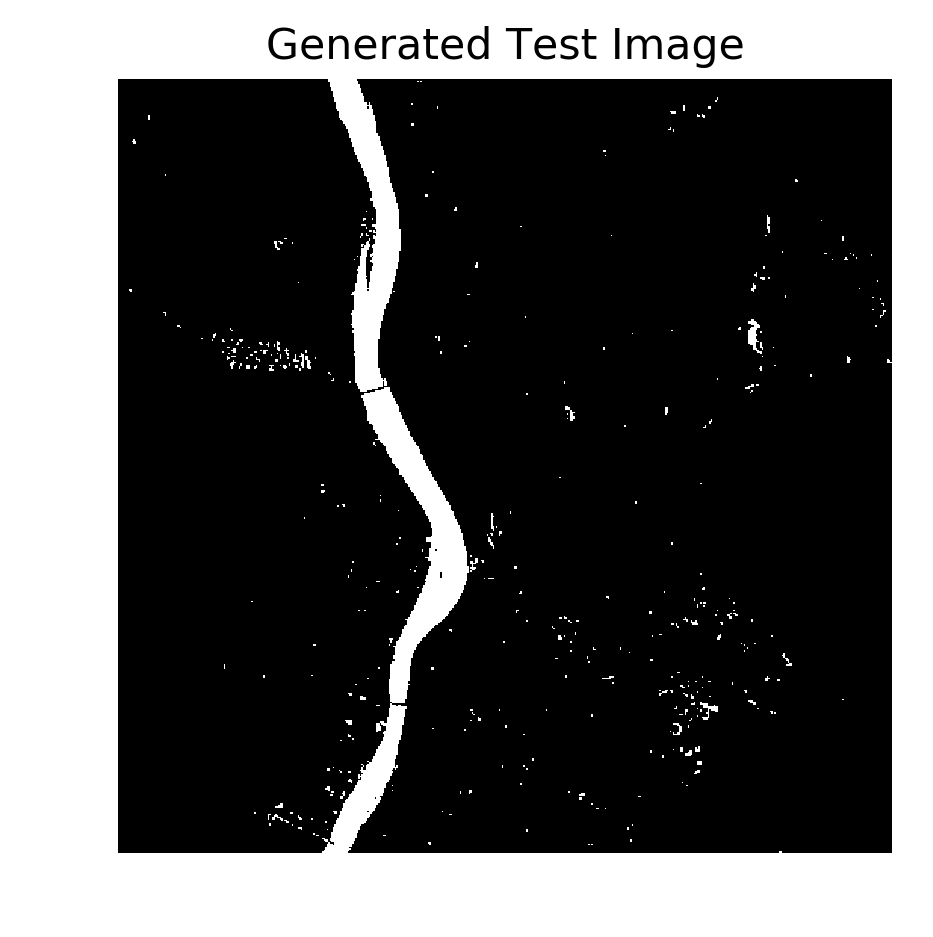

In [25]:
plt.figure(dpi=256)
plt.title("Generated Test Image")
plt.imshow(test_output,plt.cm.gray)
plt.axis("off")
plt.show()
pca_string="PCA"
mpimg.imsave ("Segmented"+\
            #Uncomment below line it if PCA is required
           #"PCA" +\
           ".png",test_output,cmap=plt.cm.gray)

# Further Processing can be done to reduce the error

<h2><font color="DarkMagenta">Using same Training points, segmented image for k-NN</font></h2> 

In [26]:
test_input=np.concatenate((\
                            band1_img_norm_avg.flatten().reshape(-1,1),\
                            band2_img_norm_avg.flatten().reshape(-1,1),\
                            band3_img_norm_avg.flatten().reshape(-1,1),\
                            band4_img_norm_avg.flatten().reshape(-1,1),\
                          ),axis=1)

#Uncomment below line if PCA is required 
#test_input=pca.transform(test_input) #Uncomment for PCA 

In [27]:
test_input.shape

(262144, 4)

In [28]:
knn = KNeighborsClassifier(n_neighbors=7) 
# You can change and test for different values of neighbors
# Fit the model on the training data.
knn.fit(train_features[:,0:train_features.shape[1]-1],train_label )
# Make point predictions on the test set using the fit model.
predictions = knn.predict(test_input)

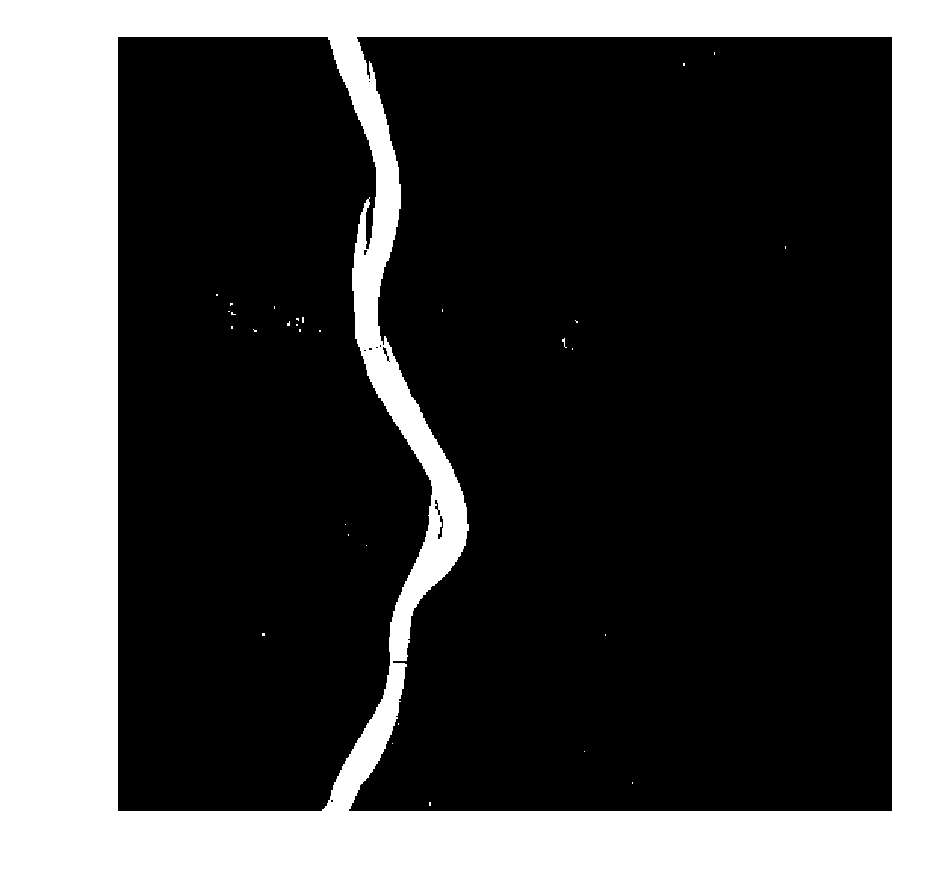

In [29]:
test_output_knn=predictions.reshape(band1_img_norm_avg.shape)
plt.figure(dpi=256)
plt.imshow(test_output_knn,plt.cm.gray)
plt.axis("off")
plt.show()